# Vision Generative Model - Diffusion

## Table of Contents

1. [Load Dataset](#1-load-dataset)

2. [Baseline Model](#2-baseline-model)

3. [Optimized Model](#3-optimized-model)

4. [Tuned Hyperparameters Model](#4-tuned-hyperparameters-model)

5. [Final Evaluation](#5-final-evaluation)

---

## 1. Load Dataset

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
from torch.optim import Adam
from torchvision import transforms
import matplotlib.pyplot as plt
from IPython.display import Image
from torchvision import datasets
from torchvision.datasets import ImageFolder
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
from pathlib import Path
from einops.layers.torch import Rearrange
import math

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}") 

Using device: cpu


In [2]:
# Function to load custom dataset from folder structure
def load_custom_dataset(data_transform):
    dataset_path = Path('Dataset')
    return ImageFolder(root=str(dataset_path), transform=data_transform)

# Define data transformations for the diffusion model
def load_transformed_dataset():
    # Convert to grayscale, normalize to [0,1], then scale to [-1,1] for diffusion model
    data_transforms = [
        transforms.Grayscale(num_output_channels=1),
        transforms.ToTensor(),  # [0,1] range
        transforms.Lambda(lambda t: (t * 2) - 1)  # [-1,1] range for diffusion
    ]
    
    data_transform = transforms.Compose(data_transforms)
    dataset = load_custom_dataset(data_transform)
    return dataset

# Load the dataset
data = load_transformed_dataset()
print(f"Dataset loaded successfully!")
print(f"Total samples: {len(data)}")
print(f"Number of classes: {len(data.classes)}")
print(f"Class names: {data.classes}")
NUM_CLASSES = len(data.classes)

Dataset loaded successfully!
Total samples: 14326
Number of classes: 10
Class names: ['A', 'C', 'D', 'E', 'I', 'M', 'S', 'T', 'U', 'Y']


In [3]:
# Create dataloader with batch size 128
BATCH_SIZE = 128
dataloader = DataLoader(data, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)

print(f"DataLoader created with batch_size={BATCH_SIZE}")
print(f"Number of batches: {len(dataloader)}")

DataLoader created with batch_size=128
Number of batches: 111


Batch images shape: torch.Size([128, 1, 28, 28])
Batch labels shape: torch.Size([128])


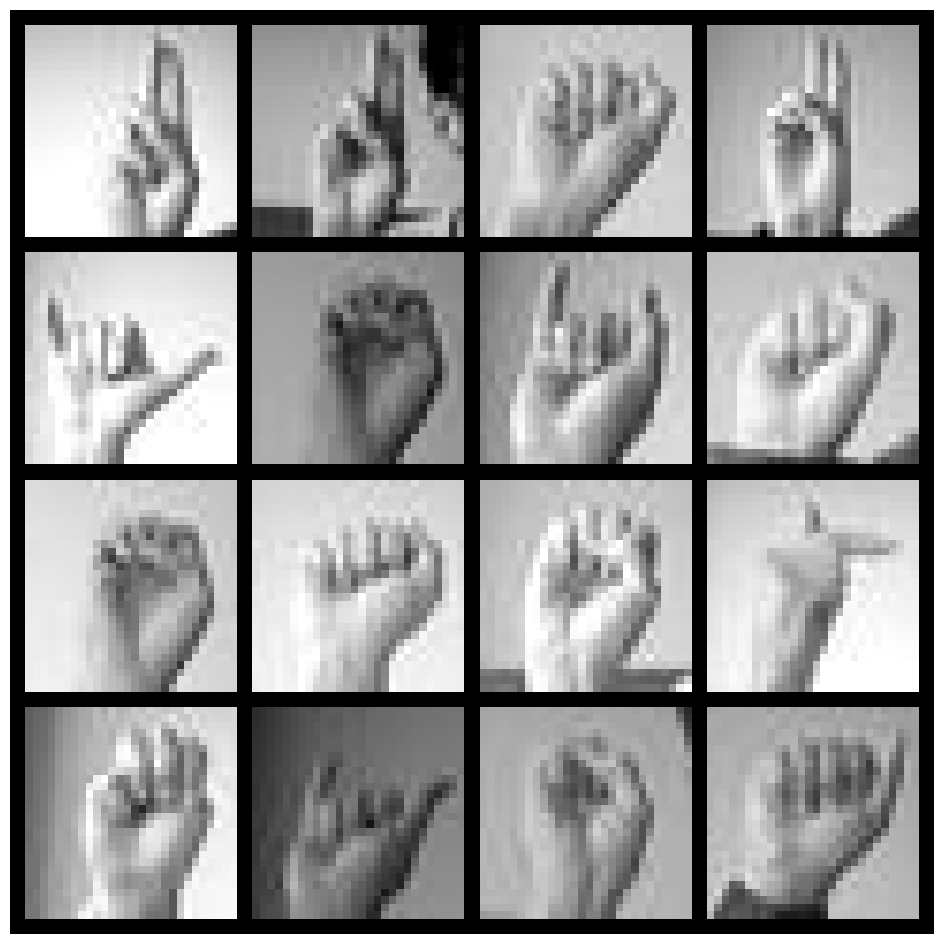

In [4]:
# Visualize sample batch from dataloader
images, labels = next(iter(dataloader))

print(f"Batch images shape: {images.shape}")
print(f"Batch labels shape: {labels.shape}")

# Display first 16 images in a grid
grid = make_grid(images[:16], nrow=4, normalize=True, padding=2)
plt.figure(figsize=(12, 12))
plt.imshow(grid.permute(1, 2, 0))
plt.axis('off')
plt.show()

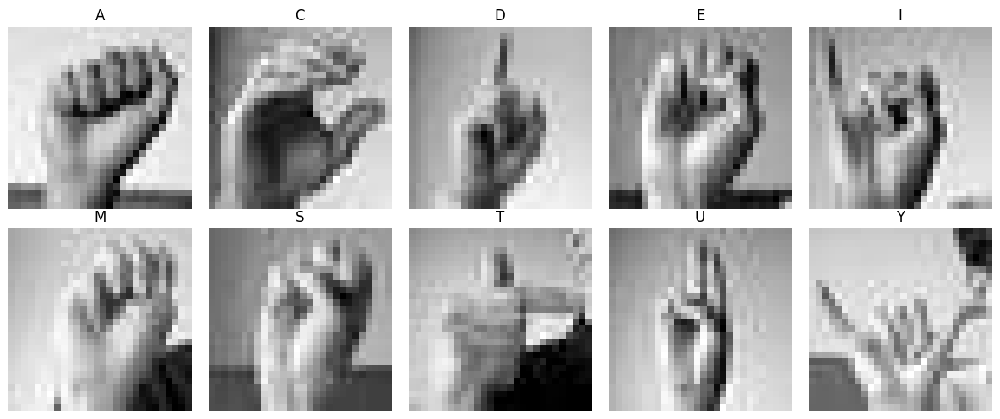

In [5]:
# Display one sample from each class
# Convert from [-1,1] to [0,1] for display
fig, axes = plt.subplots(2, 5, figsize=(12, 5))
for idx, class_name in enumerate(data.classes):
    # Find first image of this class
    for i in range(len(data)):
        if data[i][1] == idx:
            img, _ = data[i]
            row, col = idx // 5, idx % 5
            img_display = (img + 1) / 2  # Convert to [0,1]
            img_display = torch.clamp(img_display, 0, 1)
            if img.shape[0] == 3:
                axes[row, col].imshow(img_display.permute(1, 2, 0))
            else:
                axes[row, col].imshow(img_display.squeeze(), cmap='gray')
            axes[row, col].set_title(class_name)
            axes[row, col].axis('off')
            break
plt.tight_layout()
plt.show()

## 2. Baseline Model

I built a baseline conditional diffusion model using standard components as my starting point. This model uses Batch Normalization, ReLU activation, and standard MaxPool operations.

### 2.1 Forward Diffusion Setup

I set up the variance schedule that controls how much noise is added at each timestep. This determines the forward diffusion process parameters.

In [6]:
# Set total number of diffusion timesteps (T)
# More timesteps = better quality but slower generation
nrows = 15
ncols = 20
T = nrows * ncols  # Total timesteps = 300

# Define beta schedule - controls noise variance at each timestep
# Linearly increases from small to large noise values
B_start = 0.0001  # Small initial noise
B_end = 0.02      # Larger final noise
B = torch.linspace(B_start, B_end, T).to(device)

# Calculate alpha and alpha_bar from beta schedule
# These control how much original image vs noise is present
a = 1. - B
a_bar = torch.cumprod(a, dim=0)  # Cumulative product
sqrt_a_bar = torch.sqrt(a_bar)  # For forward diffusion mean
sqrt_one_minus_a_bar = torch.sqrt(1 - a_bar)  # For forward diffusion std

# Variables for reverse diffusion (image generation)
sqrt_a_inv = torch.sqrt(1 / a)  # For denoising
pred_noise_coeff = (1 - a) / torch.sqrt(1 - a_bar)  # For noise removal

print(f"T (total timesteps): {T}")
print(f"Beta schedule shape: {B.shape}")
print(f"Beta range: [{B[0]:.6f}, {B[-1]:.6f}]")

T (total timesteps): 300
Beta schedule shape: torch.Size([300])
Beta range: [0.000100, 0.020000]


### 2.2 Forward Diffusion Function

I implemented the forward diffusion function that adds noise to images at each timestep, gradually converting clean images to noise.

In [7]:
# Forward diffusion: adds noise to image at timestep t
def q(x_0, t):
    """
    Adds Gaussian noise to clean image based on timestep t.
    Returns noisy image and the noise that was added.
    """
    t = t.int()
    noise = torch.randn_like(x_0)  # Random Gaussian noise
    sqrt_a_bar_t = sqrt_a_bar[t, None, None, None]  # Original image weight
    sqrt_one_minus_a_bar_t = sqrt_one_minus_a_bar[t, None, None, None]  # Noise weight

    # Combine image and noise - more noise at later timesteps
    x_t = sqrt_a_bar_t * x_0 + sqrt_one_minus_a_bar_t * noise
    return x_t, noise

### 2.3 UNet Architecture

I built a UNet model that predicts noise in images. The model uses time embeddings to know which timestep it's at, and class embeddings to generate specific ASL letters.

In [8]:
# Image parameters
IMG_SIZE = 28
IMG_CH = 1  # Grayscale images

# Time embedding block: converts scalar timestep to richer representation
class EmbedBlock(nn.Module):
    """
    Embeds timestep into higher-dimensional space for better model understanding.
    """
    def __init__(self, input_dim, emb_dim):
        super().__init__()
        self.input_dim = input_dim
        self.model = nn.Sequential(
            nn.Linear(input_dim, emb_dim),
            nn.ReLU(),
            nn.Linear(emb_dim, emb_dim),
            nn.Unflatten(1, (emb_dim, 1, 1))
        )

    def forward(self, input):
        input = input.view(-1, self.input_dim)
        return self.model(input)

In [9]:
# Downsampling block: reduces image size, increases channels
class DownBlock(nn.Module):
    """
    Encoder block with convolutions and max pooling to extract features.
    """
    def __init__(self, in_chs, out_chs):
        kernel_size = 3
        stride = 1
        padding = 1

        super().__init__()
        self.model = nn.Sequential(
            nn.Conv2d(in_chs, out_chs, kernel_size, stride, padding),
            nn.BatchNorm2d(out_chs),
            nn.ReLU(),
            nn.Conv2d(out_chs, out_chs, kernel_size, stride, padding),
            nn.BatchNorm2d(out_chs),
            nn.ReLU(),
            nn.MaxPool2d(2)
        )

    def forward(self, x):
        return self.model(x)

In [10]:
# Upsampling block: increases image size, decreases channels
class UpBlock(nn.Module):
    """
    Decoder block using transposed convolutions with skip connections.
    """
    def __init__(self, in_chs, out_chs):
        kernel_size = 3
        stride = 1
        padding = 1
        strideT = 2
        out_paddingT = 1

        super().__init__()
        self.model = nn.Sequential(
            nn.ConvTranspose2d(2 * in_chs, out_chs, kernel_size, strideT, padding, out_paddingT),
            nn.BatchNorm2d(out_chs),
            nn.ReLU(),
            nn.Conv2d(out_chs, out_chs, kernel_size, stride, padding),
            nn.BatchNorm2d(out_chs),
            nn.ReLU()
        )
    
    def forward(self, x, skip):
        x = torch.cat((x, skip), 1)
        x = self.model(x)
        return x

In [11]:
# UNet: predicts noise in noisy image at given timestep
class UNet(nn.Module):
    """
    Encoder-decoder UNet with skip connections and conditional generation.
    Takes noisy image and timestep, predicts noise. Can generate specific classes.
    """
    def __init__(self, num_classes=NUM_CLASSES):
        super().__init__()
        img_chs = IMG_CH
        down_chs = (16, 32, 64)
        up_chs = down_chs[::-1]  # Reverse of the down channels
        latent_image_size = IMG_SIZE // 4  # 2 ** (len(down_chs) - 1)
        t_dim = 1

        # Initial downsampling block
        self.down0 = nn.Sequential(
            nn.Conv2d(img_chs, down_chs[0], 3, padding=1),
            nn.BatchNorm2d(down_chs[0]),
            nn.ReLU()
        )

        # Downsample
        self.down1 = DownBlock(down_chs[0], down_chs[1])
        self.down2 = DownBlock(down_chs[1], down_chs[2])
        self.to_vec = nn.Sequential(nn.Flatten(), nn.ReLU())
        
        # Embeddings
        self.dense_emb = nn.Sequential(
            nn.Linear(down_chs[2]*latent_image_size**2, down_chs[1]),
            nn.ReLU(),
            nn.Linear(down_chs[1], down_chs[1]),
            nn.ReLU(),
            nn.Linear(down_chs[1], down_chs[2]*latent_image_size**2),
            nn.ReLU()
        )
        
        # Time embeddings for timestep information
        self.temb_1 = EmbedBlock(t_dim, up_chs[0])
        self.temb_2 = EmbedBlock(t_dim, up_chs[1])
        
        # Class embedding for conditional generation (specific ASL letters)
        self.class_emb = nn.Embedding(num_classes, up_chs[0])
        
        # Upsample
        self.up0 = nn.Sequential(
            nn.Unflatten(1, (up_chs[0], latent_image_size, latent_image_size)),
            nn.Conv2d(up_chs[0], up_chs[0], 3, padding=1),
            nn.BatchNorm2d(up_chs[0]),
            nn.ReLU(),
        )
        self.up1 = UpBlock(up_chs[0], up_chs[1])
        self.up2 = UpBlock(up_chs[1], up_chs[2])

        # Match output channels
        self.out = nn.Sequential(
            nn.Conv2d(up_chs[-1], up_chs[-1], 3, 1, 1),
            nn.BatchNorm2d(up_chs[-1]),
            nn.ReLU(),
            nn.Conv2d(up_chs[-1], img_chs, 3, 1, 1)
        )

    def forward(self, x, t, class_labels=None):
        down0 = self.down0(x)
        down1 = self.down1(down0)
        down2 = self.down2(down1)
        latent_vec = self.to_vec(down2)
        
        t = t.float() / T  # Convert from [0, T] to [0, 1]
        latent_vec = self.dense_emb(latent_vec)
        temb_1 = self.temb_1(t)
        temb_2 = self.temb_2(t)
        
        # Add class conditioning to time embeddings
        if class_labels is not None:
            class_emb = self.class_emb(class_labels)
            class_emb = class_emb.view(-1, class_emb.shape[1], 1, 1)  # Reshape for broadcasting
            temb_1 = temb_1 + class_emb  # Add class embedding to time embedding

        up0 = self.up0(latent_vec)
        up1 = self.up1(up0+temb_1, down2)
        up2 = self.up2(up1+temb_2, down1)
        return self.out(up2)

In [12]:
# Initialize baseline model
model = UNet(num_classes=NUM_CLASSES)
print("Num params: ", sum(p.numel() for p in model.parameters()))
model = model.to(device)

Num params:  378305


### 2.4 Loss Function

I use MSE loss to train the model to predict the noise that was added during forward diffusion.

In [13]:
# Loss function: MSE between predicted and actual noise
def get_loss(model, x_0, t, class_labels=None):
    """
    Computes MSE loss between model's predicted noise and actual noise.
    """
    x_noisy, noise = q(x_0, t)
    noise_pred = model(x_noisy, t, class_labels)
    return F.mse_loss(noise, noise_pred)

### 2.5 Reverse Diffusion and Sampling

I implemented reverse diffusion to generate images by removing predicted noise. This is how new images are created.

In [14]:
# Reverse diffusion: denoises image by removing predicted noise
@torch.no_grad()
def reverse_q(x_t, t, e_t):
    """
    Removes predicted noise to move from timestep t to t-1.
    At t=0, returns final clean image.
    """
    t = t.int()
    # Extract scalar timestep value
    if t.dim() == 0:
        t_val = t.item()
    else:
        t_val = t[0].item()
    
    pred_noise_coeff_t = pred_noise_coeff[t_val]
    sqrt_a_inv_t = sqrt_a_inv[t_val]
    # Compute denoised image
    u_t = sqrt_a_inv_t * (x_t - pred_noise_coeff_t * e_t)
    if t_val == 0:
        return u_t  # Final image
    else:
        # Add small amount of noise to move to previous timestep
        B_t = B[t_val - 1]
        new_noise = torch.randn_like(x_t)
        return u_t + torch.sqrt(B_t) * new_noise

In [15]:
# Helper to display tensor images: converts [-1,1] to [0,1] for display
def show_tensor_image(image):
    """
    Converts model output from [-1,1] to [0,1] for visualization.
    """
    # Convert from [-1, 1] to [0, 1]
    image = (image + 1) / 2
    # Clamp to [0, 1]
    image = torch.clamp(image, 0, 1)
    
    # Handle both single image and batch
    if image.dim() == 4:
        image = image[0]  # Take first image if batch
    
    # Convert to numpy for display
    if image.shape[0] == 3:  # RGB
        image_np = image.permute(1, 2, 0).detach().cpu().numpy()
    else:  # Grayscale
        image_np = image.squeeze().detach().cpu().numpy()
    
    if len(image_np.shape) == 2:  # Grayscale
        plt.imshow(image_np, cmap='gray')
    else:  # RGB
        plt.imshow(image_np)

In [16]:
# Generate images using reverse diffusion from random noise
@torch.no_grad()
def sample_images(model, ncols=15, class_label=None, figsize=(8,8)):
    """
    Generates image from random noise using reverse diffusion.
    Optionally generates specific class if class_label provided.
    """
    plt.figure(figsize=figsize)
    plt.axis("off")
    hidden_rows = int(T / ncols)

    # Noise to generate images from (in [-1, 1] range)
    x_t = torch.randn((1, IMG_CH, IMG_SIZE, IMG_SIZE), device=device)
    
    # Create class label tensor if provided
    class_tensor = None
    if class_label is not None:
        class_tensor = torch.tensor([class_label], device=device)

    # Go from T to 0 removing and adding noise until t = 0
    plot_number = 1
    for i in range(T-1, -1, -1):  # Go from T-1 down to 0
        t = torch.full((1,), i, device=device).float()
        e_t = model(x_t, t, class_tensor)  # Predicted noise
        x_t = reverse_q(x_t, t, e_t)
        if i % hidden_rows == 0 or i == 0:
            ax = plt.subplot(1, ncols+1, plot_number)
            ax.axis('off')
            show_tensor_image(x_t)
            plot_number += 1
            if plot_number > ncols + 1:
                break
    plt.tight_layout()
    plt.show()
    
    # Return the final generated image
    return x_t

### 2.6 Training

I trained the baseline model for 15 epochs with learning rate 0.0008 and batch size 128. The model learns to predict noise at random timesteps.

Epoch 0 | Step 000 | Loss: 1.102547


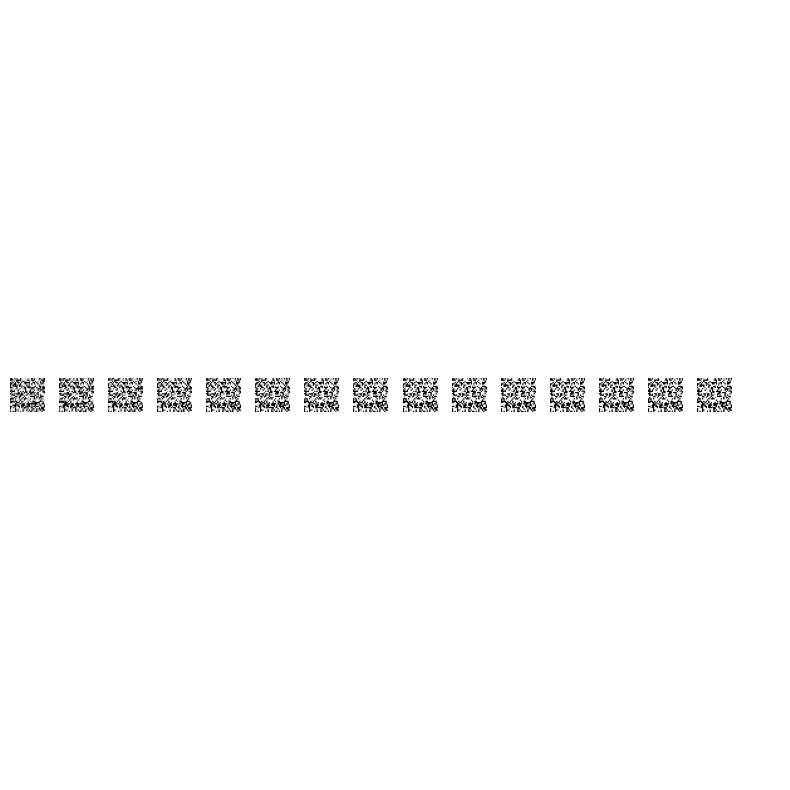

Epoch 0 | Step 100 | Loss: 0.347370


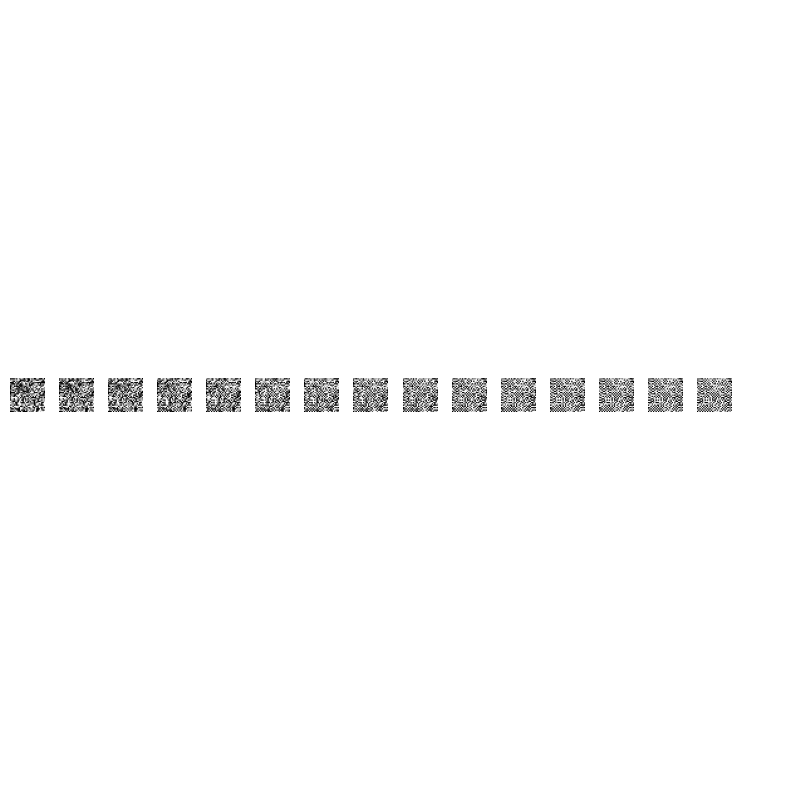

Epoch 1 | Step 000 | Loss: 0.335203


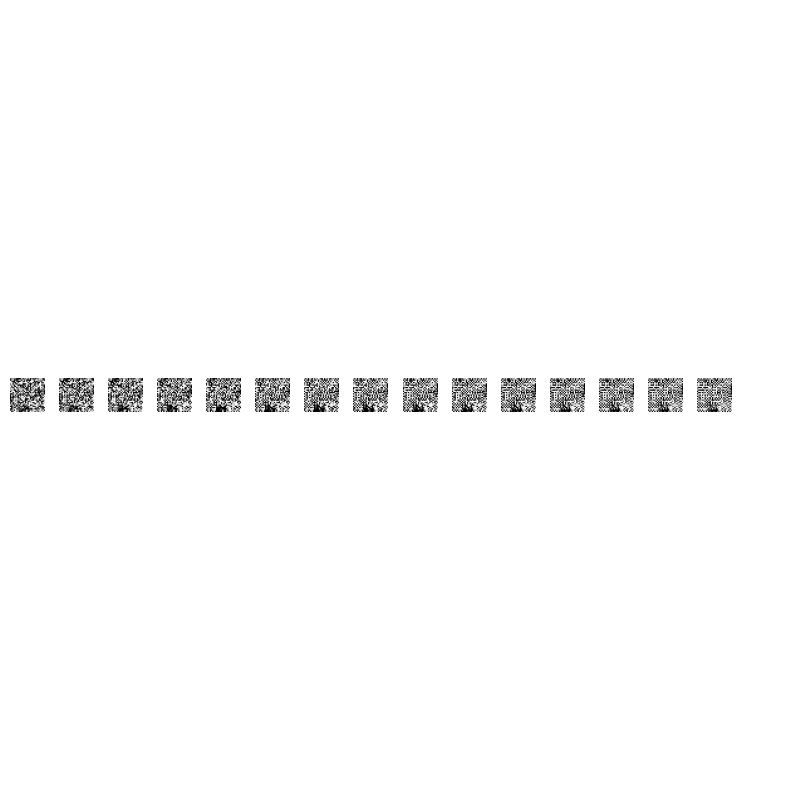

Epoch 1 | Step 100 | Loss: 0.211962


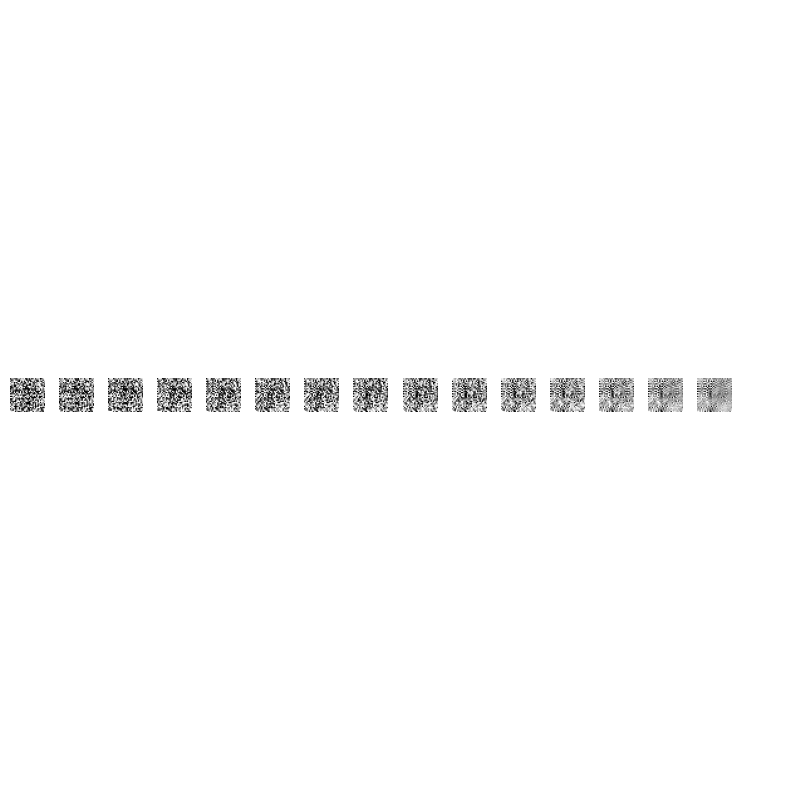

Epoch 2 | Step 000 | Loss: 0.216294


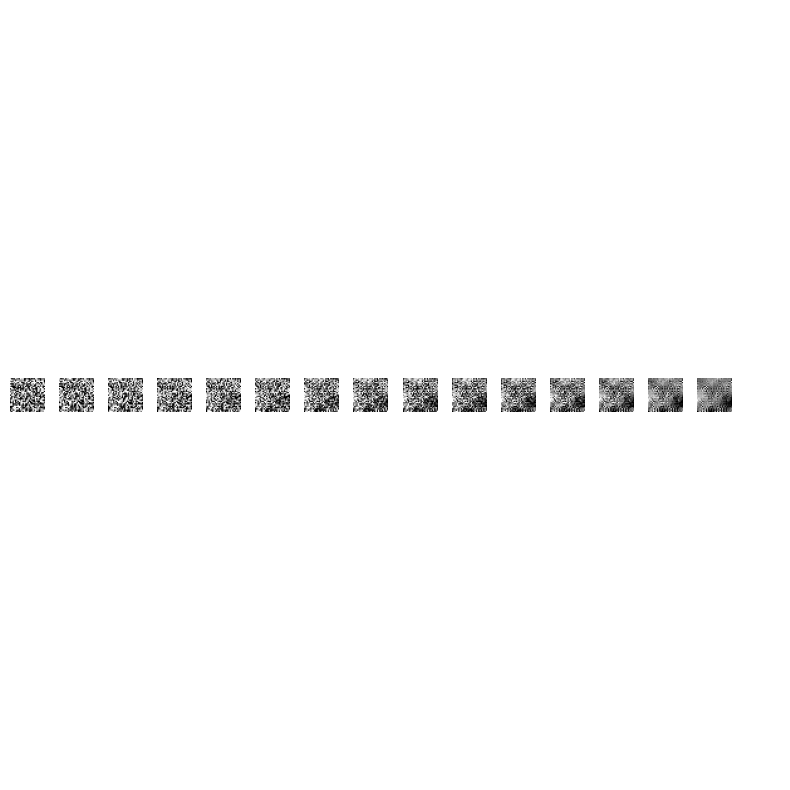

Epoch 2 | Step 100 | Loss: 0.198676


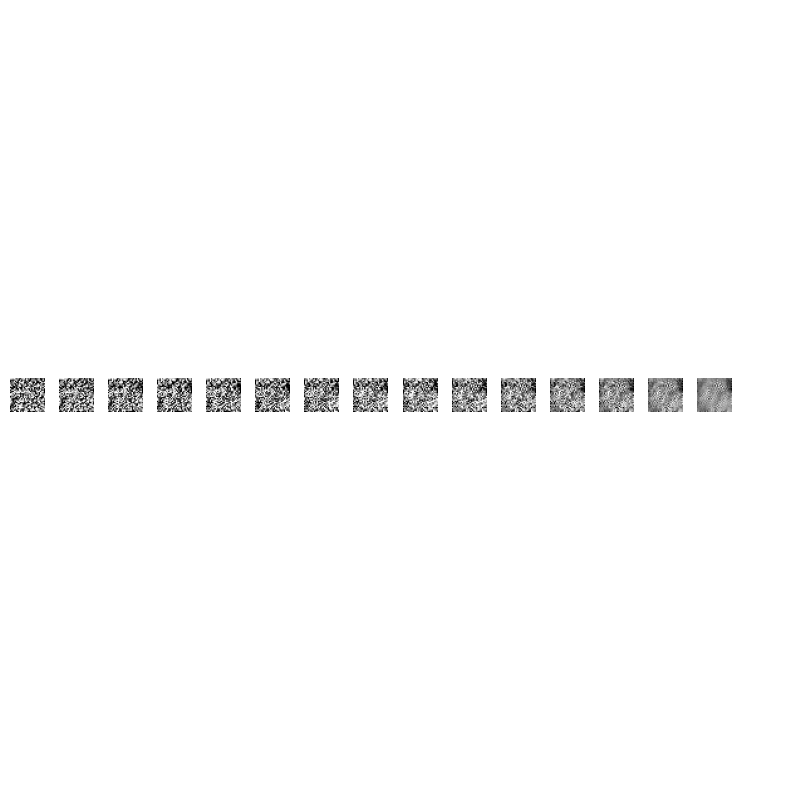

Epoch 3 | Step 000 | Loss: 0.188849


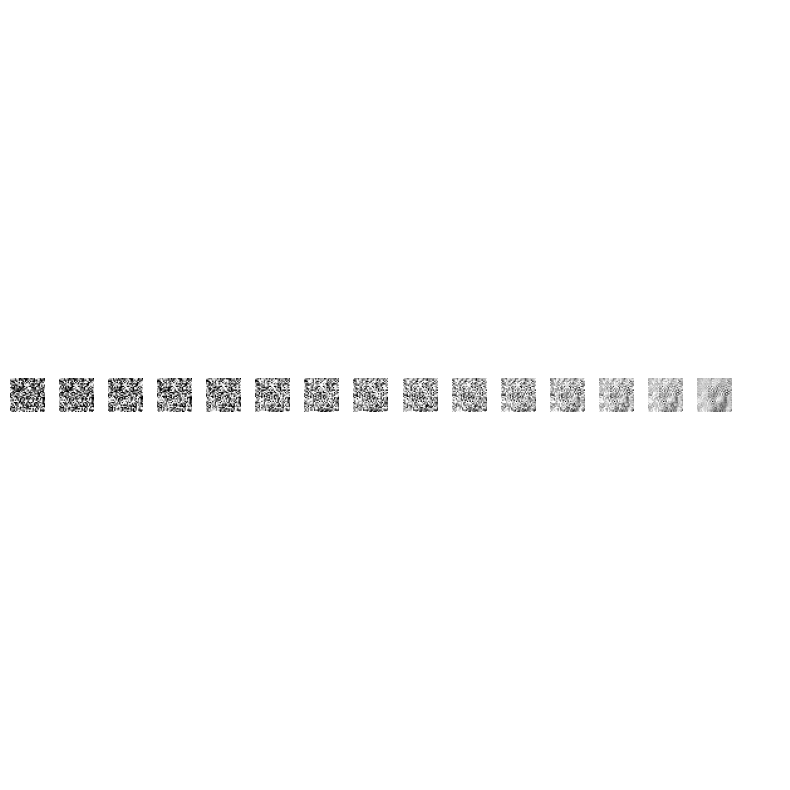

Epoch 3 | Step 100 | Loss: 0.168423


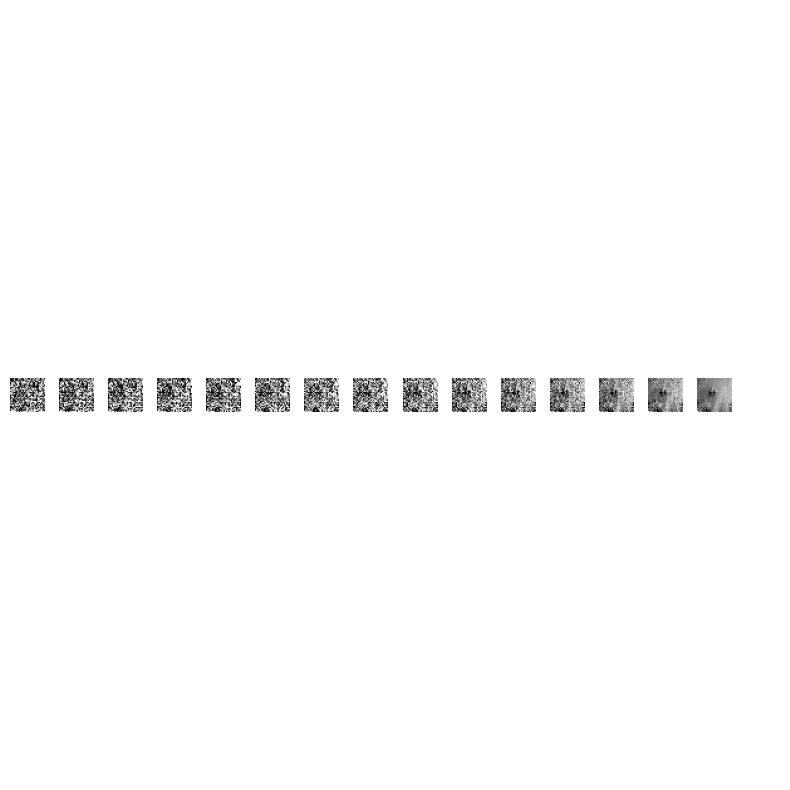

Epoch 4 | Step 000 | Loss: 0.182325


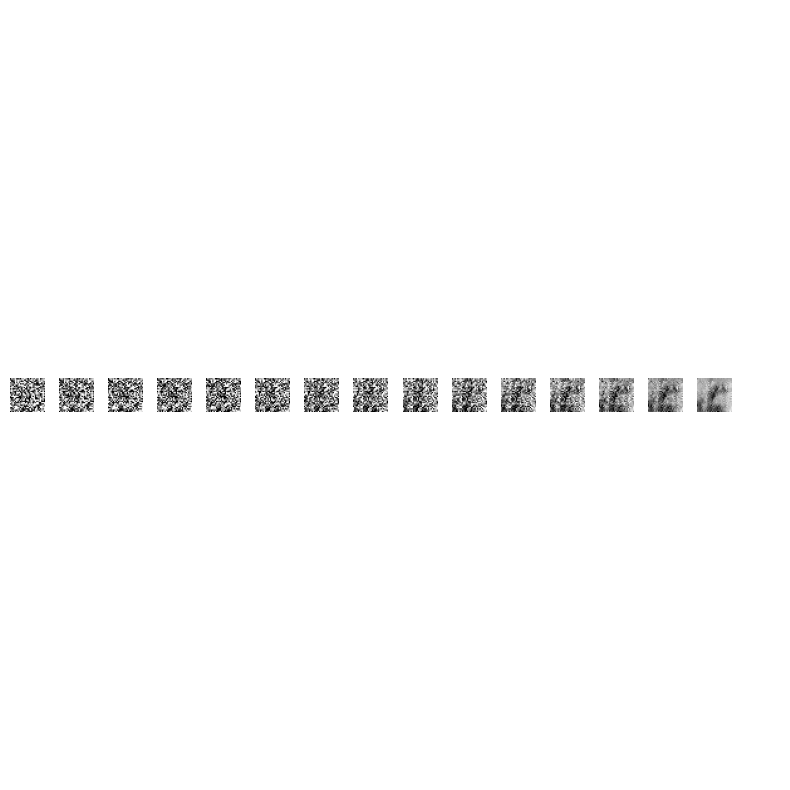

Epoch 4 | Step 100 | Loss: 0.150769


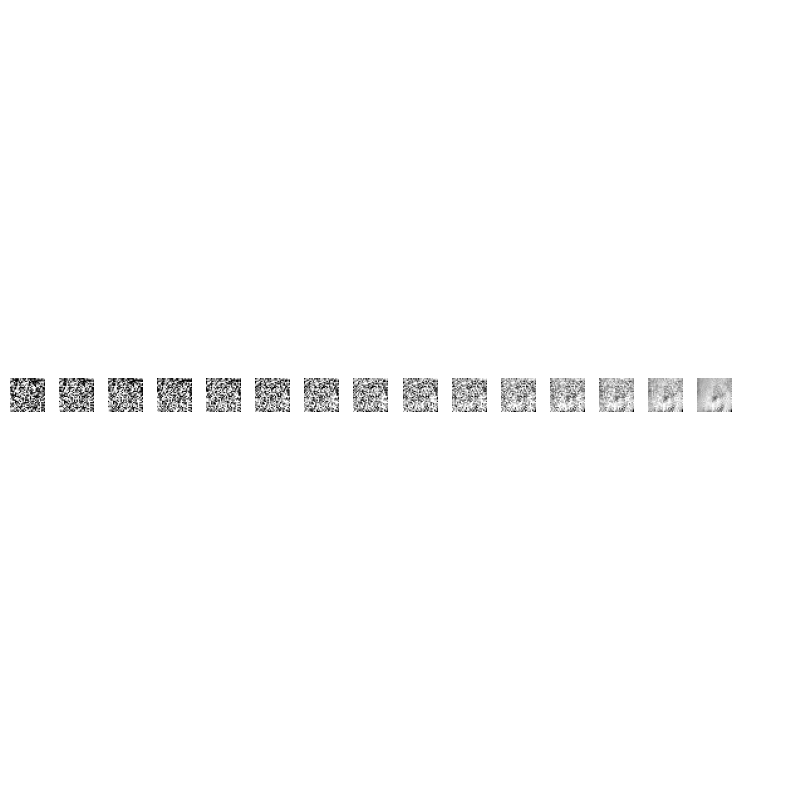

Epoch 5 | Step 000 | Loss: 0.141424


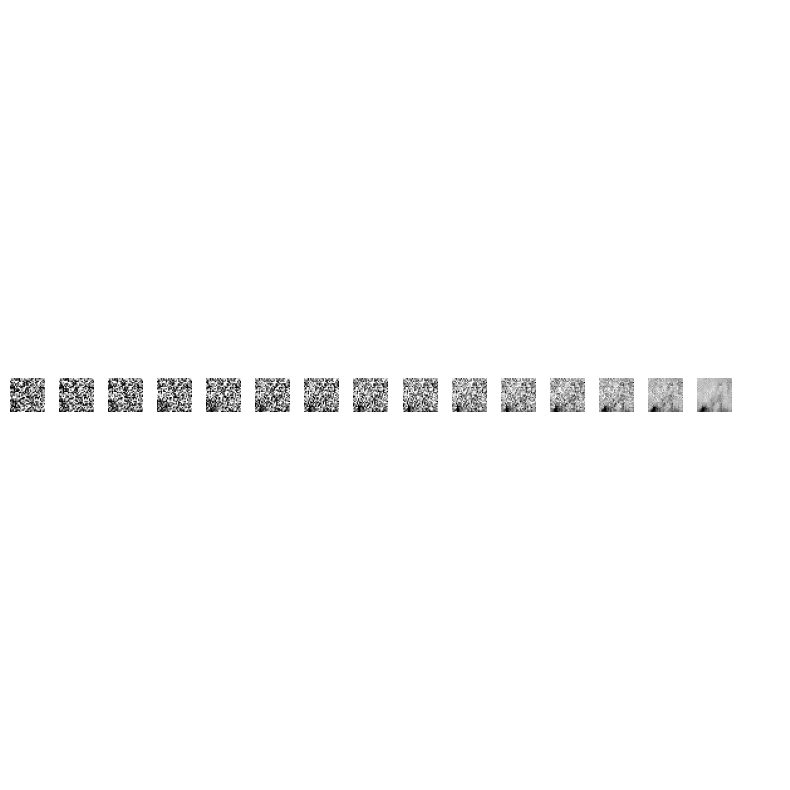

Epoch 5 | Step 100 | Loss: 0.142678


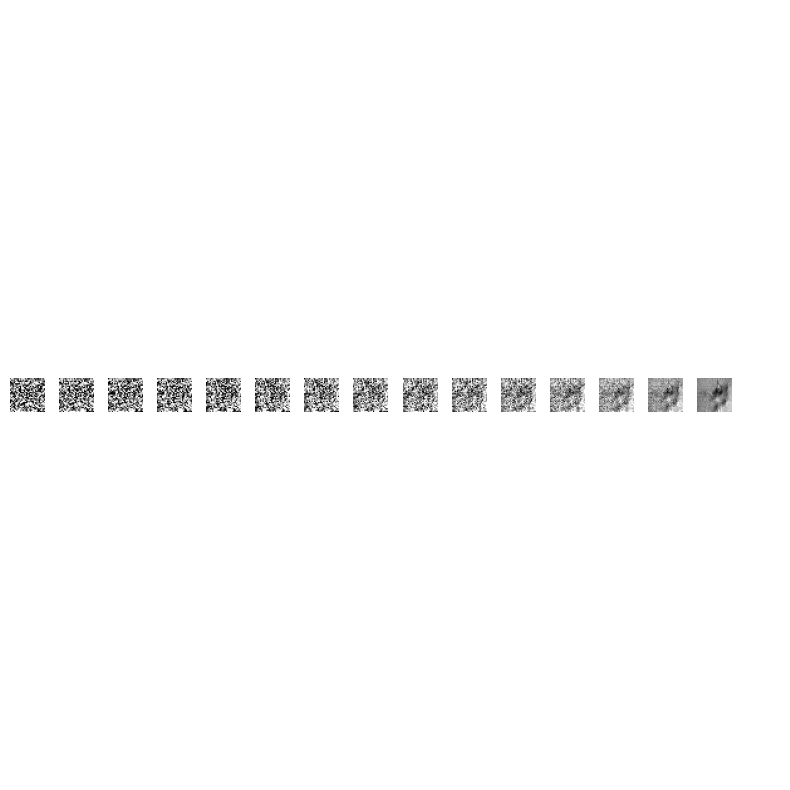

Epoch 6 | Step 000 | Loss: 0.161164


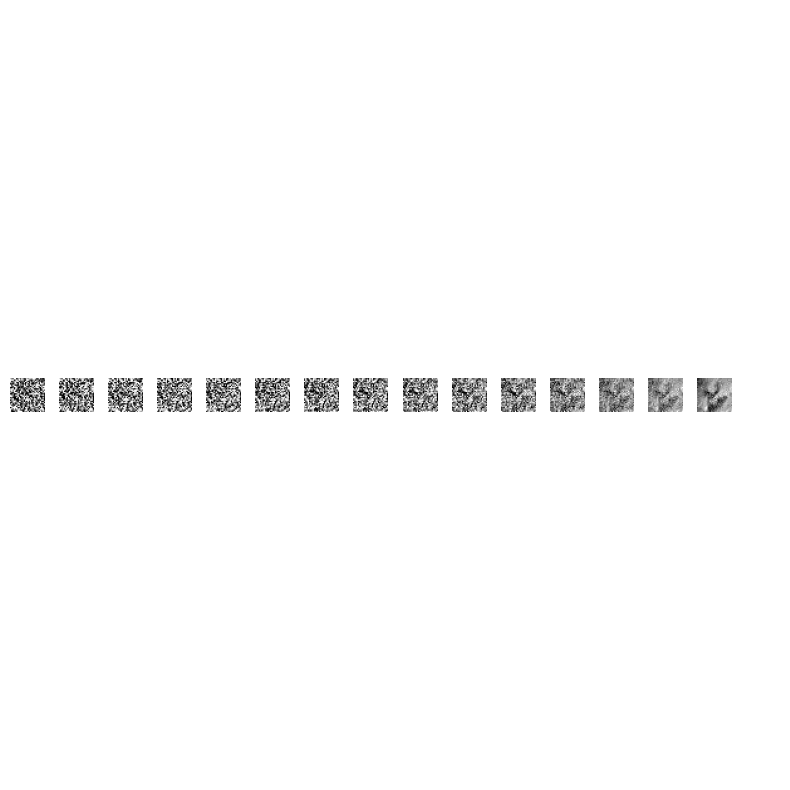

Epoch 6 | Step 100 | Loss: 0.149294


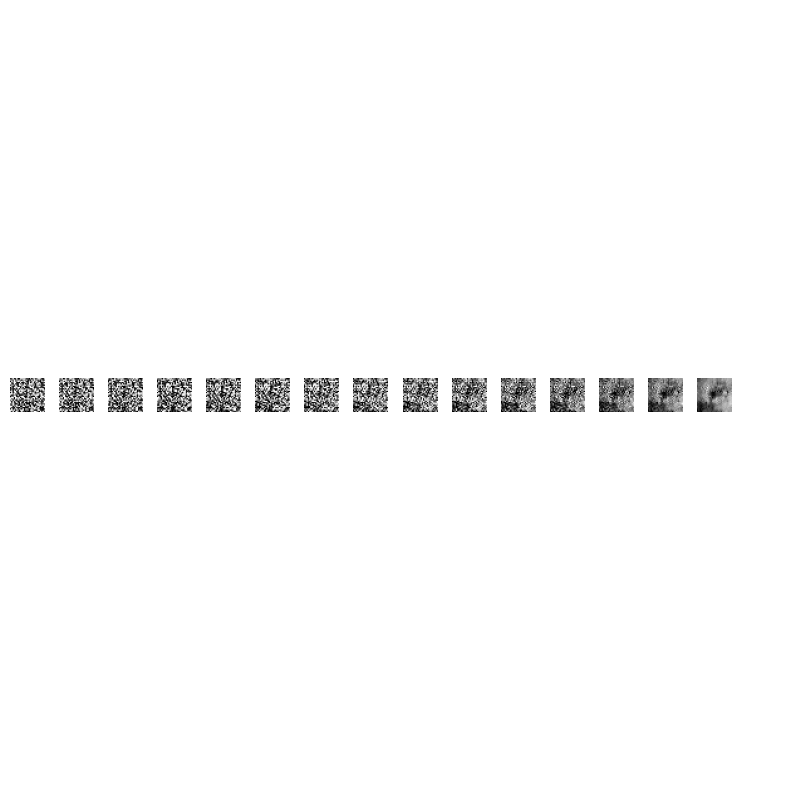

Epoch 7 | Step 000 | Loss: 0.143725


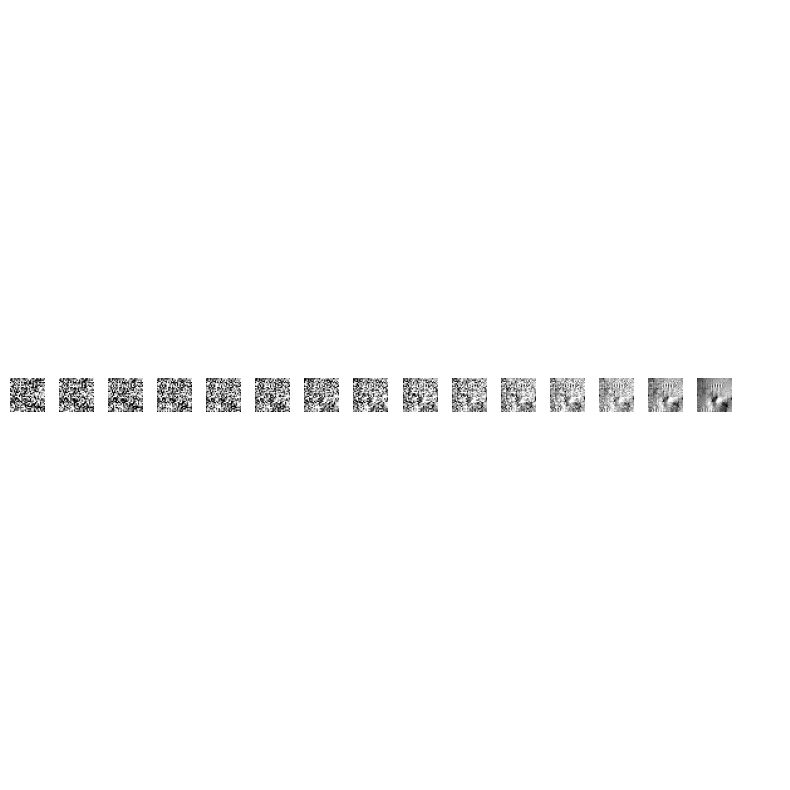

Epoch 7 | Step 100 | Loss: 0.148693


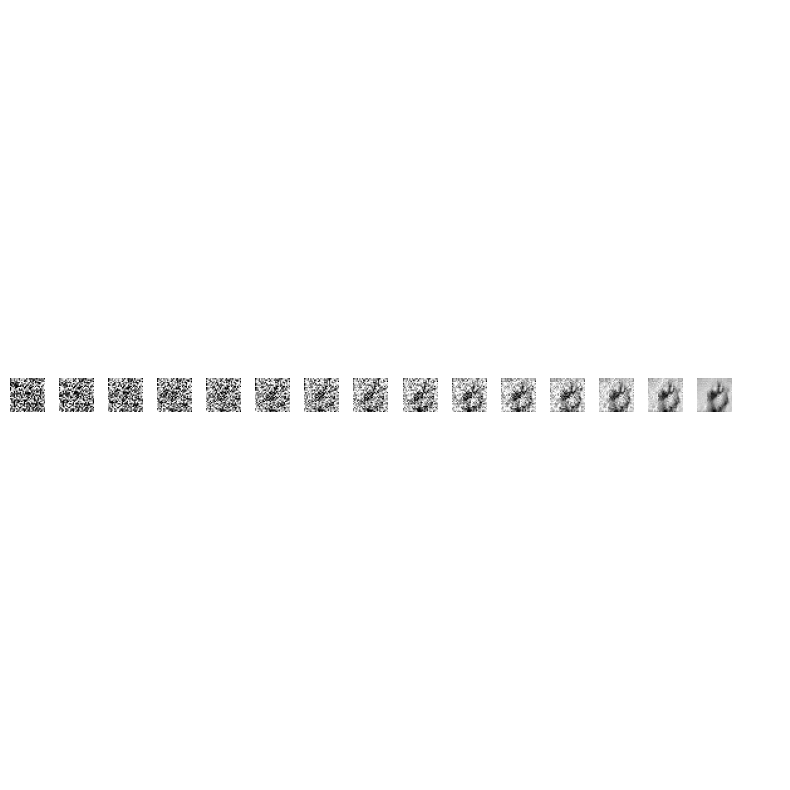

Epoch 8 | Step 000 | Loss: 0.119780


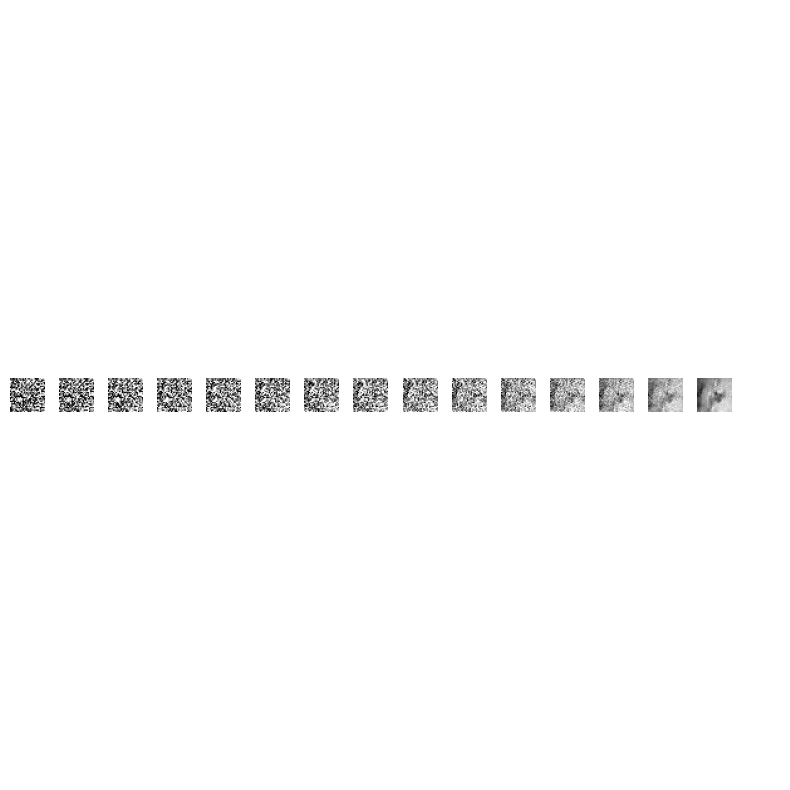

Epoch 8 | Step 100 | Loss: 0.150023


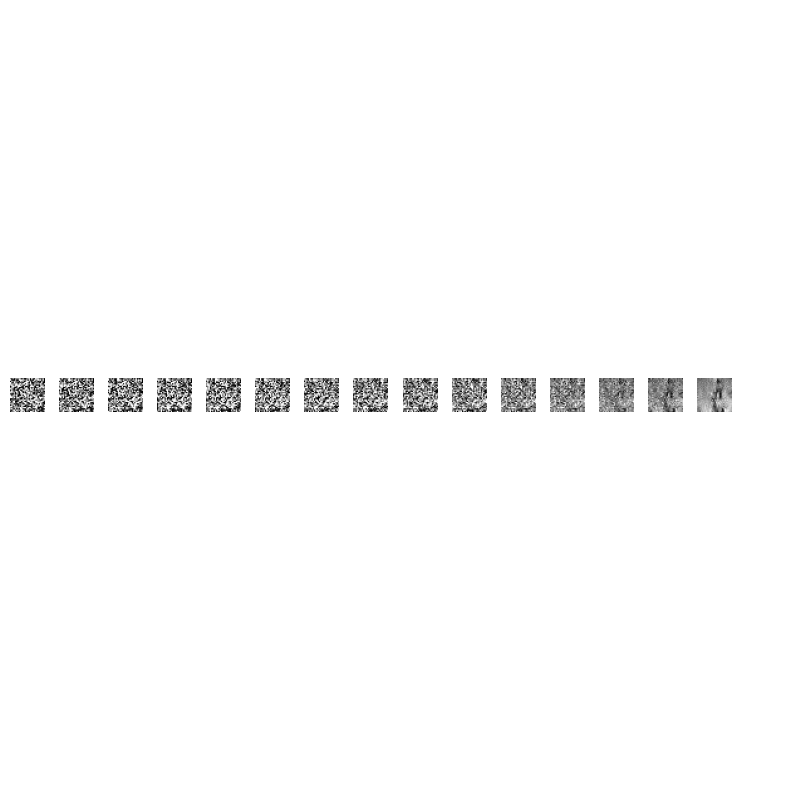

Epoch 9 | Step 000 | Loss: 0.142409


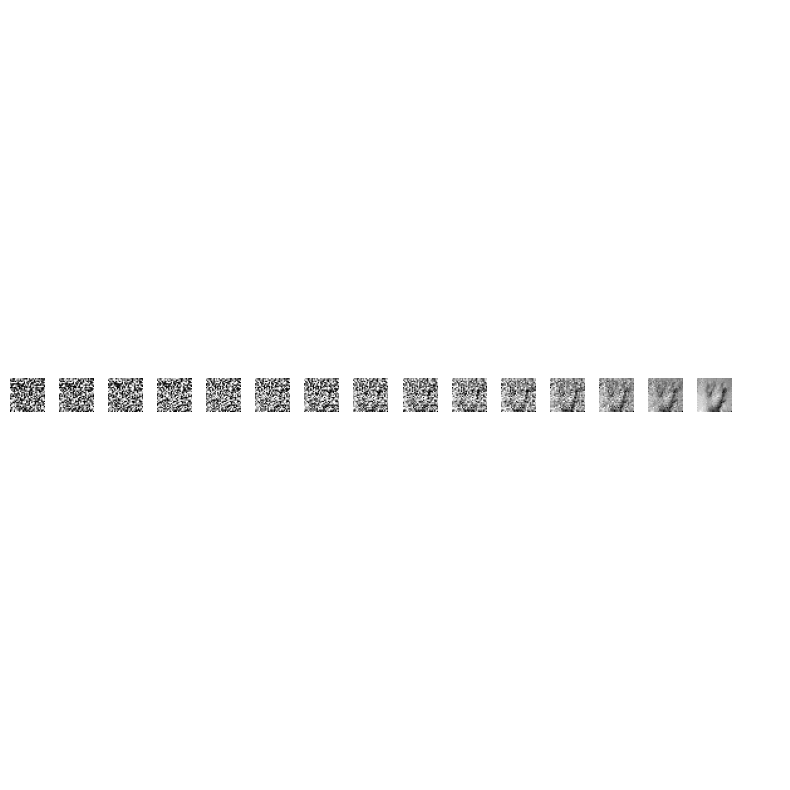

Epoch 9 | Step 100 | Loss: 0.120330


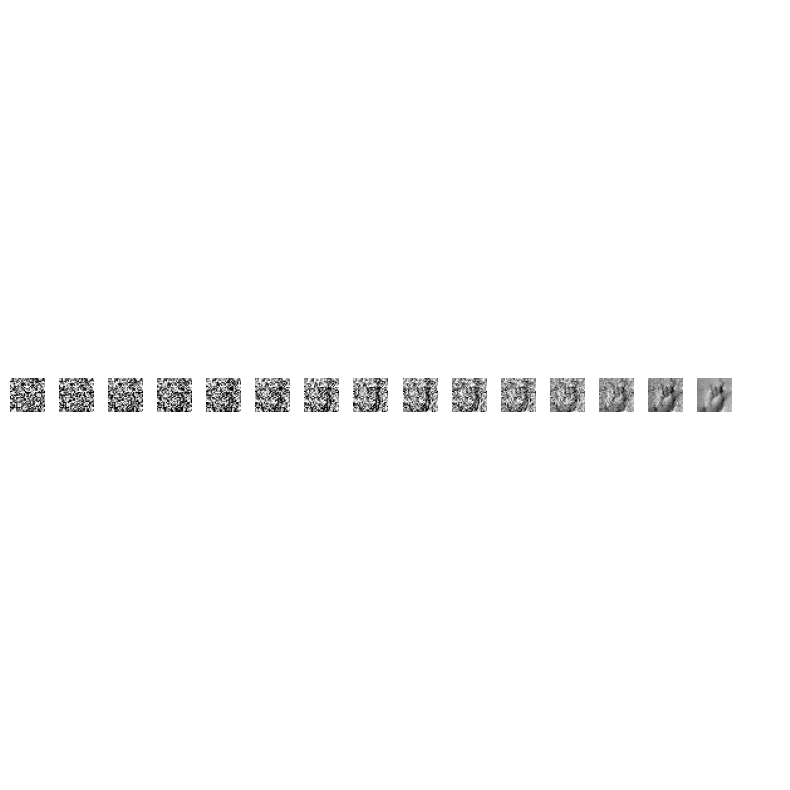

Epoch 10 | Step 000 | Loss: 0.125318


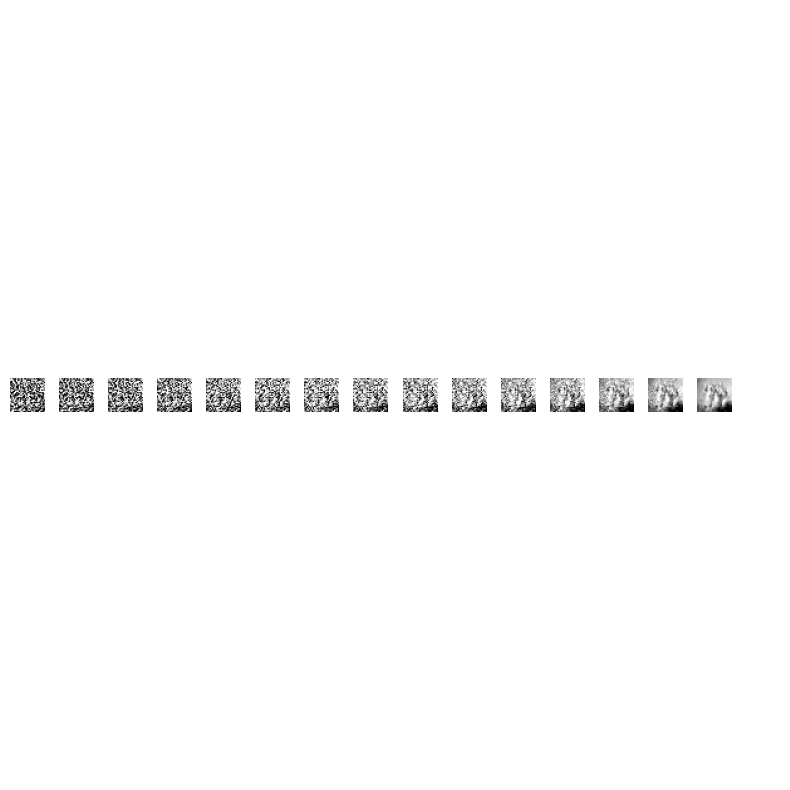

Epoch 10 | Step 100 | Loss: 0.116040


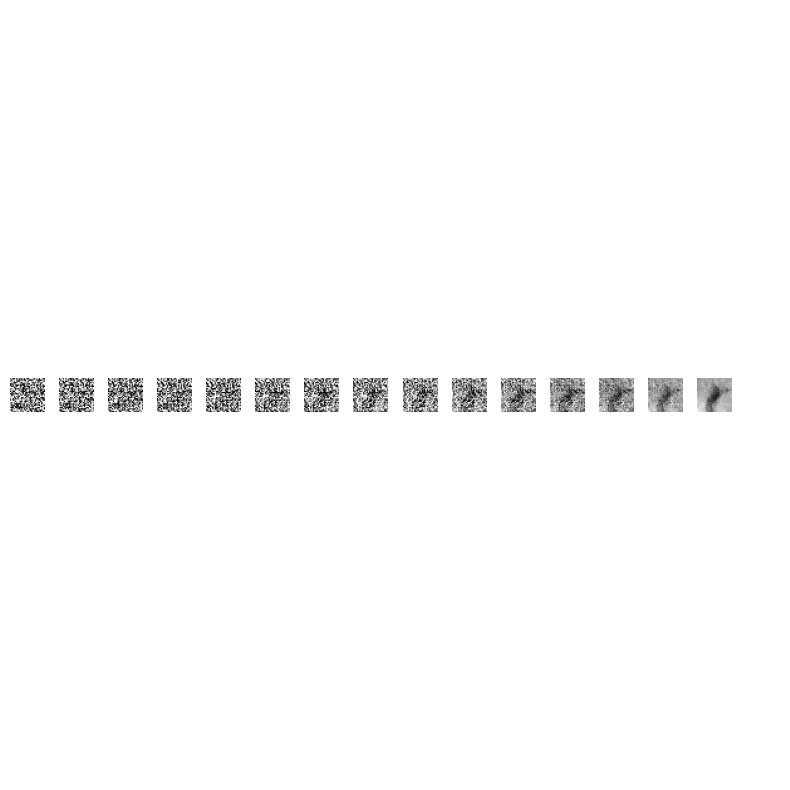

Epoch 11 | Step 000 | Loss: 0.123400


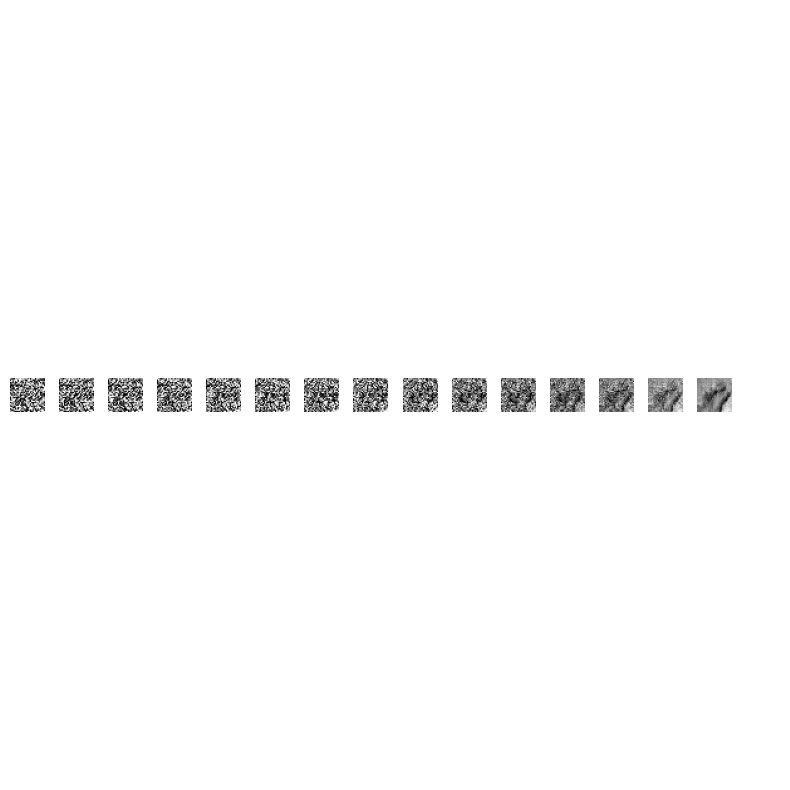

Epoch 11 | Step 100 | Loss: 0.109332


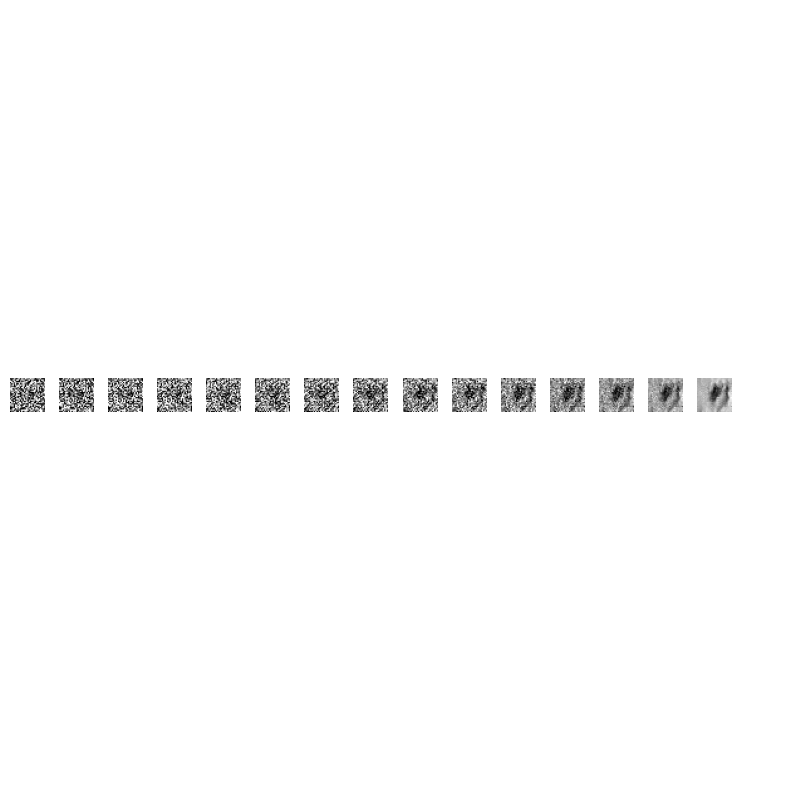

Epoch 12 | Step 000 | Loss: 0.111818


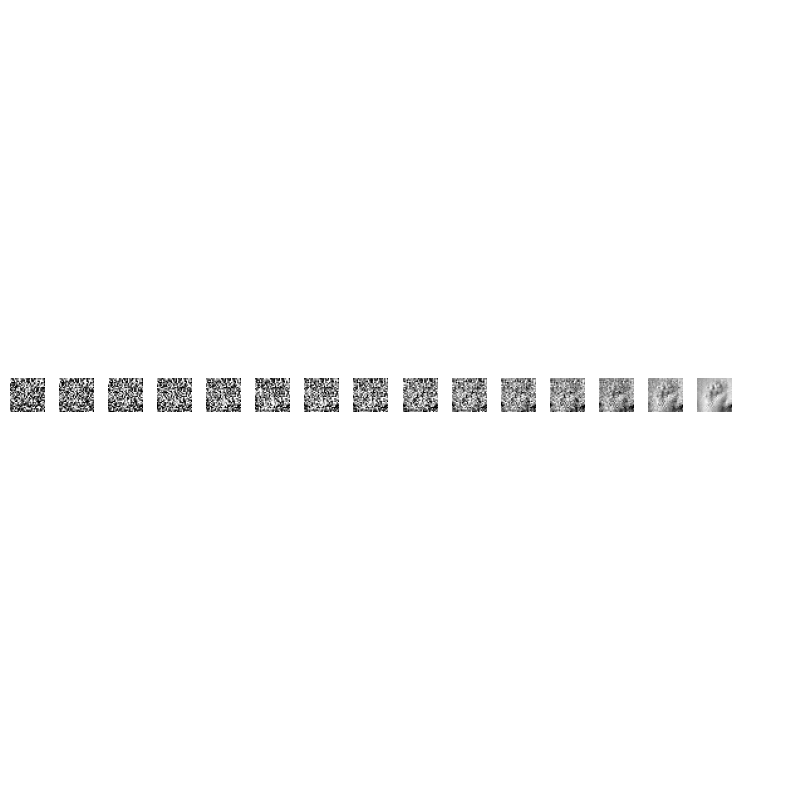

Epoch 12 | Step 100 | Loss: 0.136117


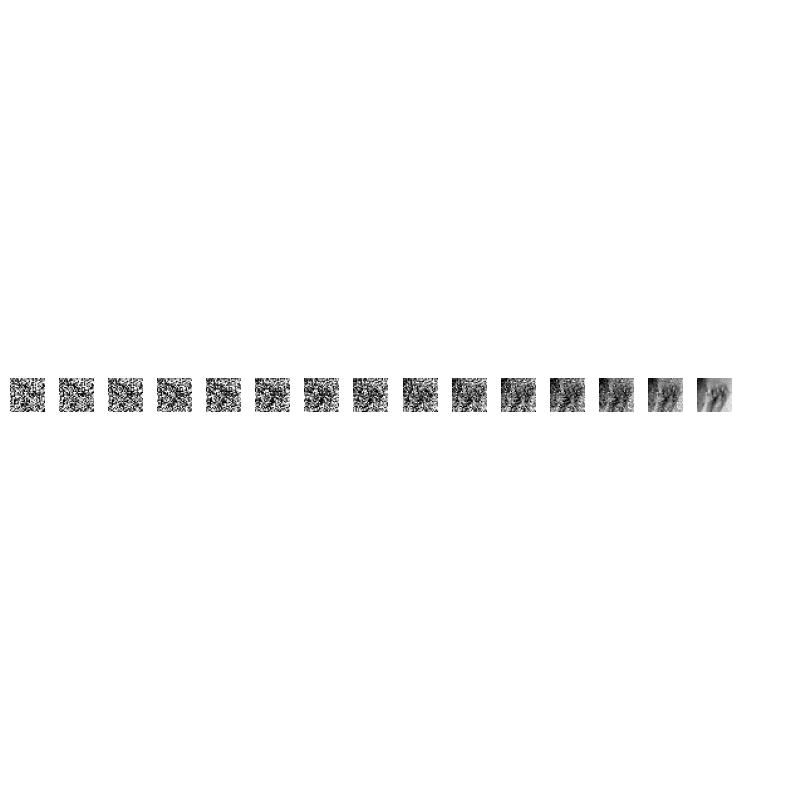

Epoch 13 | Step 000 | Loss: 0.127917


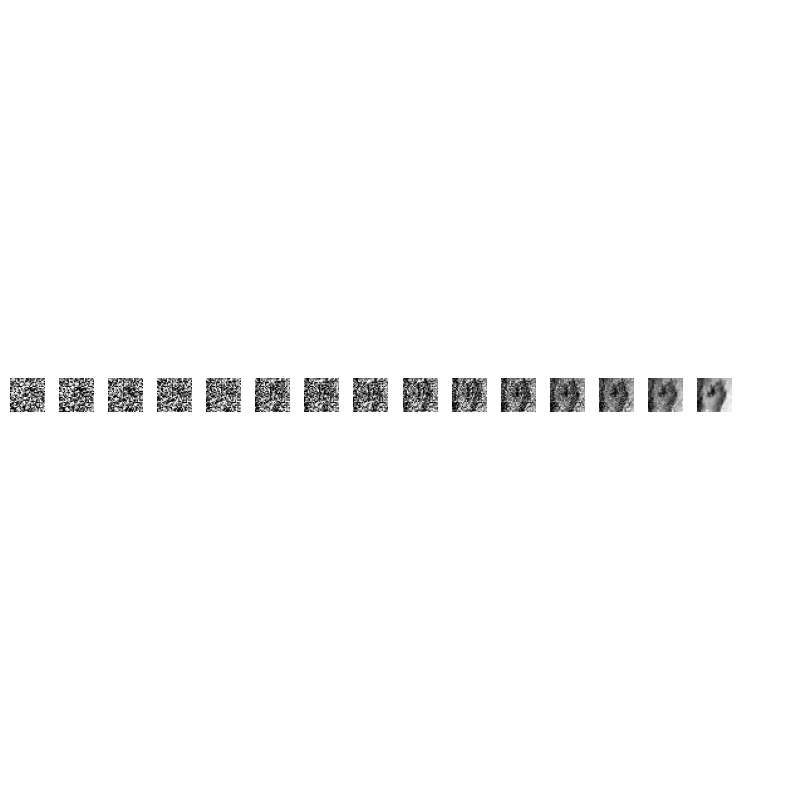

Epoch 13 | Step 100 | Loss: 0.105550


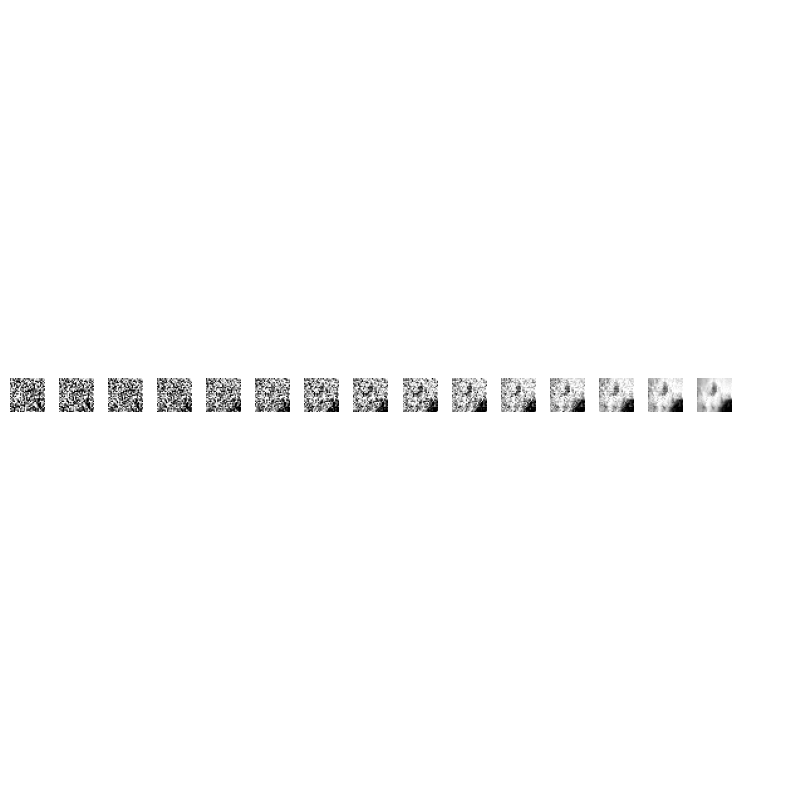

Epoch 14 | Step 000 | Loss: 0.126518


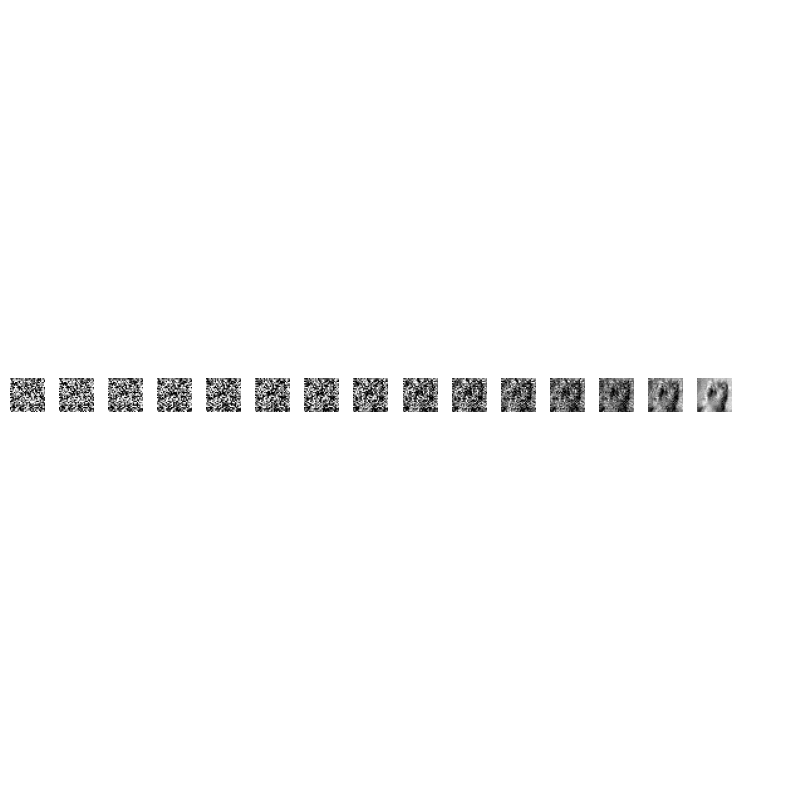

Epoch 14 | Step 100 | Loss: 0.116813


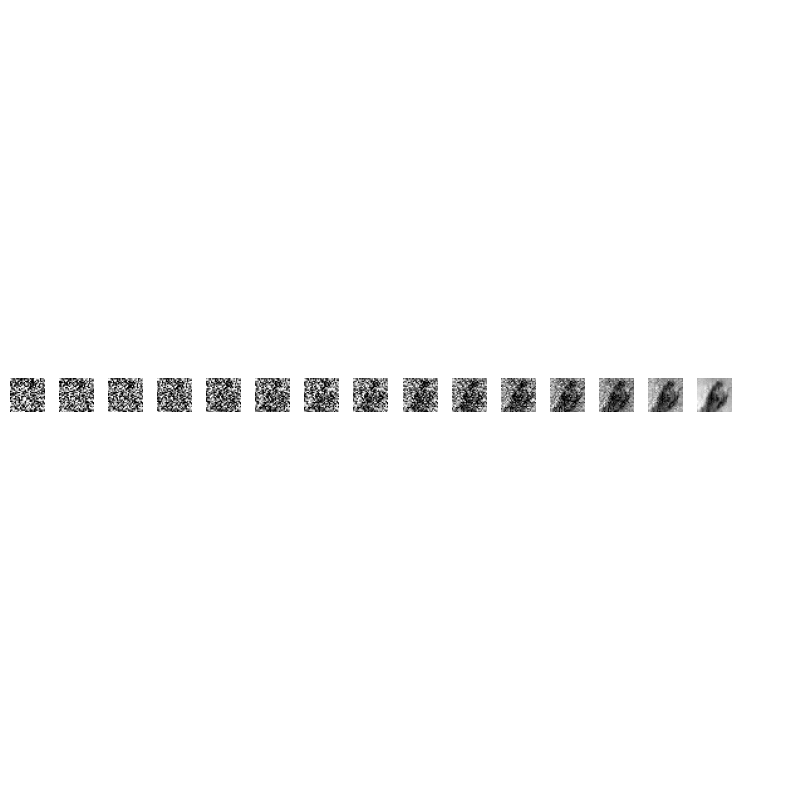

Training complete!
Final sample:


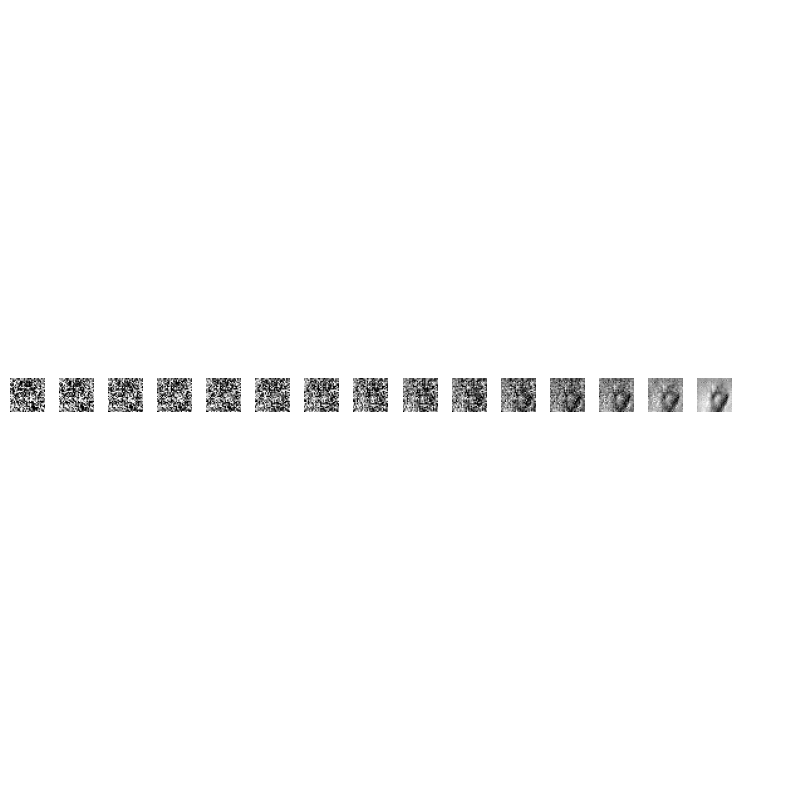

tensor([[[[-0.2730, -0.1962, -0.1781, -0.1515, -0.2161, -0.1161, -0.1807,
           -0.1148, -0.1632, -0.1046, -0.1309, -0.1616, -0.1710, -0.2431,
           -0.1225, -0.1387, -0.1344, -0.1974, -0.1382, -0.2150, -0.1310,
           -0.2492, -0.0764, -0.2896, -0.0565, -0.1715, -0.0937, -0.2150],
          [-0.2025, -0.1807, -0.1858, -0.1483, -0.1608, -0.1325, -0.2136,
           -0.2013, -0.1588, -0.1438, -0.1370, -0.1824, -0.1333, -0.1363,
           -0.1592, -0.1118, -0.0971, -0.2189, -0.2083, -0.2073, -0.1501,
           -0.0750, -0.1970, -0.0212, -0.1790, -0.1469, -0.1805, -0.2374],
          [-0.1461, -0.1803, -0.2003, -0.1876, -0.1470, -0.2227, -0.1654,
           -0.2155, -0.1936, -0.1722, -0.2039, -0.1423, -0.1084, -0.2590,
           -0.1550, -0.1749, -0.1739, -0.2053, -0.1429, -0.2845, -0.1155,
           -0.3501, -0.0612, -0.3693,  0.0185, -0.1850, -0.1600, -0.2534],
          [-0.1310, -0.1566, -0.1484, -0.1664, -0.1718, -0.1079, -0.3052,
           -0.1647, -0.1729, -0.080

In [17]:
# Training hyperparameters
optimizer = Adam(model.parameters(), lr=0.0008)
epochs = 15
ncols = 15

# Training loop
model.train()
for epoch in range(epochs):
    for step, batch in enumerate(dataloader):
        optimizer.zero_grad()

        t = torch.randint(0, T, (BATCH_SIZE,), device=device)  # Random timesteps
        x = batch[0].to(device)
        labels = batch[1].to(device)  # Class labels for conditional generation
        
        loss = get_loss(model, x, t, labels)
        loss.backward()
        optimizer.step()

        # Sample images during training to monitor progress
        if epoch % 1 == 0 and step % 100 == 0:
            print(f"Epoch {epoch} | Step {step:03d} | Loss: {loss.item():.6f}")
            model.eval()
            random_class = torch.randint(0, NUM_CLASSES, (1,)).item()
            sample_images(model, ncols, class_label=random_class)
            model.train()
            
print("Training complete!")
print("Final sample:")
model.eval()
sample_images(model, ncols)

### 2.7 Evaluation

I generated multiple samples to evaluate the baseline model's performance.

<Figure size 800x800 with 0 Axes>

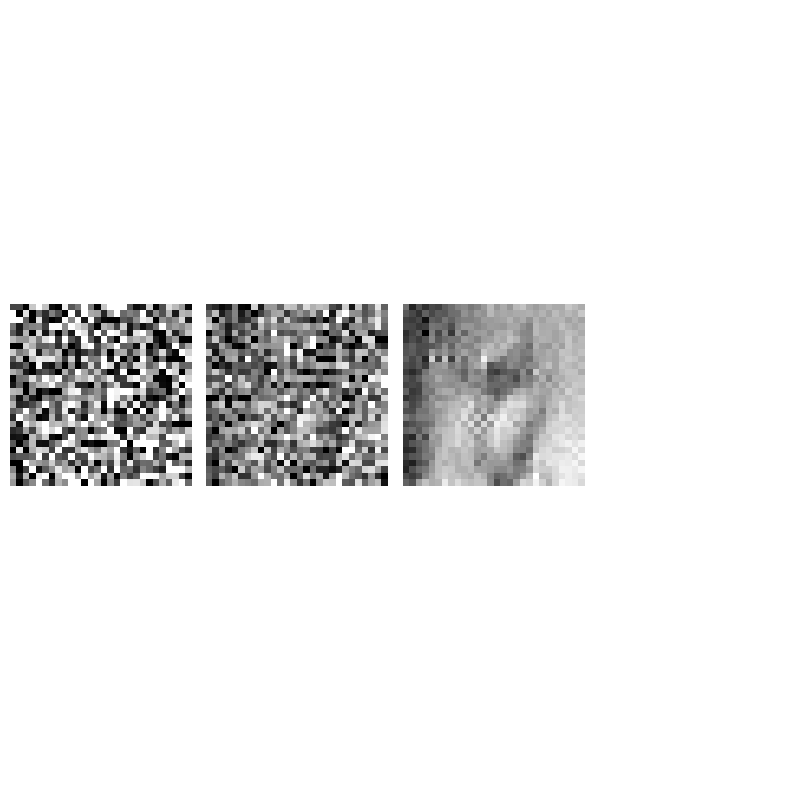

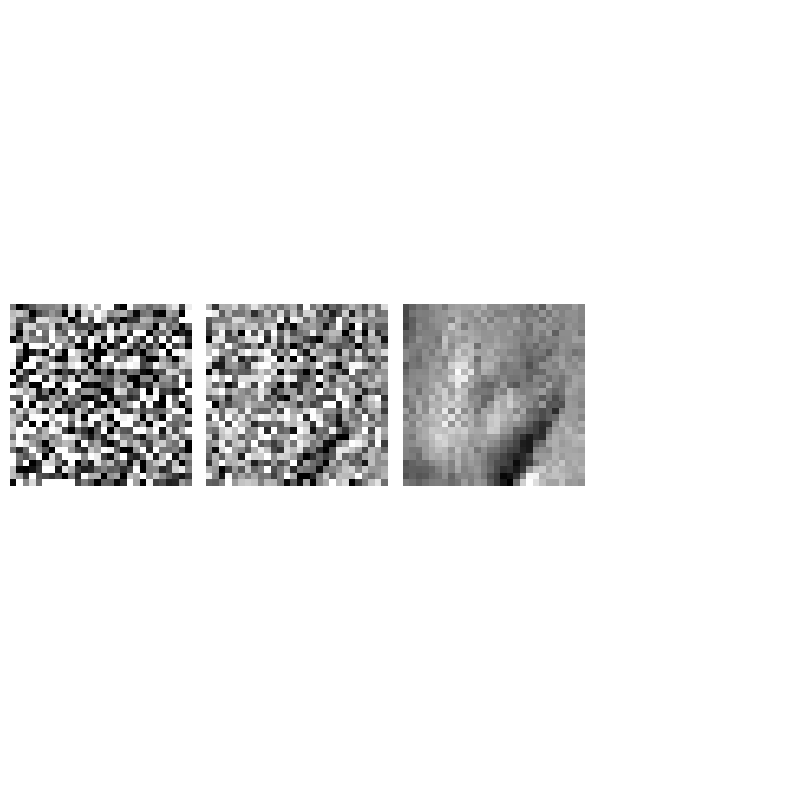

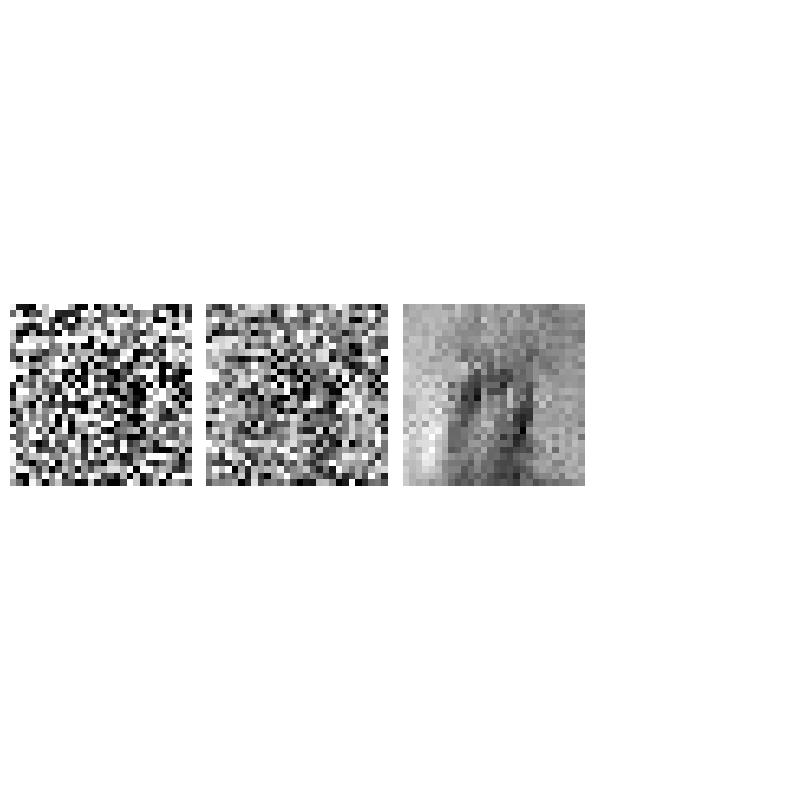

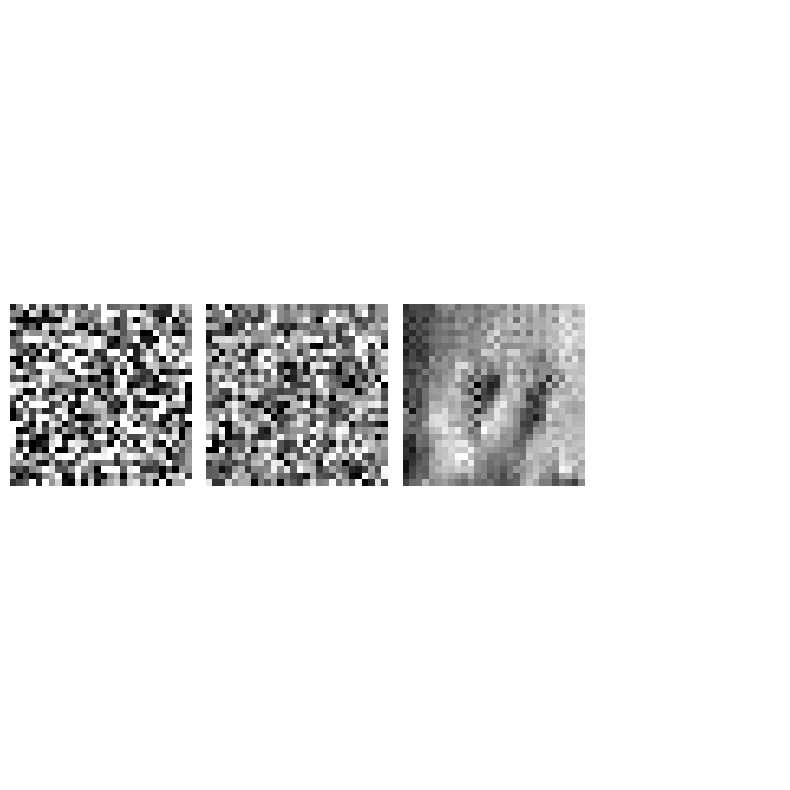

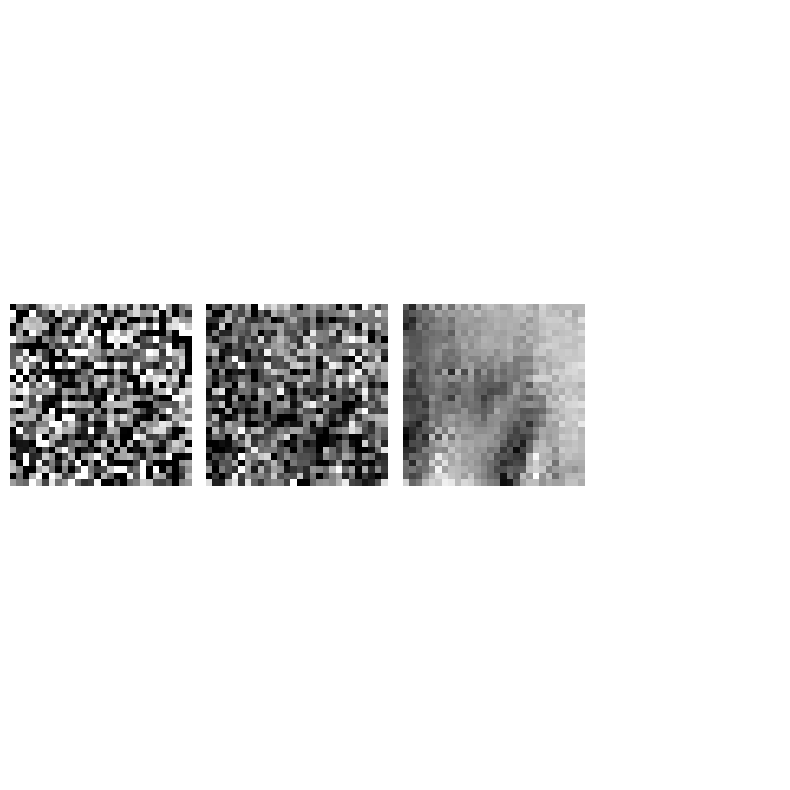

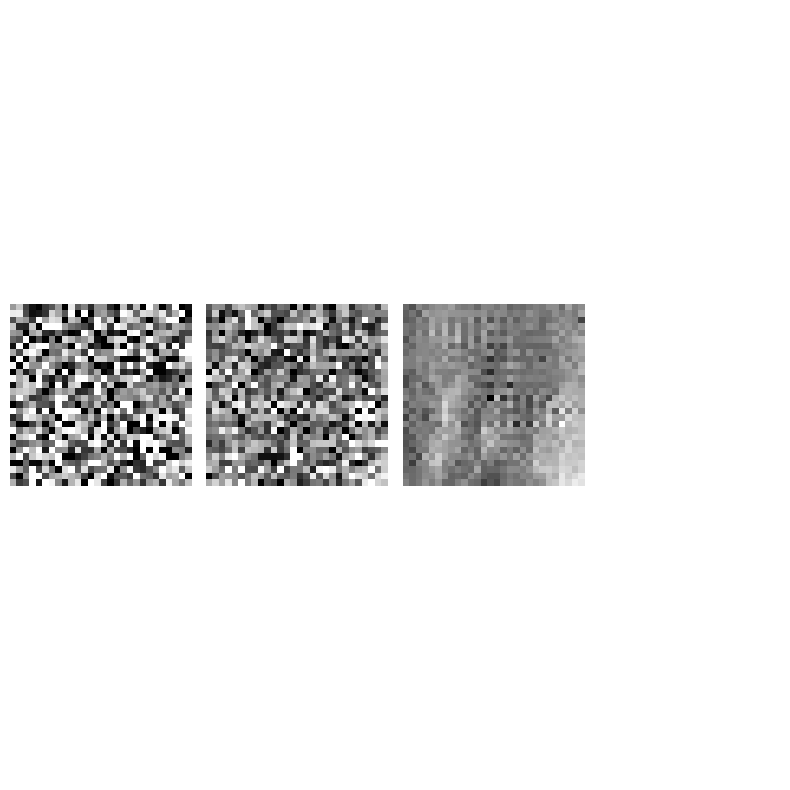

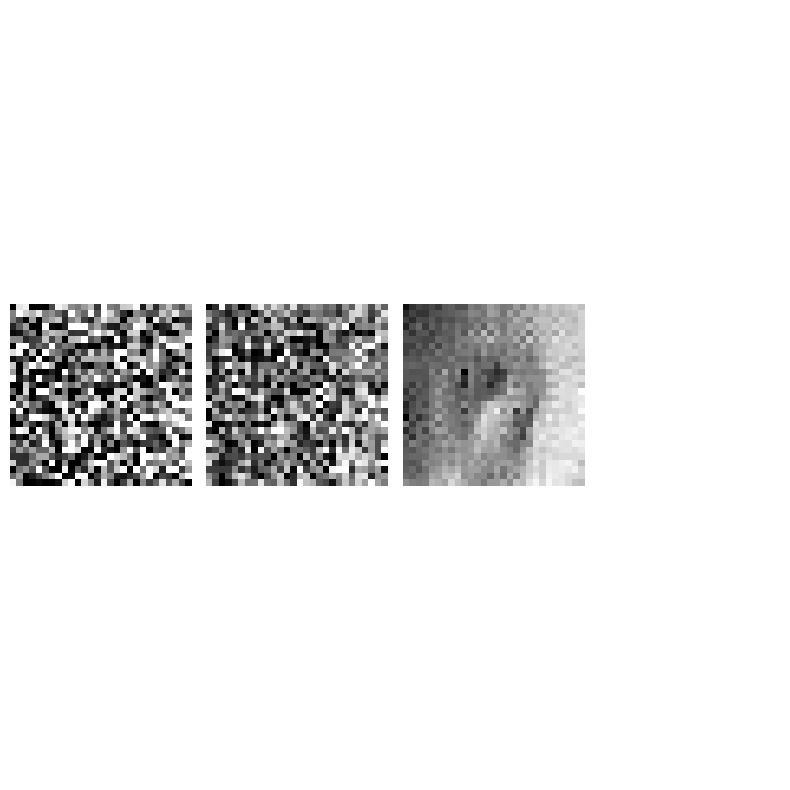

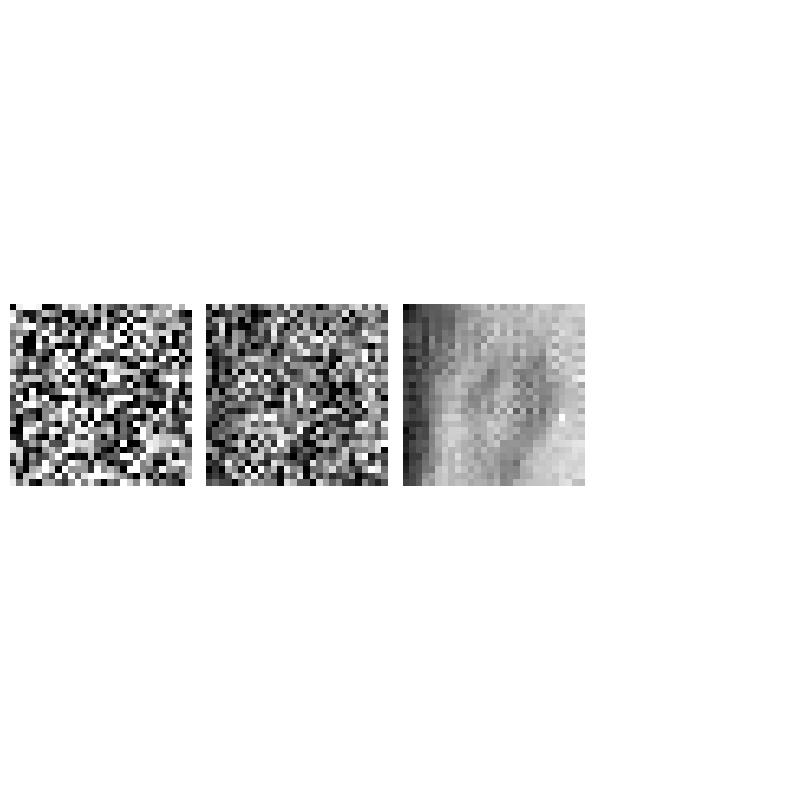

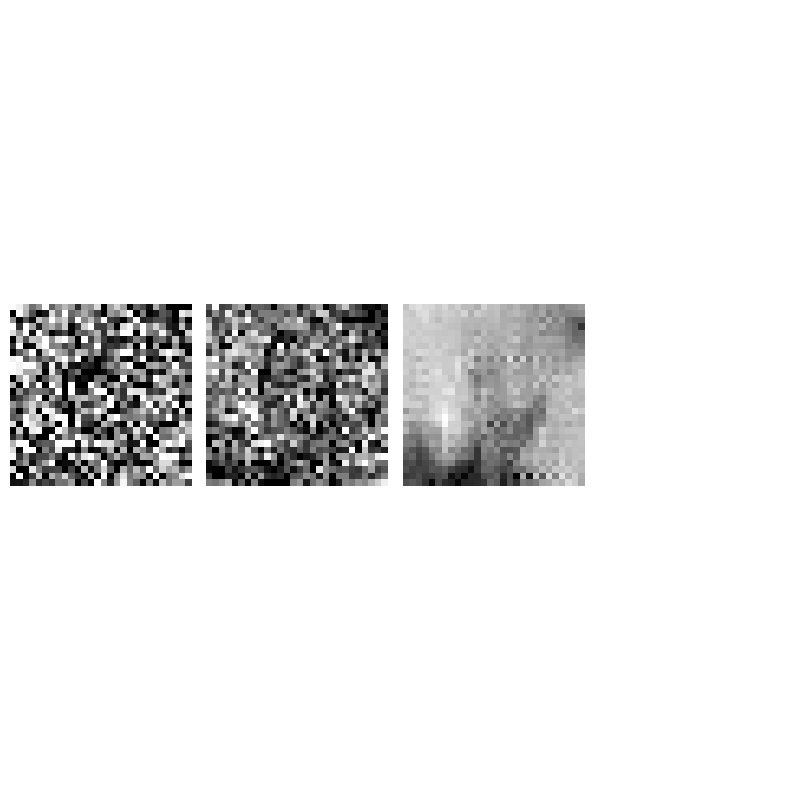

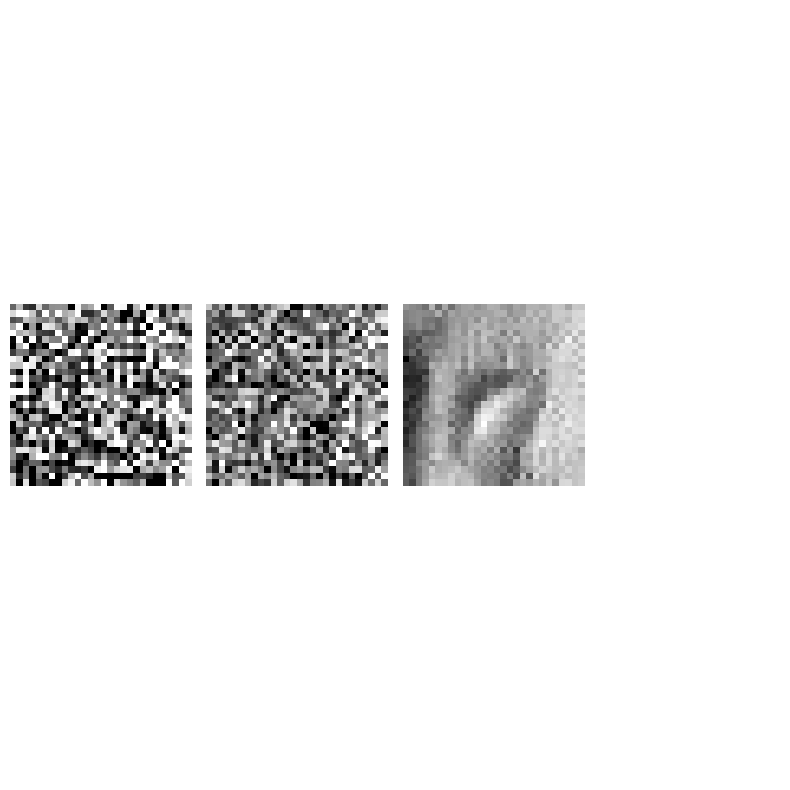

In [18]:
# Generate 10 sample sets for evaluation
model.eval()
plt.figure(figsize=(8,8))
ncols = 3
for _ in range(10):
    sample_images(model, ncols)

## 3. Optimized Model

I built an optimized version of the diffusion model with performance improvements. This model incorporates several architectural enhancements to improve image generation quality.

**Key Optimizations:**
- **Group Normalization**: More stable than Batch Normalization for small batches
- **GELU Activation**: Smoother gradients than ReLU
- **Rearrange Pooling**: Learnable pooling instead of fixed MaxPool
- **Sinusoidal Position Embeddings**: Better time step representation
- **Residual Connections**: Improves gradient flow and reduces artifacts

### 3.1 Optimized Components

I replaced Batch Normalization with Group Normalization (better for small batches) and ReLU with GELU activation (smoother gradients).

In [19]:
class GELUConvBlock(nn.Module):
    """
    Convolution block with Group Normalization and GELU activation
    
    Group Normalization is more stable than Batch Normalization for small batches,
    and GELU provides smoother gradients than ReLU, leading to better training.
    """
    def __init__(self, in_ch, out_ch, group_size):
        super().__init__()
        self.model = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, 1, 1),
            nn.GroupNorm(group_size, out_ch),
            nn.GELU()    
        )

    def forward(self, x):
        return self.model(x)

I replaced MaxPool with learnable pooling using einops Rearrange so the network learns optimal pooling weights.

In [20]:
class RearrangePoolBlock(nn.Module):
    """
    Rearrange pooling block using einops
    
    Instead of fixed MaxPool, this uses a learnable pooling operation.
    The einops rearrange operation reshapes the tensor, and a convolution
    learns how to optimally combine the spatial information.
    """
    def __init__(self, in_chs, group_size):
        super().__init__()
        self.rearrange = Rearrange("b c (h p1) (w p2) -> b (c p1 p2) h w", p1=2, p2=2)
        self.conv = GELUConvBlock(4 * in_chs, in_chs, group_size)

    def forward(self, x):
        x = self.rearrange(x)
        return self.conv(x)

I used sinusoidal embeddings for timesteps to give a richer, more continuous representation than linear embeddings.

In [21]:
class SinusoidalPositionEmbedBlock(nn.Module):
    """
    Sinusoidal position embeddings for time steps
    
    Uses sinusoidal functions to encode timestep information, providing
    a richer and more continuous representation than simple linear embeddings.
    This helps the model better understand the progression through diffusion timesteps.
    """
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        return embeddings

I added residual connections to improve gradient flow and reduce checkerboard artifacts.

In [22]:
class ResidualConvBlock(nn.Module):
    """
    Residual convolution block with skip connections
    
    Adds skip connections (residual connections) that allow gradients to flow
    more easily through the network. This helps with training stability and
    can reduce checkerboard artifacts in generated images.
    """
    def __init__(self, in_chs, out_chs, group_size):
        super().__init__()
        self.conv1 = GELUConvBlock(in_chs, out_chs, group_size)
        self.conv2 = GELUConvBlock(out_chs, out_chs, group_size)

    def forward(self, x):
        x1 = self.conv1(x)
        x2 = self.conv2(x1)
        out = x1 + x2  # Residual connection
        return out

### 3.2 Optimized Architecture Blocks

I redesigned the downsampling and upsampling blocks using the optimized components.

In [23]:
class OptimizedDownBlock(nn.Module):
    """
    Optimized downsampling block
    
    Uses GELUConvBlock for better activation and RearrangePoolBlock
    for learnable pooling instead of fixed MaxPool.
    """
    def __init__(self, in_chs, out_chs, group_size):
        super().__init__()
        self.model = nn.Sequential(
            GELUConvBlock(in_chs, out_chs, group_size),
            GELUConvBlock(out_chs, out_chs, group_size),
            RearrangePoolBlock(out_chs, group_size)
        )

    def forward(self, x):
        return self.model(x)

In [24]:
class OptimizedUpBlock(nn.Module):
    """
    Optimized upsampling block
    
    Uses transposed convolutions for upsampling and multiple GELUConvBlocks
    to process features at higher resolution with better activation functions.
    """
    def __init__(self, in_chs, out_chs, group_size):
        super().__init__()
        self.model = nn.Sequential(
            nn.ConvTranspose2d(2 * in_chs, out_chs, 2, 2),
            GELUConvBlock(out_chs, out_chs, group_size),
            GELUConvBlock(out_chs, out_chs, group_size),
            GELUConvBlock(out_chs, out_chs, group_size),
            GELUConvBlock(out_chs, out_chs, group_size),
        )

    def forward(self, x, skip):
        x = torch.cat((x, skip), 1)
        x = self.model(x)
        return x

I updated the time embedding block to use GELU instead of ReLU for smoother gradients.

In [25]:
class OptimizedEmbedBlock(nn.Module):
    """
    Optimized time embedding block
    
    Uses GELU activation instead of ReLU for smoother gradients
    and better representation of timestep information.
    """
    def __init__(self, input_dim, emb_dim):
        super().__init__()
        self.input_dim = input_dim
        self.model = nn.Sequential(
            nn.Linear(input_dim, emb_dim),
            nn.GELU(),
            nn.Linear(emb_dim, emb_dim),
            nn.Unflatten(1, (emb_dim, 1, 1))
        )

    def forward(self, input):
        input = input.view(-1, self.input_dim)
        return self.model(input)

### 3.3 Optimized UNet Architecture

I built the complete optimized UNet with all improvements while keeping conditional generation.

In [26]:
class OptimizedUNet(nn.Module):
    """
    Optimized UNet architecture with performance improvements
    
    Incorporates several optimizations:
    - Group Normalization for stable training
    - GELU activation for smoother gradients
    - Rearrange Pooling for learnable downsampling
    - Sinusoidal Position Embeddings for better time representation
    - Residual Connections for improved gradient flow
    
    Maintains conditional generation capability for class-specific image generation.
    """
    def __init__(self, num_classes=NUM_CLASSES):
        super().__init__()
        img_chs = IMG_CH
        down_chs = (64, 64, 128)  # Increased channels for better feature representation
        up_chs = down_chs[::-1]
        latent_image_size = IMG_SIZE // 4
        t_dim = 8  # Sinusoidal embedding dimension
        group_size_base = 4
        small_group_size = 2 * group_size_base
        big_group_size = 8 * group_size_base

        # Initial convolution with residual connection
        self.down0 = ResidualConvBlock(img_chs, down_chs[0], small_group_size)

        # Downsample blocks
        self.down1 = OptimizedDownBlock(down_chs[0], down_chs[1], big_group_size)
        self.down2 = OptimizedDownBlock(down_chs[1], down_chs[2], big_group_size)
        self.to_vec = nn.Sequential(nn.Flatten(), nn.GELU())
        
        # Embeddings
        self.dense_emb = nn.Sequential(
            nn.Linear(down_chs[2]*latent_image_size**2, down_chs[1]),
            nn.GELU(),
            nn.Linear(down_chs[1], down_chs[1]),
            nn.GELU(),
            nn.Linear(down_chs[1], down_chs[2]*latent_image_size**2),
            nn.GELU()
        )
        
        # Time embeddings with sinusoidal encoding
        self.sinusoidaltime = SinusoidalPositionEmbedBlock(t_dim)
        self.temb_1 = OptimizedEmbedBlock(t_dim, up_chs[0])
        self.temb_2 = OptimizedEmbedBlock(t_dim, up_chs[1])
        
        # Class conditioning embedding
        self.class_emb = nn.Embedding(num_classes, up_chs[0])
        
        # Upsample blocks
        self.up0 = nn.Sequential(
            nn.Unflatten(1, (up_chs[0], latent_image_size, latent_image_size)),
            GELUConvBlock(up_chs[0], up_chs[0], big_group_size)
        )
        self.up1 = OptimizedUpBlock(up_chs[0], up_chs[1], big_group_size)
        self.up2 = OptimizedUpBlock(up_chs[1], up_chs[2], big_group_size)

        # Output with residual connection from down0
        self.out = nn.Sequential(
            nn.Conv2d(2 * up_chs[-1], up_chs[-1], 3, 1, 1),
            nn.GroupNorm(small_group_size, up_chs[-1]),
            nn.GELU(),
            nn.Conv2d(up_chs[-1], img_chs, 3, 1, 1)
        )

    def forward(self, x, t, class_labels=None):
        down0 = self.down0(x)
        down1 = self.down1(down0)
        down2 = self.down2(down1)
        latent_vec = self.to_vec(down2)
        
        # Process time with sinusoidal embeddings
        t = t.float() / T  # Convert from [0, T] to [0, 1]
        t = self.sinusoidaltime(t)  # Apply sinusoidal encoding
        latent_vec = self.dense_emb(latent_vec)
        temb_1 = self.temb_1(t)
        temb_2 = self.temb_2(t)
        
        # Add class conditioning
        if class_labels is not None:
            class_emb = self.class_emb(class_labels)
            class_emb = class_emb.view(-1, class_emb.shape[1], 1, 1)
            temb_1 = temb_1 + class_emb

        up0 = self.up0(latent_vec)
        up1 = self.up1(up0+temb_1, down2)
        up2 = self.up2(up1+temb_2, down1)
        
        # Final output with residual connection from down0
        return self.out(torch.cat((up2, down0), 1))

### 3.4 Initialize Model

I initialized the optimized model and loaded it to the device.

In [27]:
# Initialize the optimized model
model_optimized = OptimizedUNet(num_classes=NUM_CLASSES)
print("Optimized Model - Num params: ", sum(p.numel() for p in model_optimized.parameters()))
model_optimized = model_optimized.to(device)

Optimized Model - Num params:  2525953


### 3.5 Training

I trained the optimized model for 30 epochs with learning rate 0.0005 and batch size 128. Lower learning rate for better stability with the optimized architecture.

Optimized Model - Epoch 0 | Step 000 | Loss: 0.984696


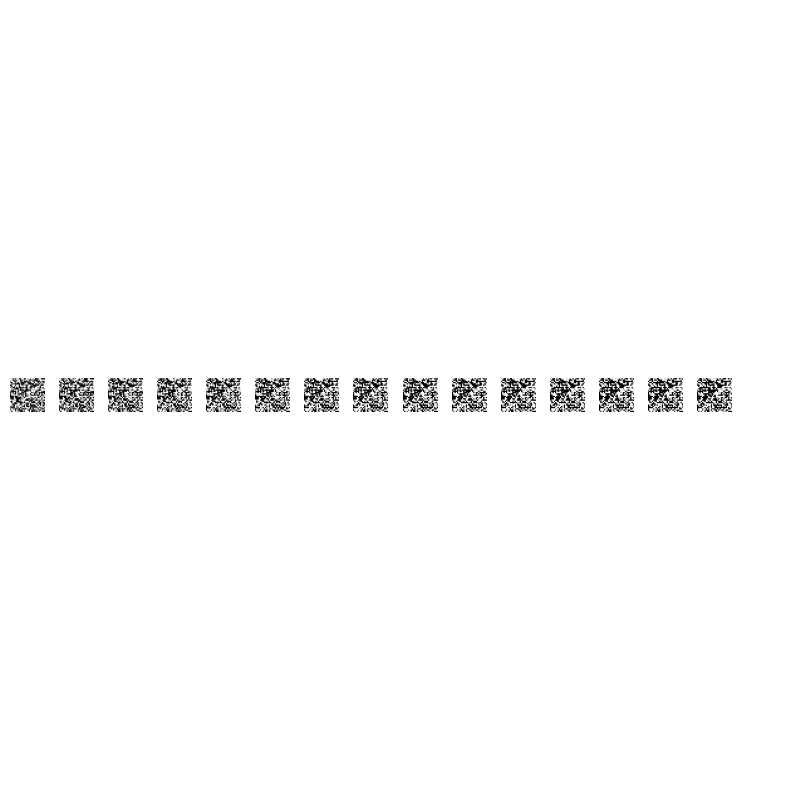

Optimized Model - Epoch 0 | Step 100 | Loss: 0.081039


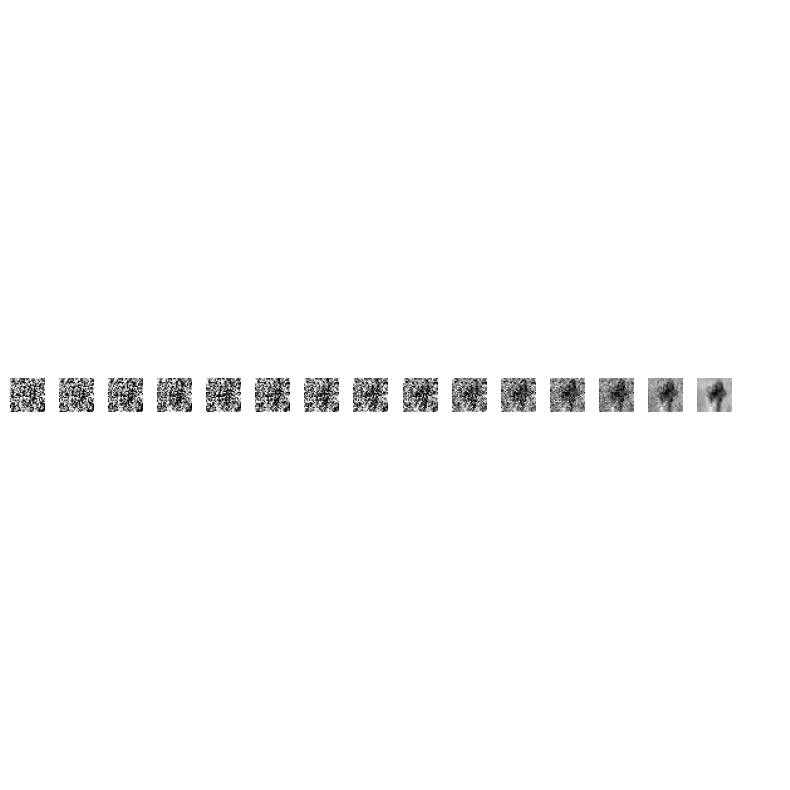

Optimized Model - Epoch 1 | Step 000 | Loss: 0.101860


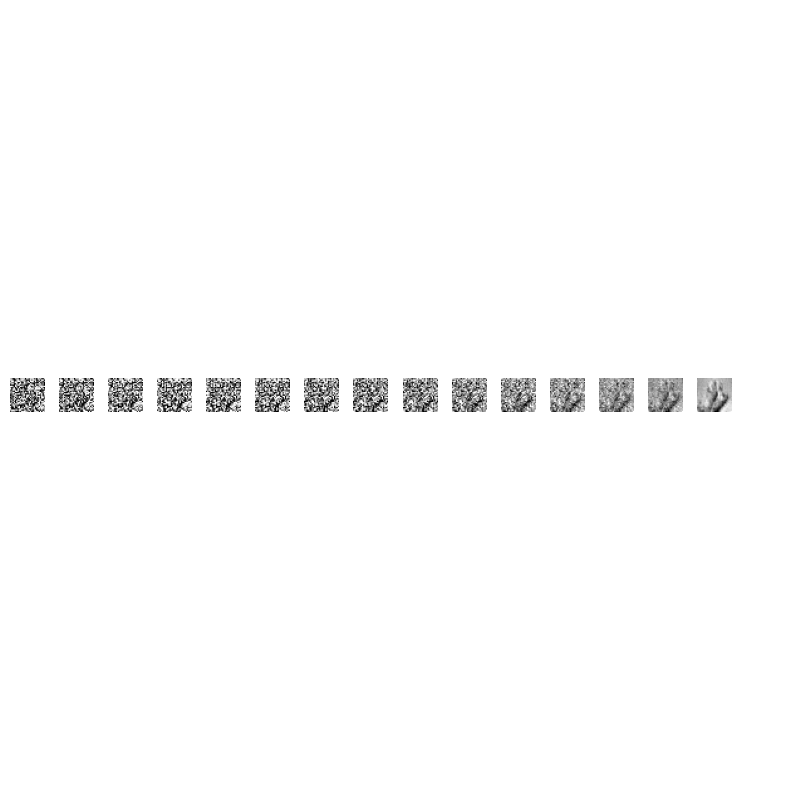

Optimized Model - Epoch 1 | Step 100 | Loss: 0.079800


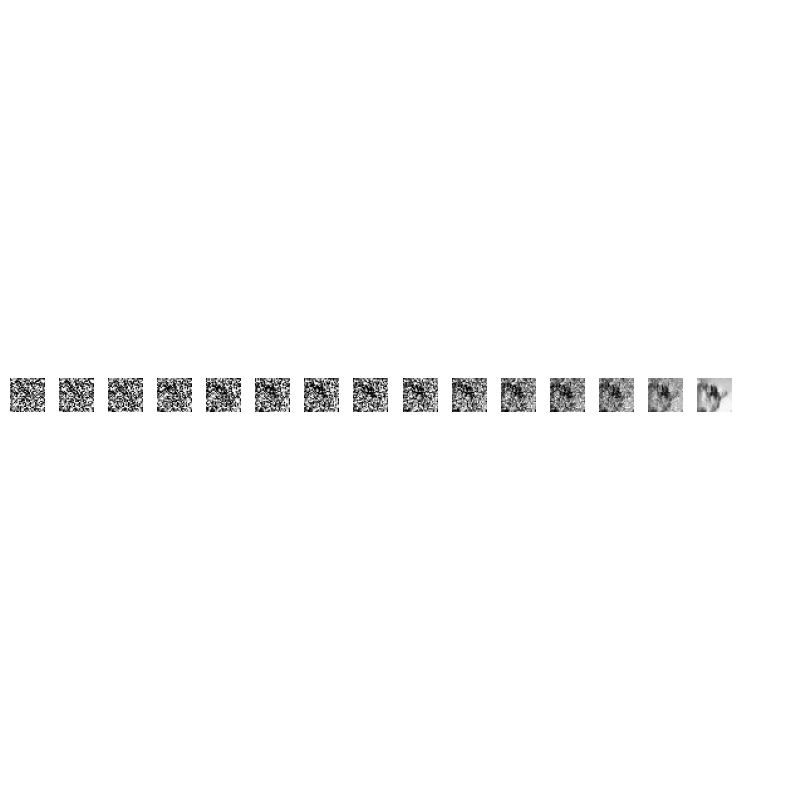

Optimized Model - Epoch 2 | Step 000 | Loss: 0.056049


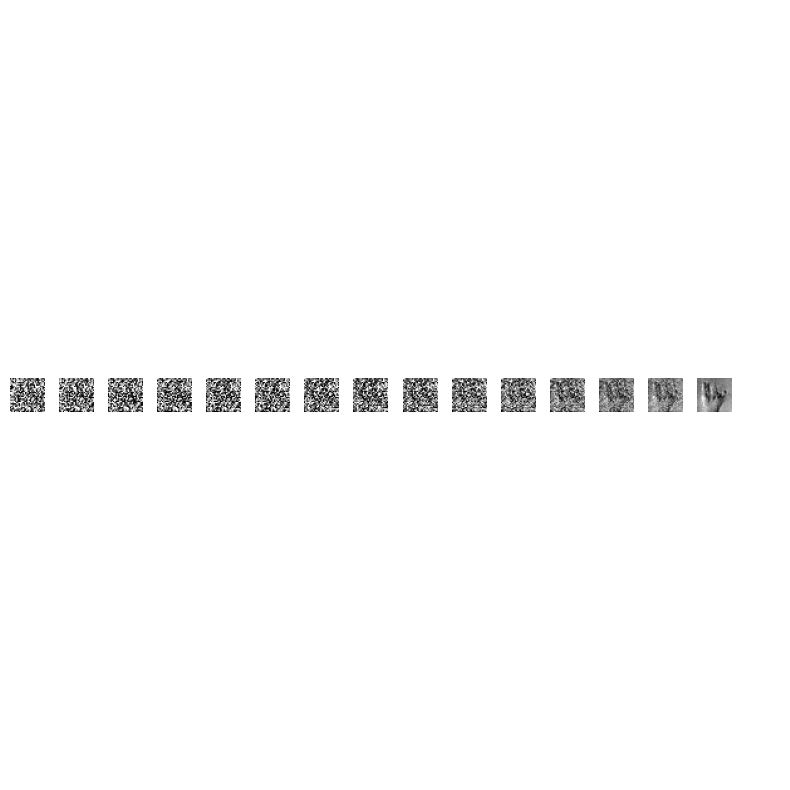

Optimized Model - Epoch 2 | Step 100 | Loss: 0.077791


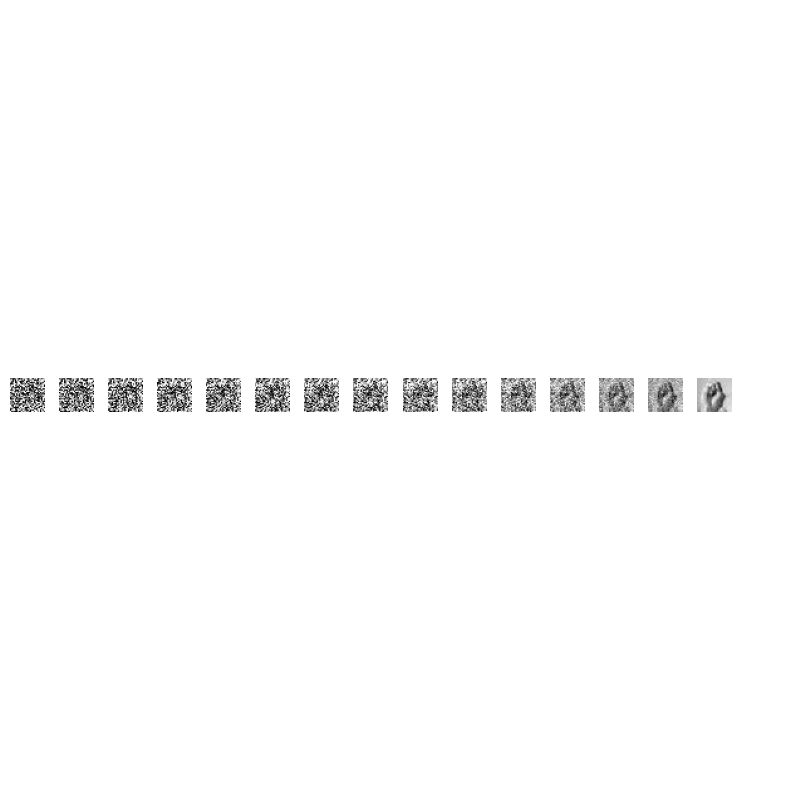

Optimized Model - Epoch 3 | Step 000 | Loss: 0.070533


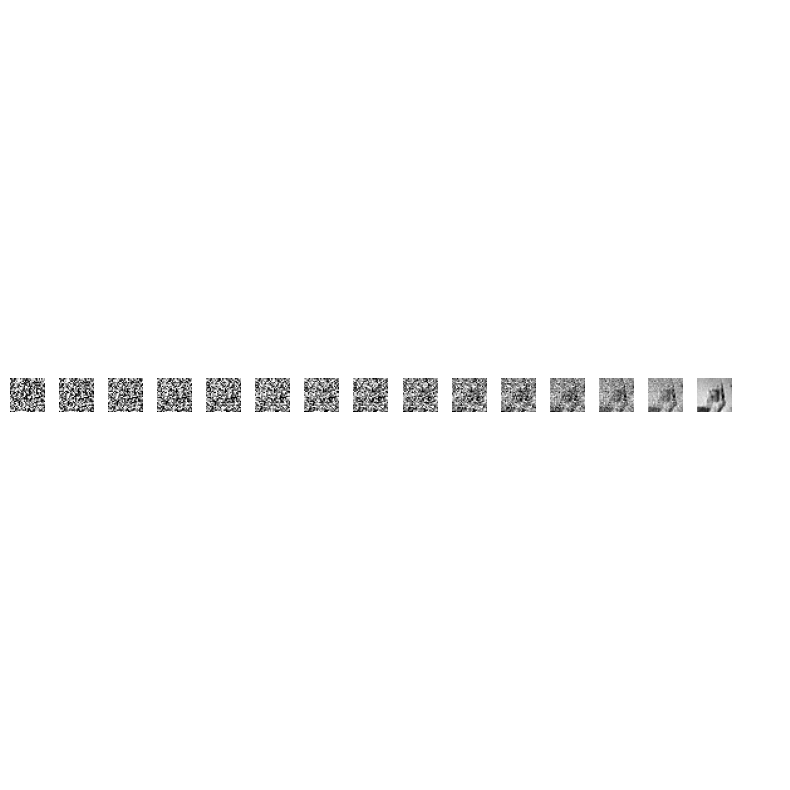

Optimized Model - Epoch 3 | Step 100 | Loss: 0.061746


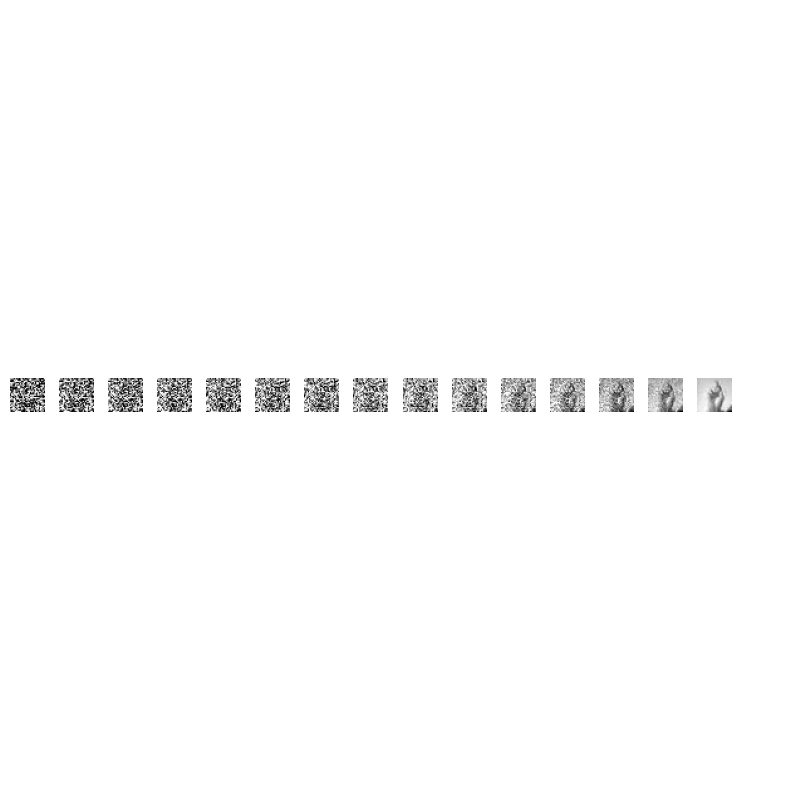

Optimized Model - Epoch 4 | Step 000 | Loss: 0.076534


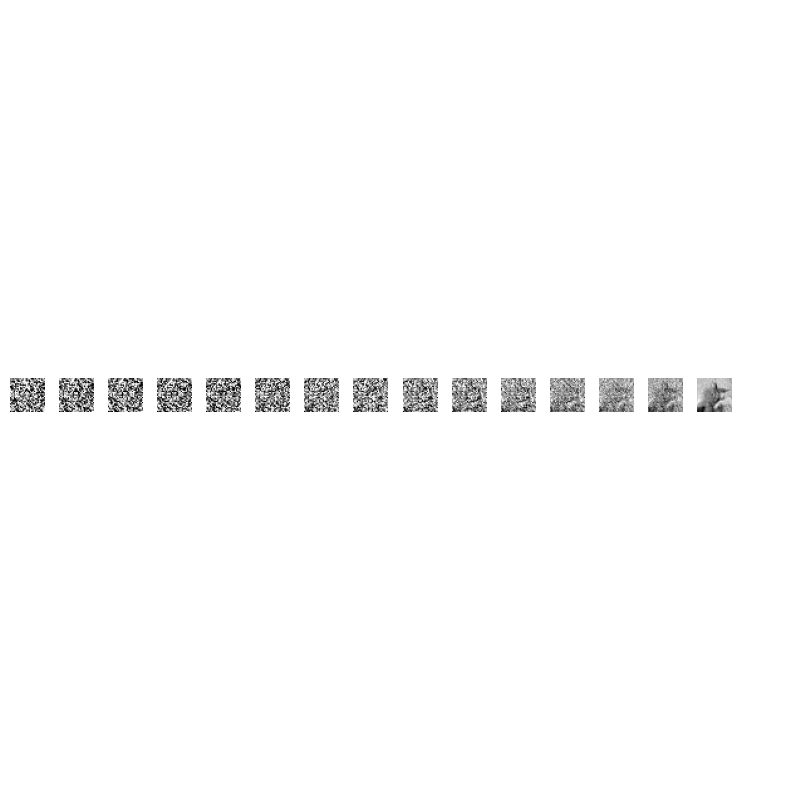

Optimized Model - Epoch 4 | Step 100 | Loss: 0.075798


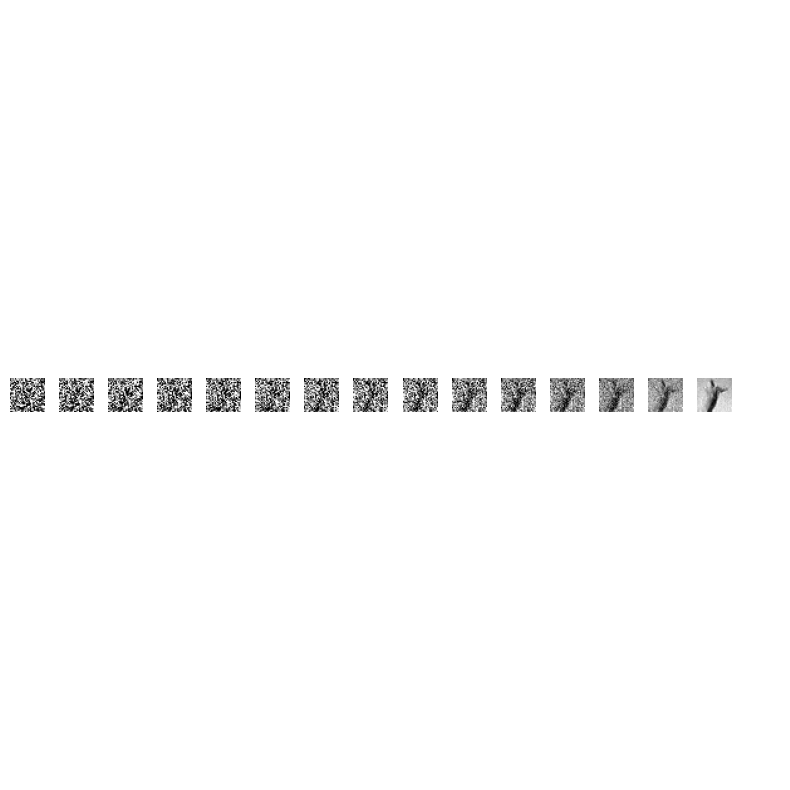

Optimized Model - Epoch 5 | Step 000 | Loss: 0.079982


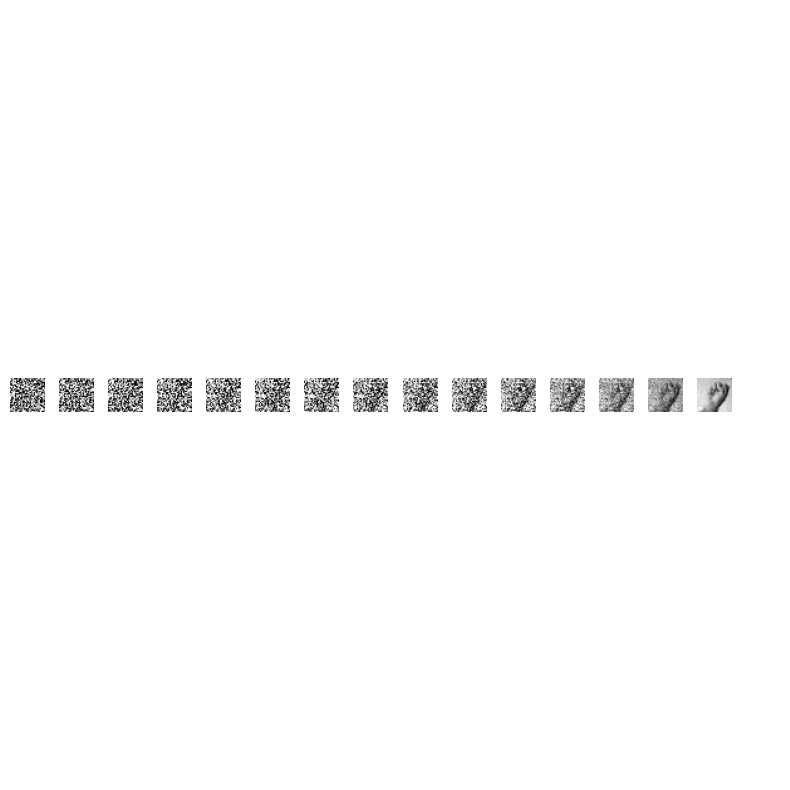

Optimized Model - Epoch 5 | Step 100 | Loss: 0.066548


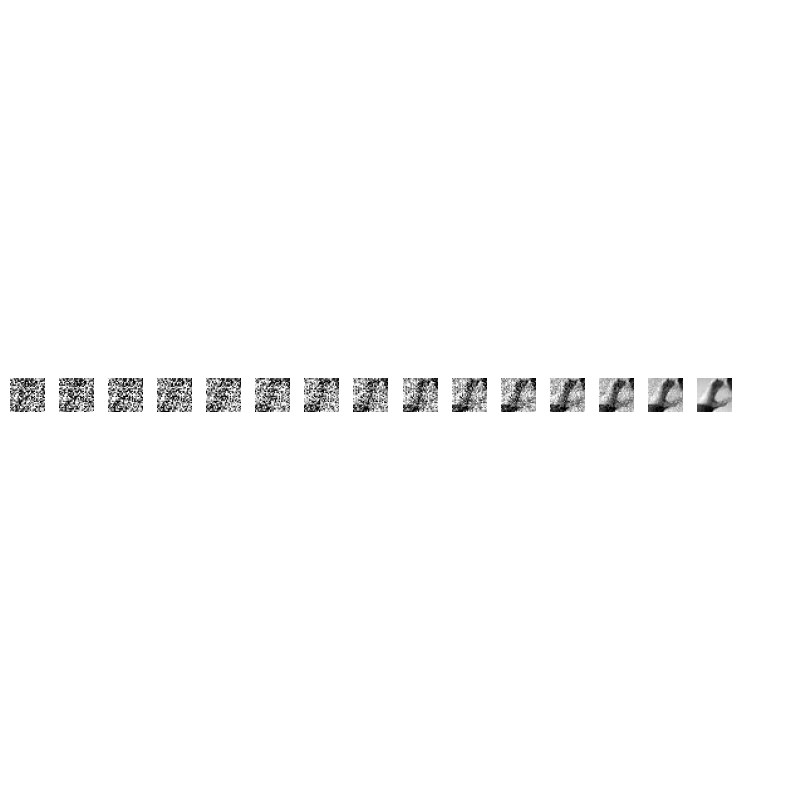

Optimized Model - Epoch 6 | Step 000 | Loss: 0.051866


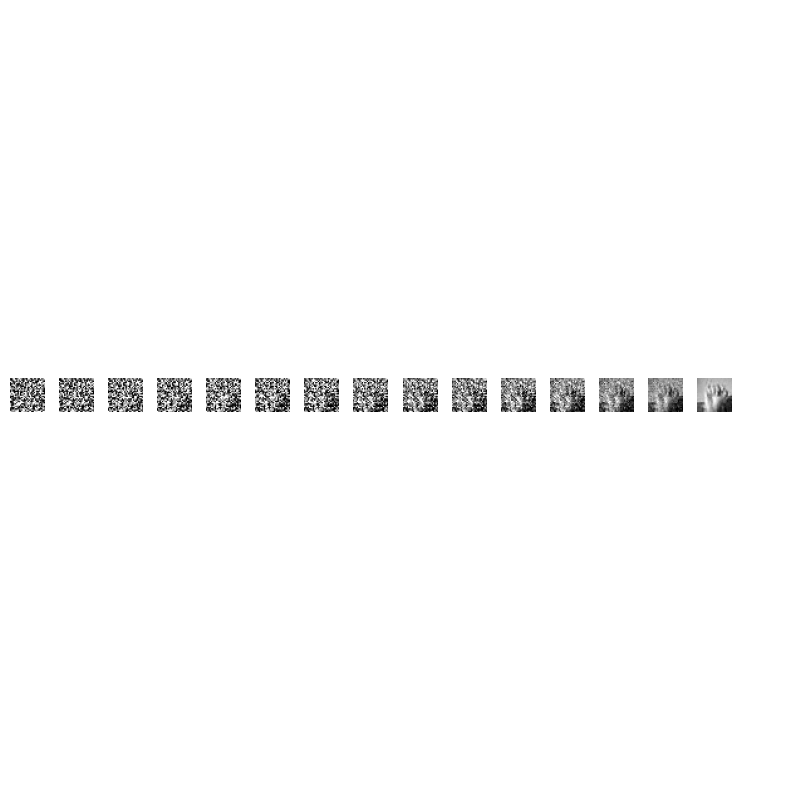

Optimized Model - Epoch 6 | Step 100 | Loss: 0.062142


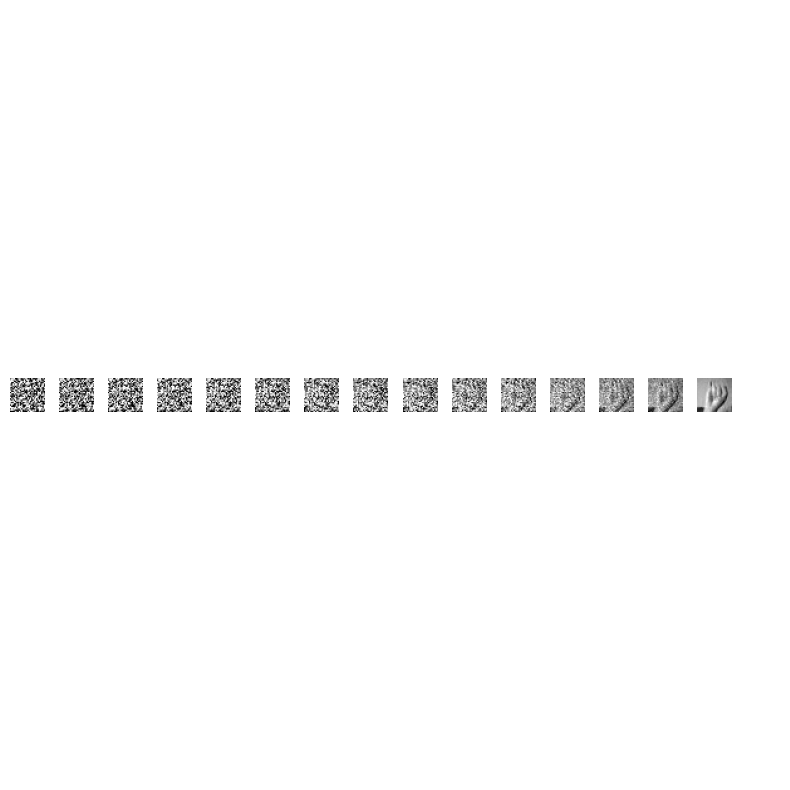

Optimized Model - Epoch 7 | Step 000 | Loss: 0.045463


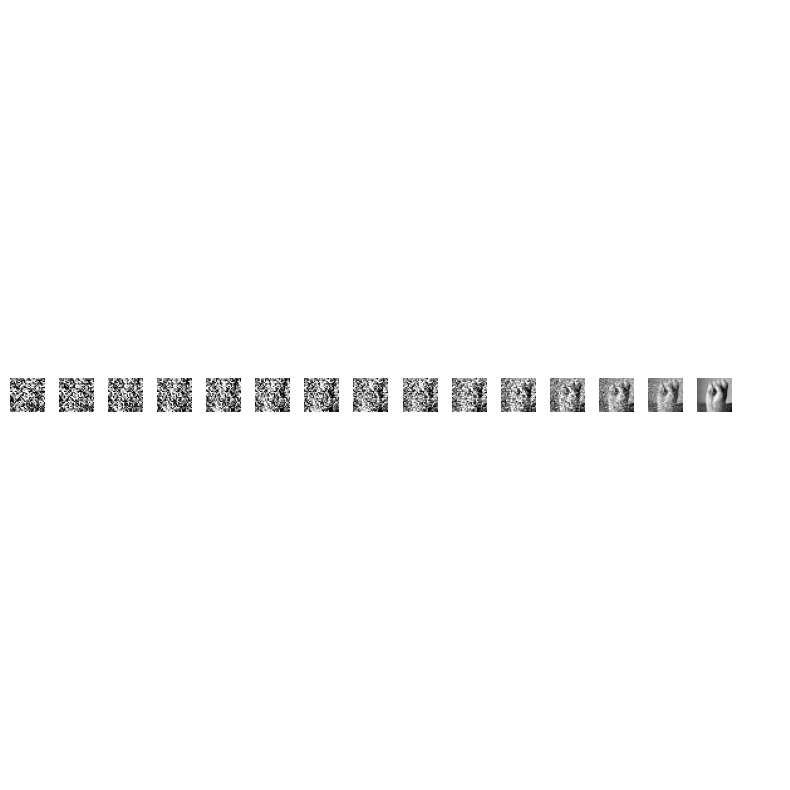

Optimized Model - Epoch 7 | Step 100 | Loss: 0.063056


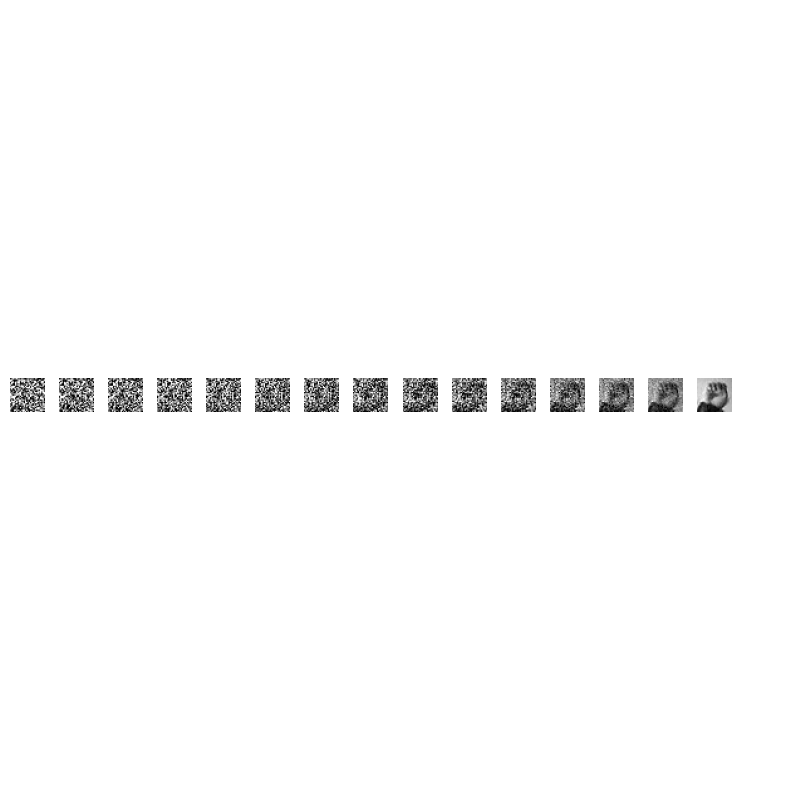

Optimized Model - Epoch 8 | Step 000 | Loss: 0.043060


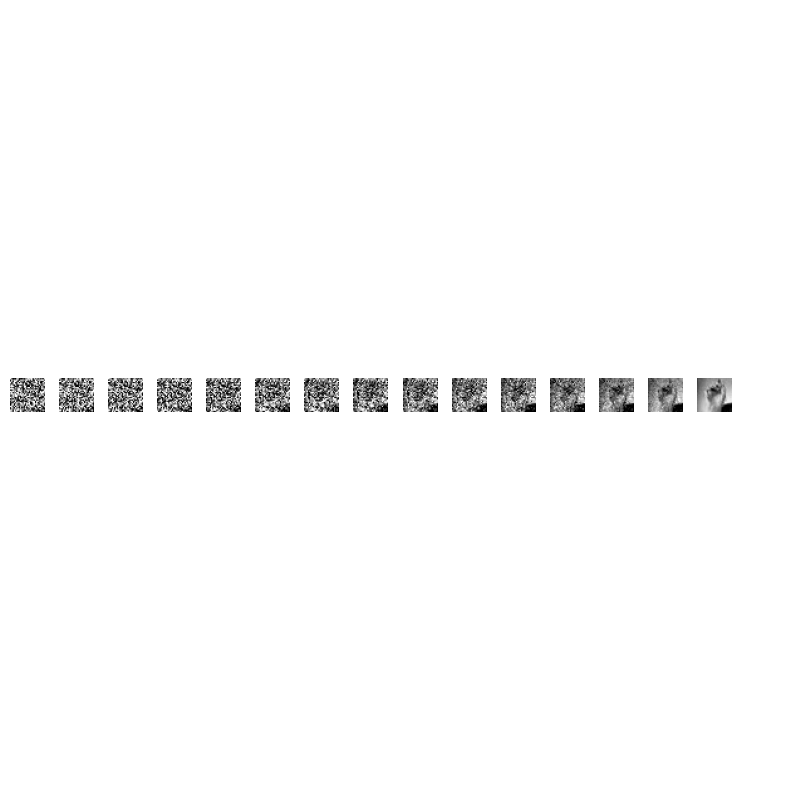

Optimized Model - Epoch 8 | Step 100 | Loss: 0.045303


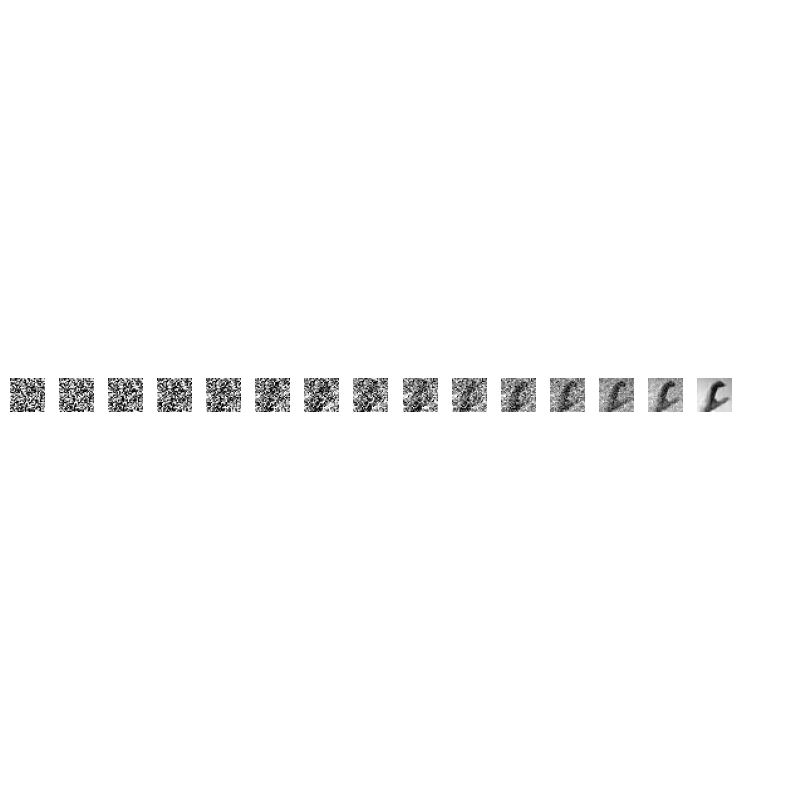

Optimized Model - Epoch 9 | Step 000 | Loss: 0.055002


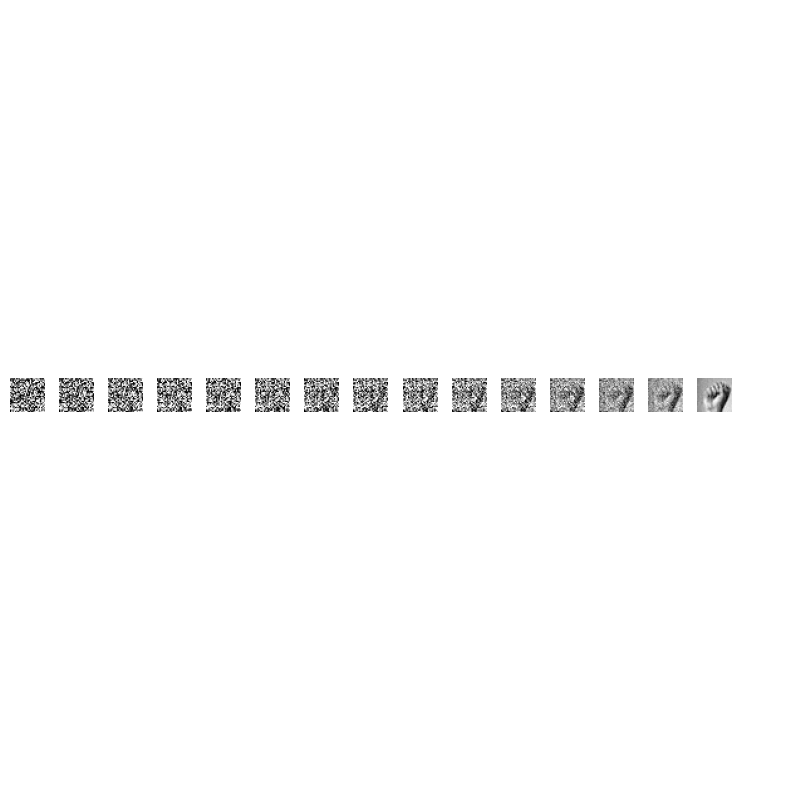

Optimized Model - Epoch 9 | Step 100 | Loss: 0.053986


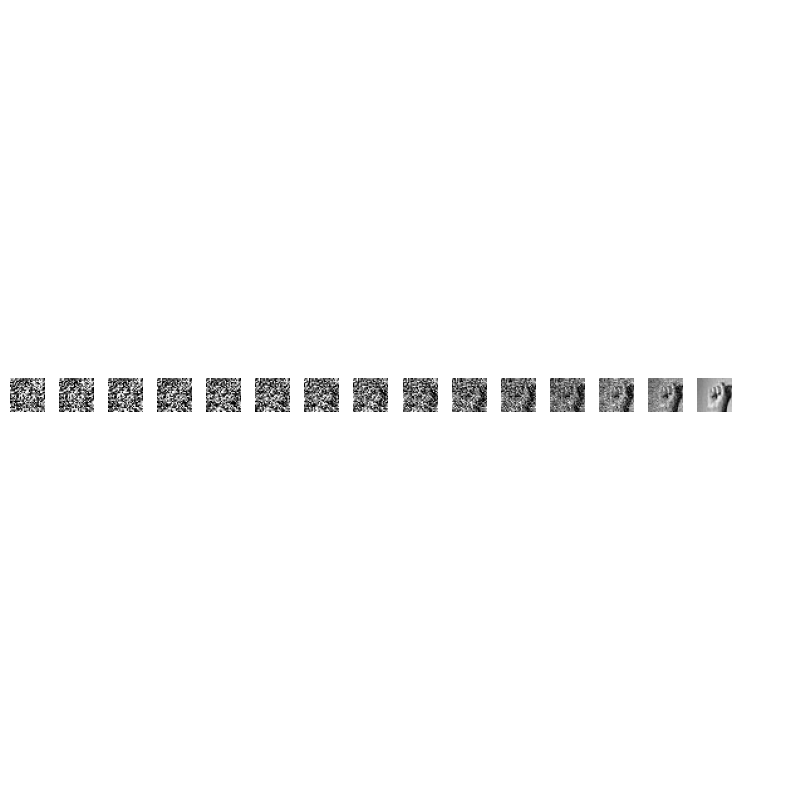

Optimized Model - Epoch 10 | Step 000 | Loss: 0.065256


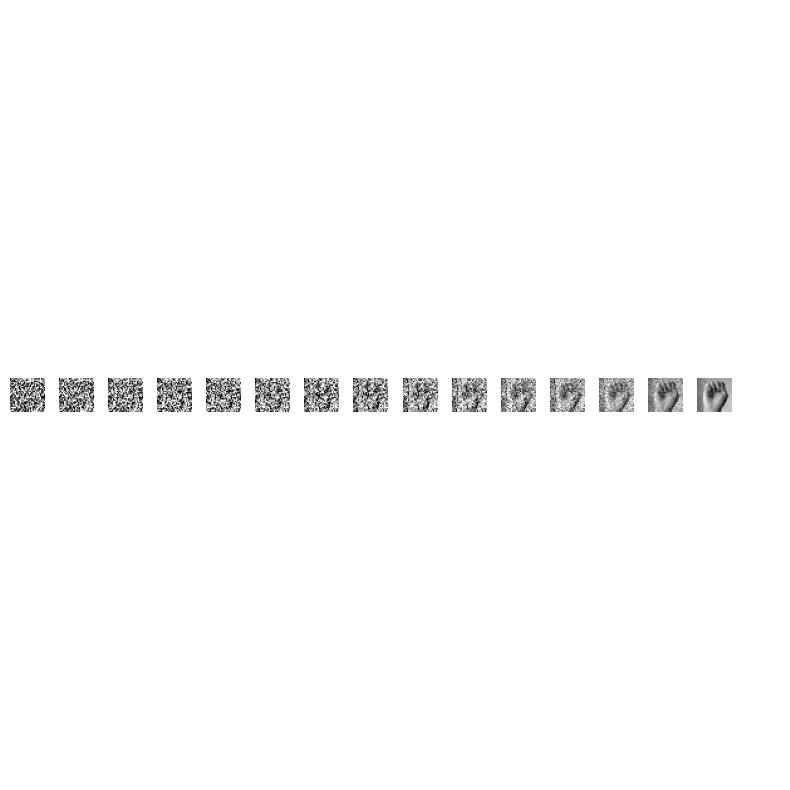

Optimized Model - Epoch 10 | Step 100 | Loss: 0.048992


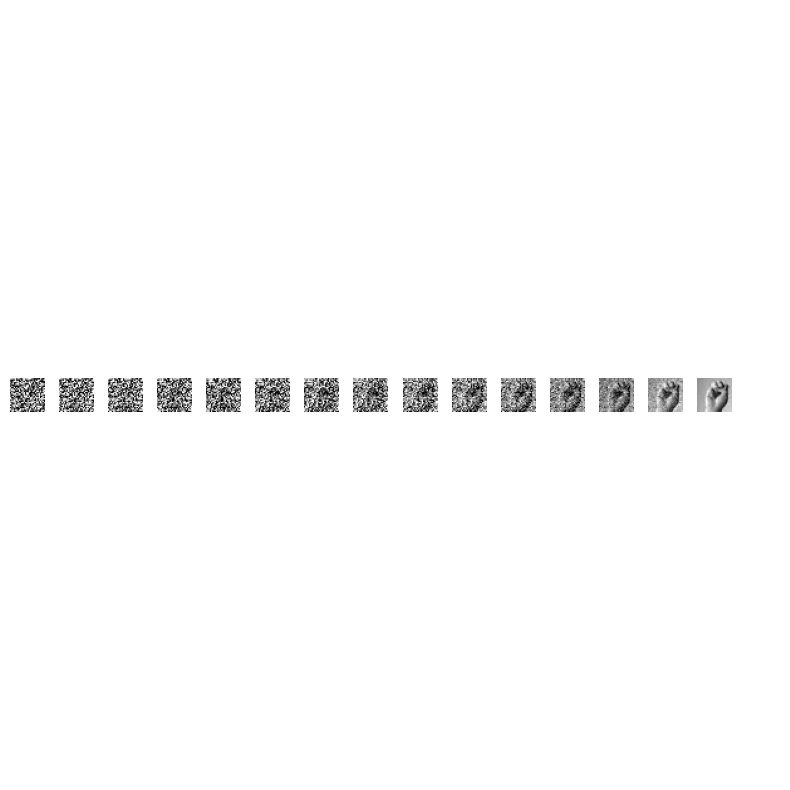

Optimized Model - Epoch 11 | Step 000 | Loss: 0.054973


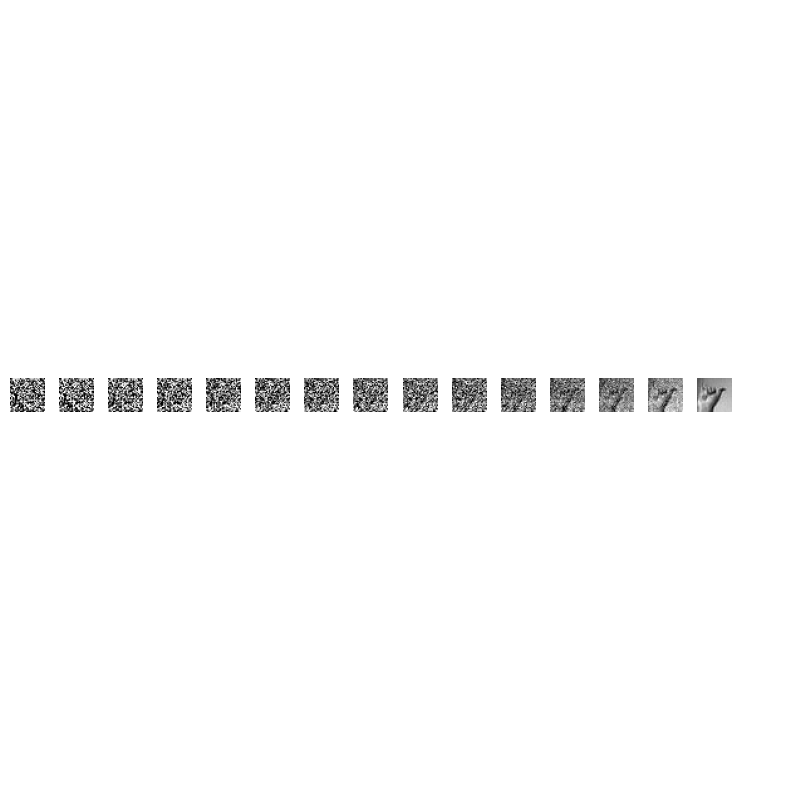

Optimized Model - Epoch 11 | Step 100 | Loss: 0.042130


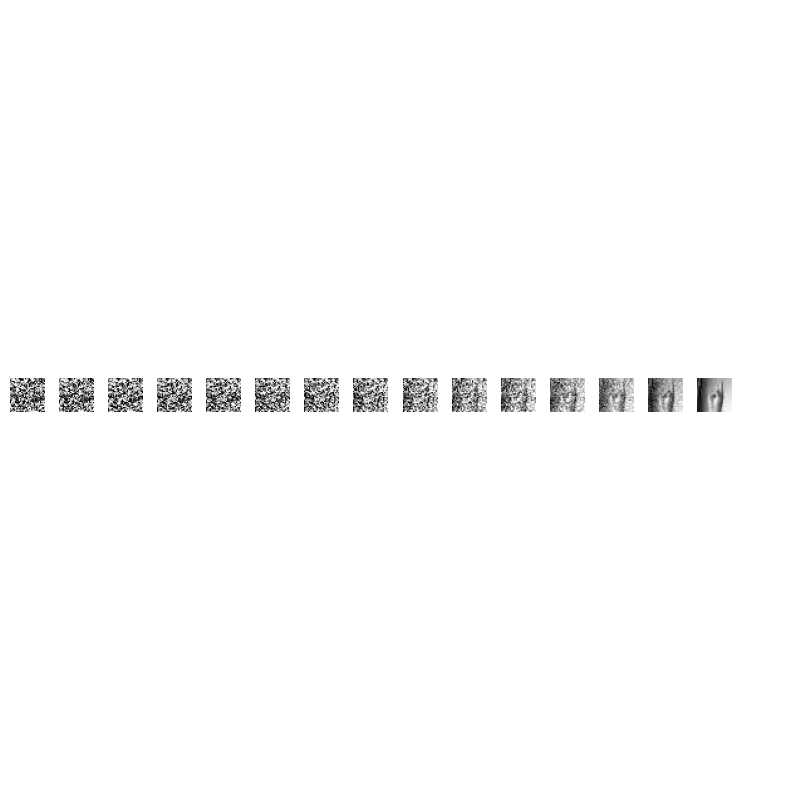

Optimized Model - Epoch 12 | Step 000 | Loss: 0.054027


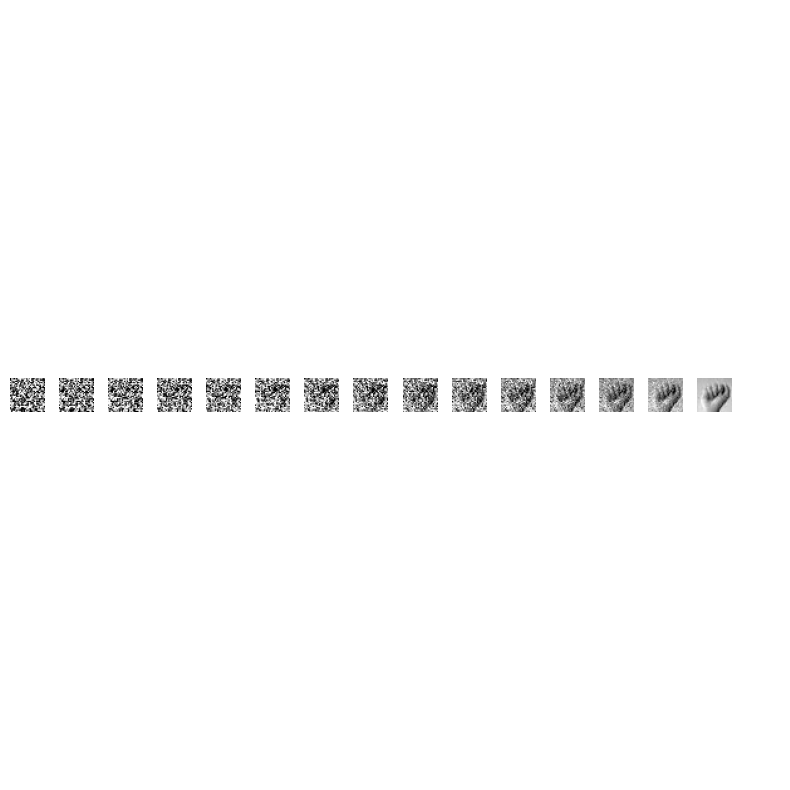

Optimized Model - Epoch 12 | Step 100 | Loss: 0.061361


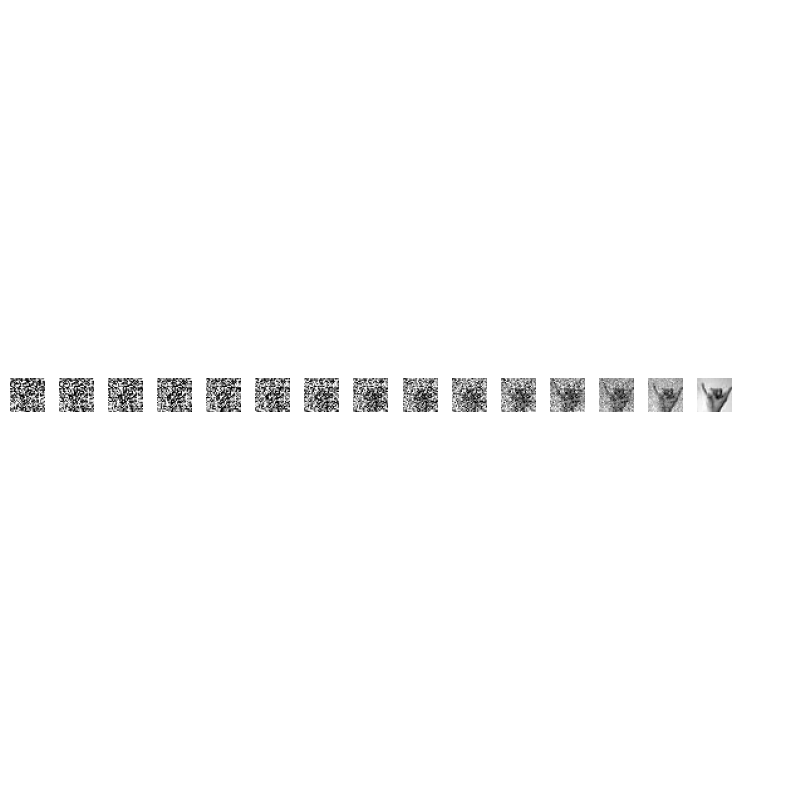

Optimized Model - Epoch 13 | Step 000 | Loss: 0.067743


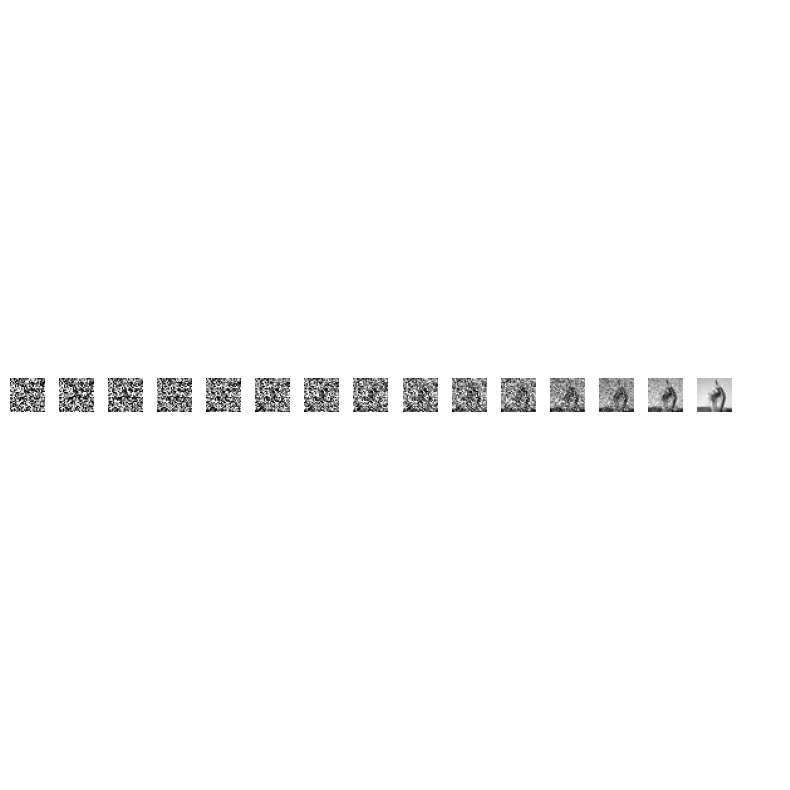

Optimized Model - Epoch 13 | Step 100 | Loss: 0.059074


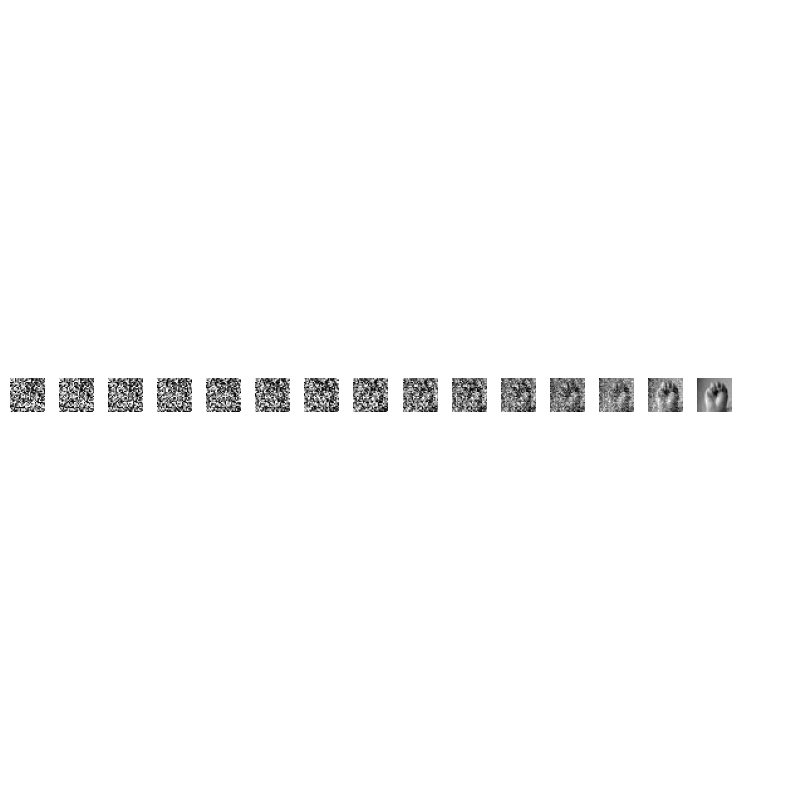

Optimized Model - Epoch 14 | Step 000 | Loss: 0.046615


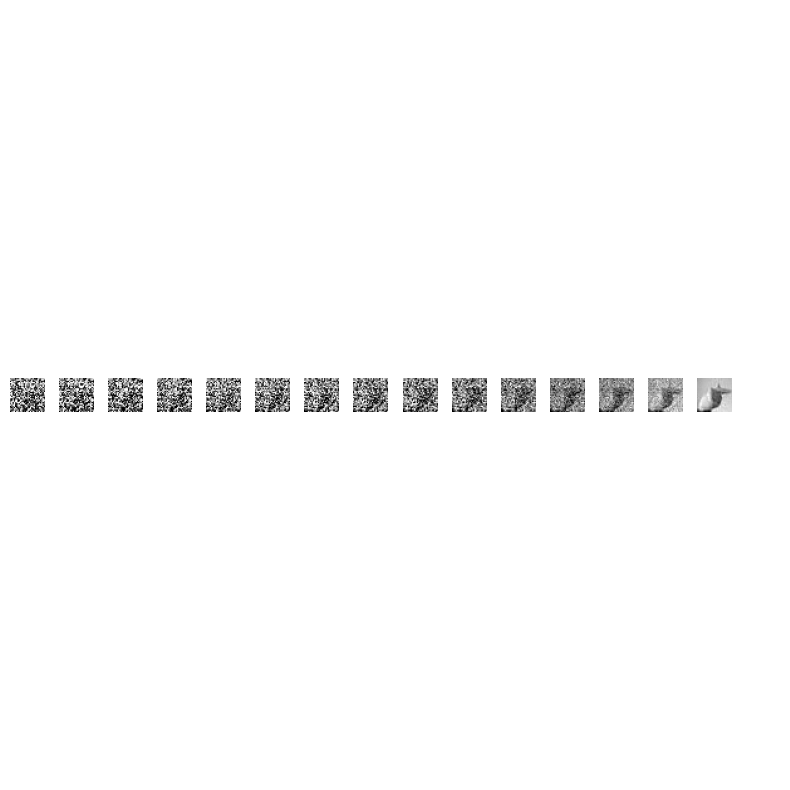

Optimized Model - Epoch 14 | Step 100 | Loss: 0.056727


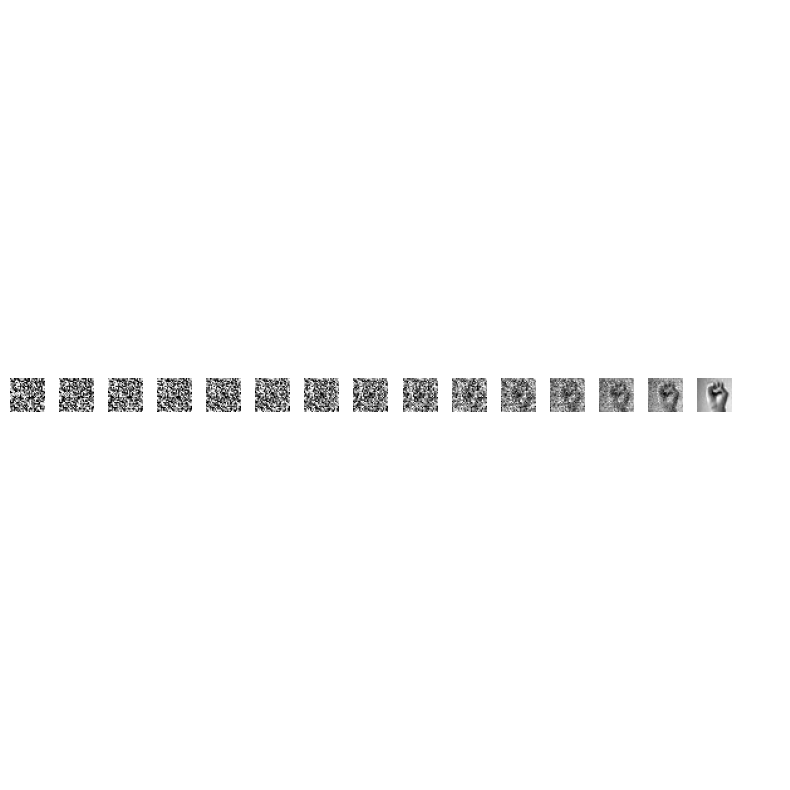

Optimized Model - Epoch 15 | Step 000 | Loss: 0.036366


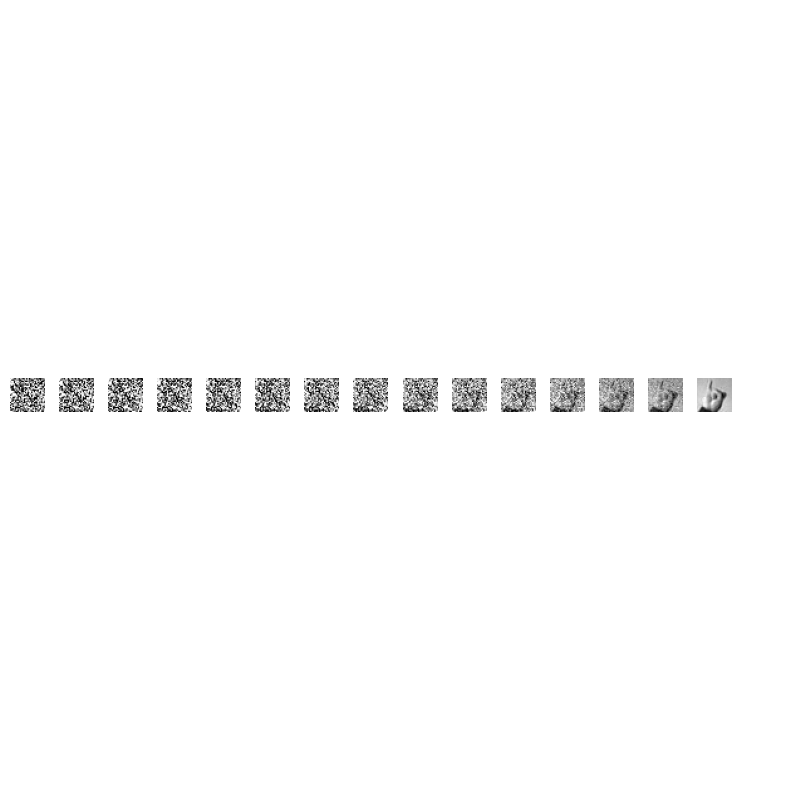

Optimized Model - Epoch 15 | Step 100 | Loss: 0.044552


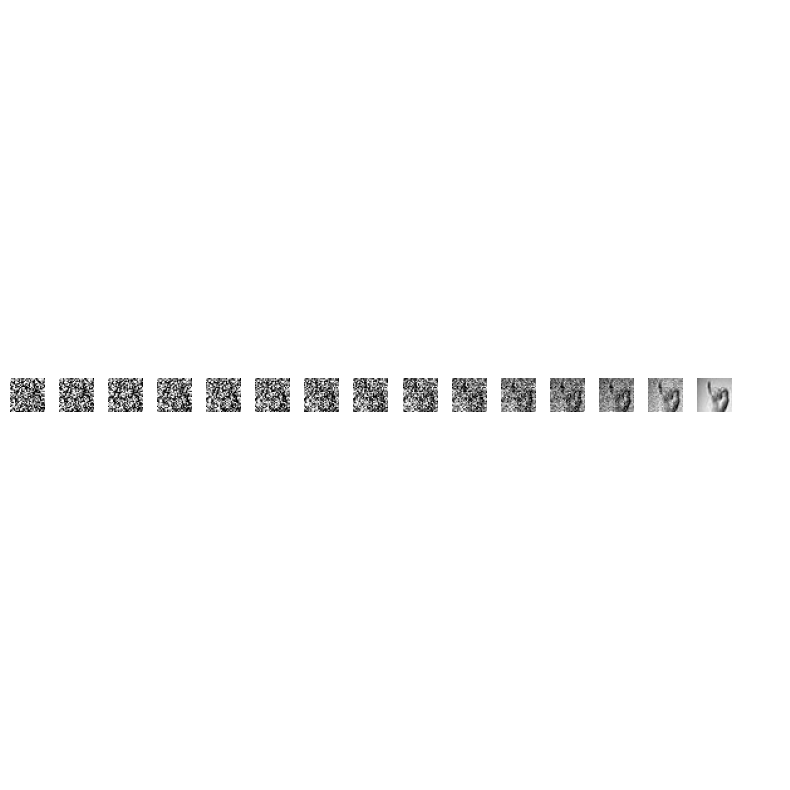

Optimized Model - Epoch 16 | Step 000 | Loss: 0.040660


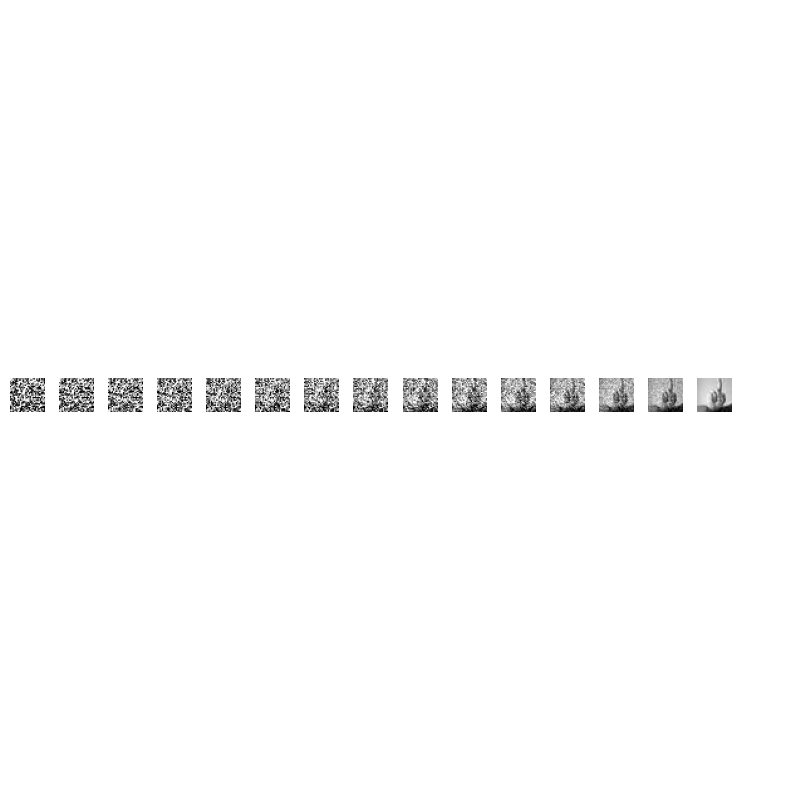

Optimized Model - Epoch 16 | Step 100 | Loss: 0.054808


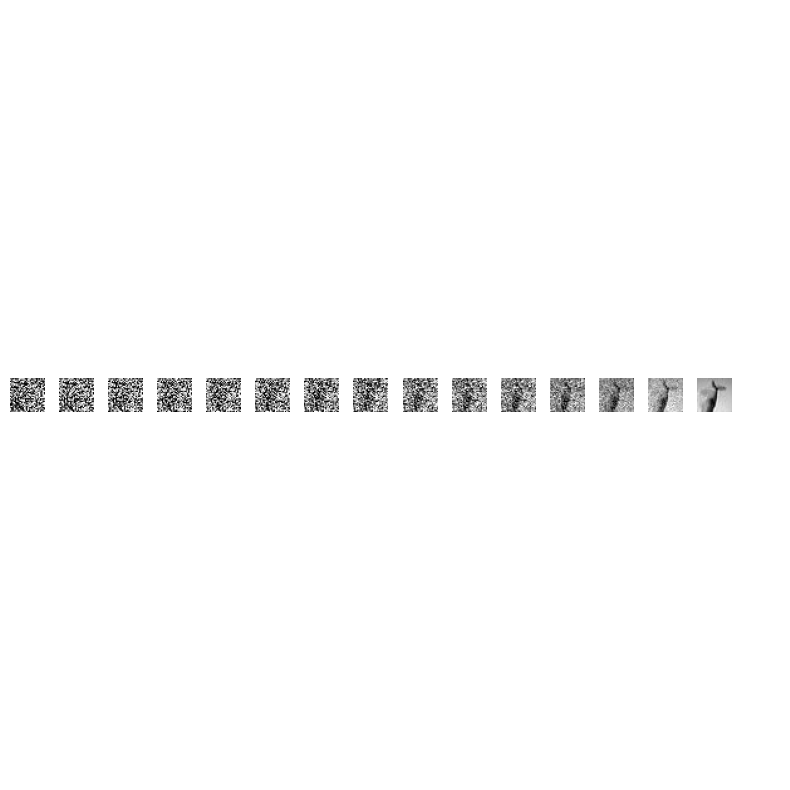

Optimized Model - Epoch 17 | Step 000 | Loss: 0.034067


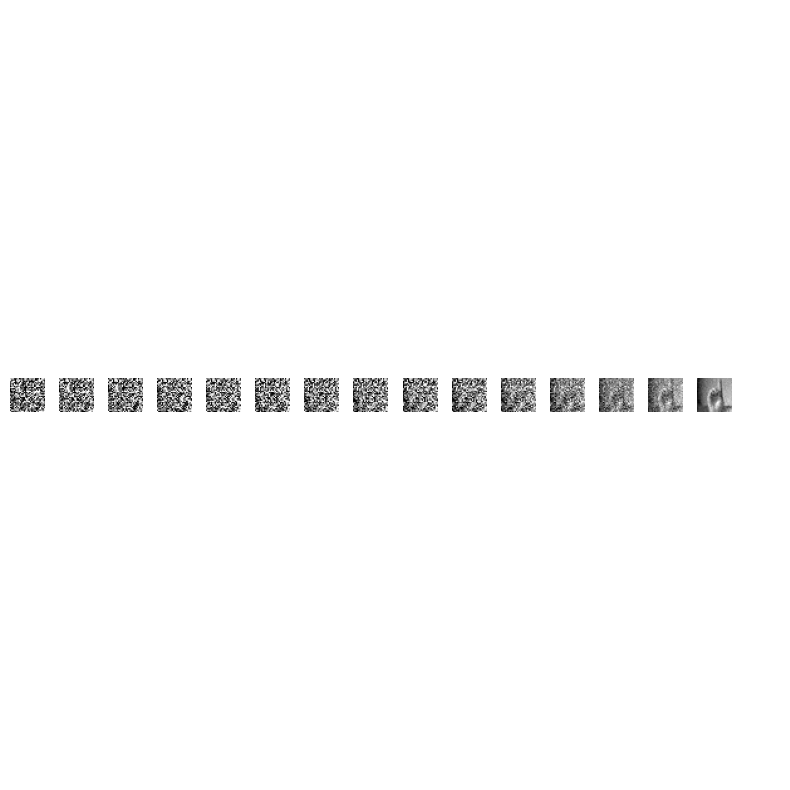

Optimized Model - Epoch 17 | Step 100 | Loss: 0.034015


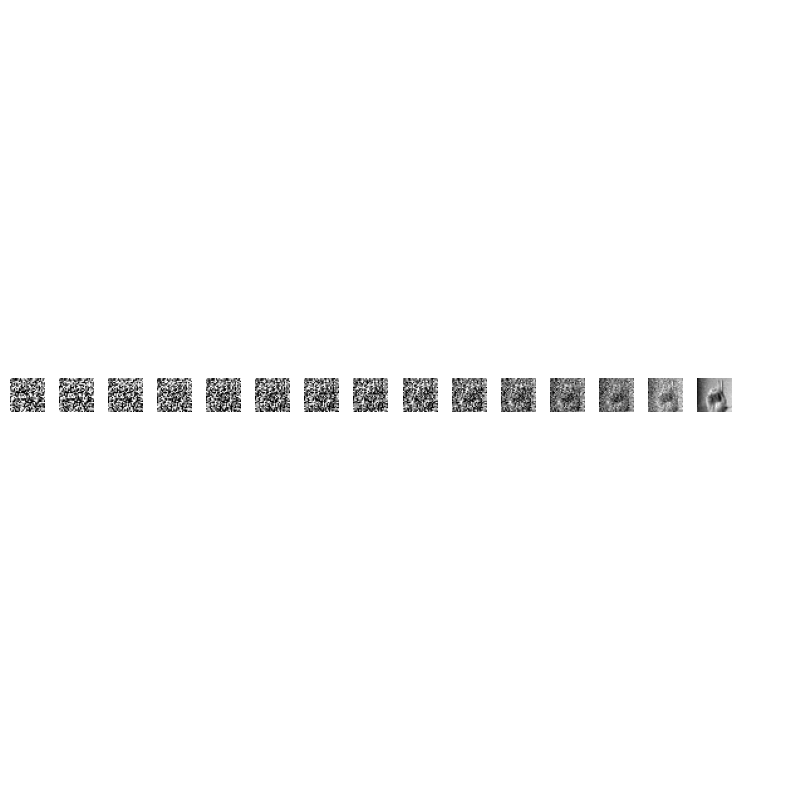

Optimized Model - Epoch 18 | Step 000 | Loss: 0.052739


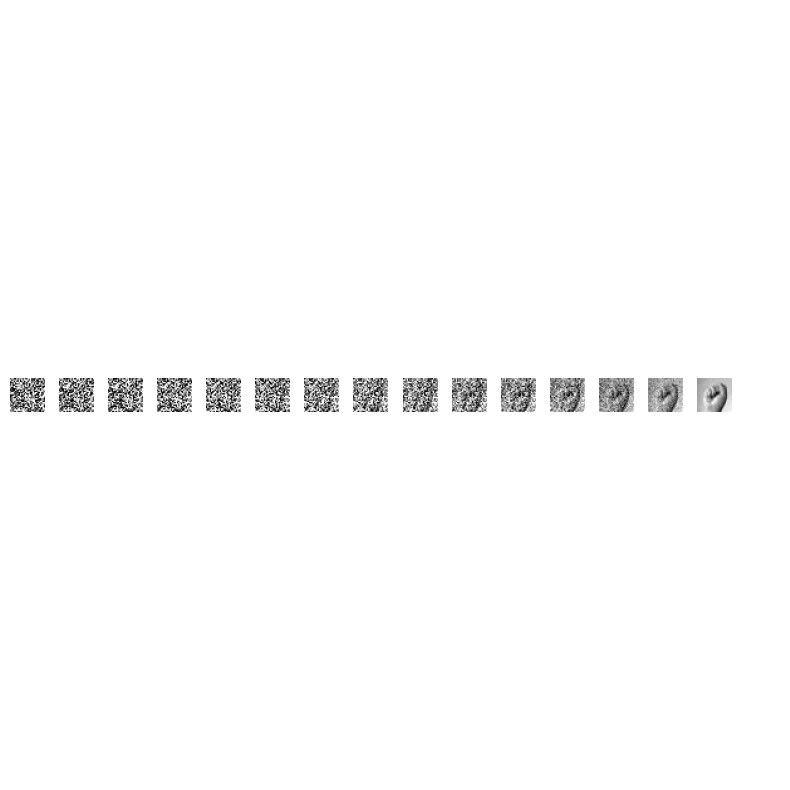

Optimized Model - Epoch 18 | Step 100 | Loss: 0.042361


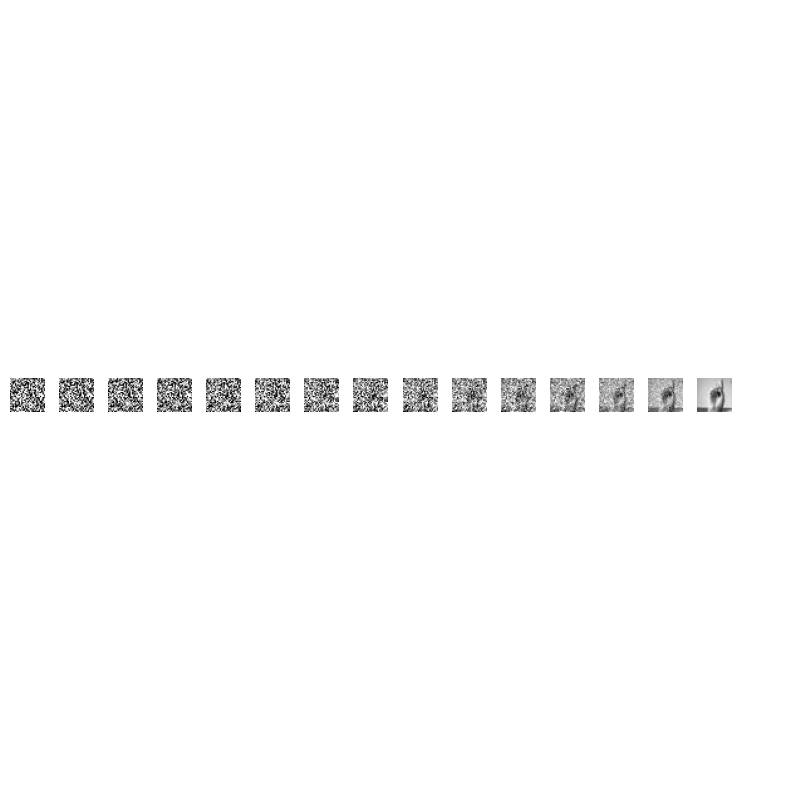

Optimized Model - Epoch 19 | Step 000 | Loss: 0.033821


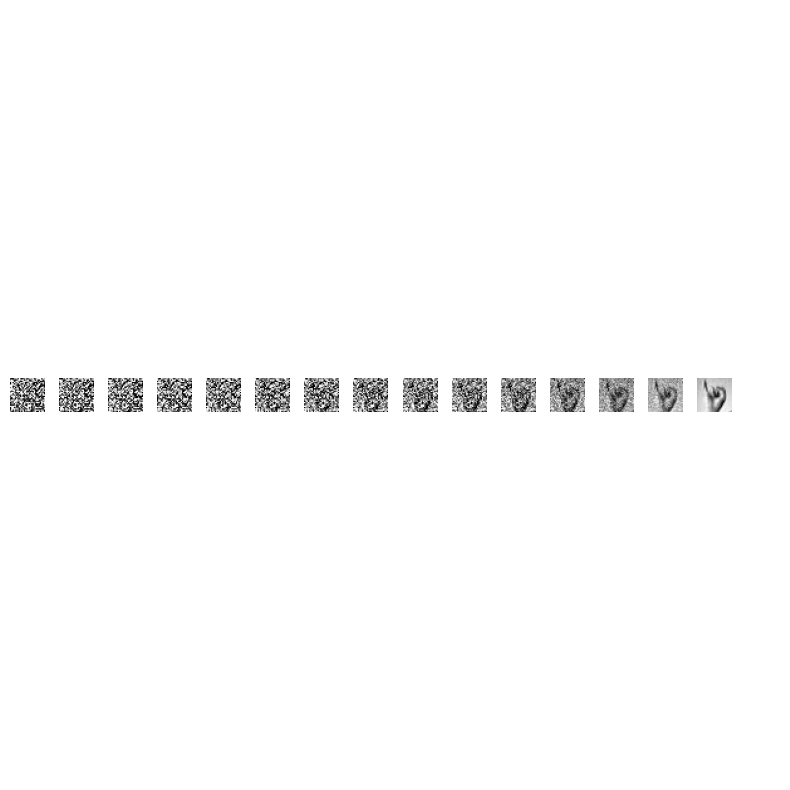

Optimized Model - Epoch 19 | Step 100 | Loss: 0.058087


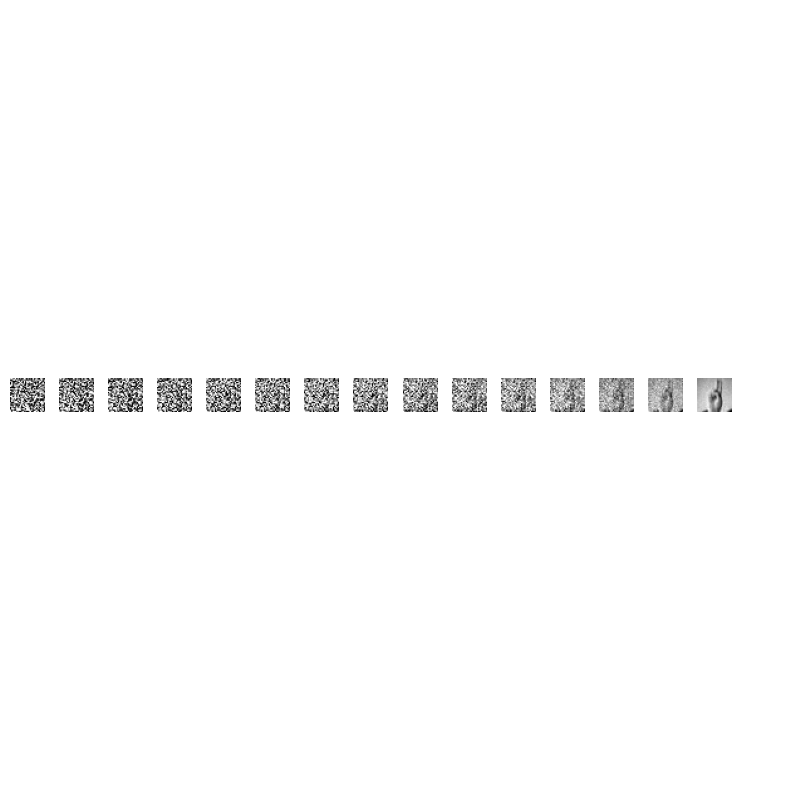

Optimized Model - Epoch 20 | Step 000 | Loss: 0.055765


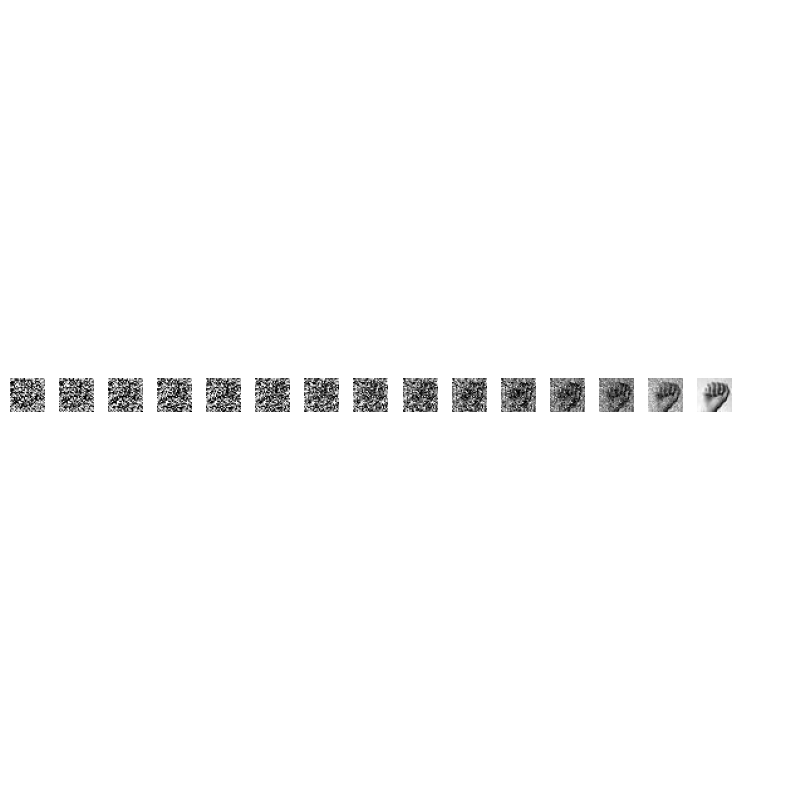

Optimized Model - Epoch 20 | Step 100 | Loss: 0.037896


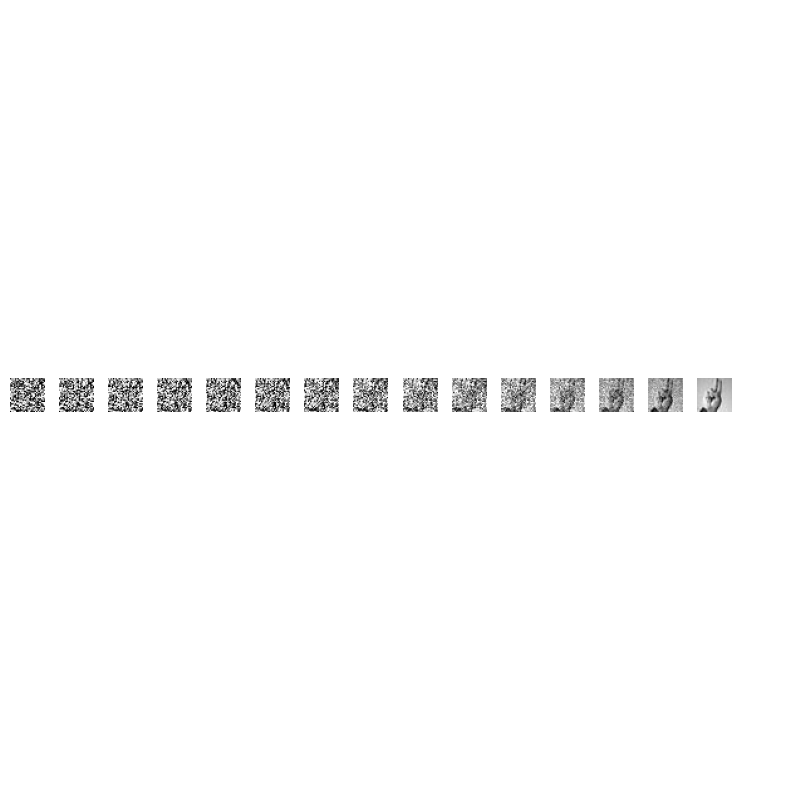

Optimized Model - Epoch 21 | Step 000 | Loss: 0.035062


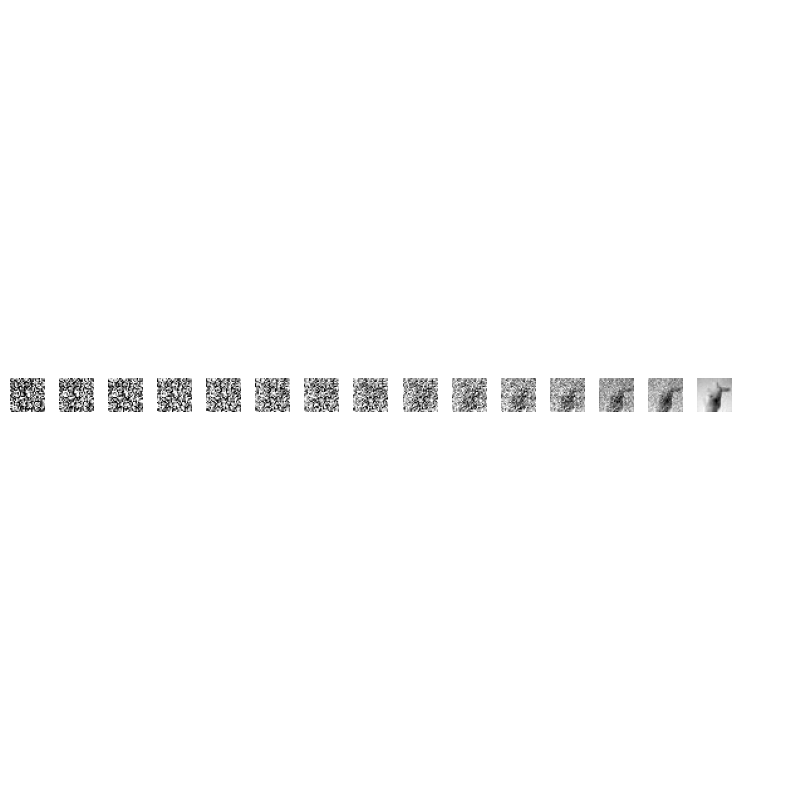

Optimized Model - Epoch 21 | Step 100 | Loss: 0.031515


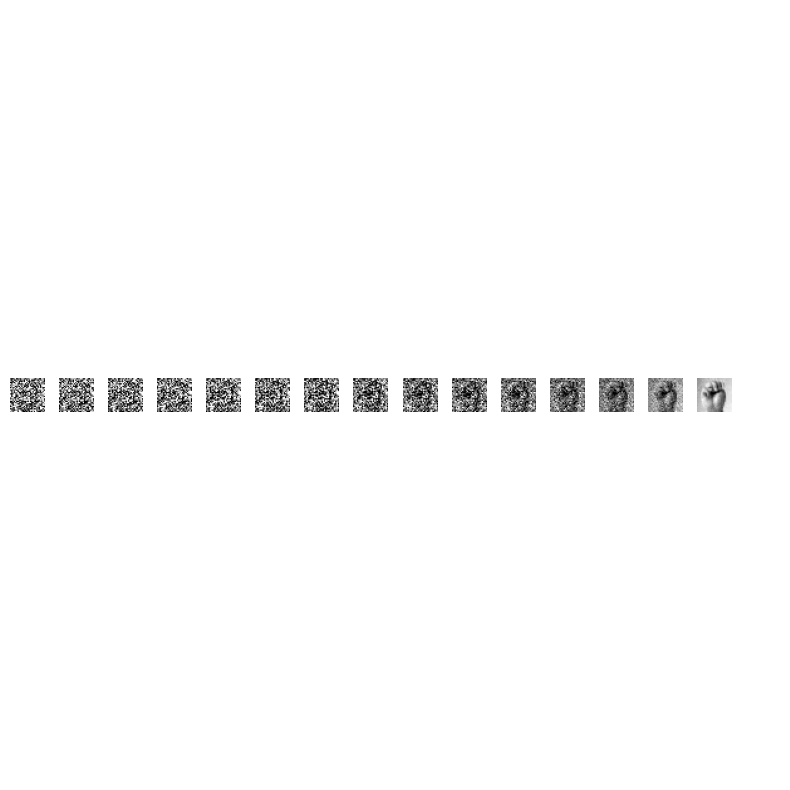

Optimized Model - Epoch 22 | Step 000 | Loss: 0.050012


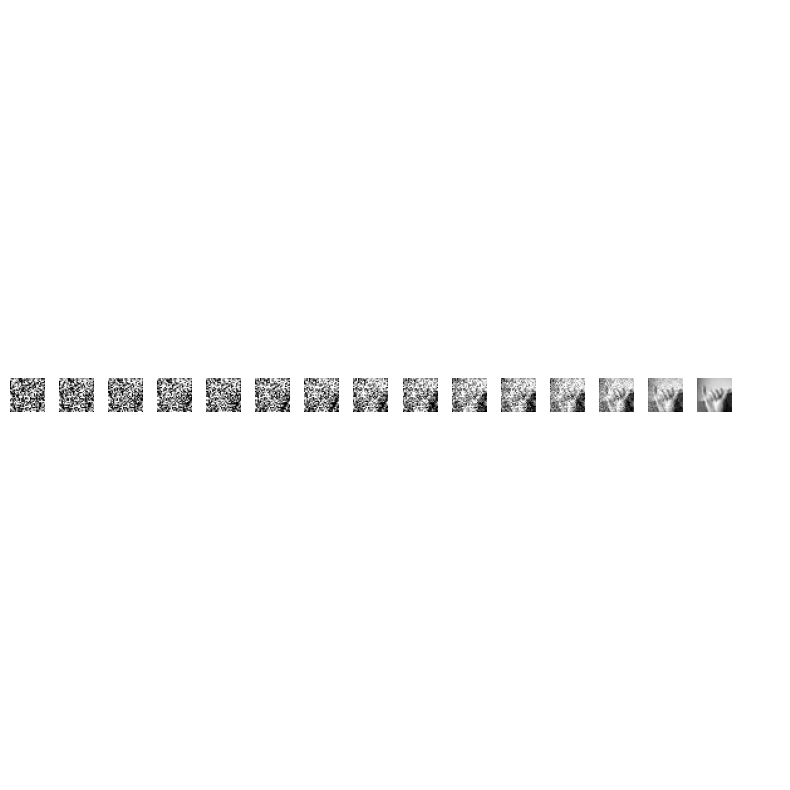

Optimized Model - Epoch 22 | Step 100 | Loss: 0.055649


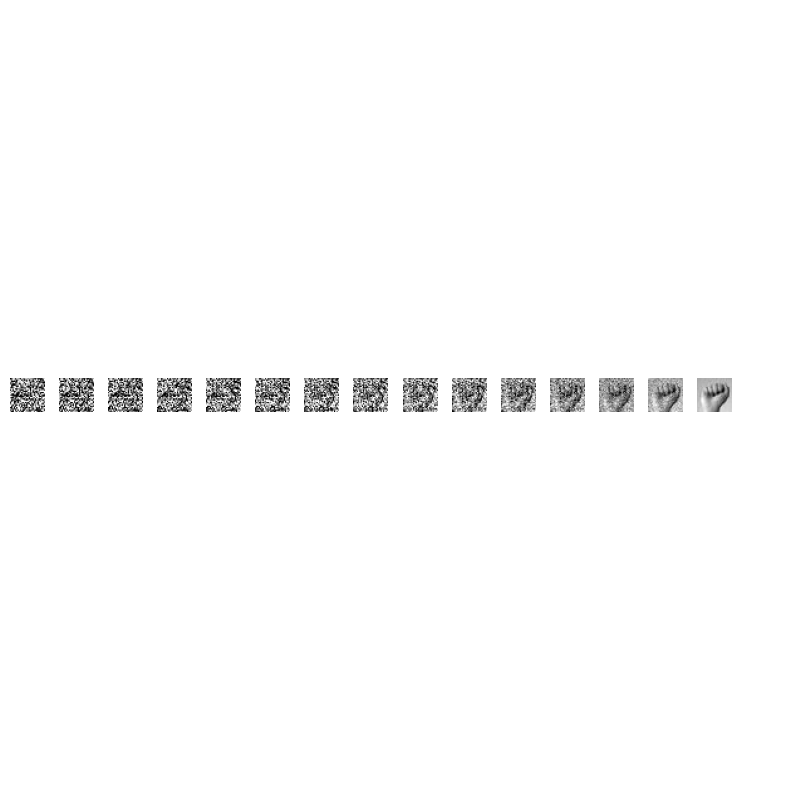

Optimized Model - Epoch 23 | Step 000 | Loss: 0.042275


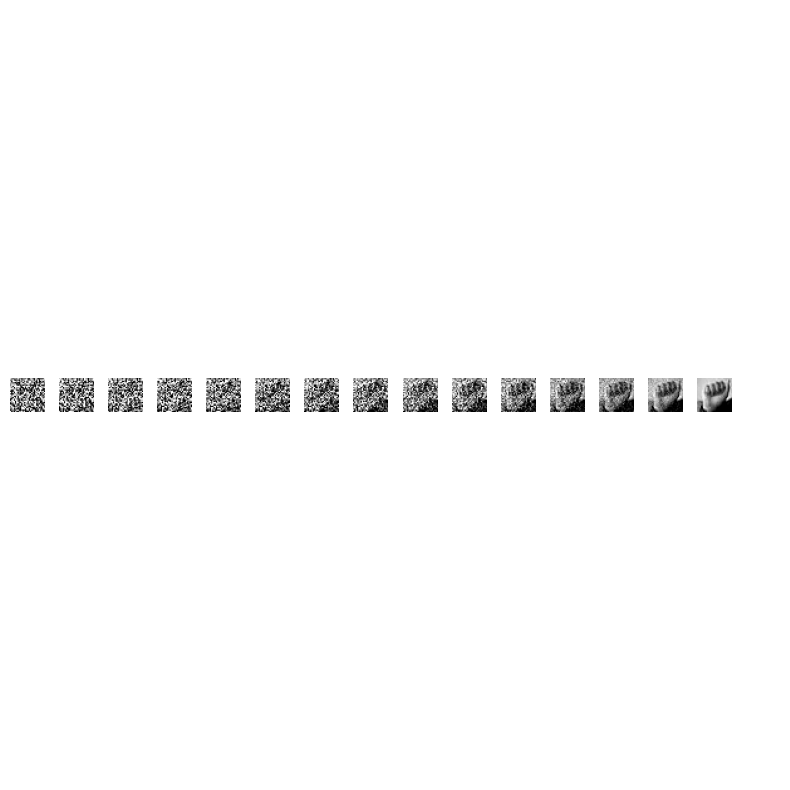

Optimized Model - Epoch 23 | Step 100 | Loss: 0.045519


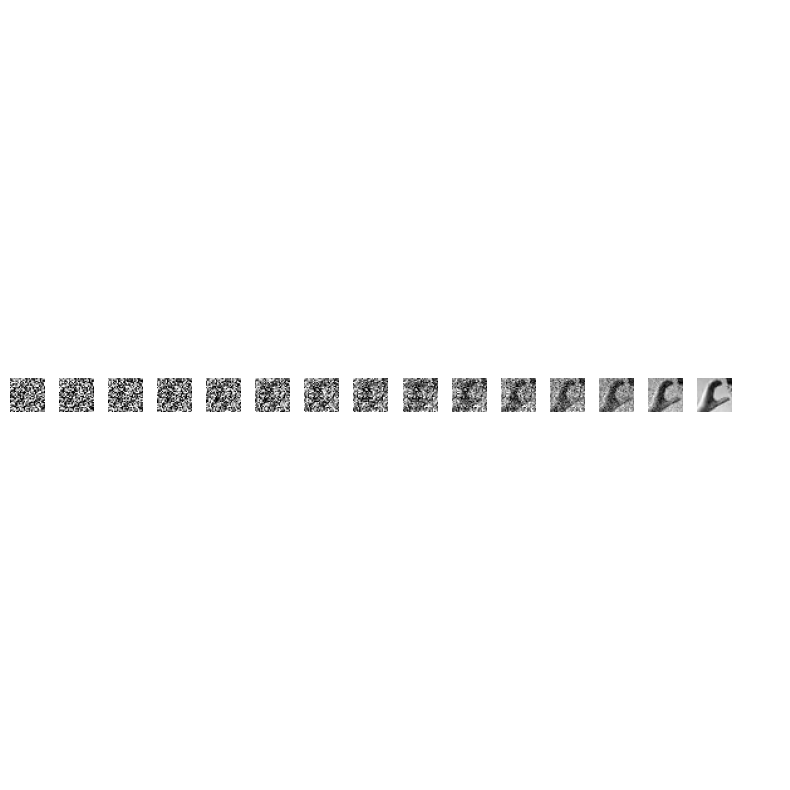

Optimized Model - Epoch 24 | Step 000 | Loss: 0.055718


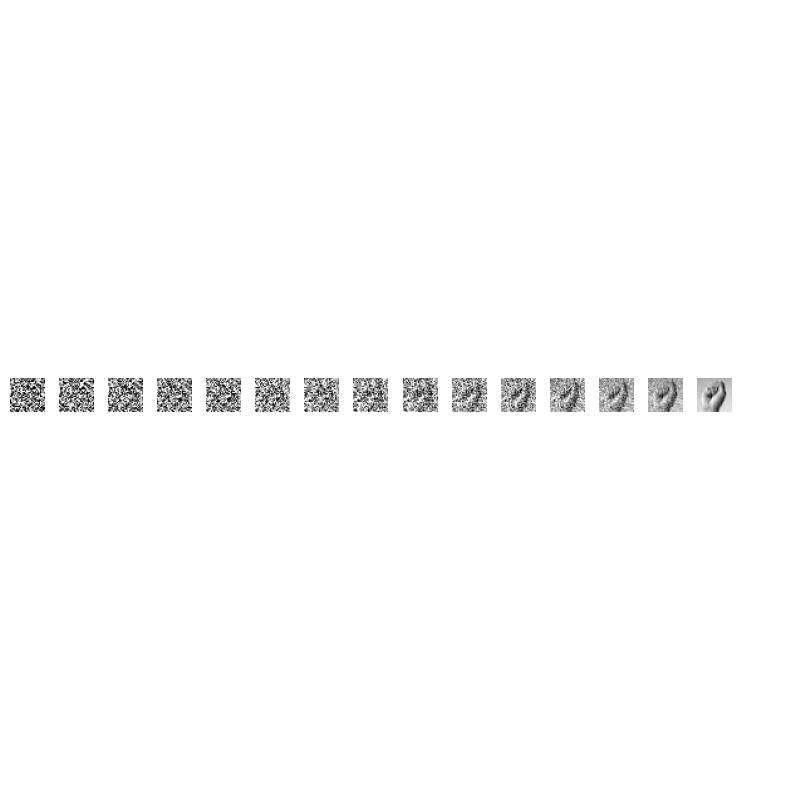

Optimized Model - Epoch 24 | Step 100 | Loss: 0.034444


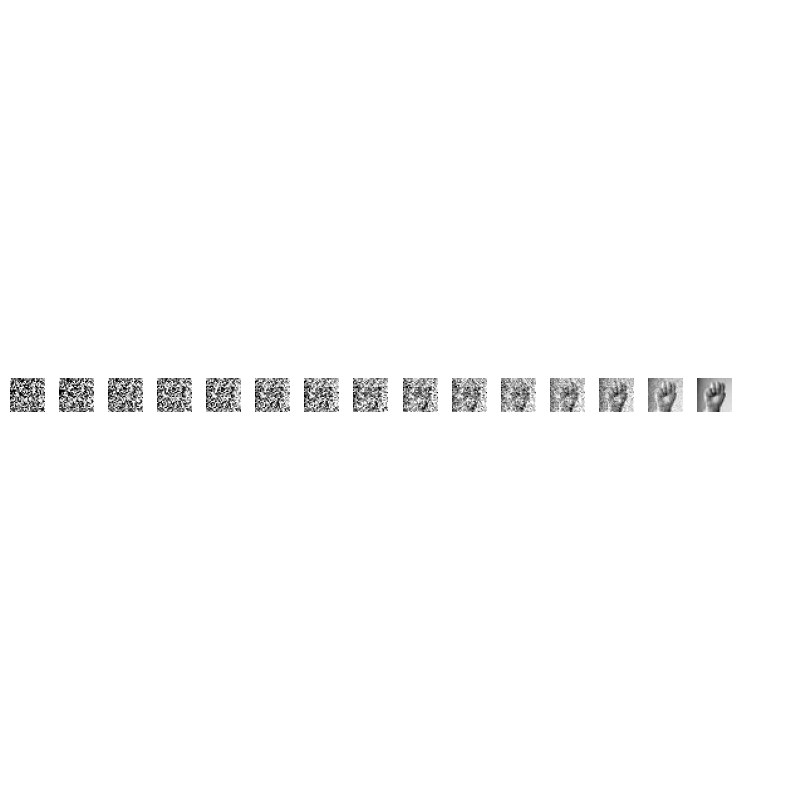

Optimized Model - Epoch 25 | Step 000 | Loss: 0.037217


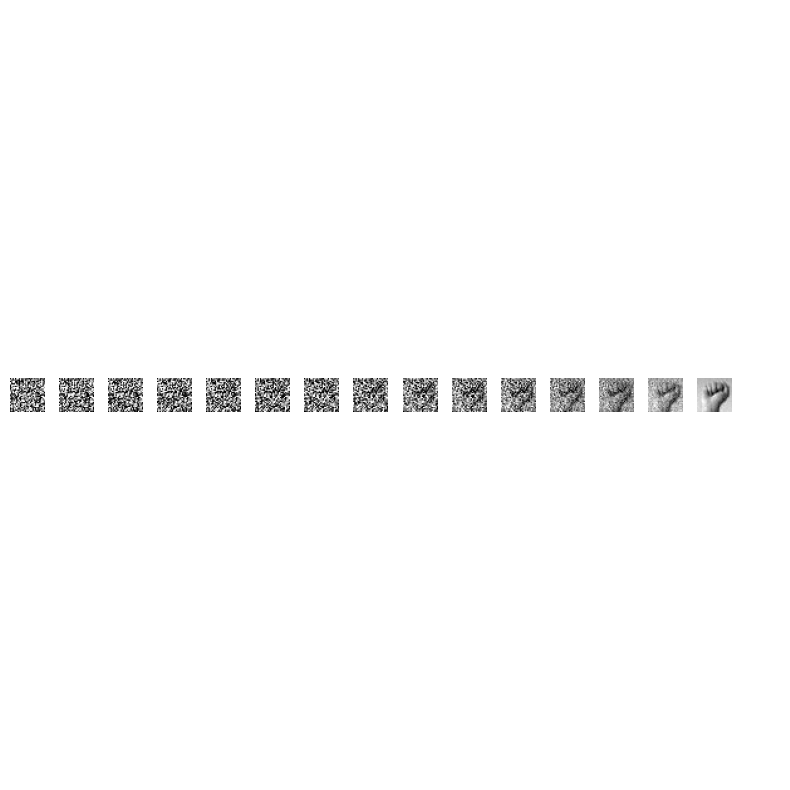

Optimized Model - Epoch 25 | Step 100 | Loss: 0.049357


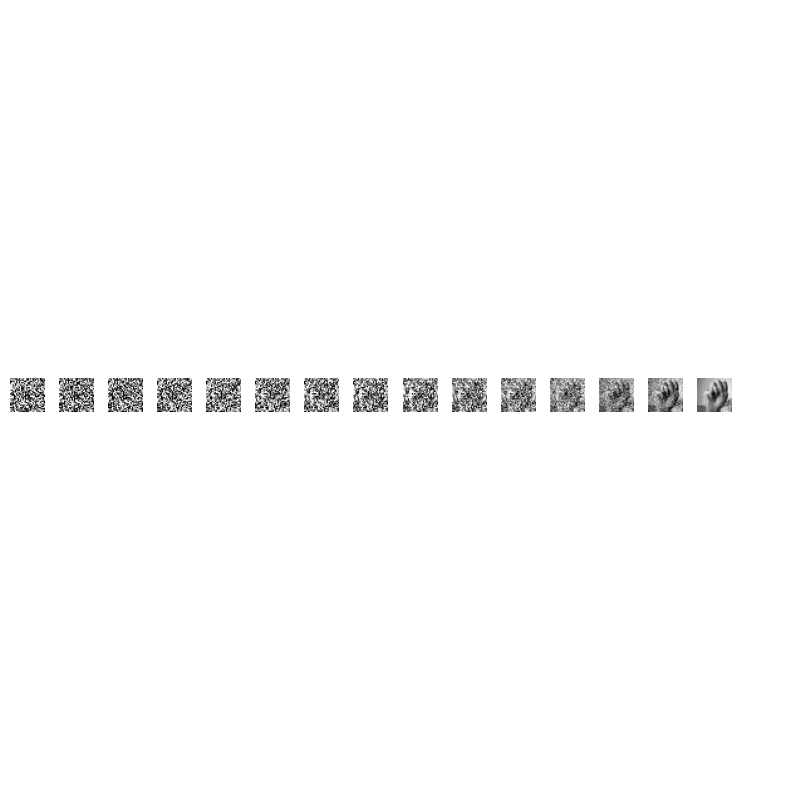

Optimized Model - Epoch 26 | Step 000 | Loss: 0.039256


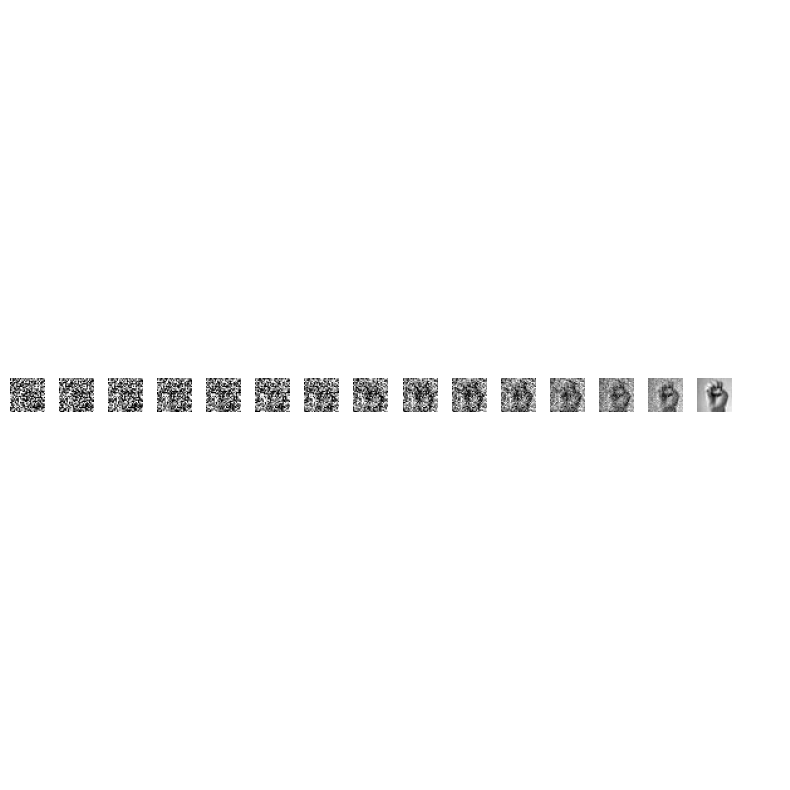

Optimized Model - Epoch 26 | Step 100 | Loss: 0.037070


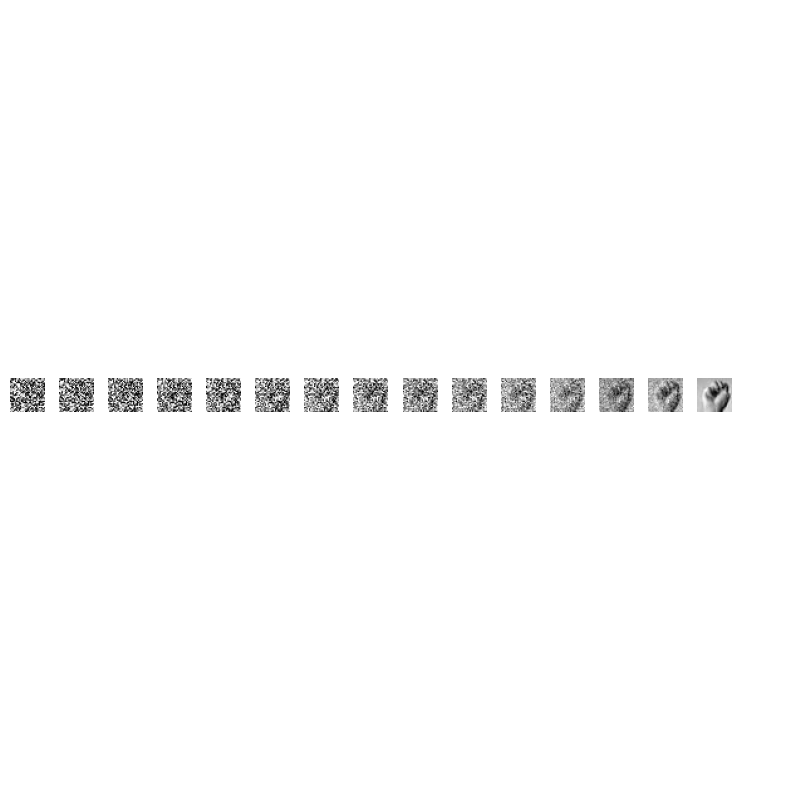

Optimized Model - Epoch 27 | Step 000 | Loss: 0.039942


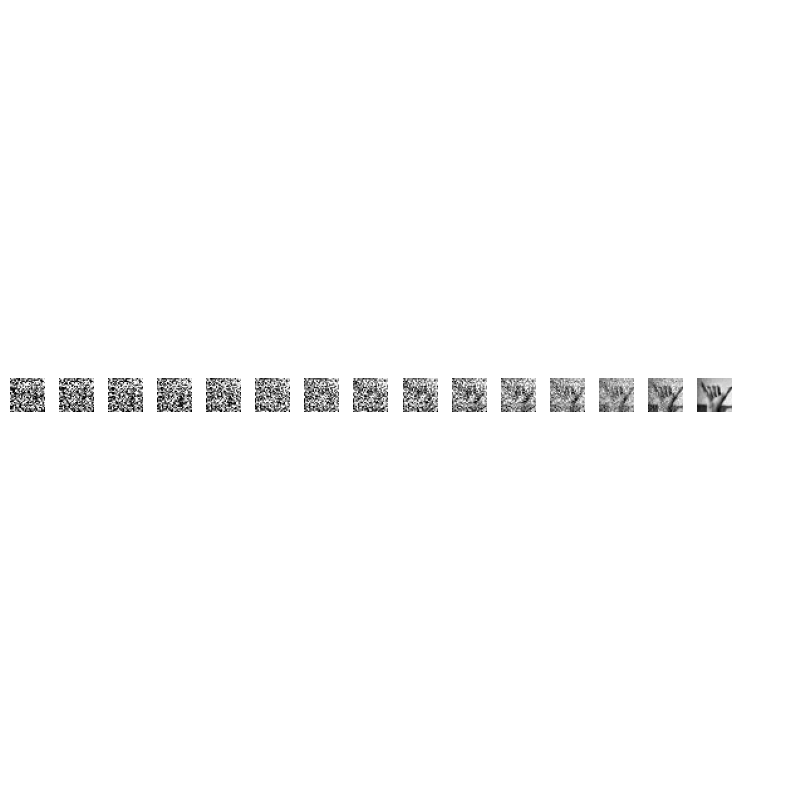

Optimized Model - Epoch 27 | Step 100 | Loss: 0.030381


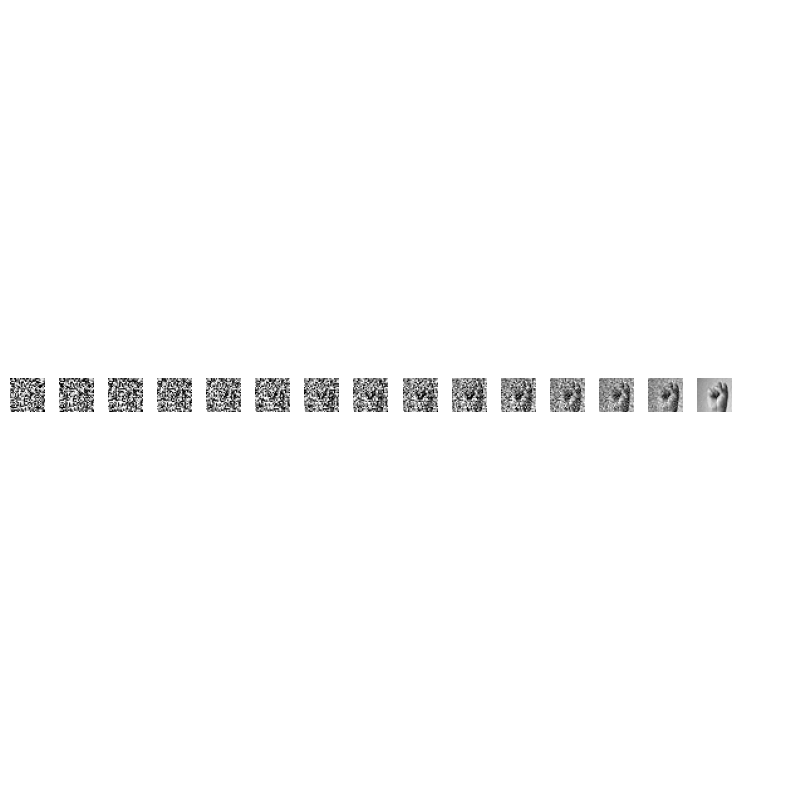

Optimized Model - Epoch 28 | Step 000 | Loss: 0.047995


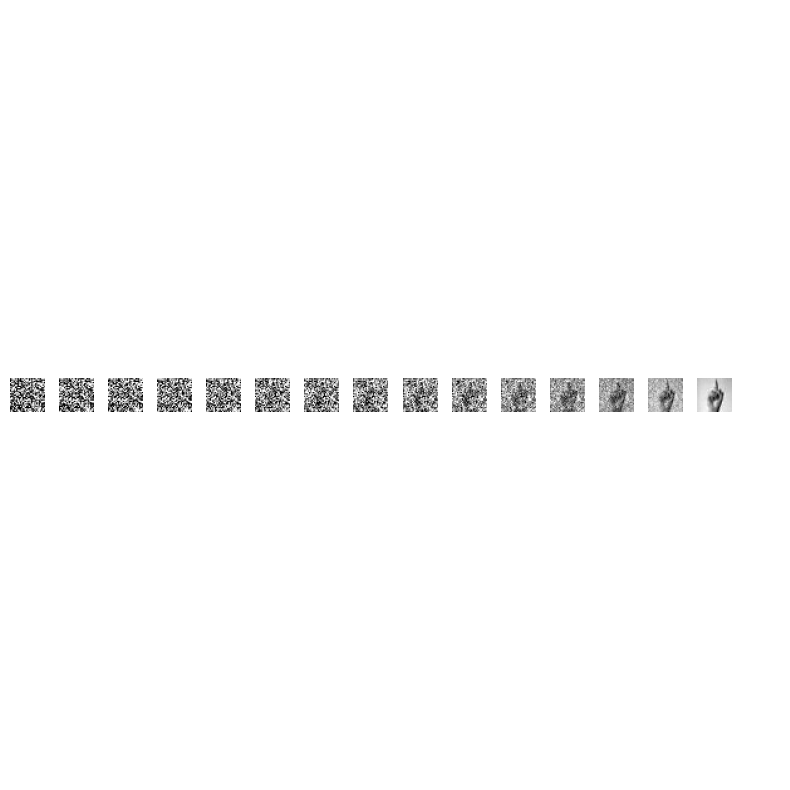

Optimized Model - Epoch 28 | Step 100 | Loss: 0.040531


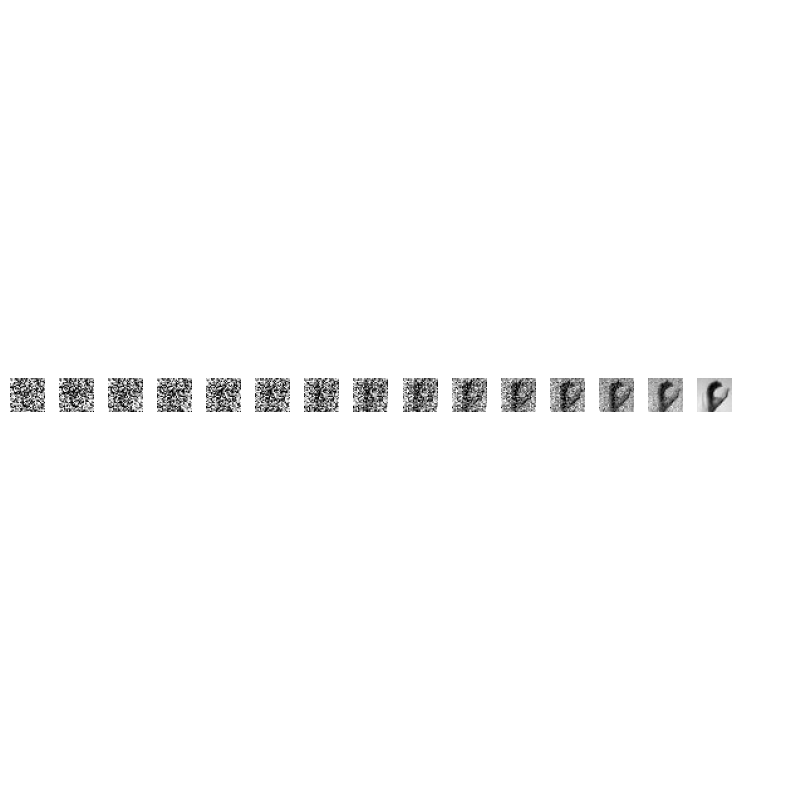

Optimized Model - Epoch 29 | Step 000 | Loss: 0.027660


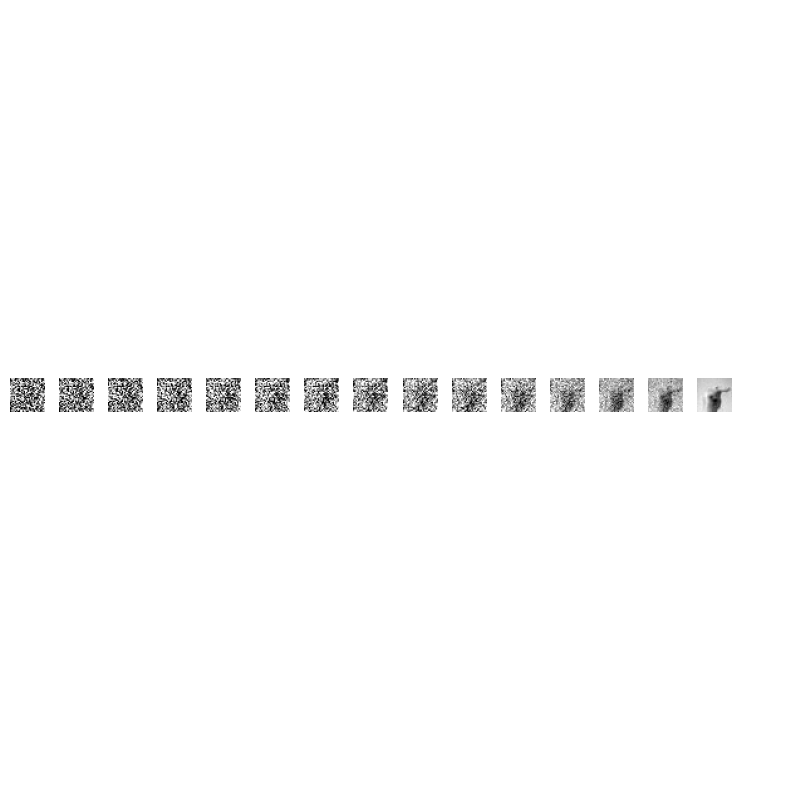

Optimized Model - Epoch 29 | Step 100 | Loss: 0.043452


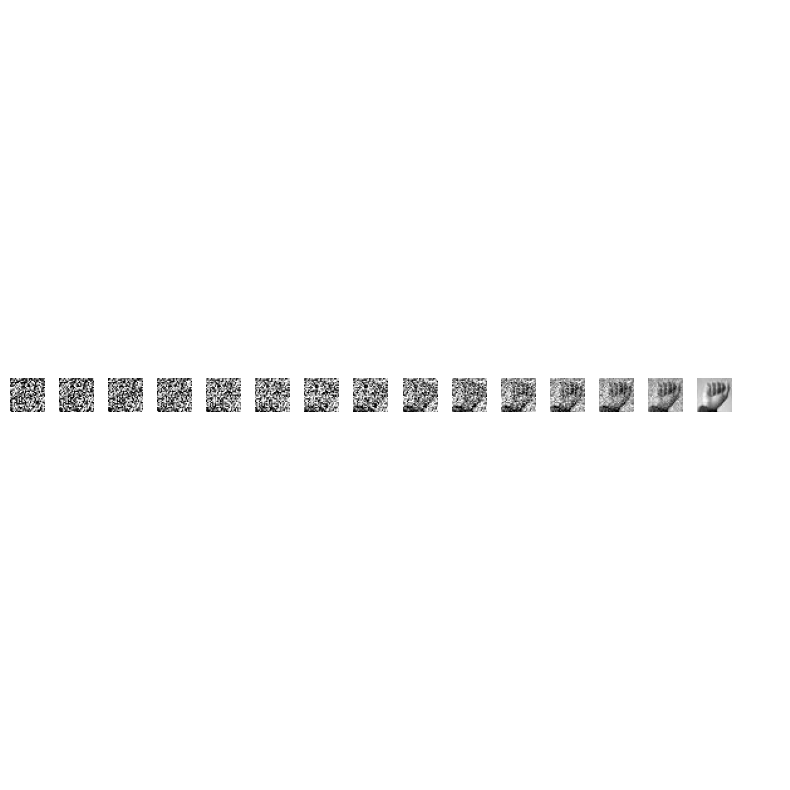

Optimized model training complete!
Final sample:


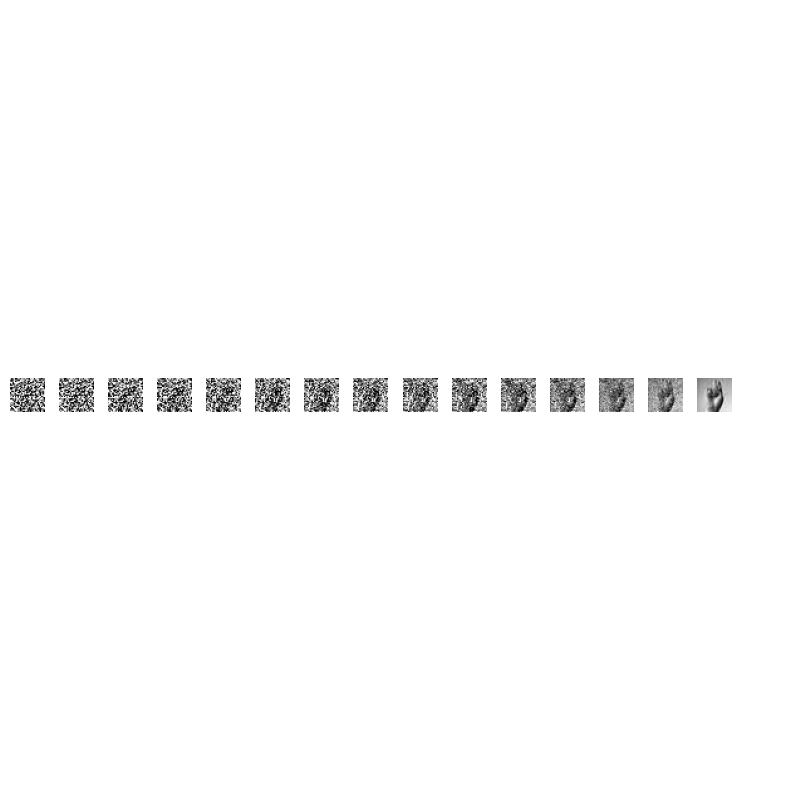

tensor([[[[-2.0346e-01, -1.7351e-01, -1.4041e-01, -1.0229e-01, -1.3115e-01,
           -1.3513e-01, -9.8718e-02, -1.0311e-01, -1.1603e-01, -9.9834e-02,
           -8.3024e-02, -6.5898e-02, -7.4710e-02, -6.7358e-02, -7.0374e-02,
           -8.2987e-02, -5.2009e-02, -2.9823e-02, -7.8677e-02, -1.9344e-02,
           -5.3645e-02, -2.9143e-02, -9.4113e-02, -4.3598e-02, -2.9413e-02,
           -4.9981e-02, -3.0364e-02, -3.3997e-02],
          [-1.7269e-01, -1.5047e-01, -1.1806e-01, -1.1753e-01, -1.1078e-01,
           -1.0847e-01, -5.6448e-02, -6.2410e-02, -6.9394e-02, -9.1946e-02,
           -2.3107e-02, -6.4031e-02, -4.0208e-02, -3.9029e-02, -1.6830e-02,
           -2.9345e-02, -3.9564e-02, -3.4235e-03, -2.1912e-03, -6.9285e-02,
           -3.1439e-02, -1.9084e-02,  2.5805e-02, -2.0227e-02, -2.7482e-02,
           -3.7054e-02, -1.8183e-02, -7.9075e-03],
          [-1.3561e-01, -1.3347e-01, -1.1910e-01, -9.5758e-02, -5.9780e-02,
           -6.6632e-02, -6.8149e-02, -7.7526e-02, -3.5161e-02,

In [28]:
# Training hyperparameters
optimizer_optimized = Adam(model_optimized.parameters(), lr=0.0005)
epochs_optimized = 30
ncols = 15

# Training loop
model_optimized.train()
for epoch in range(epochs_optimized):
    for step, batch in enumerate(dataloader):
        optimizer_optimized.zero_grad()

        t = torch.randint(0, T, (BATCH_SIZE,), device=device)  # Random timesteps
        x = batch[0].to(device)
        labels = batch[1].to(device)  # Class labels for conditional generation
        
        loss = get_loss(model_optimized, x, t, labels)
        loss.backward()
        optimizer_optimized.step()

        # Sample images during training
        if epoch % 1 == 0 and step % 100 == 0:
            print(f"Optimized Model - Epoch {epoch} | Step {step:03d} | Loss: {loss.item():.6f}")
            model_optimized.eval()
            random_class = torch.randint(0, NUM_CLASSES, (1,)).item()
            sample_images(model_optimized, ncols, class_label=random_class)
            model_optimized.train()
            
print("Optimized model training complete!")
print("Final sample:")
model_optimized.eval()
sample_images(model_optimized, ncols)

### 3.6 Evaluation

I generated multiple samples to evaluate the optimized model's performance.

<Figure size 800x800 with 0 Axes>

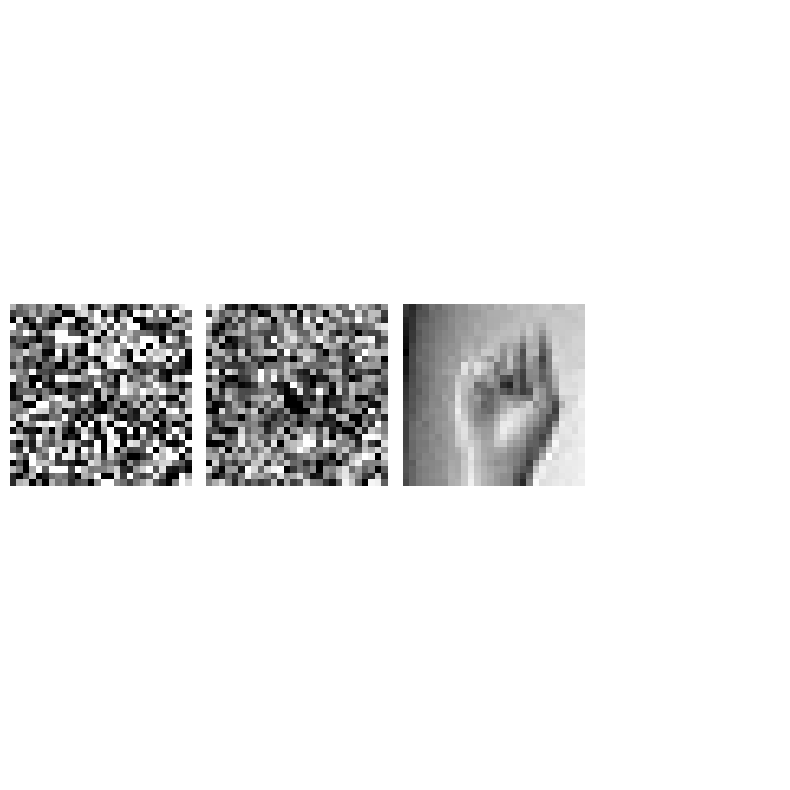

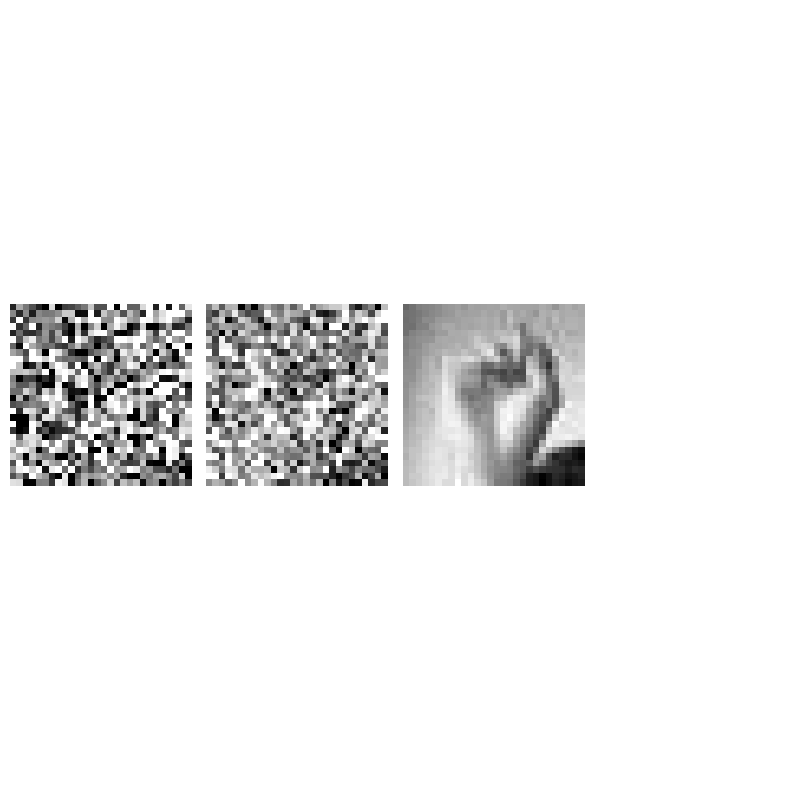

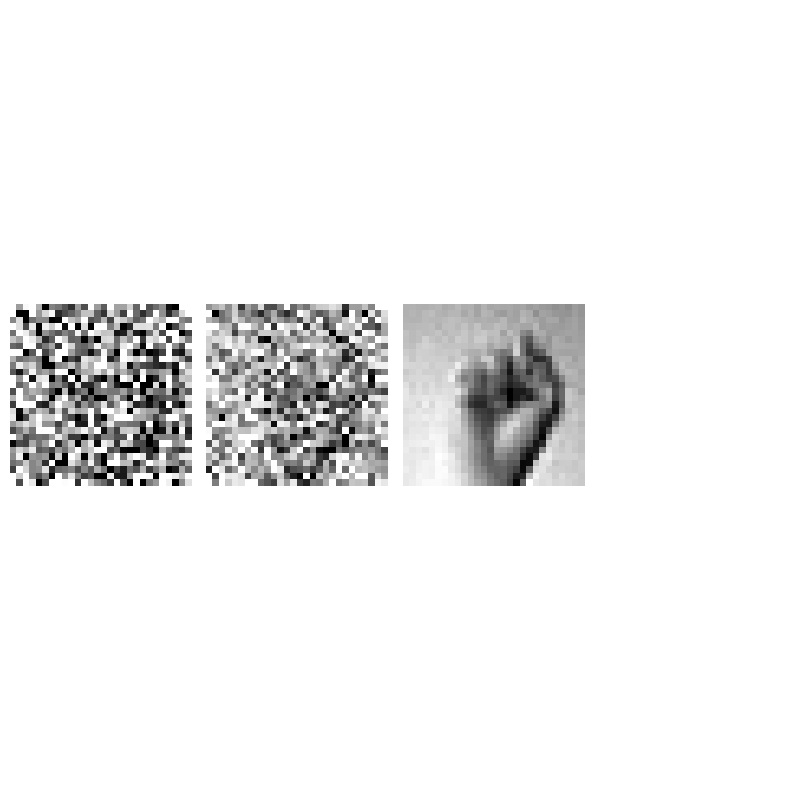

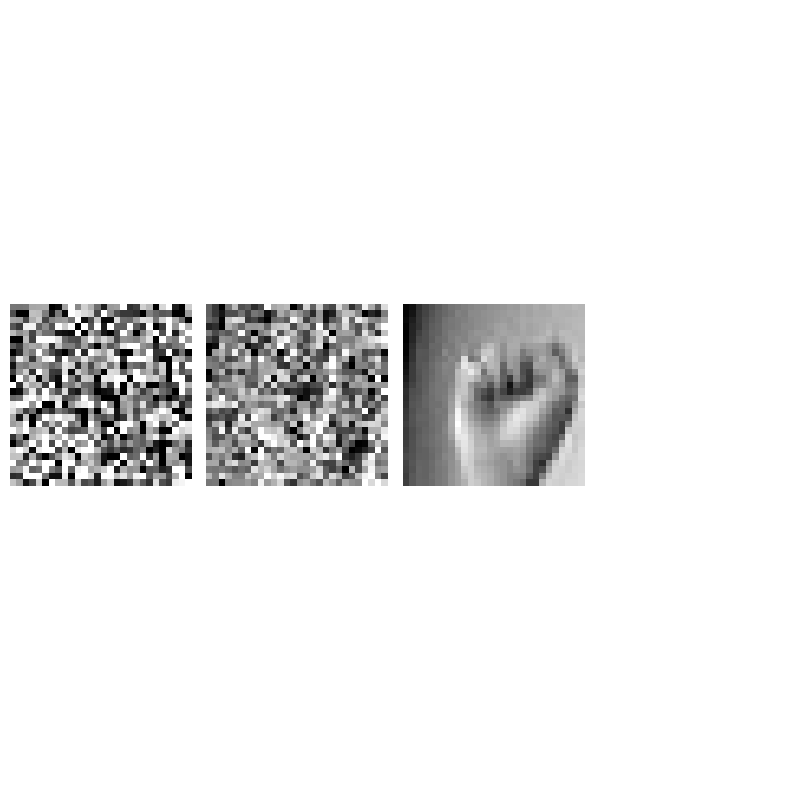

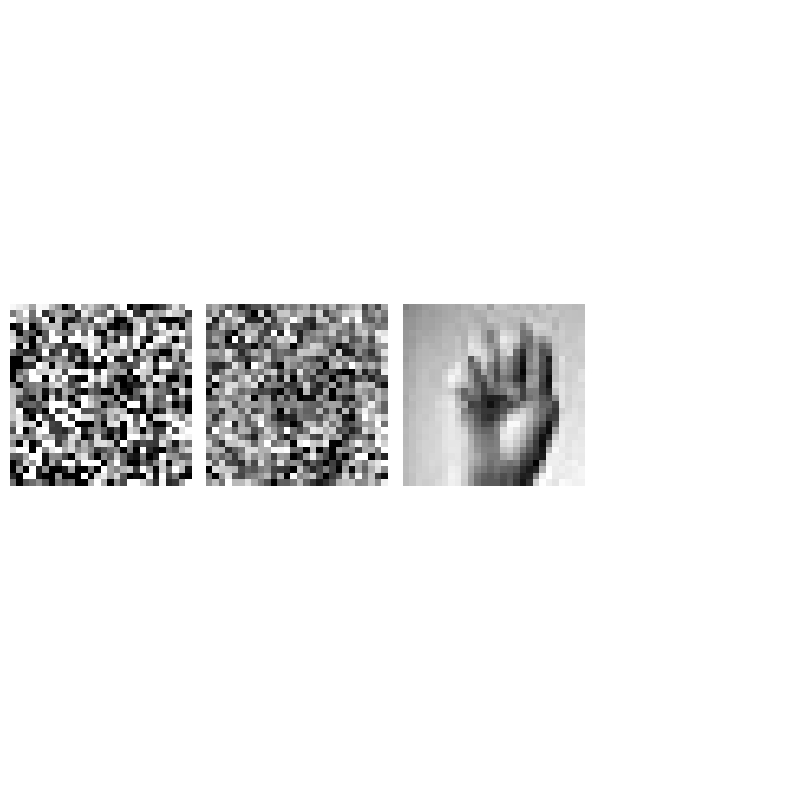

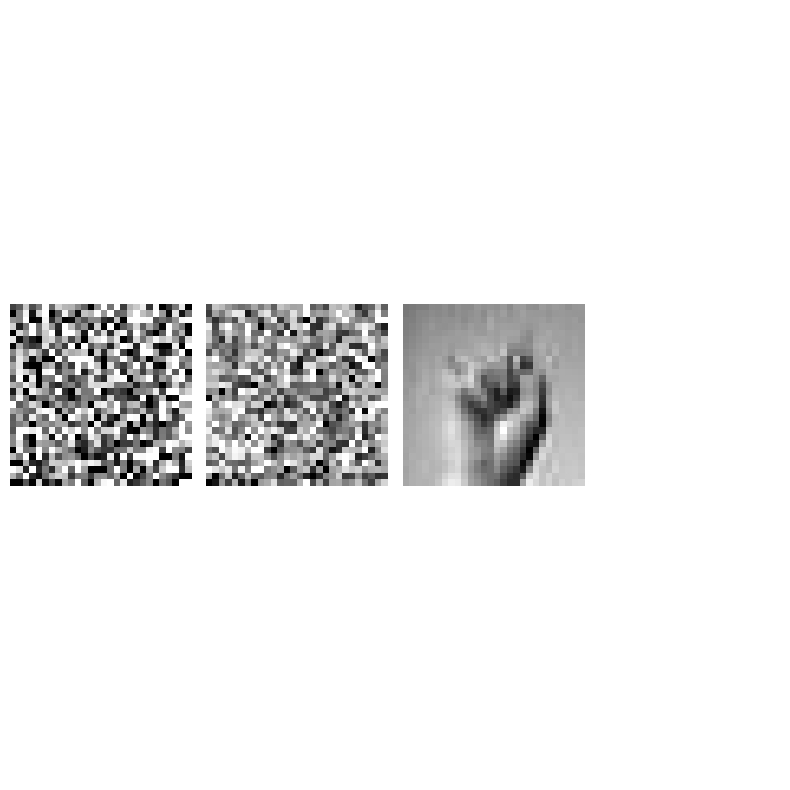

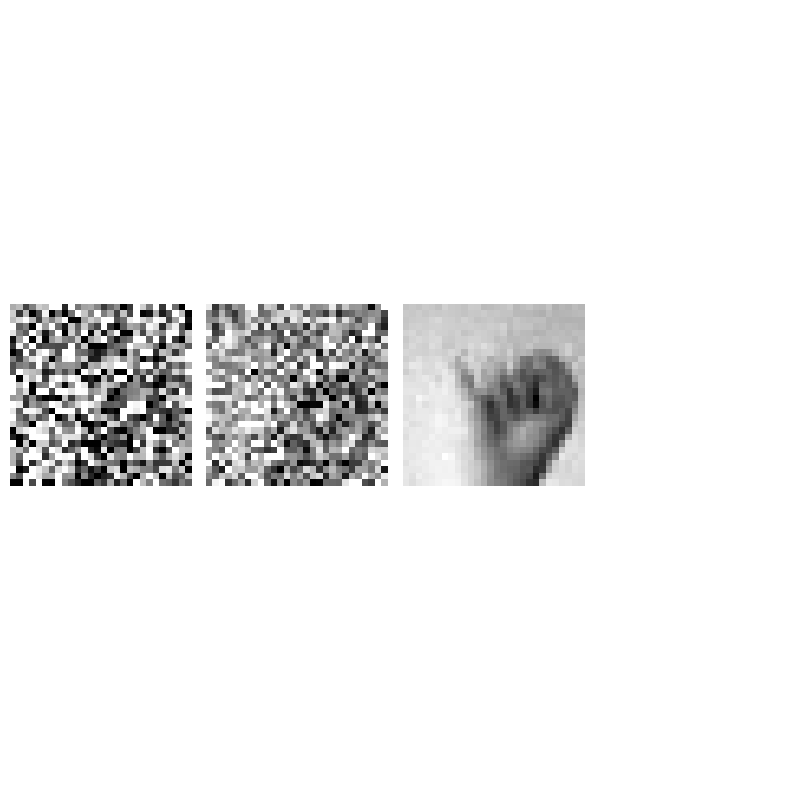

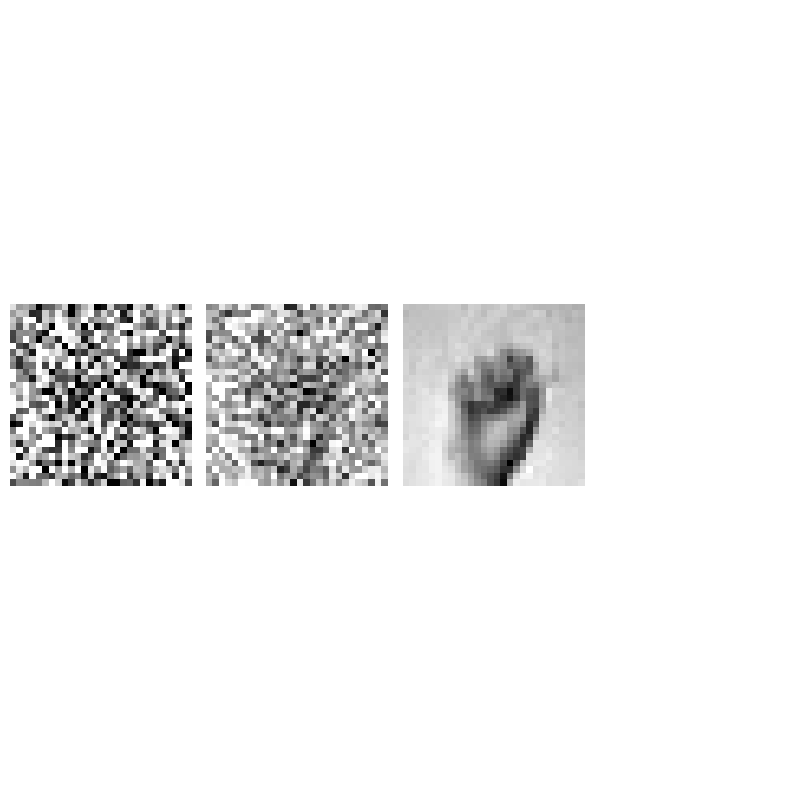

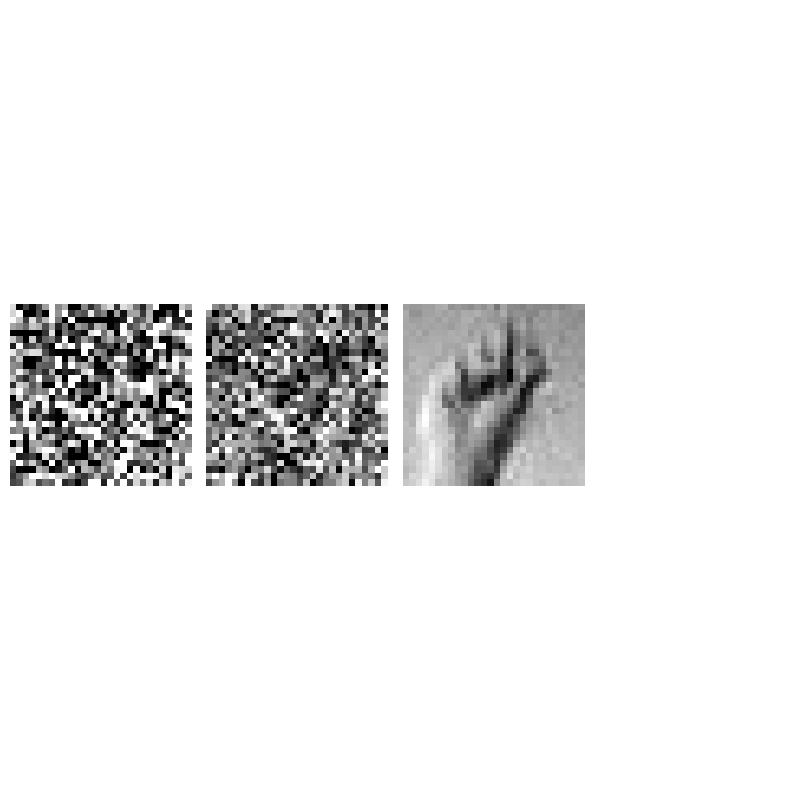

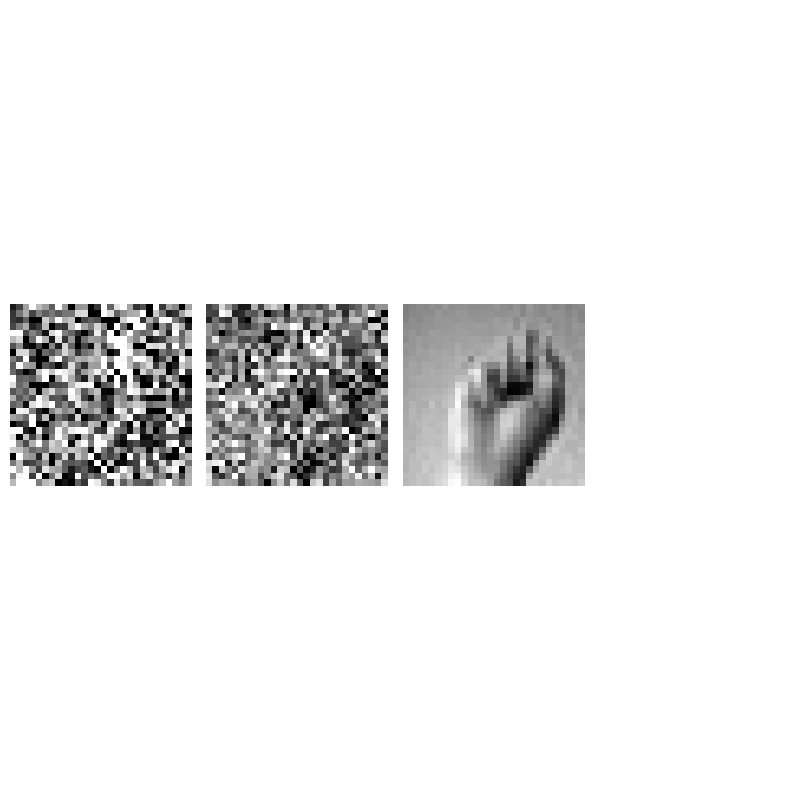

In [29]:
# Generate 10 sample sets for evaluation
model_optimized.eval()
plt.figure(figsize=(8,8))
ncols = 3
for _ in range(10):
    sample_images(model_optimized, ncols)

## 4. Tuned Hyperparameters Model

I fine-tuned the optimized model by adjusting hyperparameters based on what I learned from the baseline and optimized models.

### 4.1 Load Pre-trained Model

I loaded the trained optimized model as the starting point for hyperparameter tuning.

In [30]:
# Load optimized model as starting point for hyperparameter tuning
model_tuned = OptimizedUNet(num_classes=NUM_CLASSES)
model_tuned.load_state_dict(model_optimized.state_dict())
model_tuned = model_tuned.to(device)

print("Hyperparameter-Tuned Model - Num params: ", sum(p.numel() for p in model_tuned.parameters()))
print("Loaded weights from optimized model")

Hyperparameter-Tuned Model - Num params:  2525953
Loaded weights from optimized model


### 4.2 Hyperparameters

After analyzing the baseline and optimized models, I tuned these hyperparameters for better performance.

In [31]:
# Tuned hyperparameters based on previous model analysis
TUNED_LR = 0.0003  # Lower LR for finer weight updates
TUNED_BATCH_SIZE = 96  # Smaller batch = more gradient updates
TUNED_EPOCHS = 50  # More epochs for better convergence

# Learning rate scheduler: reduces LR during training
SCHEDULER_STEP = 12  # Reduce every 12 epochs
SCHEDULER_GAMMA = 0.7  # Reduce by 30%

# Gradient clipping: prevents gradient explosion
MAX_GRAD_NORM = 1.0

# Create dataloader with tuned batch size
dataloader_tuned = DataLoader(data, batch_size=TUNED_BATCH_SIZE, shuffle=True, drop_last=True)

### 4.3 Setup Optimizer and Scheduler

I set up the optimizer with tuned learning rate and added a learning rate scheduler for adaptive training.

In [32]:
# Setup optimizer and learning rate scheduler
optimizer_tuned = Adam(model_tuned.parameters(), lr=TUNED_LR)
scheduler_tuned = torch.optim.lr_scheduler.StepLR(
    optimizer_tuned,
    step_size=SCHEDULER_STEP,
    gamma=SCHEDULER_GAMMA
)

print(f"Optimizer created with learning rate: {TUNED_LR}")
print(f"Scheduler: Reduce LR every {SCHEDULER_STEP} epochs by {(1-SCHEDULER_GAMMA)*100:.0f}%")

Optimizer created with learning rate: 0.0003
Scheduler: Reduce LR every 12 epochs by 30%


### 4.4 Training

I trained for 50 epochs with tuned hyperparameters: LR 0.0003 (with scheduler), batch size 96, and gradient clipping. The scheduler reduces LR during training for better fine-tuning.

Starting Hyperparameter-Tuned Model Training
Epochs: 50 | LR: 0.0003 | Batch Size: 96

Epoch 0 | Step 000 | Loss: 0.042429 | LR: 0.00030000


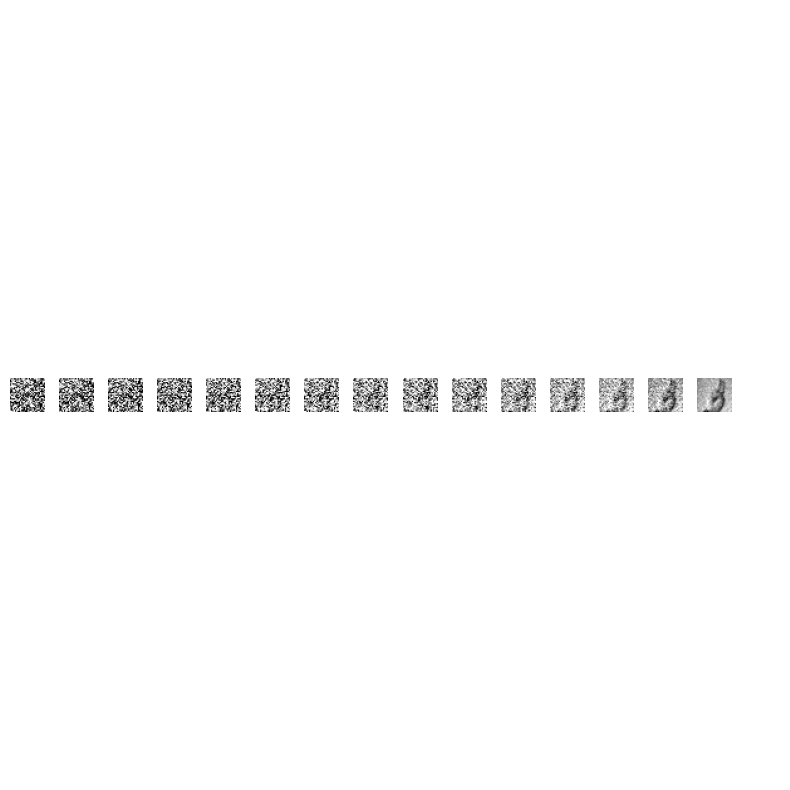

Epoch 0 | Step 100 | Loss: 0.033983 | LR: 0.00030000


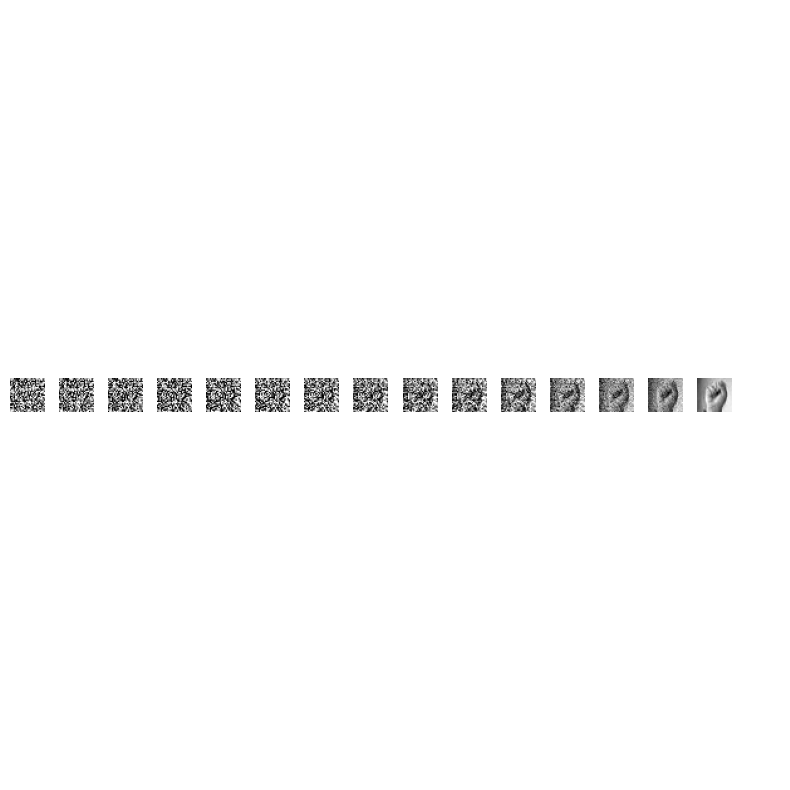

Epoch 1 | Step 000 | Loss: 0.039794 | LR: 0.00030000


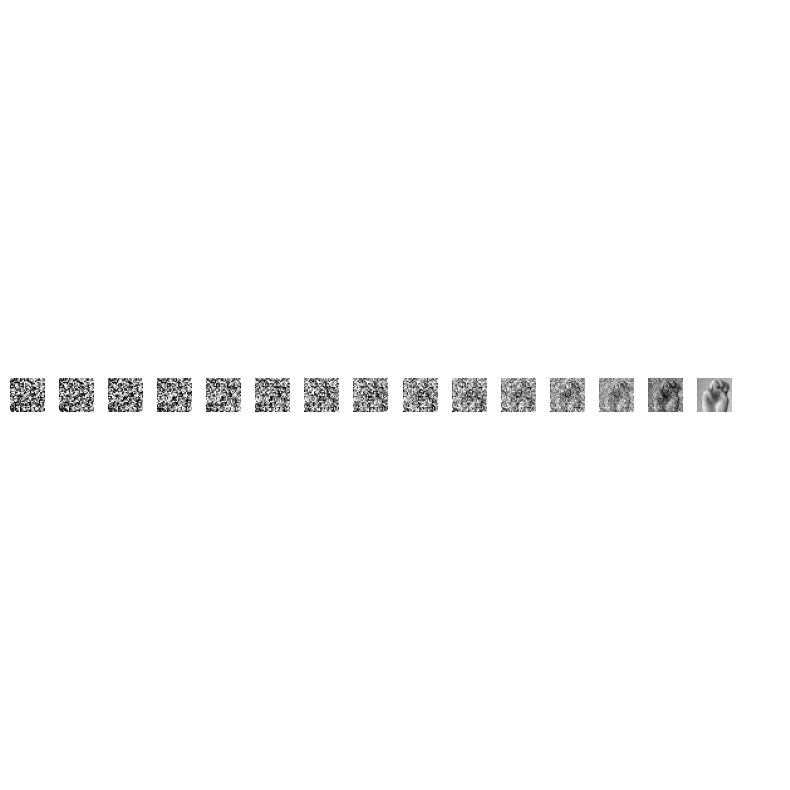

Epoch 1 | Step 100 | Loss: 0.020217 | LR: 0.00030000


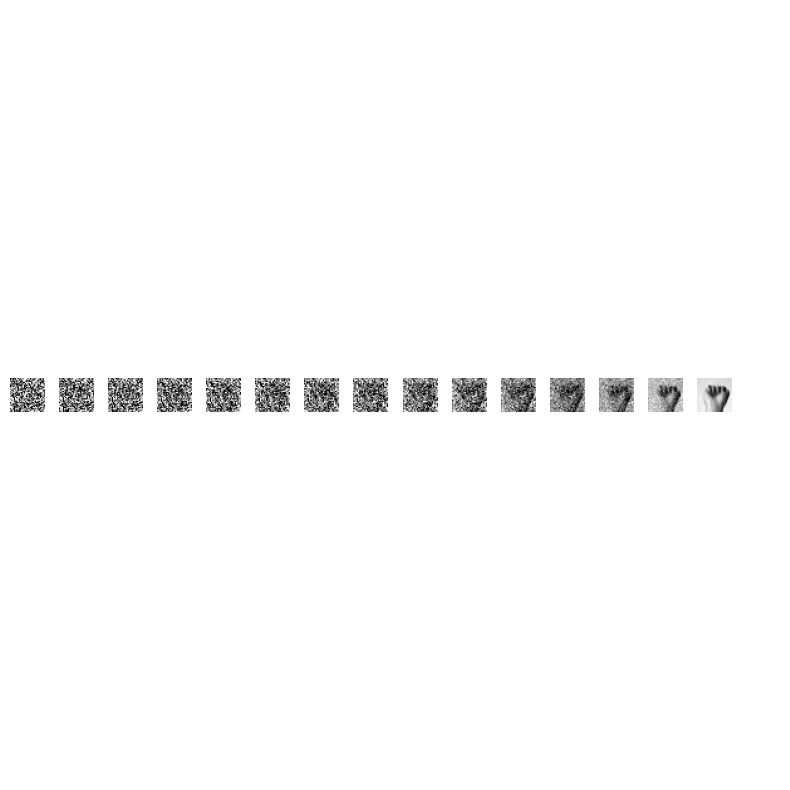

Epoch 2 | Step 000 | Loss: 0.027557 | LR: 0.00030000


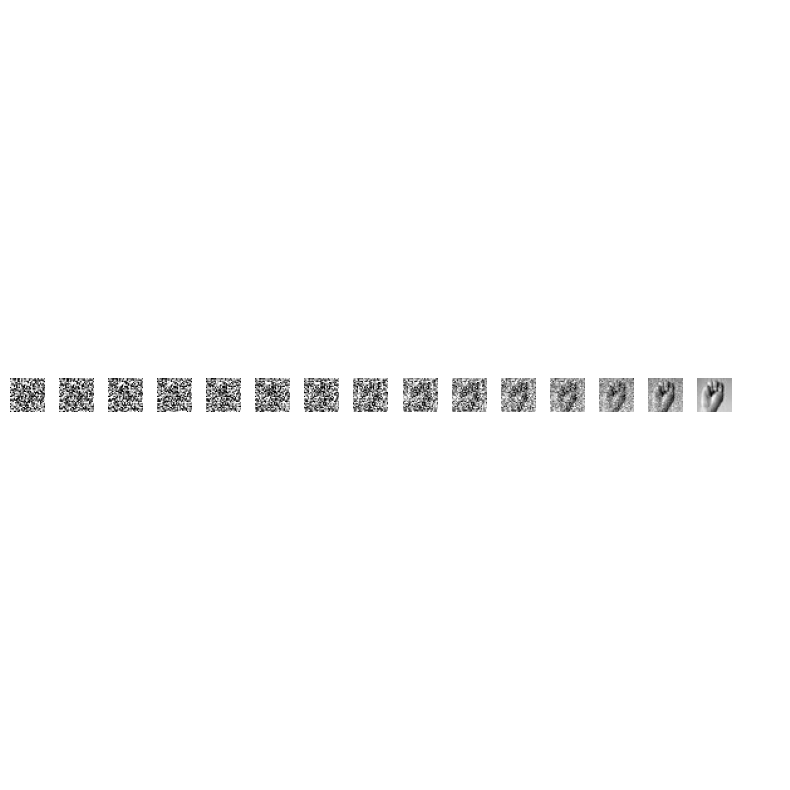

Epoch 2 | Step 100 | Loss: 0.042719 | LR: 0.00030000


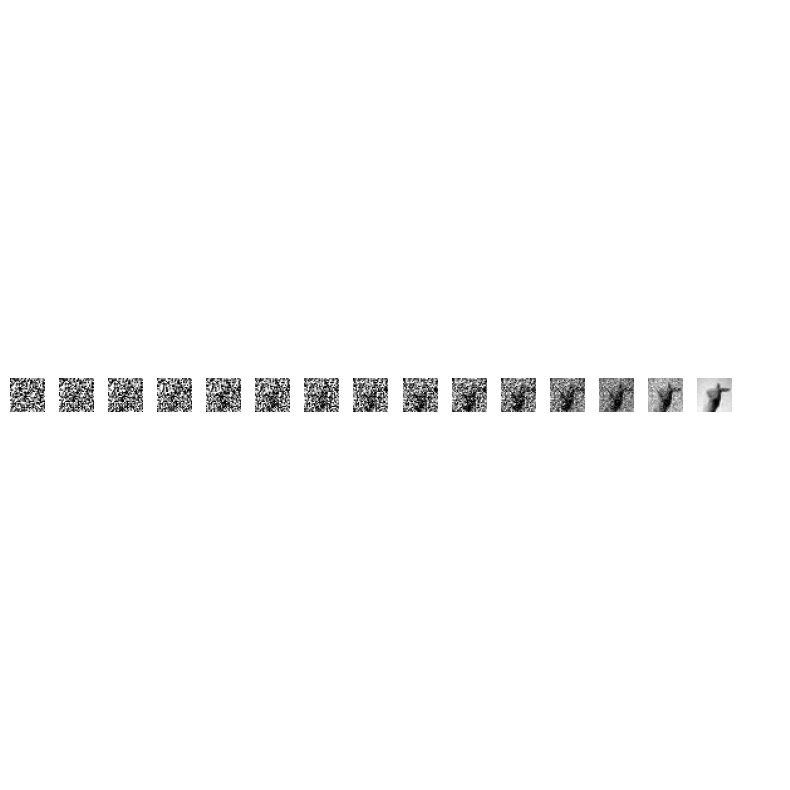

Epoch 3 | Step 000 | Loss: 0.027261 | LR: 0.00030000


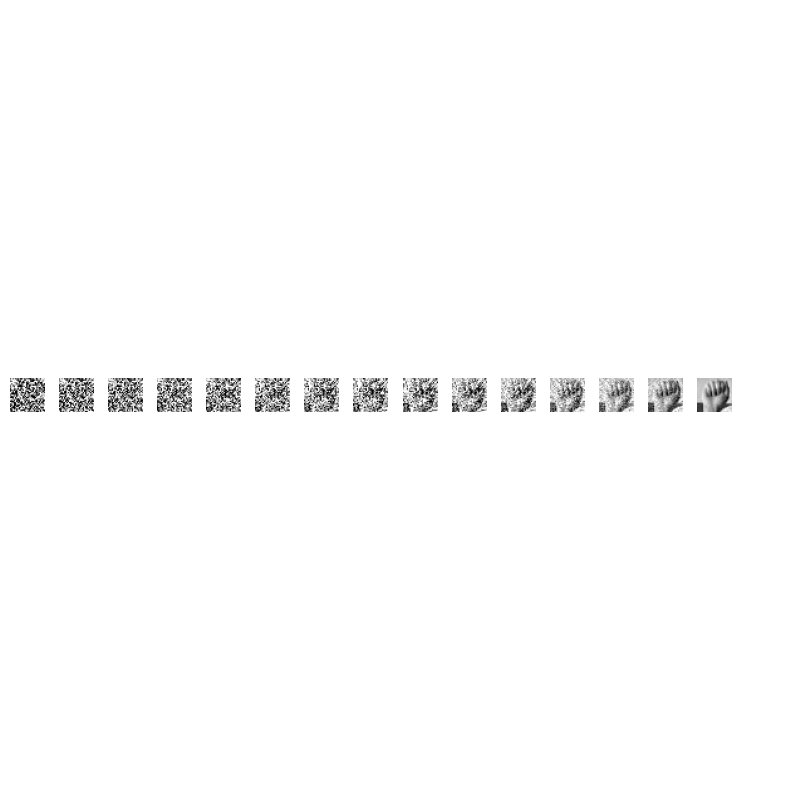

Epoch 3 | Step 100 | Loss: 0.028215 | LR: 0.00030000


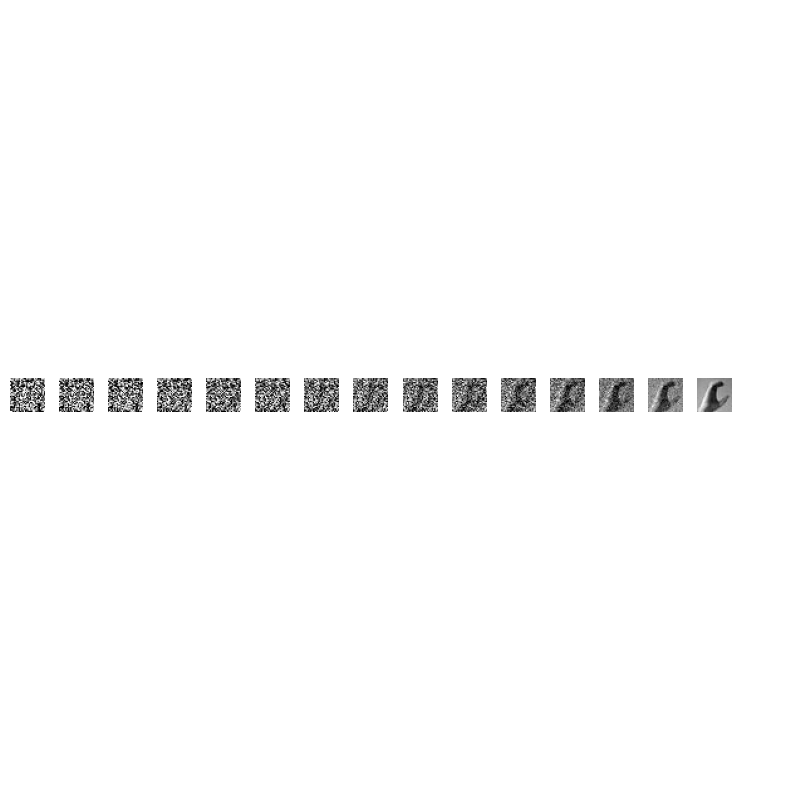

Epoch 4 | Step 000 | Loss: 0.039703 | LR: 0.00030000


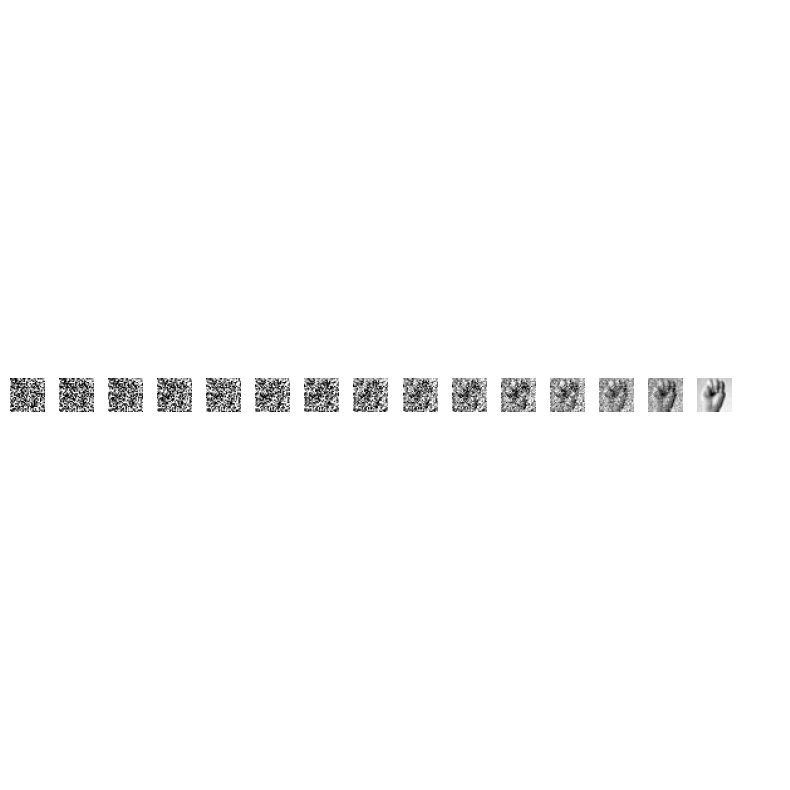

Epoch 4 | Step 100 | Loss: 0.028187 | LR: 0.00030000


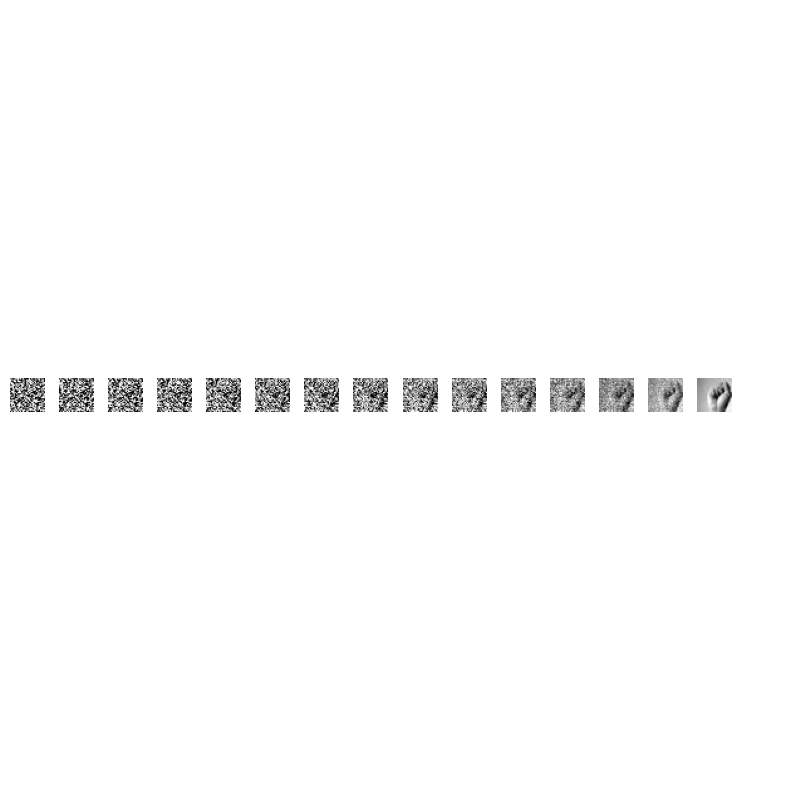

Epoch 5 | Step 000 | Loss: 0.031834 | LR: 0.00030000


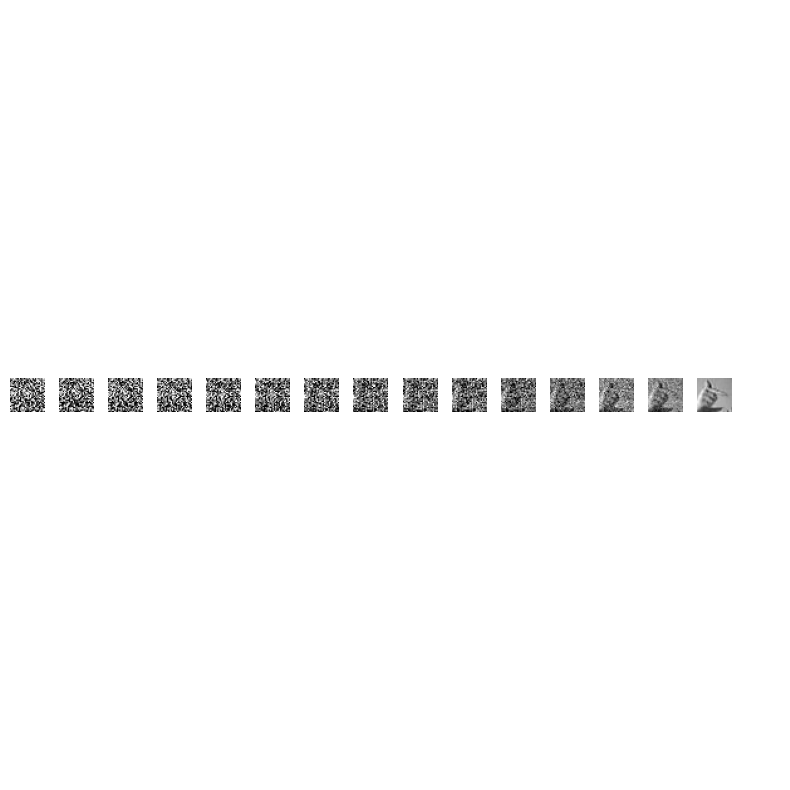

Epoch 5 | Step 100 | Loss: 0.046659 | LR: 0.00030000


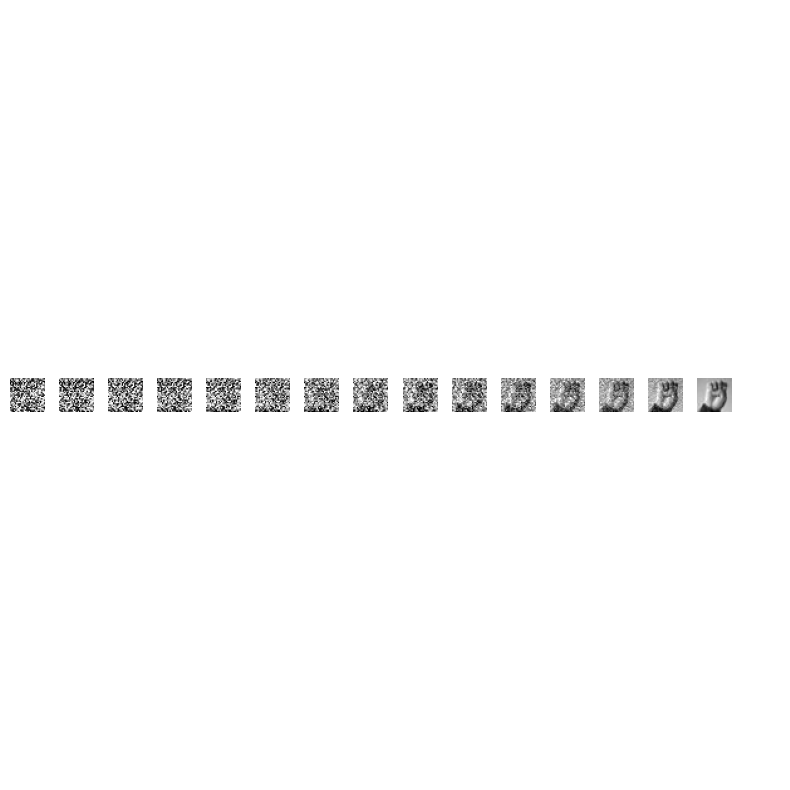

Epoch 6 | Step 000 | Loss: 0.051205 | LR: 0.00030000


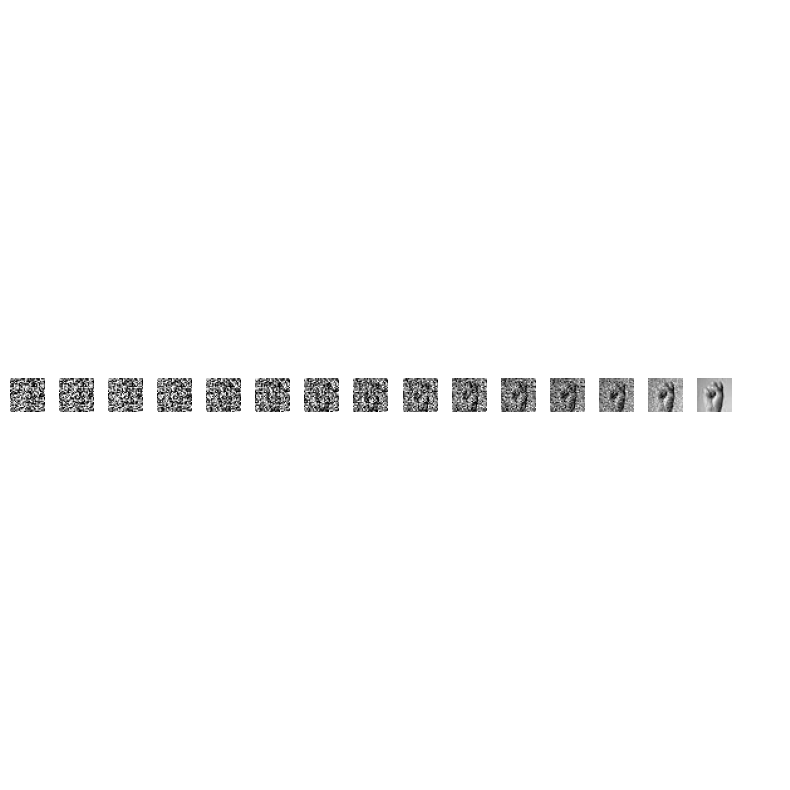

Epoch 6 | Step 100 | Loss: 0.037588 | LR: 0.00030000


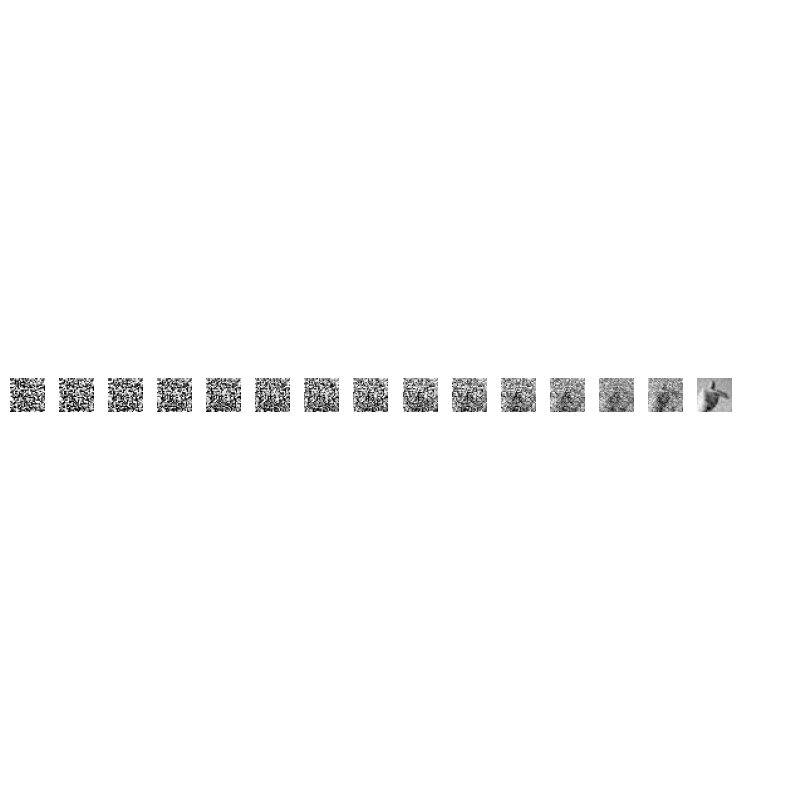

Epoch 7 | Step 000 | Loss: 0.025628 | LR: 0.00030000


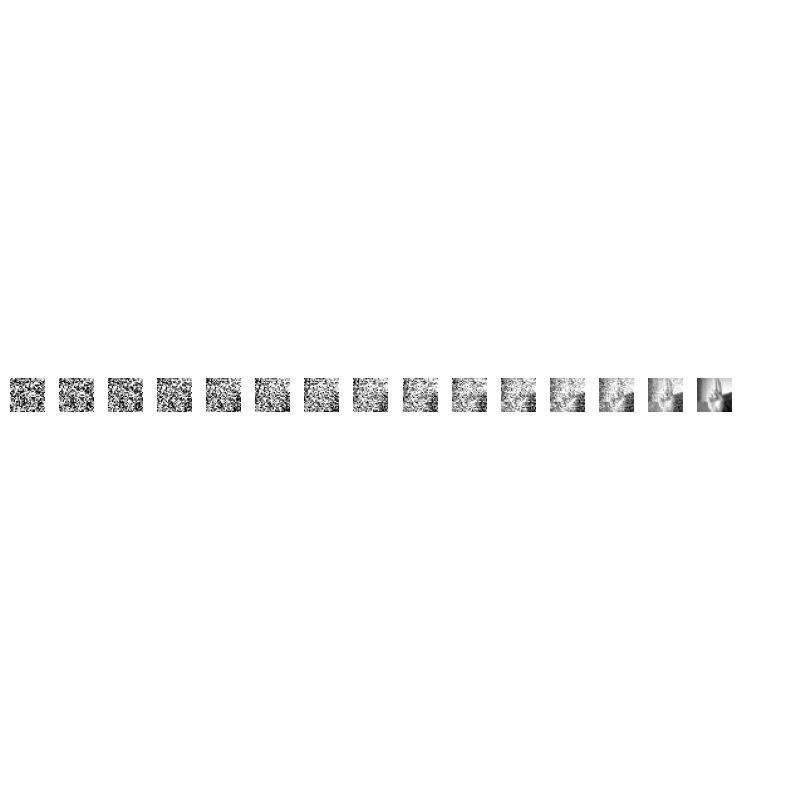

Epoch 7 | Step 100 | Loss: 0.039270 | LR: 0.00030000


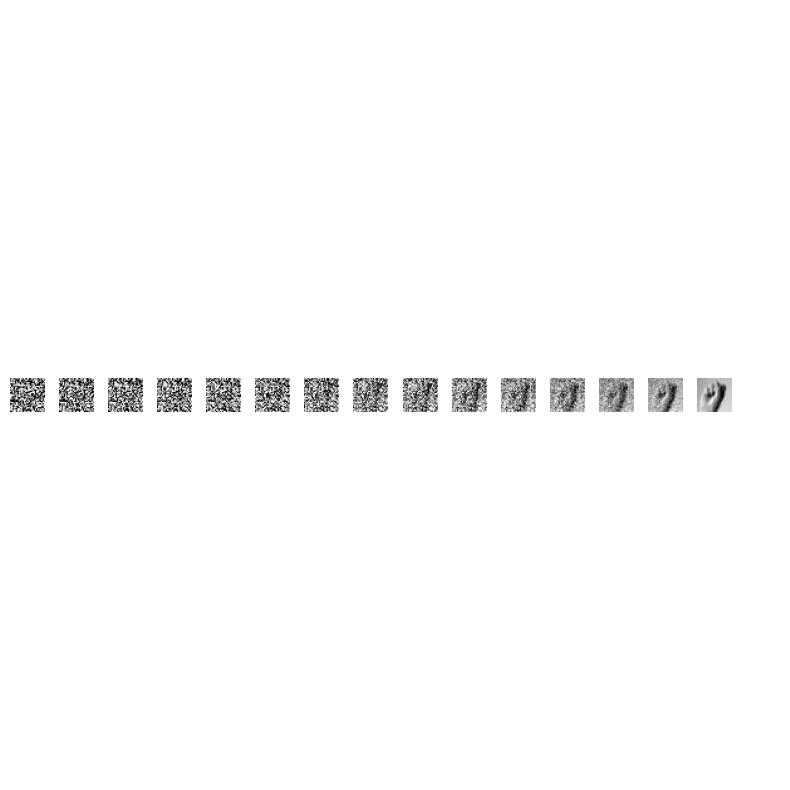

Epoch 8 | Step 000 | Loss: 0.039880 | LR: 0.00030000


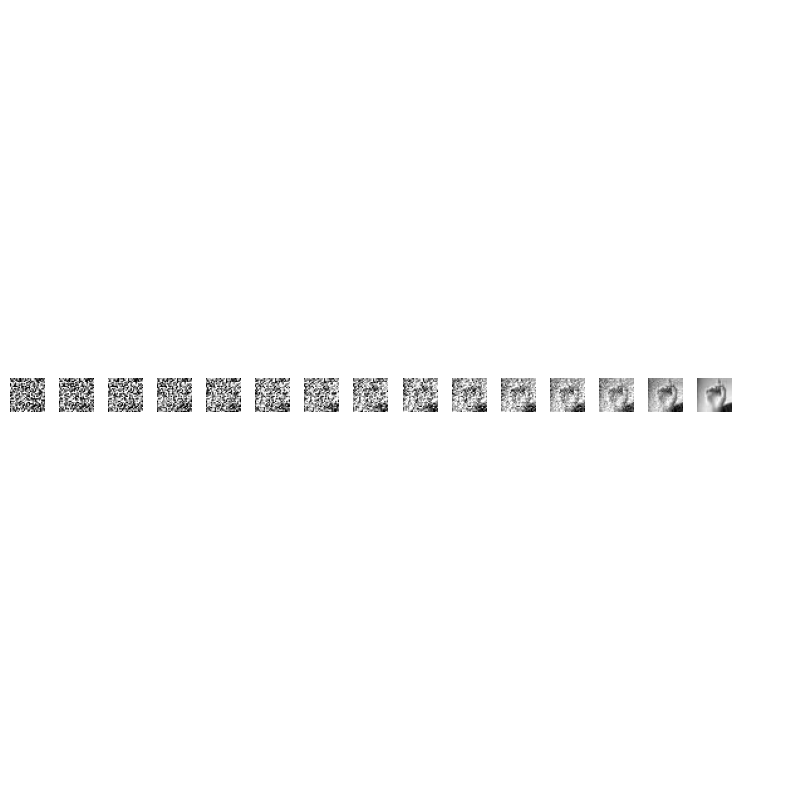

Epoch 8 | Step 100 | Loss: 0.033288 | LR: 0.00030000


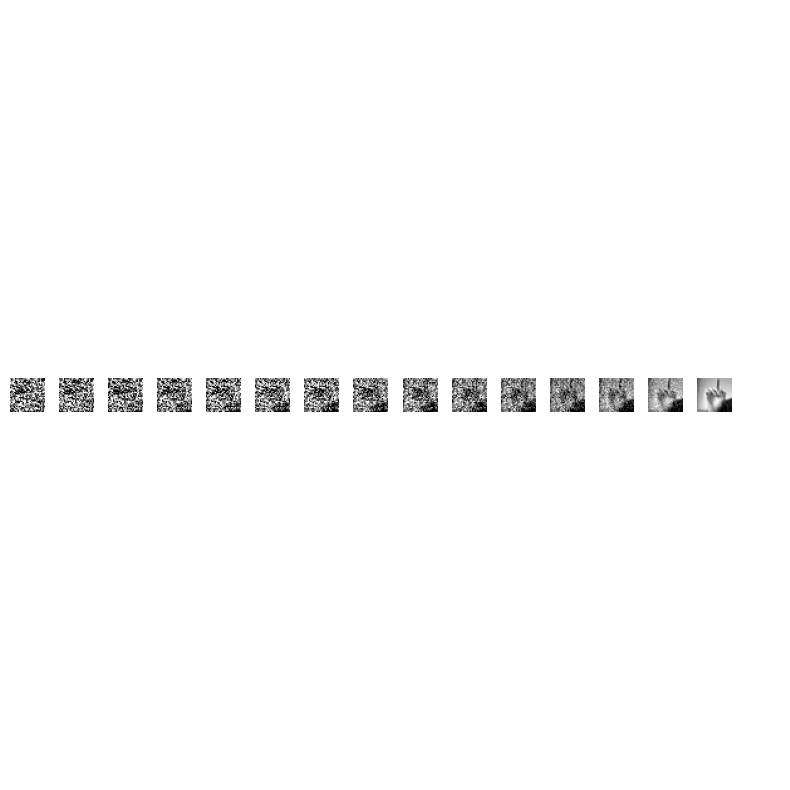

Epoch 9 | Step 000 | Loss: 0.022370 | LR: 0.00030000


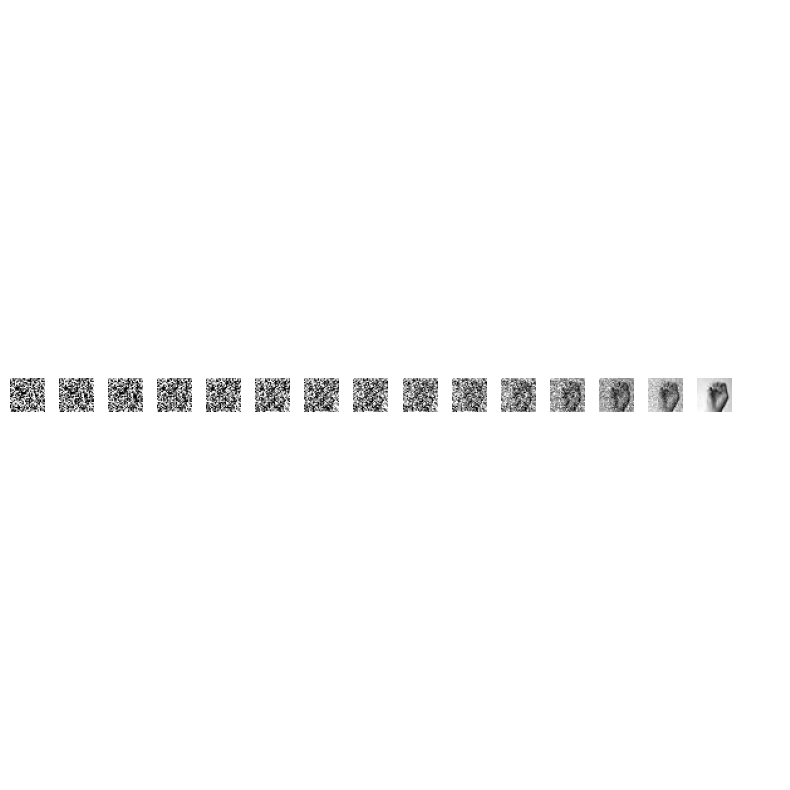

Epoch 9 | Step 100 | Loss: 0.038153 | LR: 0.00030000


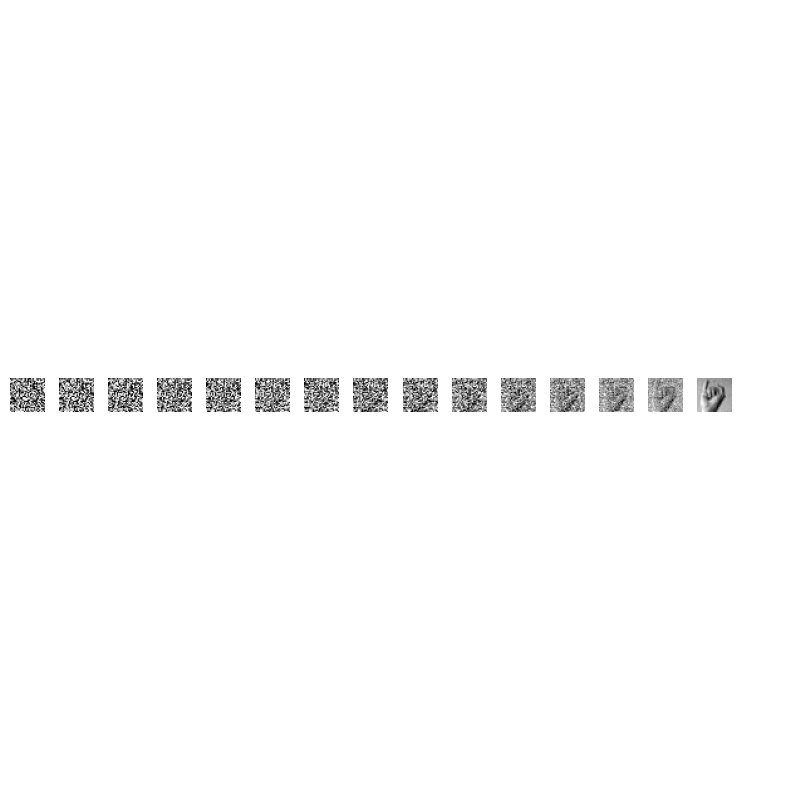

Epoch 10 | Step 000 | Loss: 0.043758 | LR: 0.00030000


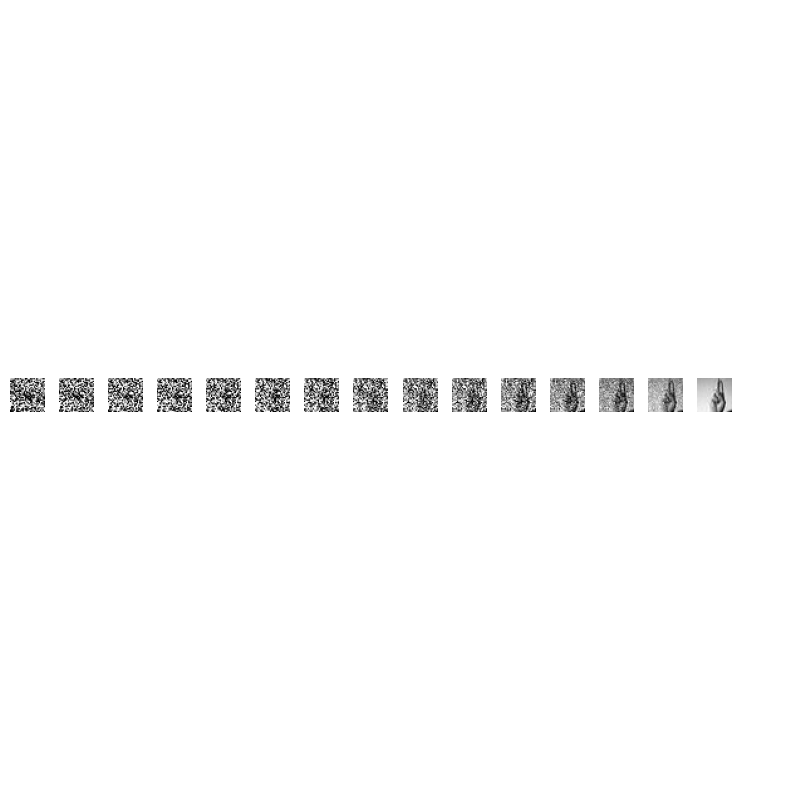

Epoch 10 | Step 100 | Loss: 0.030574 | LR: 0.00030000


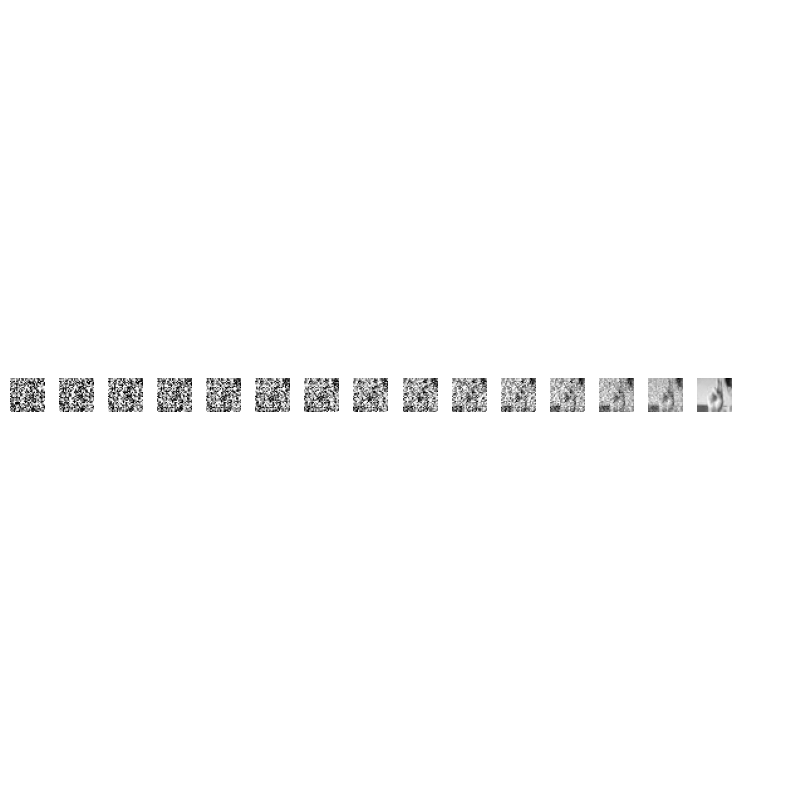

Epoch 11 | Step 000 | Loss: 0.022168 | LR: 0.00030000


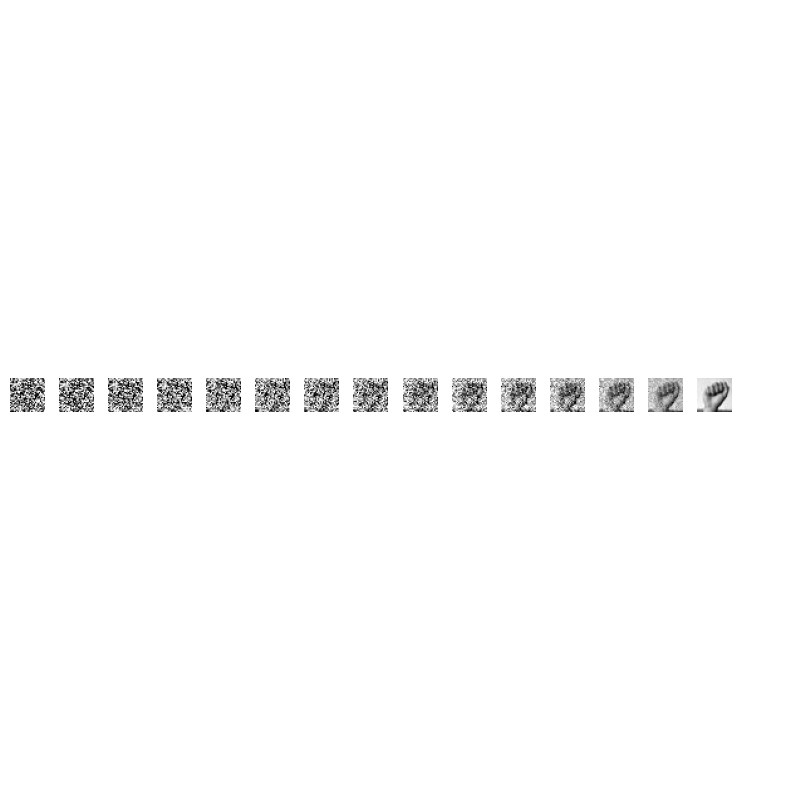

Epoch 11 | Step 100 | Loss: 0.025024 | LR: 0.00030000


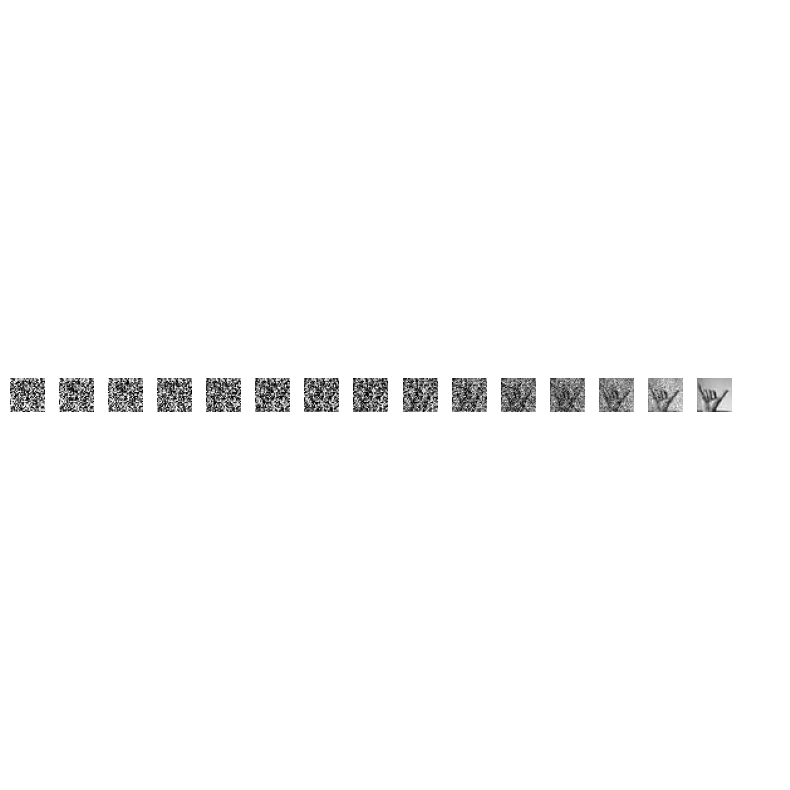

Epoch 12 | Step 000 | Loss: 0.035458 | LR: 0.00021000


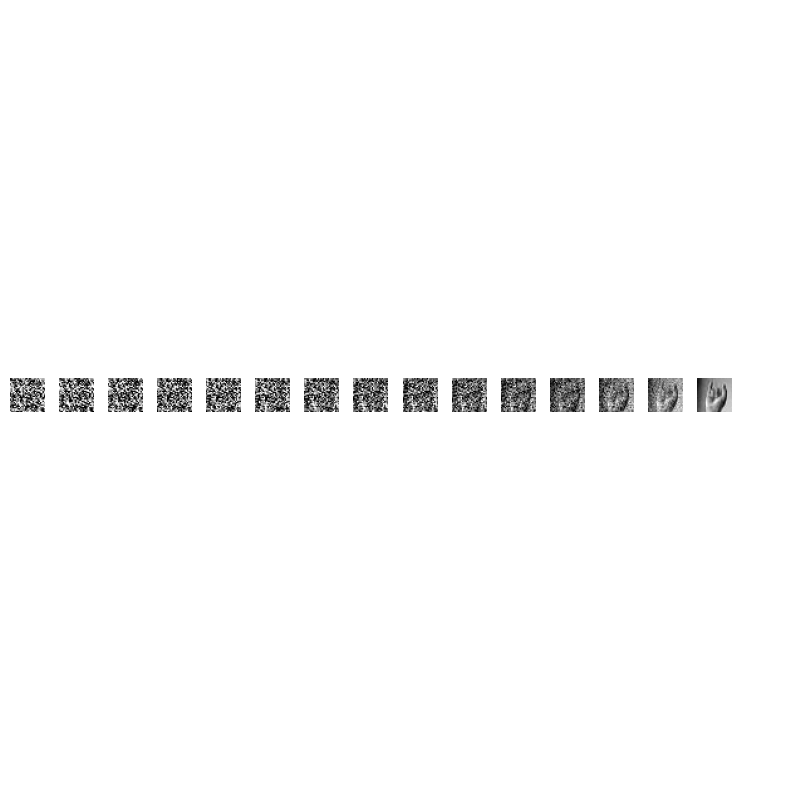

Epoch 12 | Step 100 | Loss: 0.022367 | LR: 0.00021000


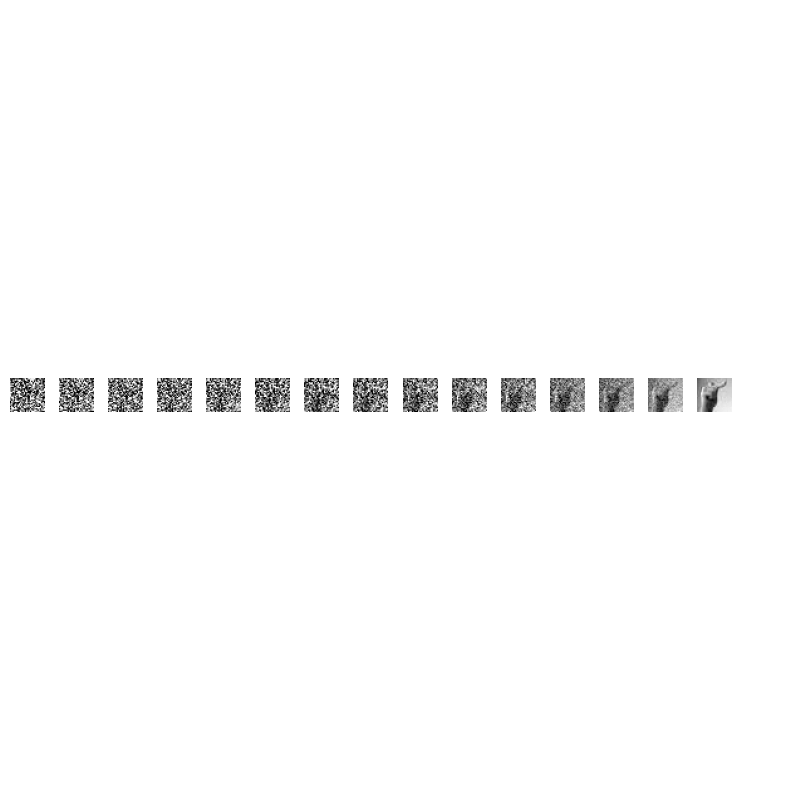

Epoch 13 | Step 000 | Loss: 0.022212 | LR: 0.00021000


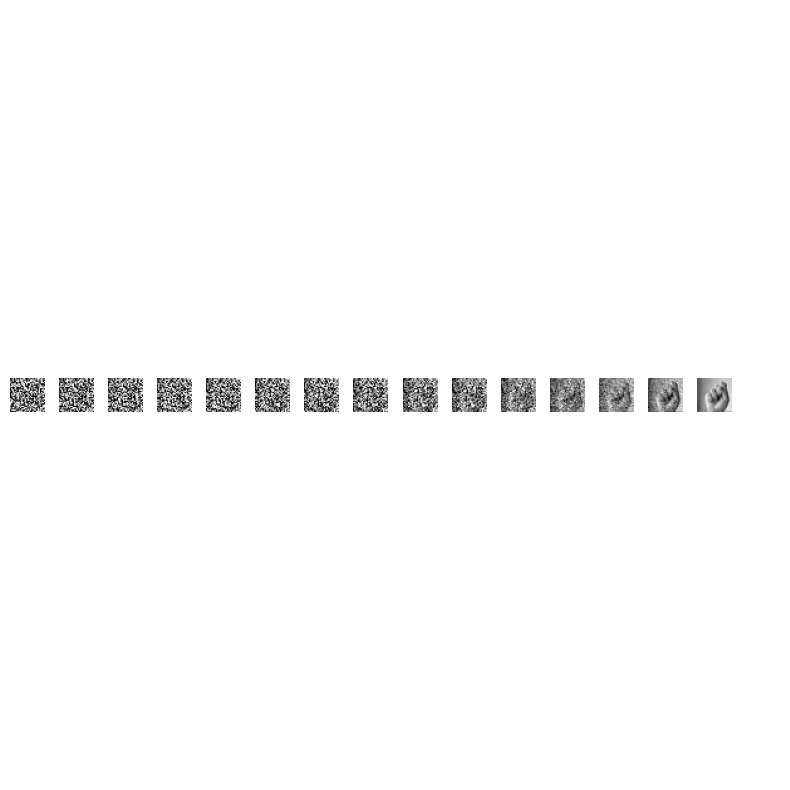

Epoch 13 | Step 100 | Loss: 0.041735 | LR: 0.00021000


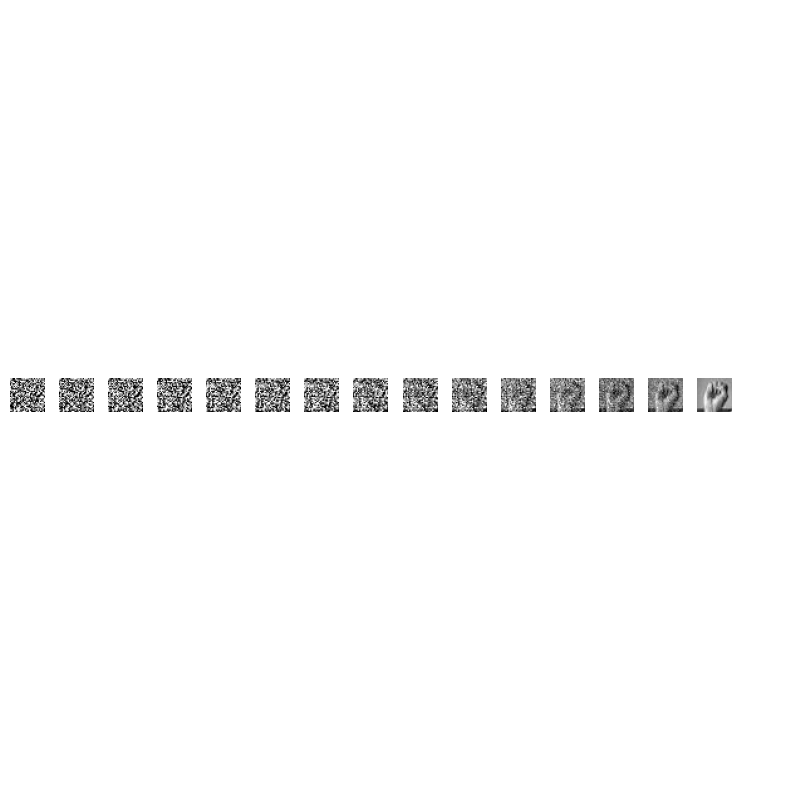

Epoch 14 | Step 000 | Loss: 0.039473 | LR: 0.00021000


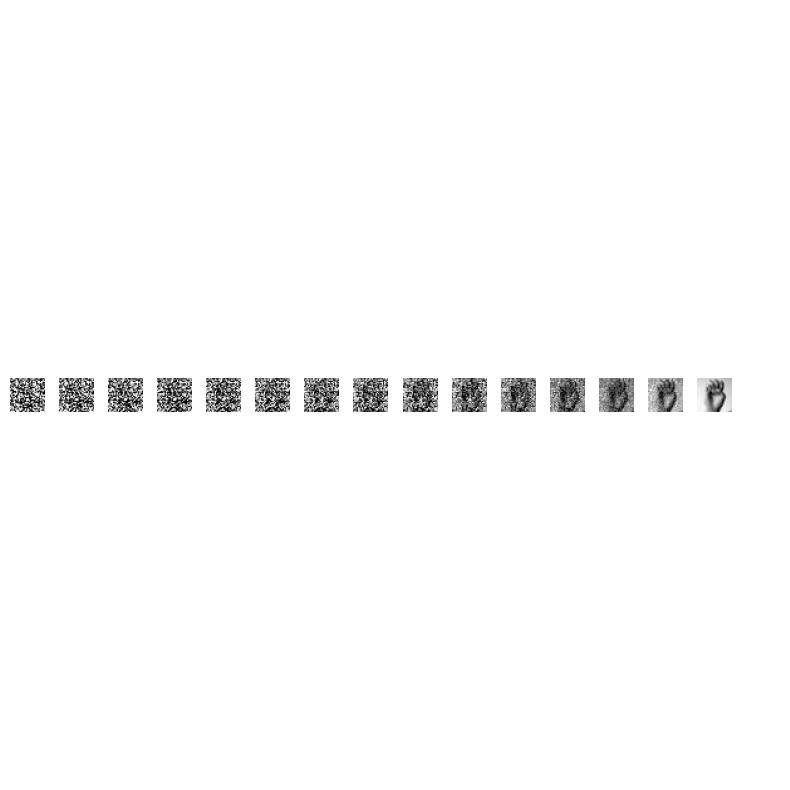

Epoch 14 | Step 100 | Loss: 0.028079 | LR: 0.00021000


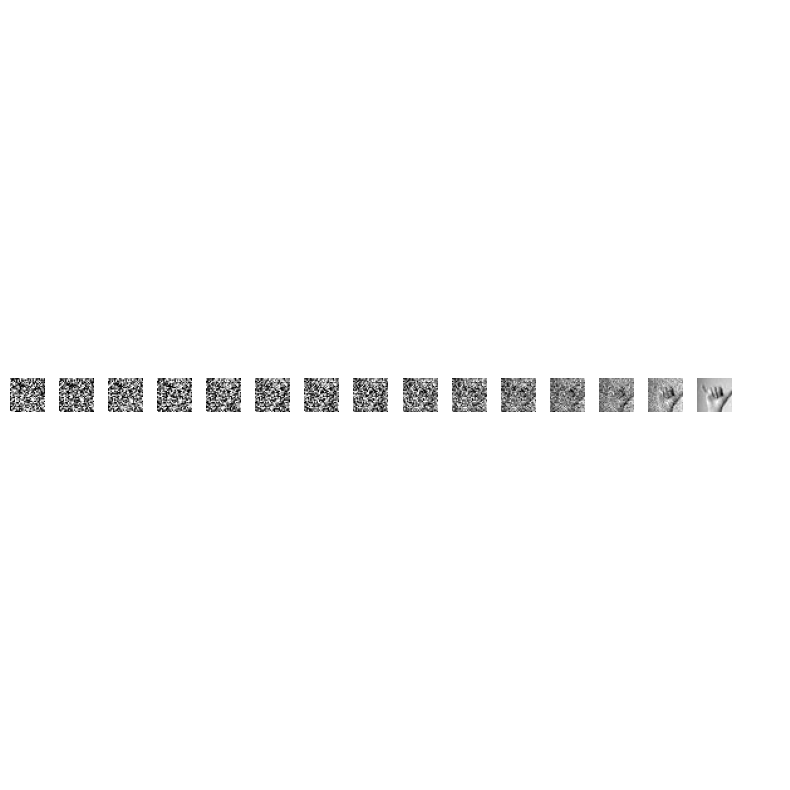

Epoch 15 | Step 000 | Loss: 0.018213 | LR: 0.00021000


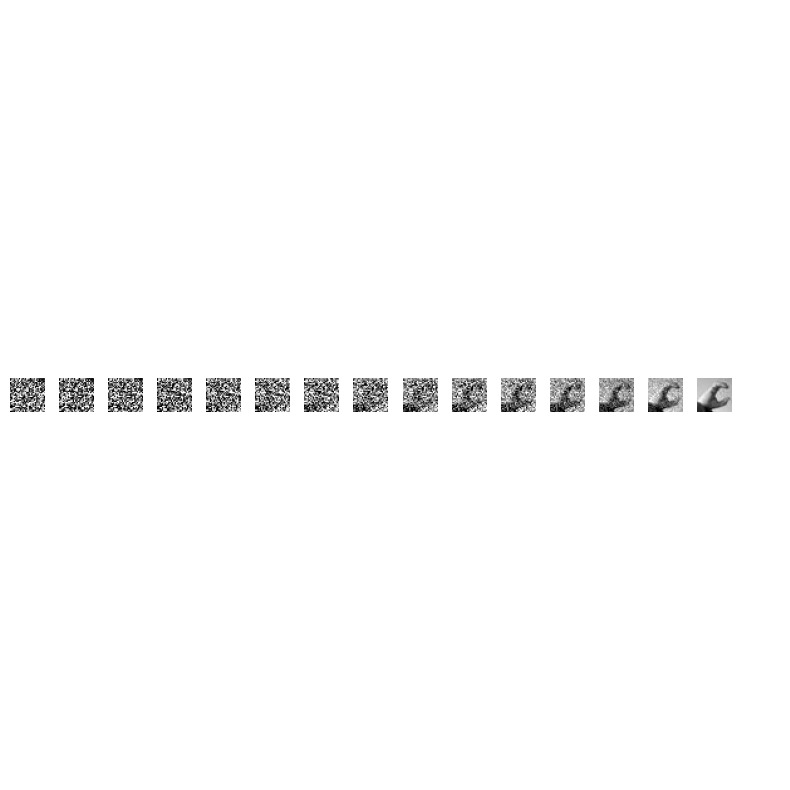

Epoch 15 | Step 100 | Loss: 0.034280 | LR: 0.00021000


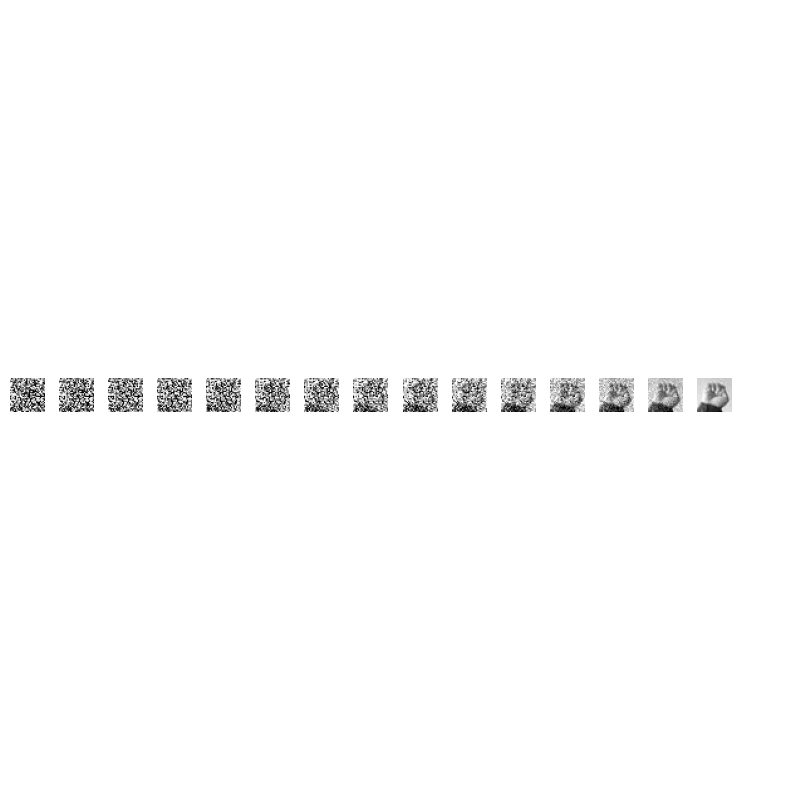

Epoch 16 | Step 000 | Loss: 0.029623 | LR: 0.00021000


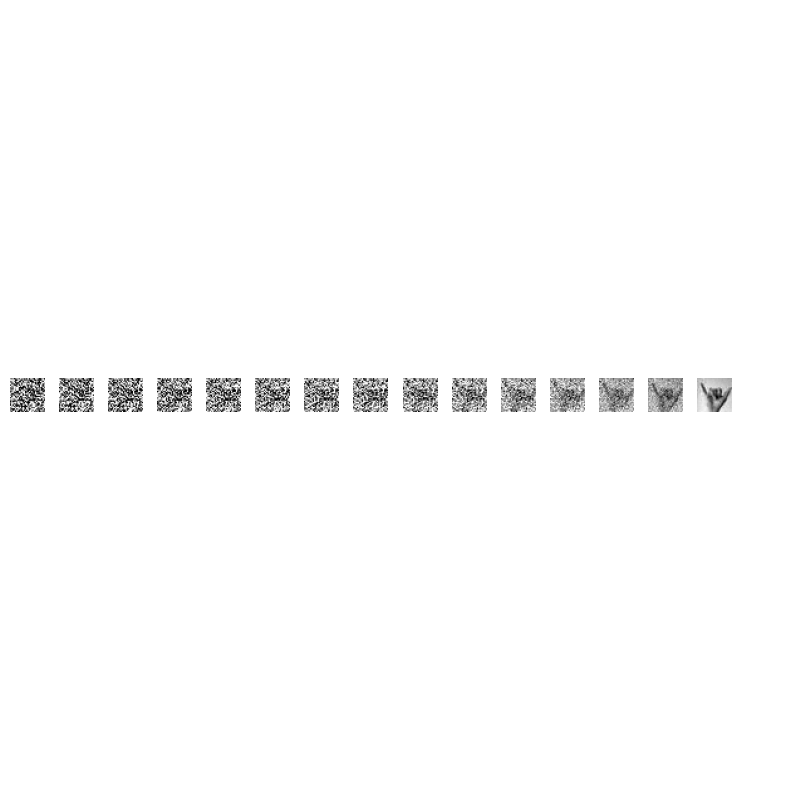

Epoch 16 | Step 100 | Loss: 0.024756 | LR: 0.00021000


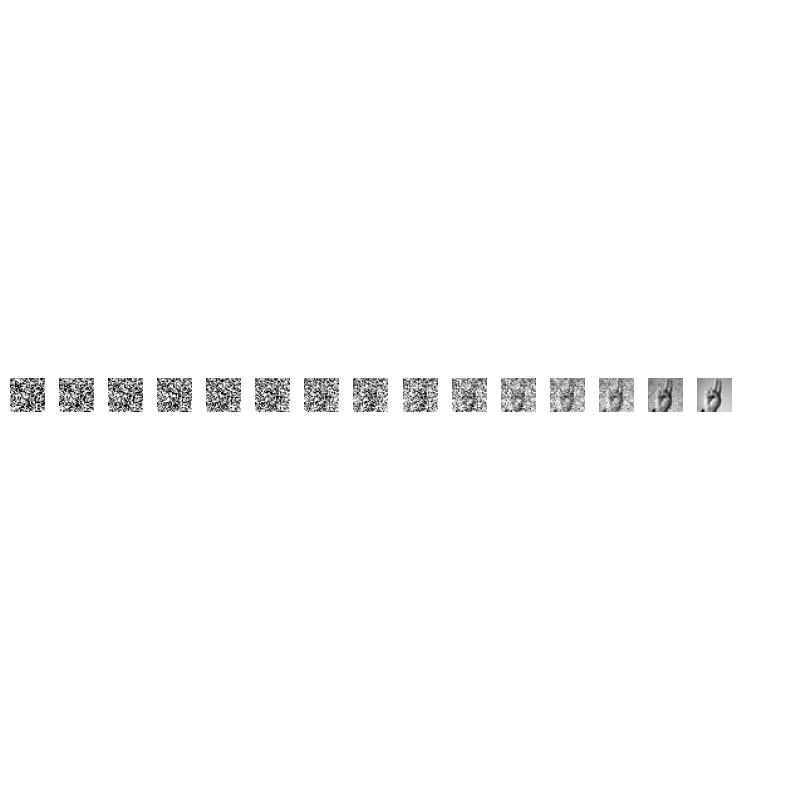

Epoch 17 | Step 000 | Loss: 0.034364 | LR: 0.00021000


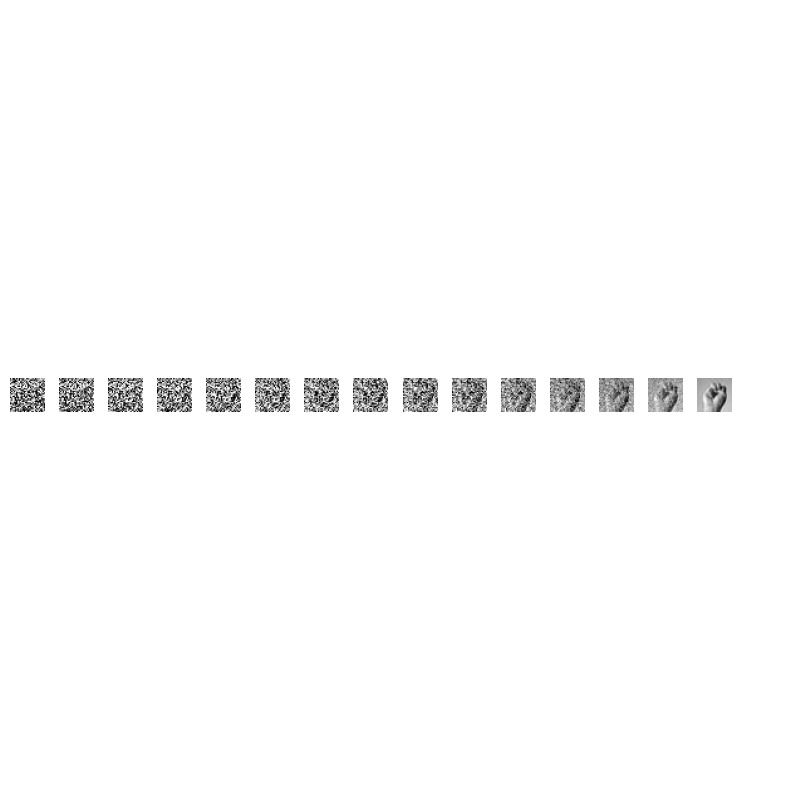

Epoch 17 | Step 100 | Loss: 0.032302 | LR: 0.00021000


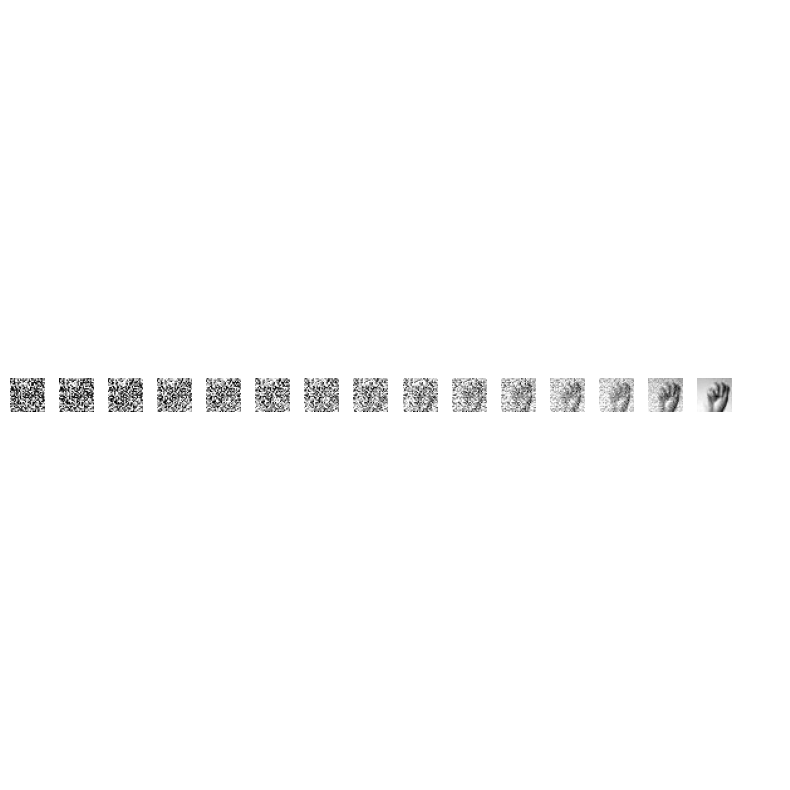

Epoch 18 | Step 000 | Loss: 0.042234 | LR: 0.00021000


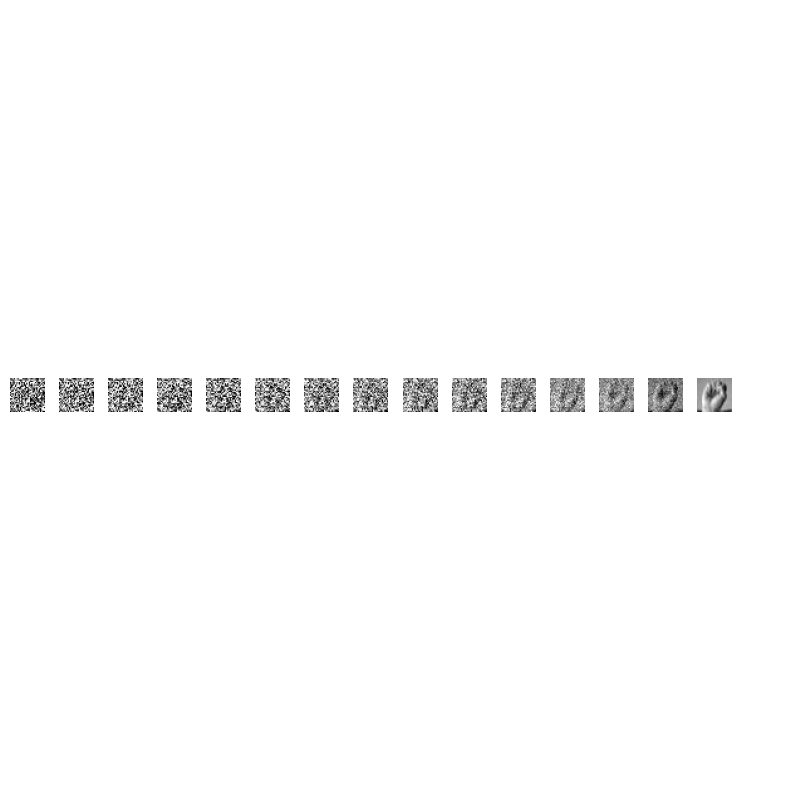

Epoch 18 | Step 100 | Loss: 0.028084 | LR: 0.00021000


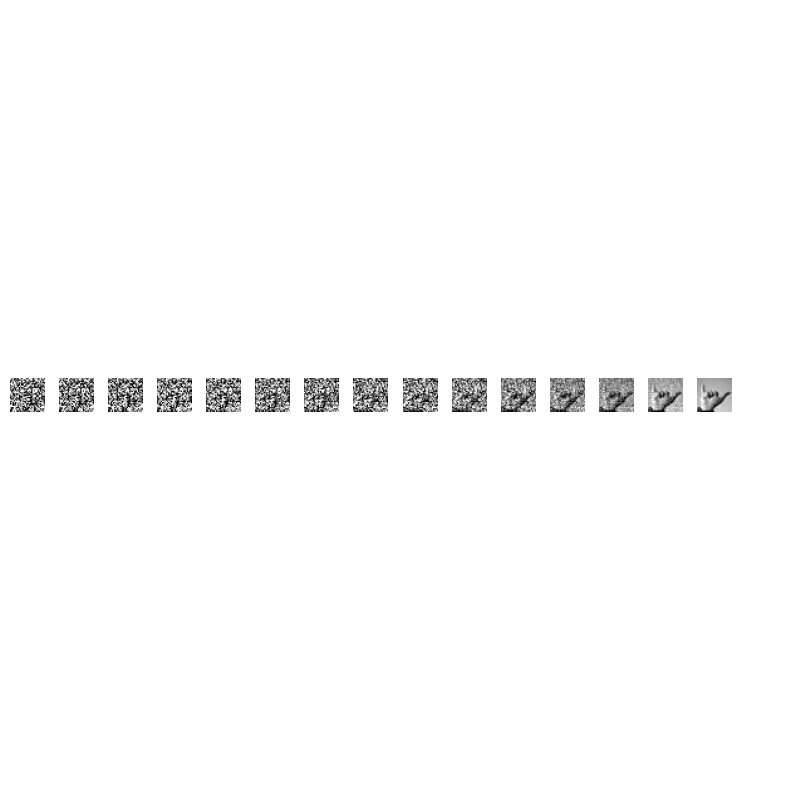

Epoch 19 | Step 000 | Loss: 0.041545 | LR: 0.00021000


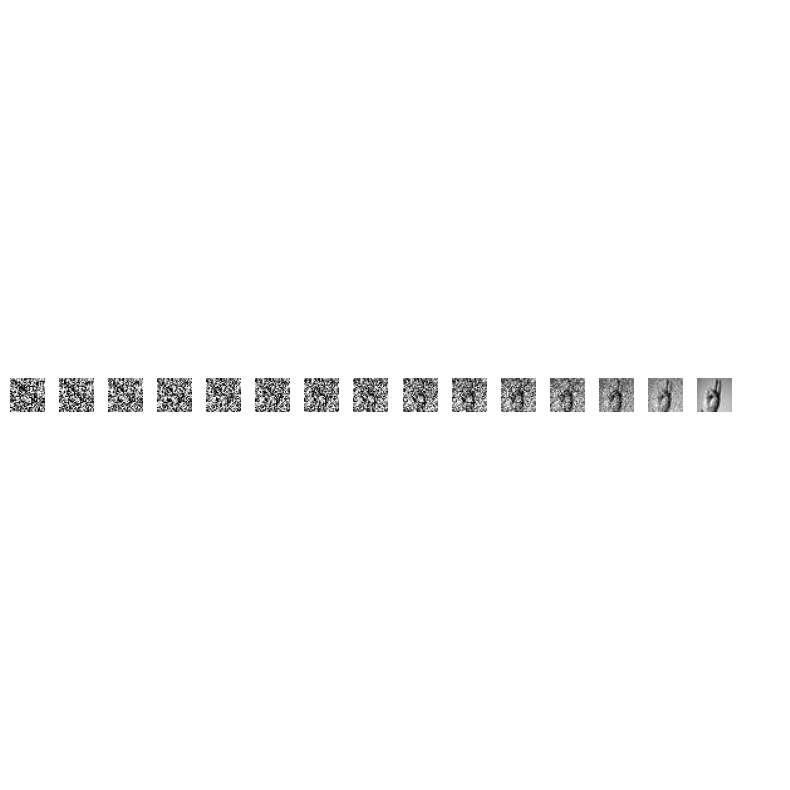

Epoch 19 | Step 100 | Loss: 0.030043 | LR: 0.00021000


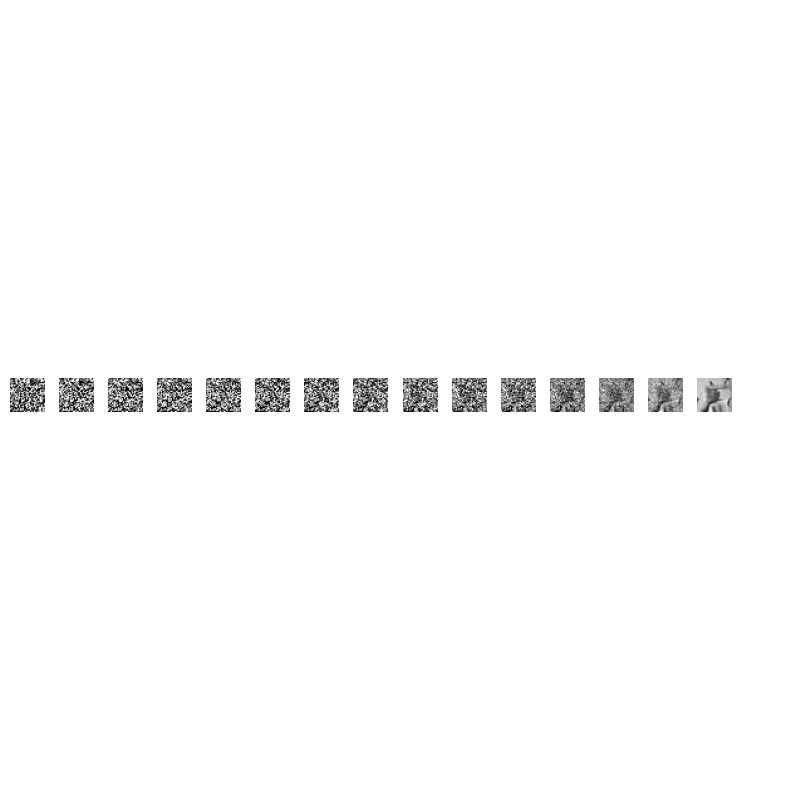

Epoch 20 | Step 000 | Loss: 0.028143 | LR: 0.00021000


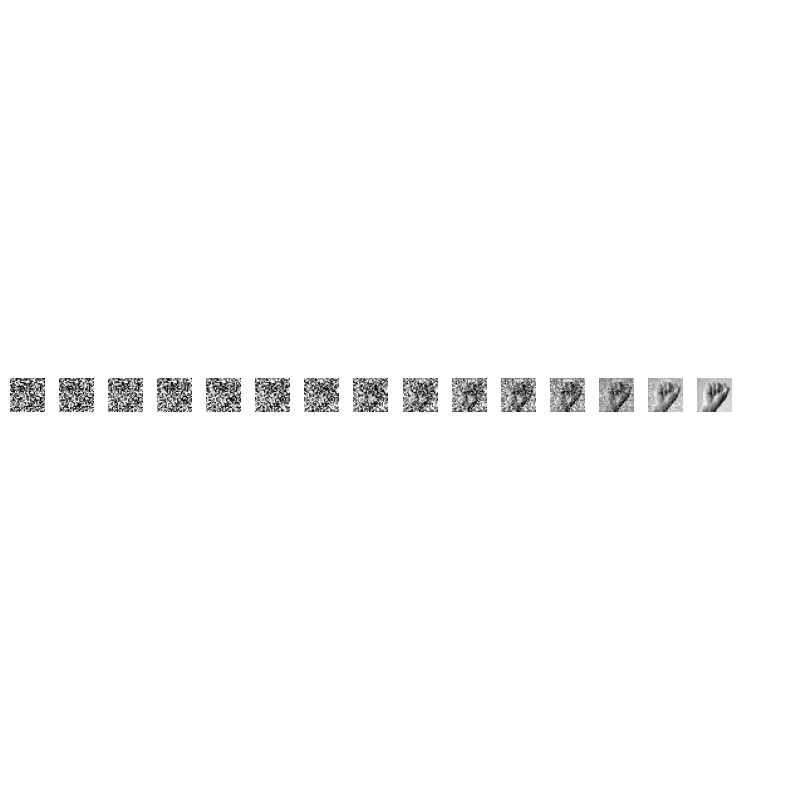

Epoch 20 | Step 100 | Loss: 0.033830 | LR: 0.00021000


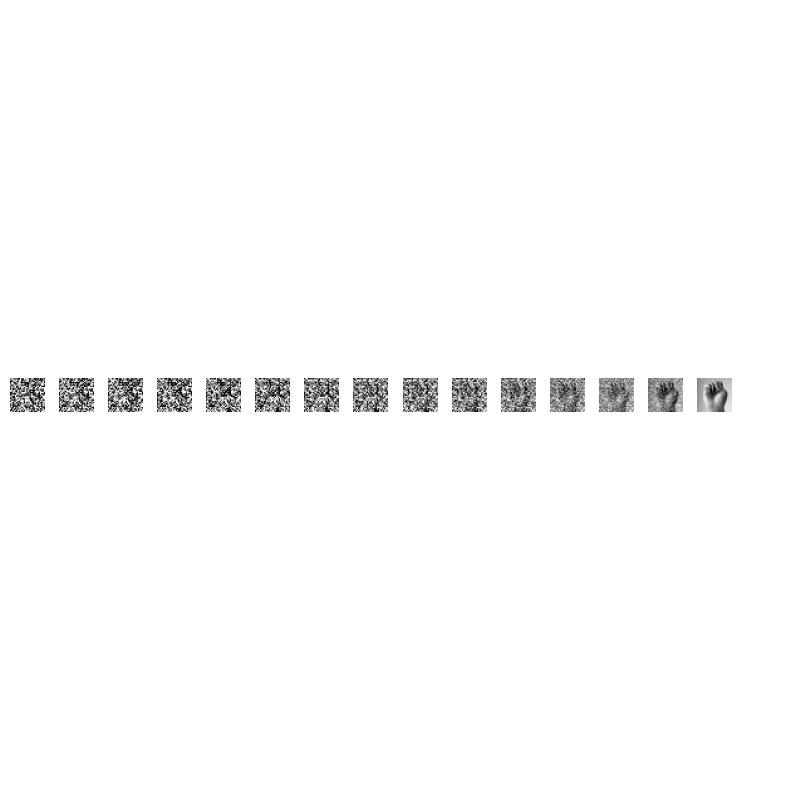

Epoch 21 | Step 000 | Loss: 0.032964 | LR: 0.00021000


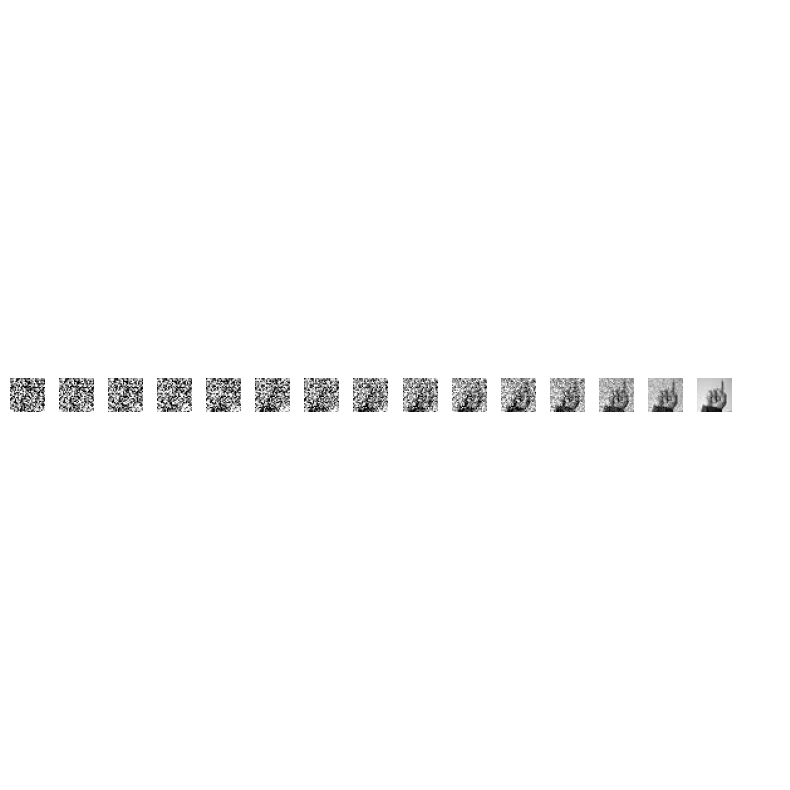

Epoch 21 | Step 100 | Loss: 0.025255 | LR: 0.00021000


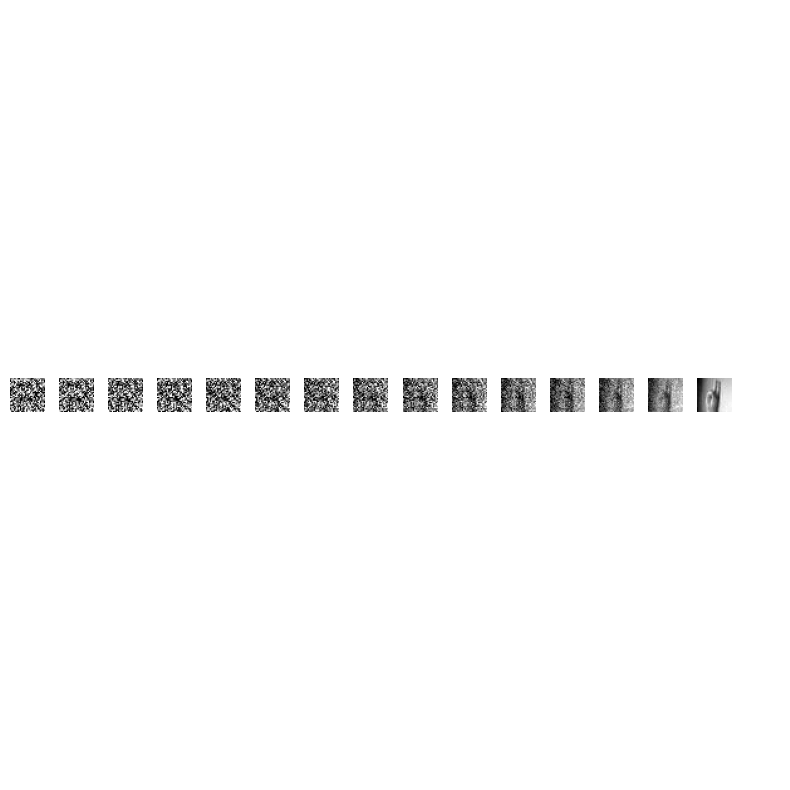

Epoch 22 | Step 000 | Loss: 0.029840 | LR: 0.00021000


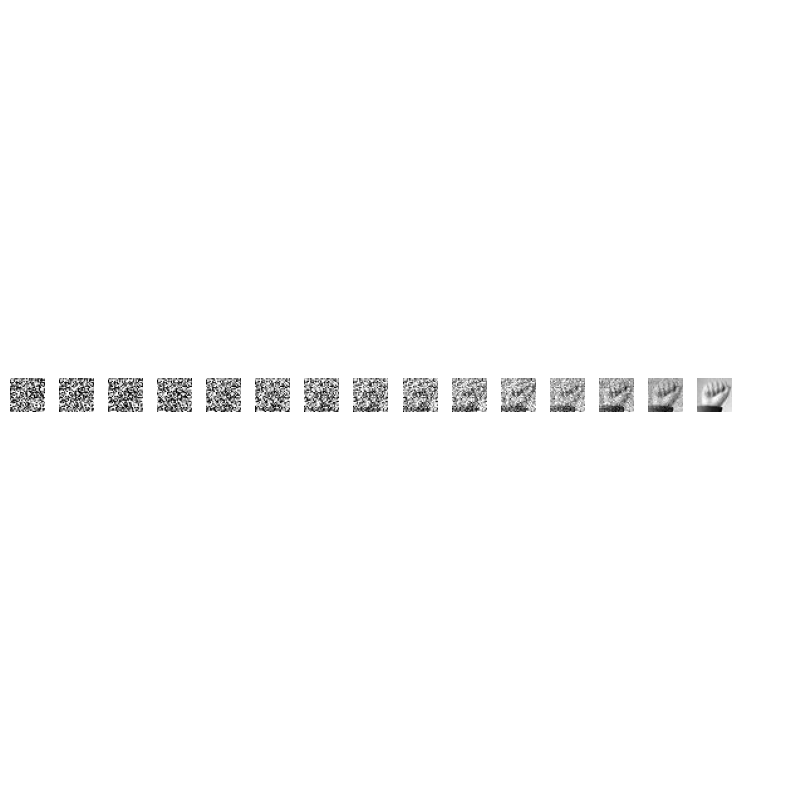

Epoch 22 | Step 100 | Loss: 0.042949 | LR: 0.00021000


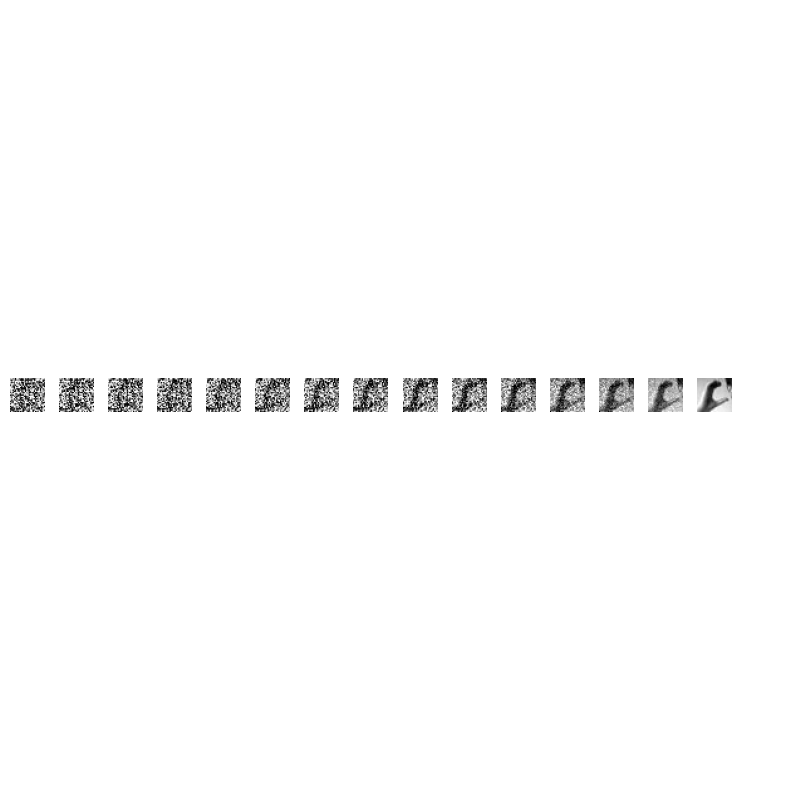

Epoch 23 | Step 000 | Loss: 0.026380 | LR: 0.00021000


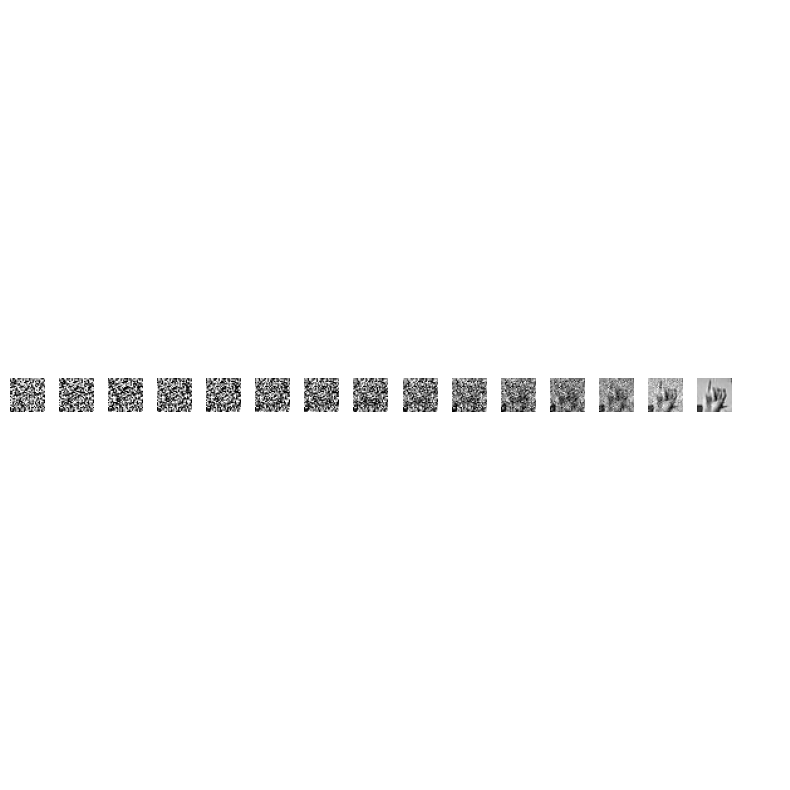

Epoch 23 | Step 100 | Loss: 0.030883 | LR: 0.00021000


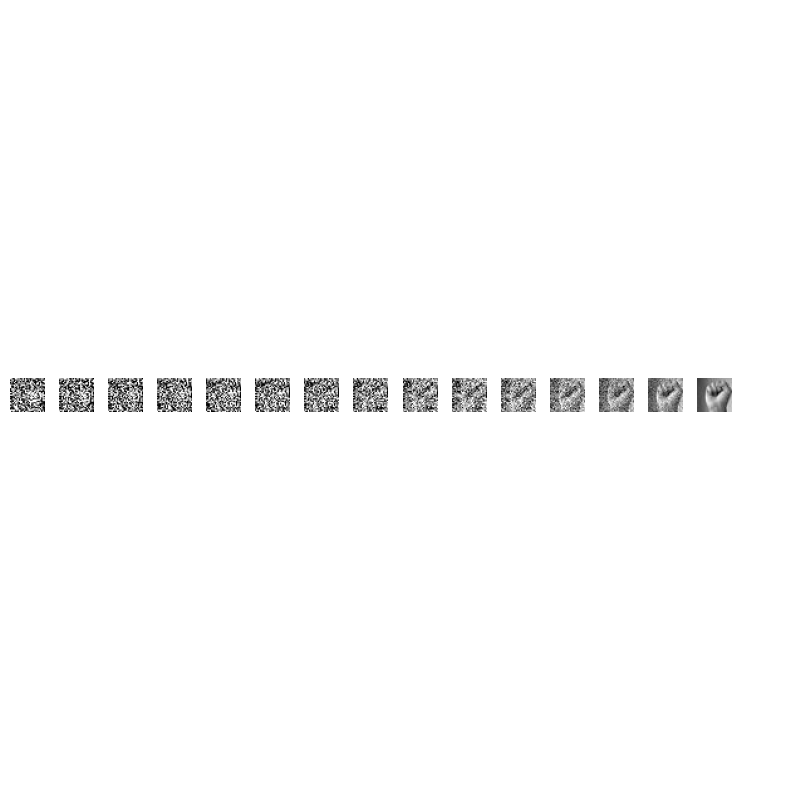

Epoch 24 | Step 000 | Loss: 0.024726 | LR: 0.00014700


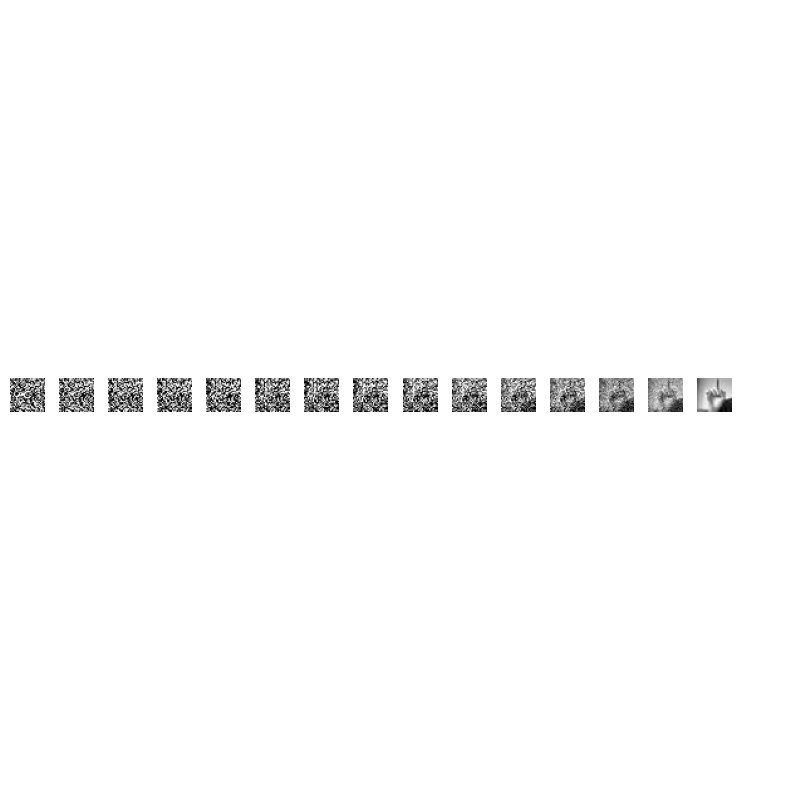

Epoch 24 | Step 100 | Loss: 0.023981 | LR: 0.00014700


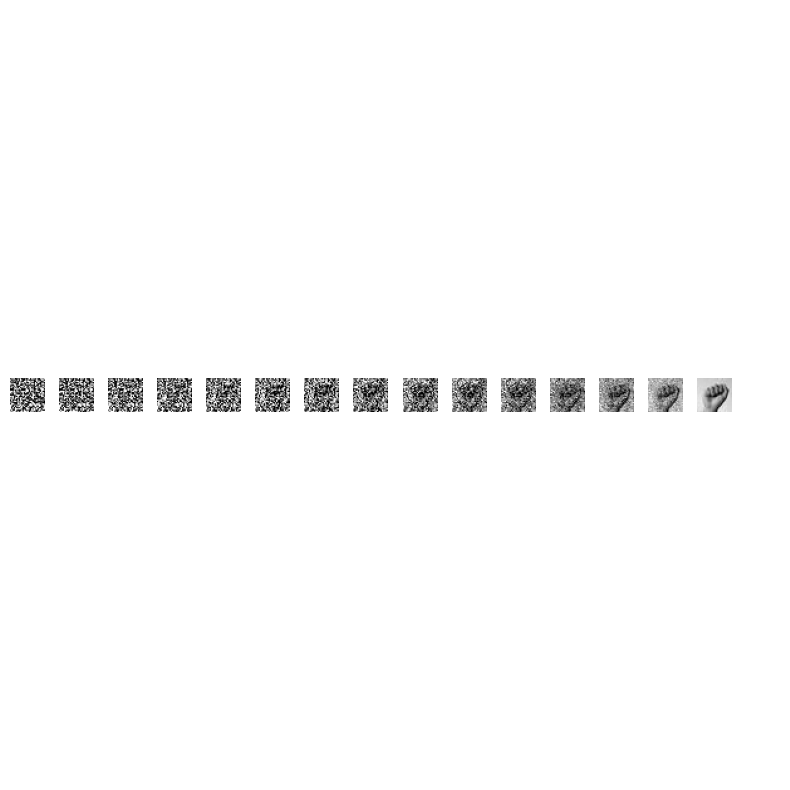

Epoch 25 | Step 000 | Loss: 0.026358 | LR: 0.00014700


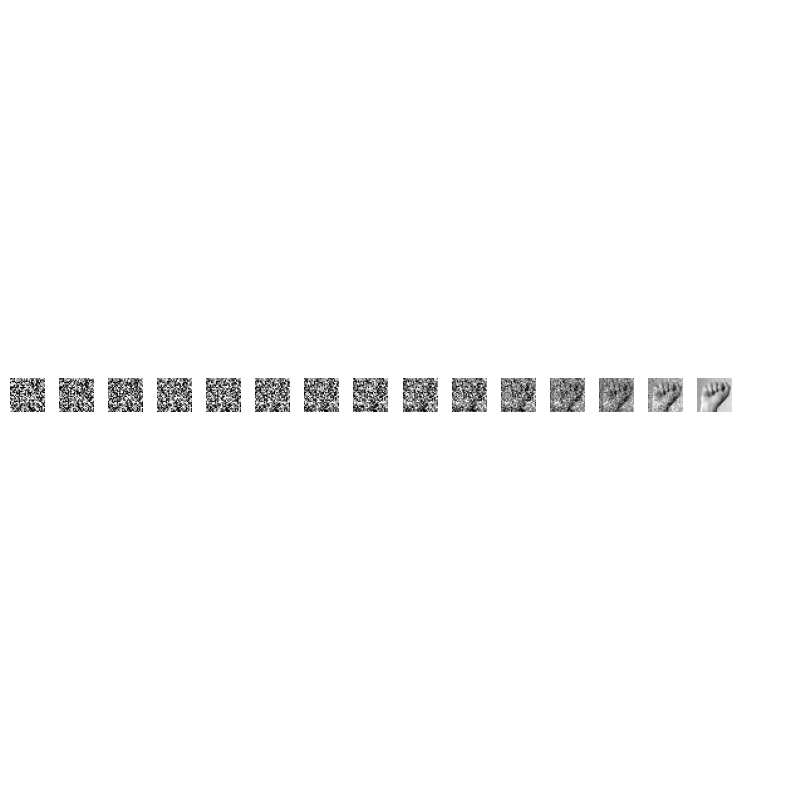

Epoch 25 | Step 100 | Loss: 0.018283 | LR: 0.00014700


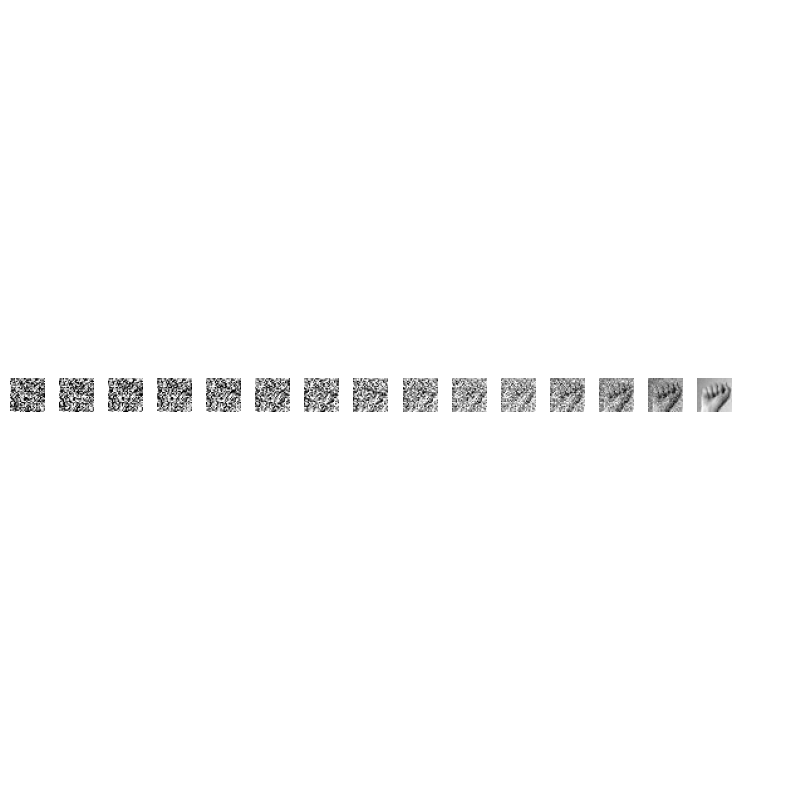

Epoch 26 | Step 000 | Loss: 0.037304 | LR: 0.00014700


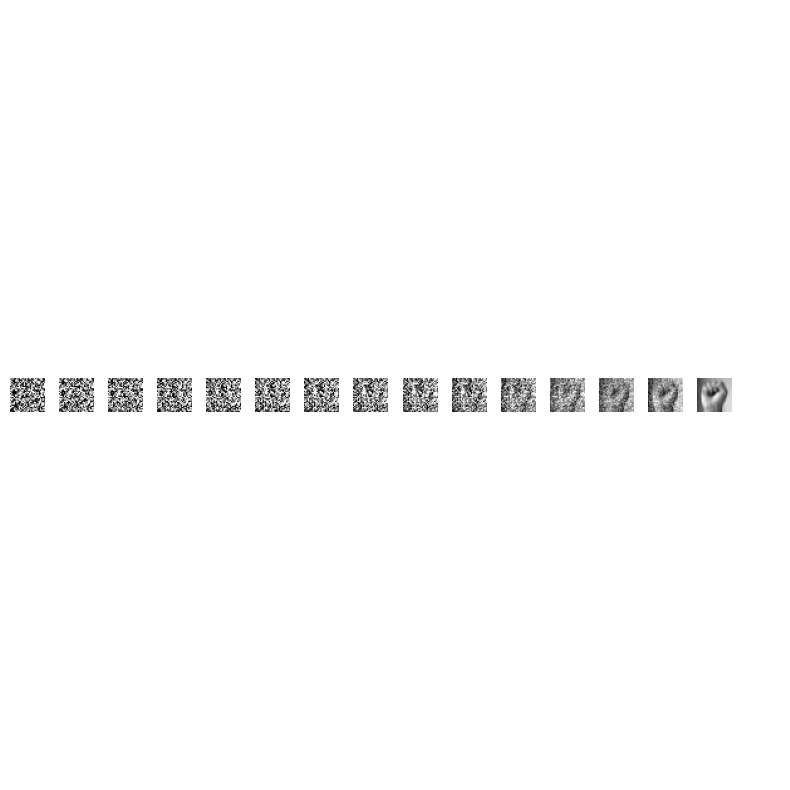

Epoch 26 | Step 100 | Loss: 0.038449 | LR: 0.00014700


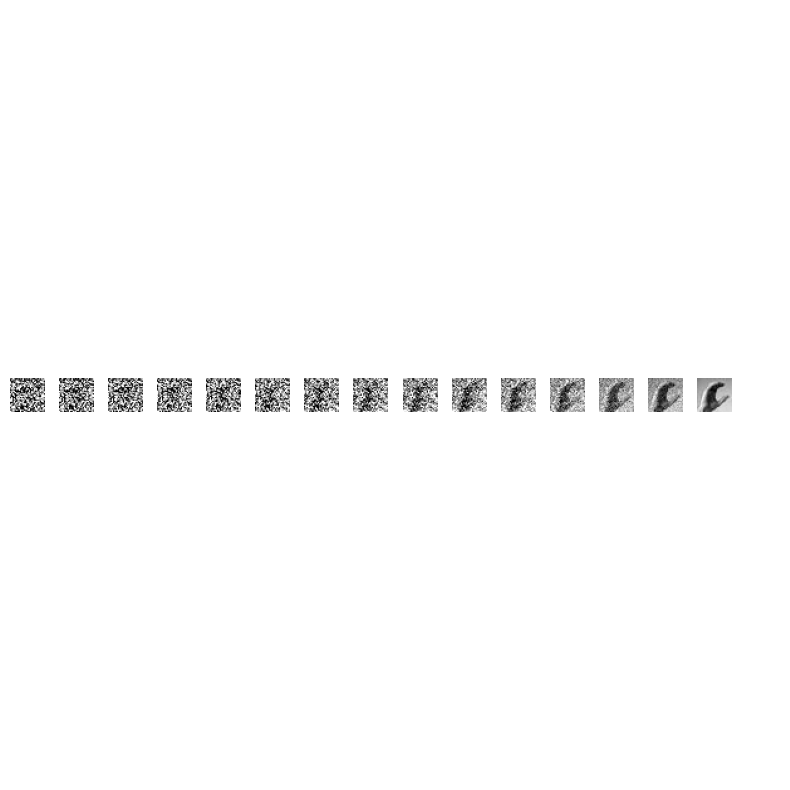

Epoch 27 | Step 000 | Loss: 0.027454 | LR: 0.00014700


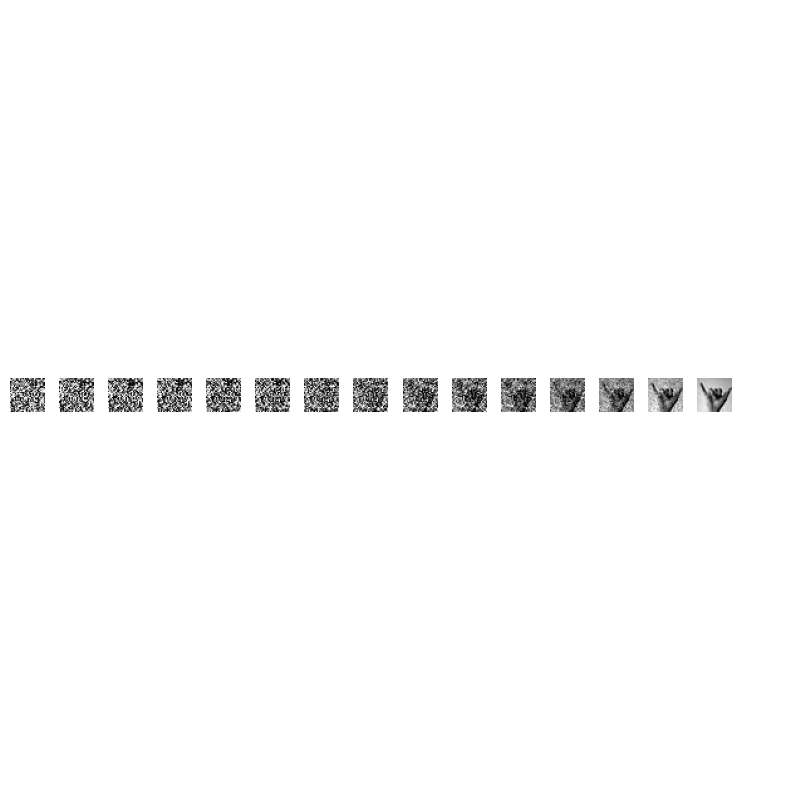

Epoch 27 | Step 100 | Loss: 0.027119 | LR: 0.00014700


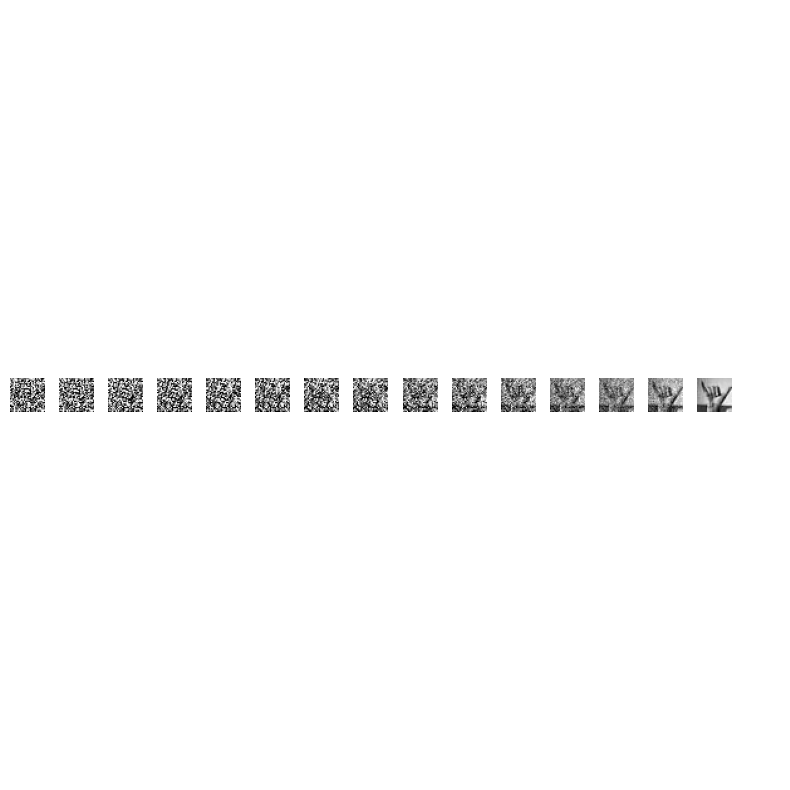

Epoch 28 | Step 000 | Loss: 0.027094 | LR: 0.00014700


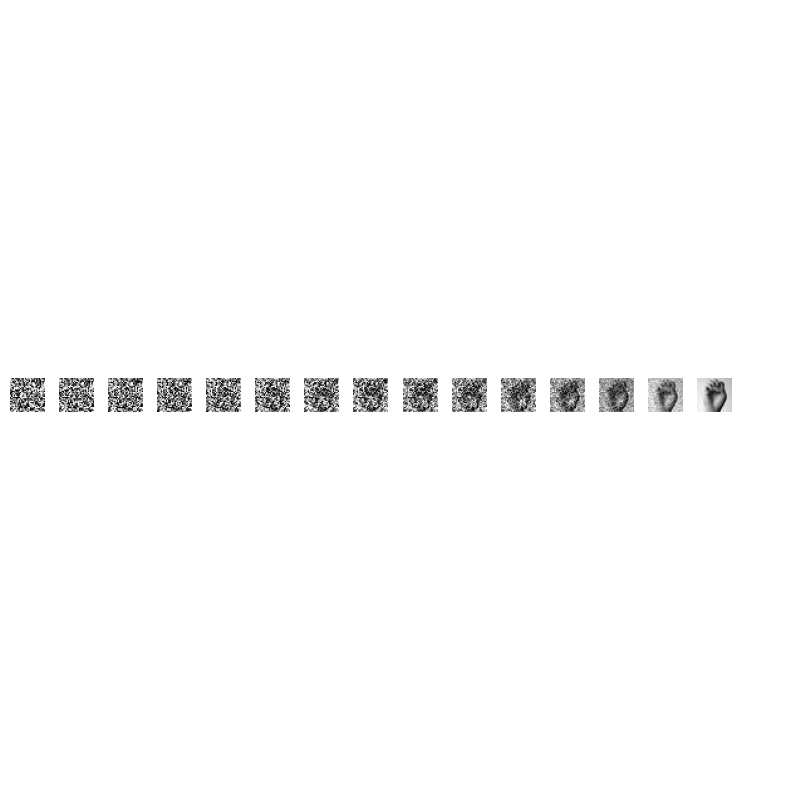

Epoch 28 | Step 100 | Loss: 0.026166 | LR: 0.00014700


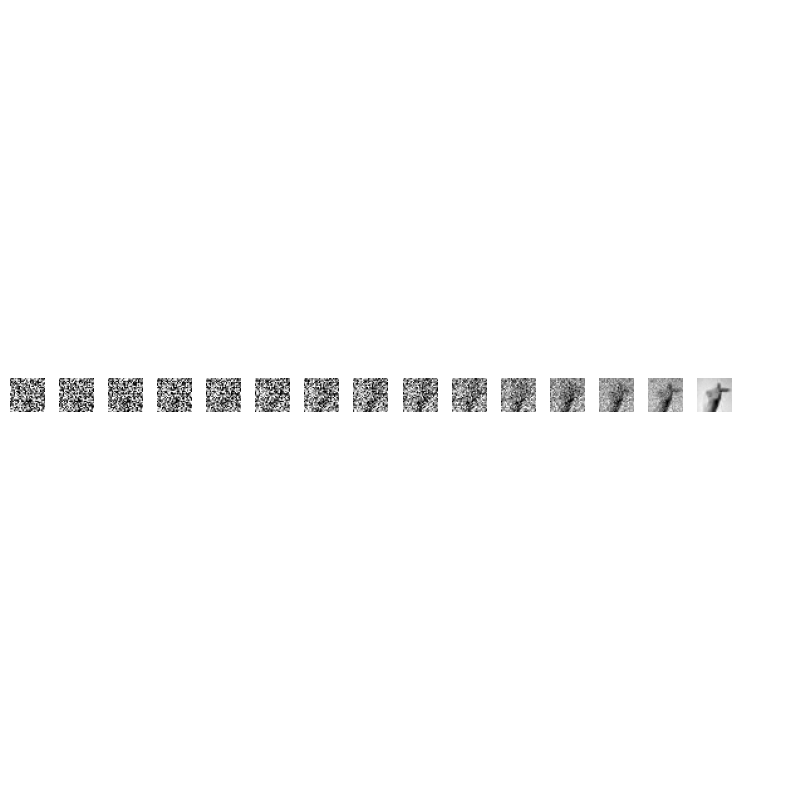

Epoch 29 | Step 000 | Loss: 0.032175 | LR: 0.00014700


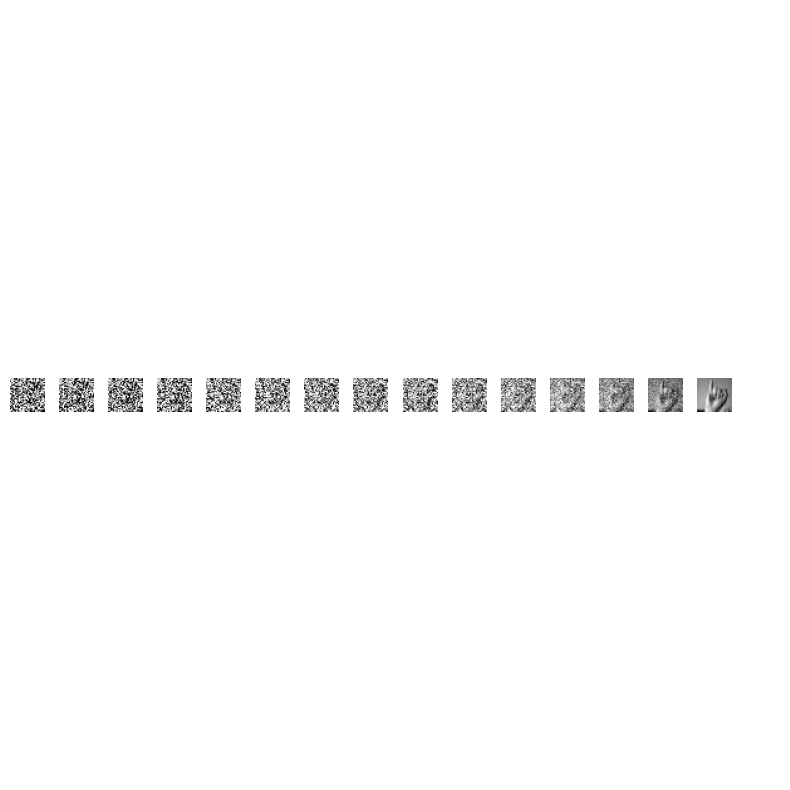

Epoch 29 | Step 100 | Loss: 0.022039 | LR: 0.00014700


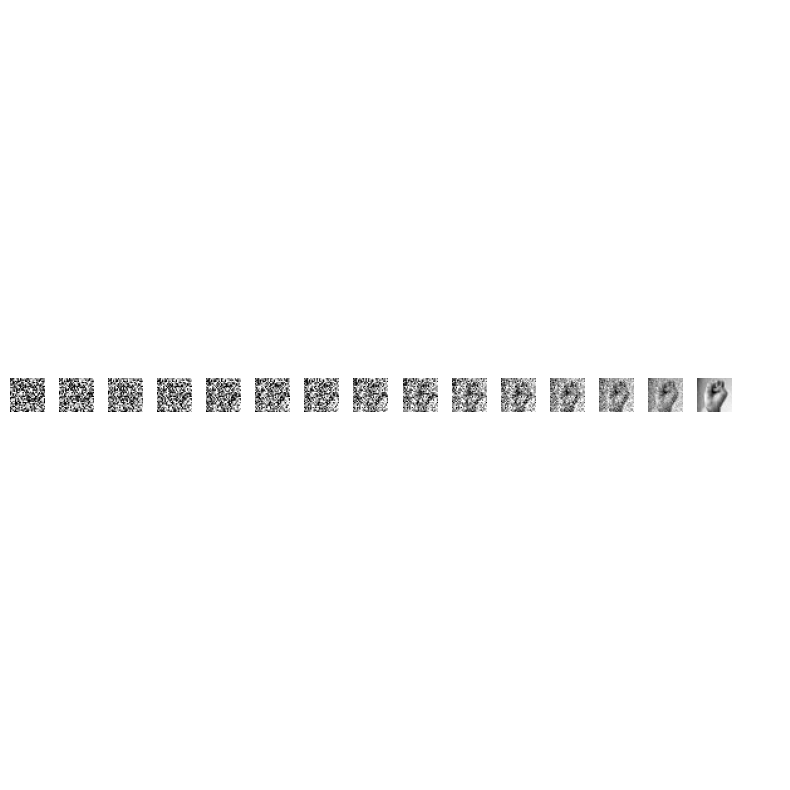

Epoch 30 | Step 000 | Loss: 0.044138 | LR: 0.00014700


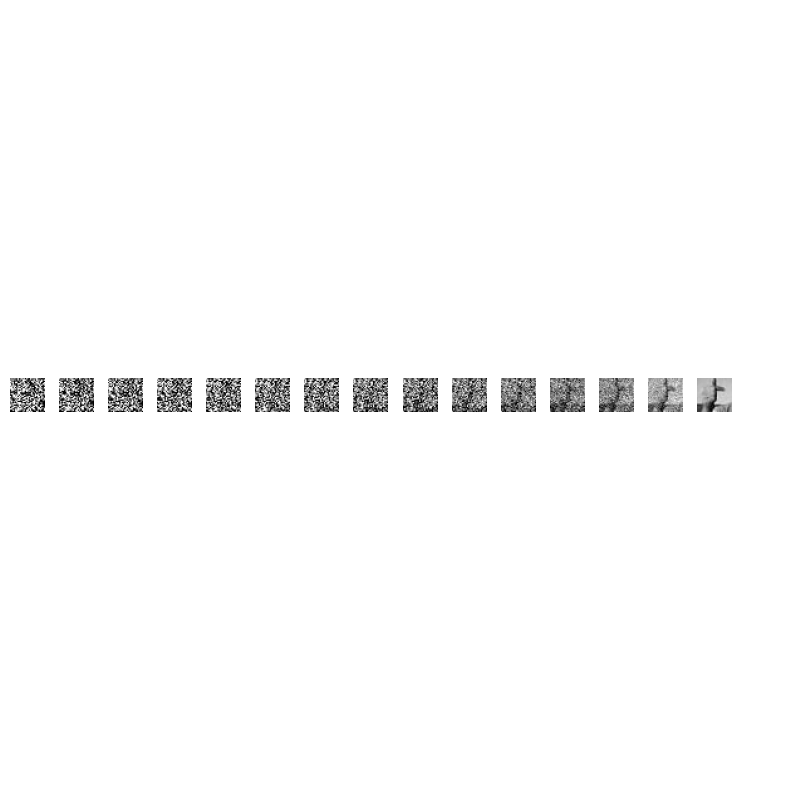

Epoch 30 | Step 100 | Loss: 0.027009 | LR: 0.00014700


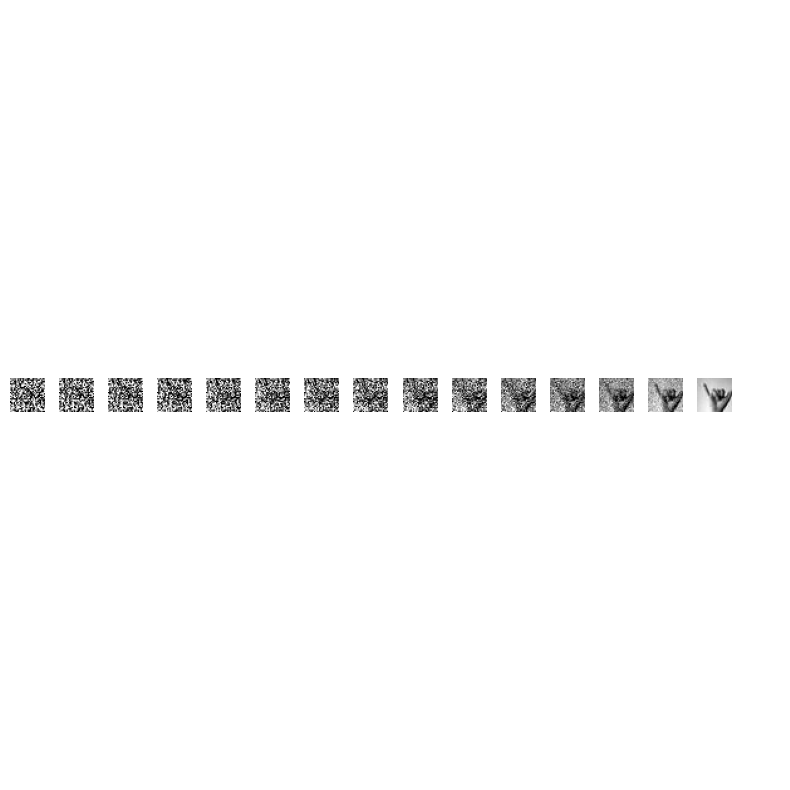

Epoch 31 | Step 000 | Loss: 0.023434 | LR: 0.00014700


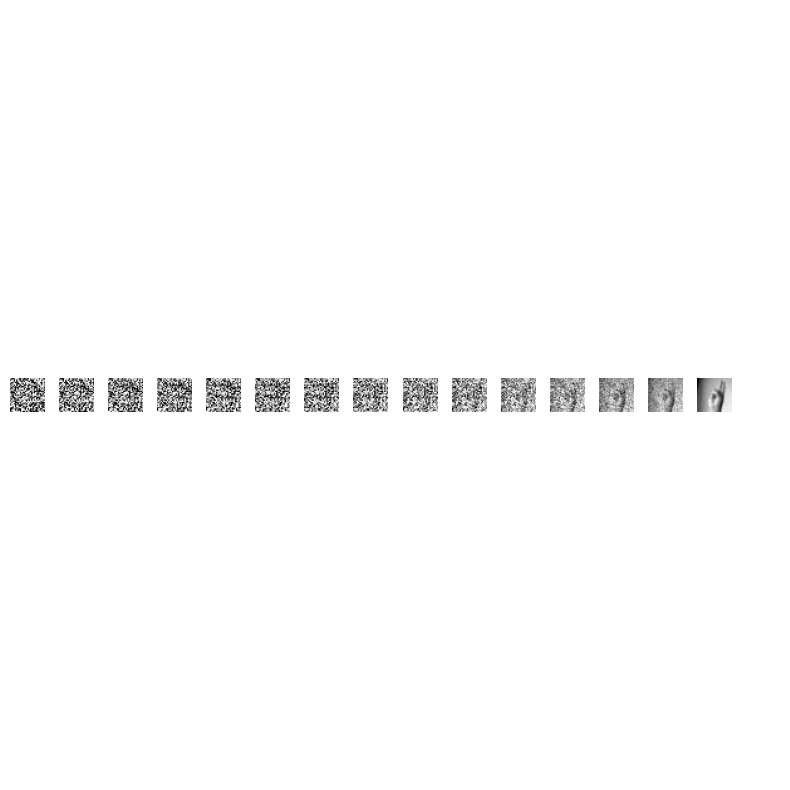

Epoch 31 | Step 100 | Loss: 0.020911 | LR: 0.00014700


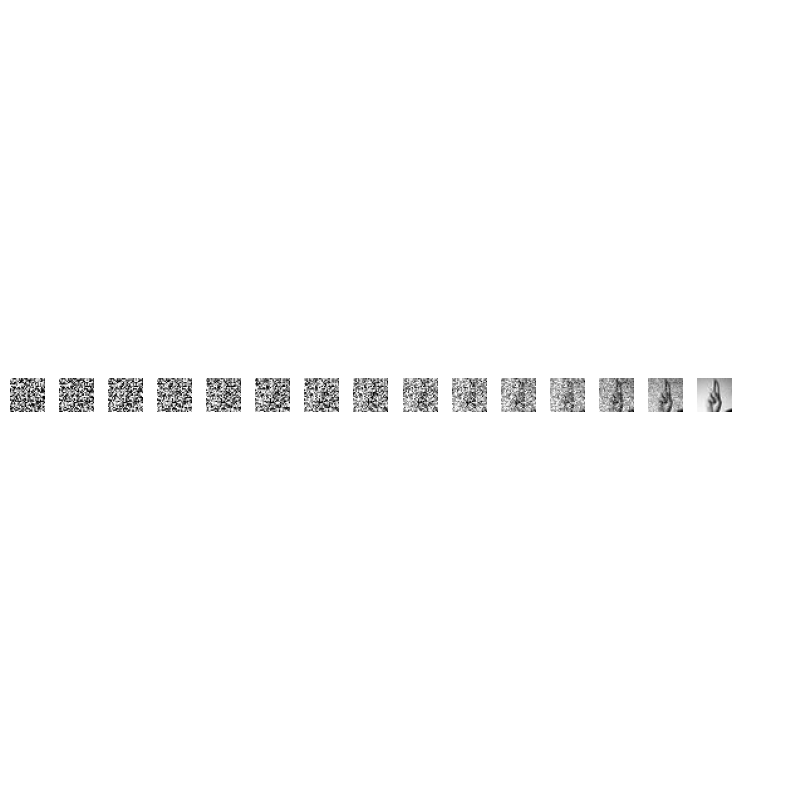

Epoch 32 | Step 000 | Loss: 0.014379 | LR: 0.00014700


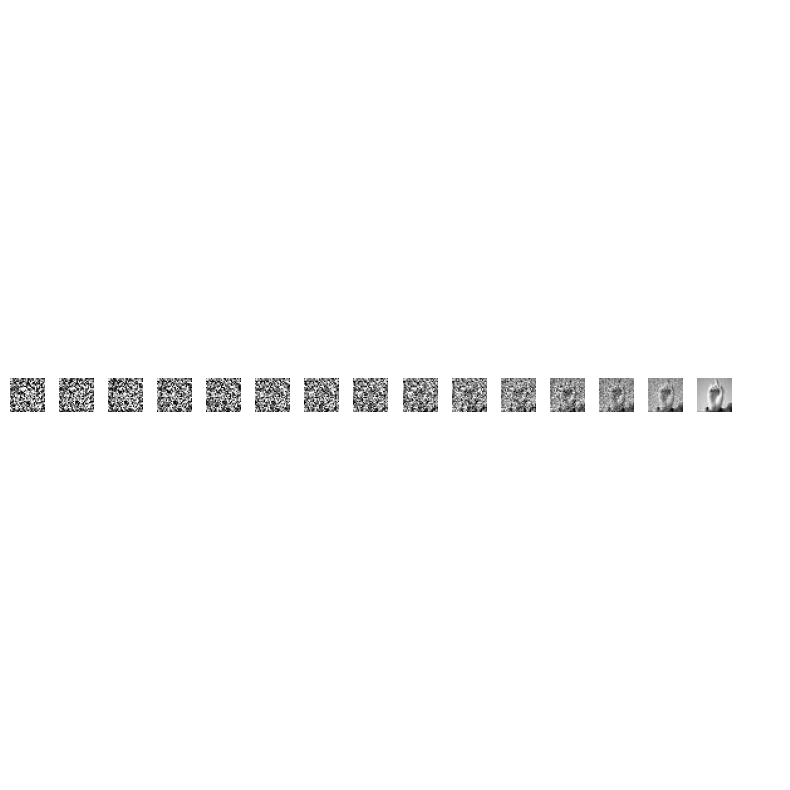

Epoch 32 | Step 100 | Loss: 0.034912 | LR: 0.00014700


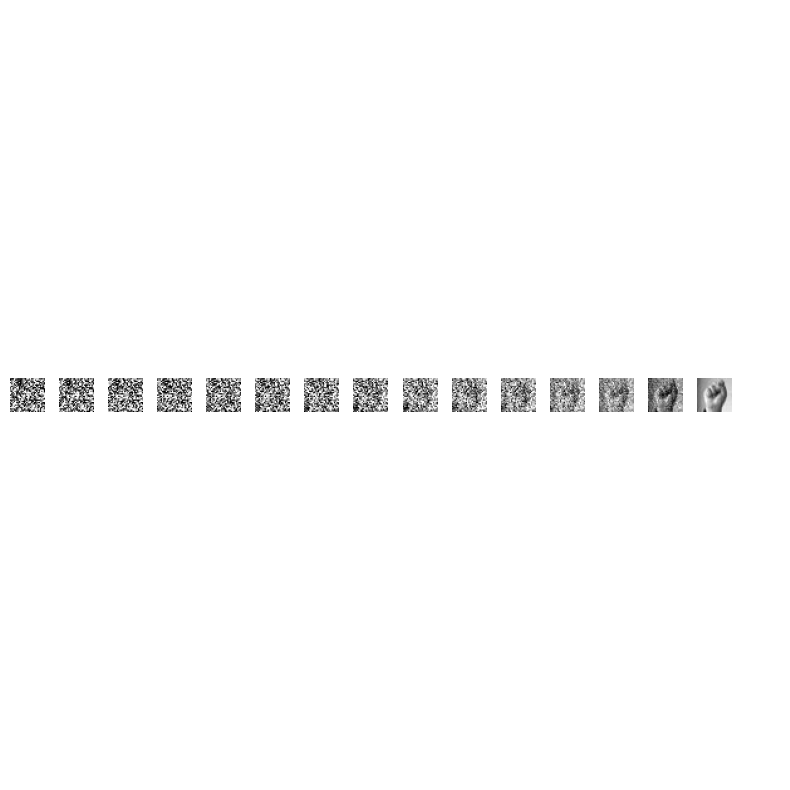

Epoch 33 | Step 000 | Loss: 0.024187 | LR: 0.00014700


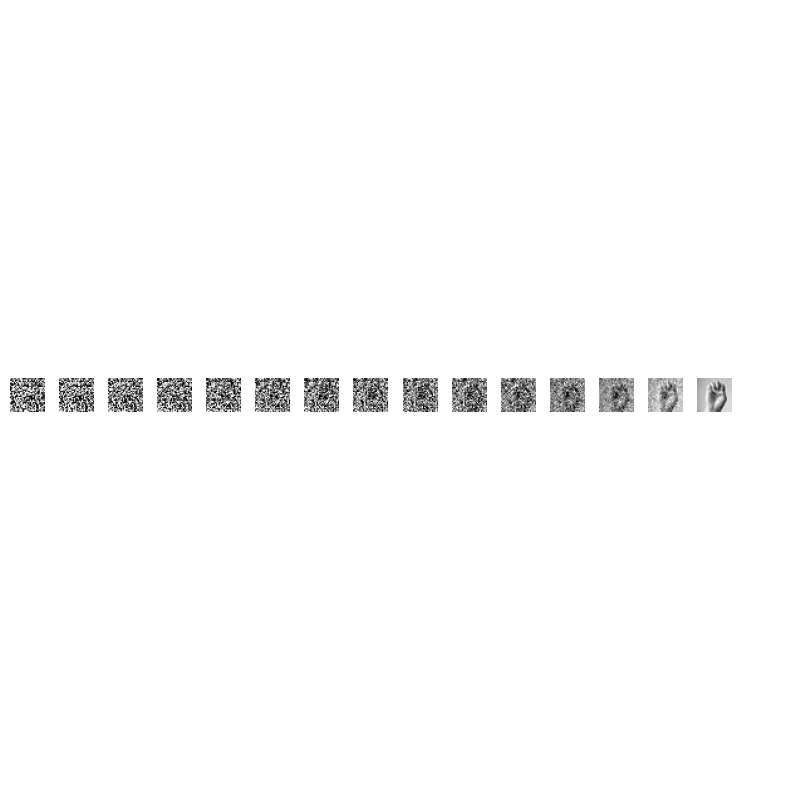

Epoch 33 | Step 100 | Loss: 0.023909 | LR: 0.00014700


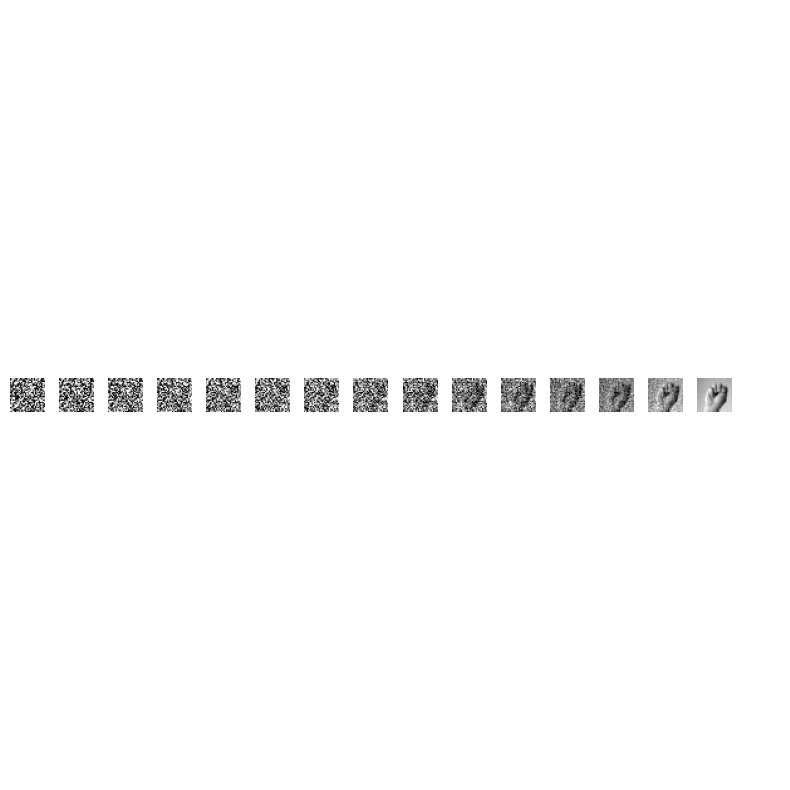

Epoch 34 | Step 000 | Loss: 0.029291 | LR: 0.00014700


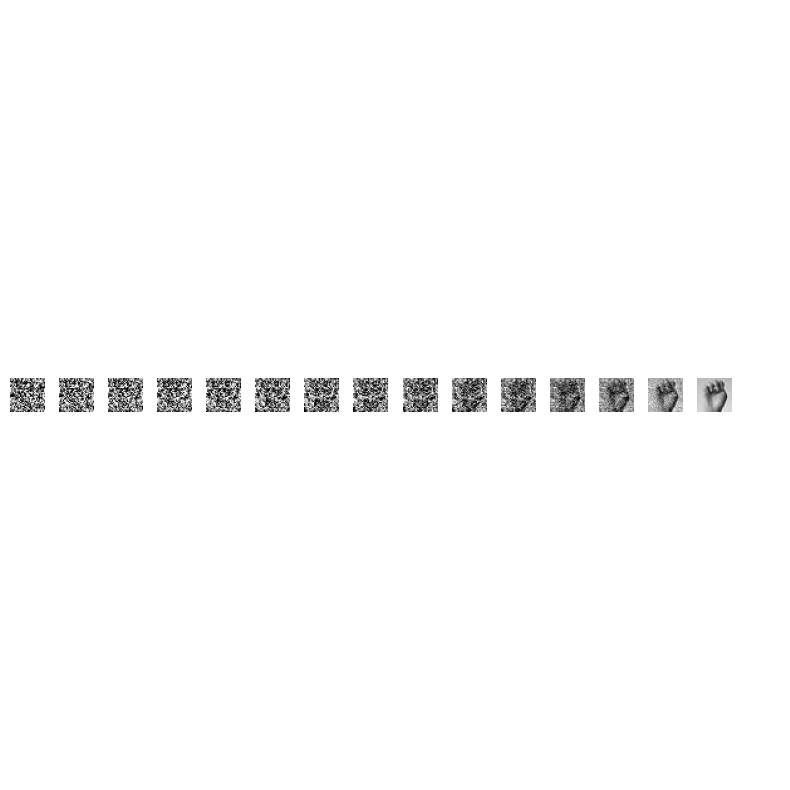

Epoch 34 | Step 100 | Loss: 0.036175 | LR: 0.00014700


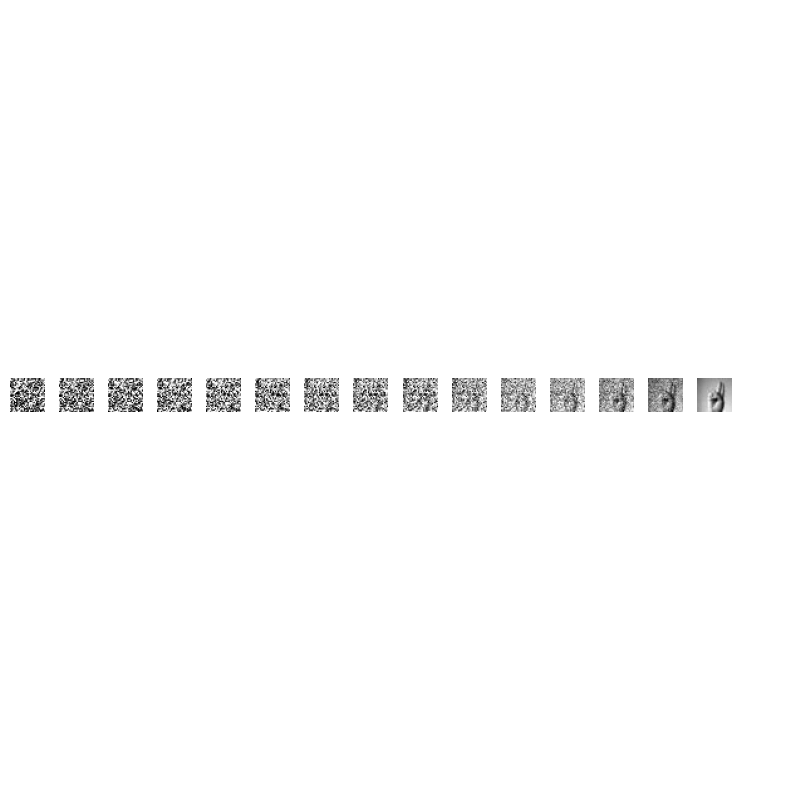

Epoch 35 | Step 000 | Loss: 0.039685 | LR: 0.00014700


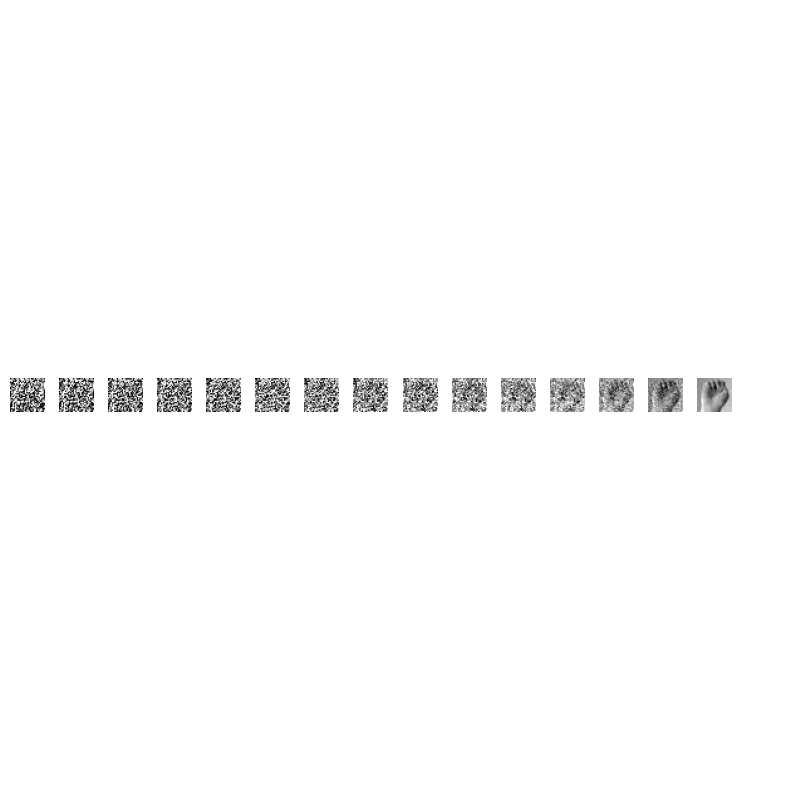

Epoch 35 | Step 100 | Loss: 0.030755 | LR: 0.00014700


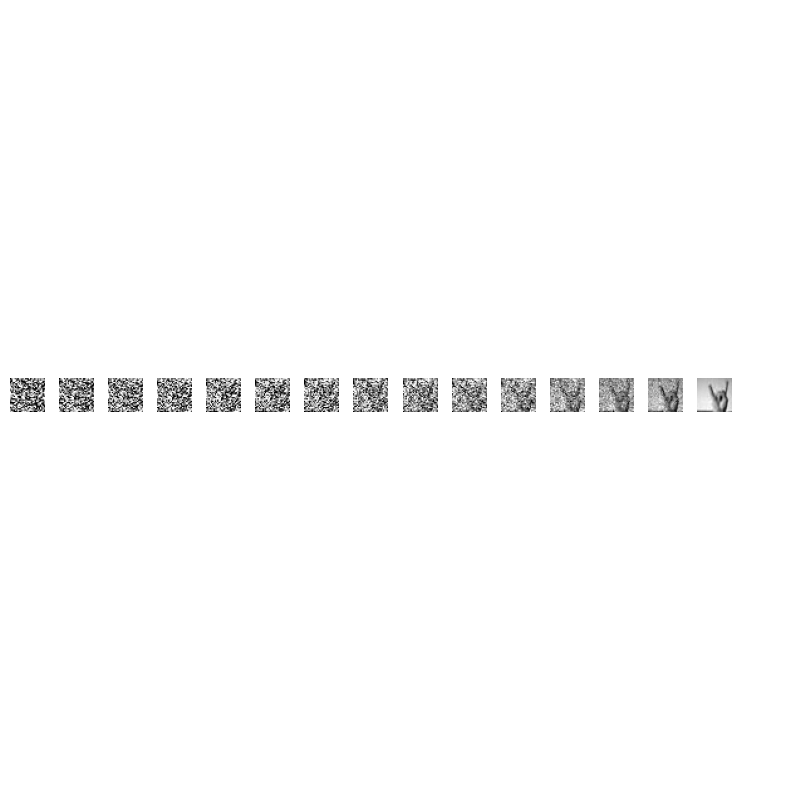

Epoch 36 | Step 000 | Loss: 0.031418 | LR: 0.00010290


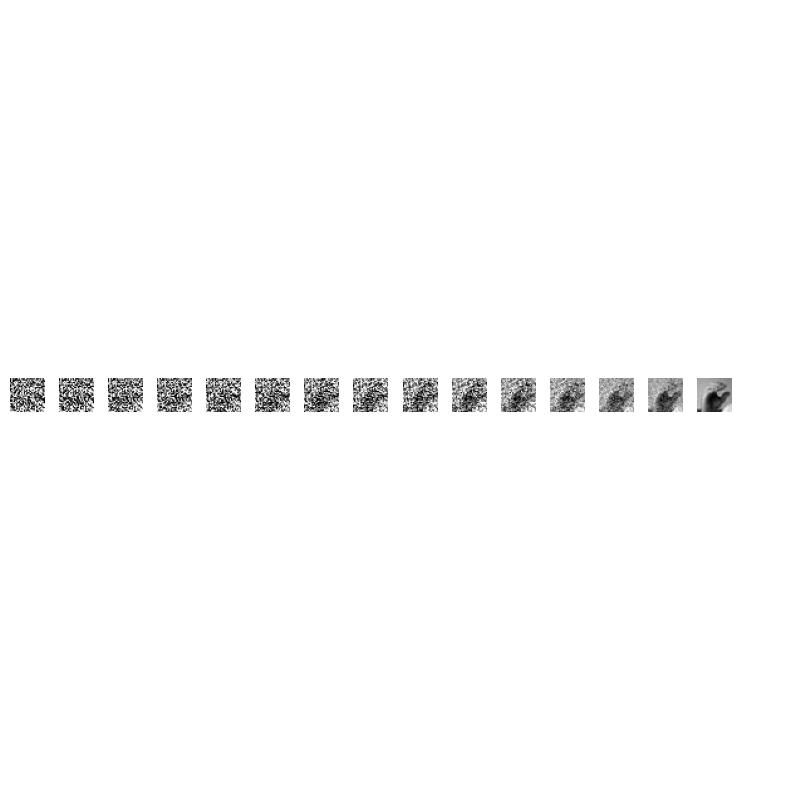

Epoch 36 | Step 100 | Loss: 0.019555 | LR: 0.00010290


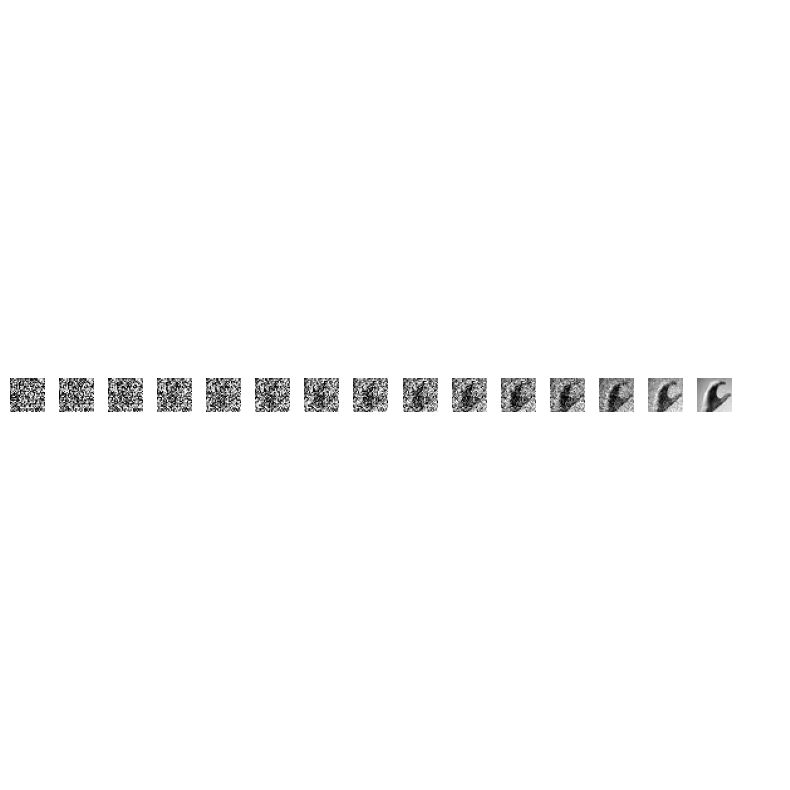

Epoch 37 | Step 000 | Loss: 0.035401 | LR: 0.00010290


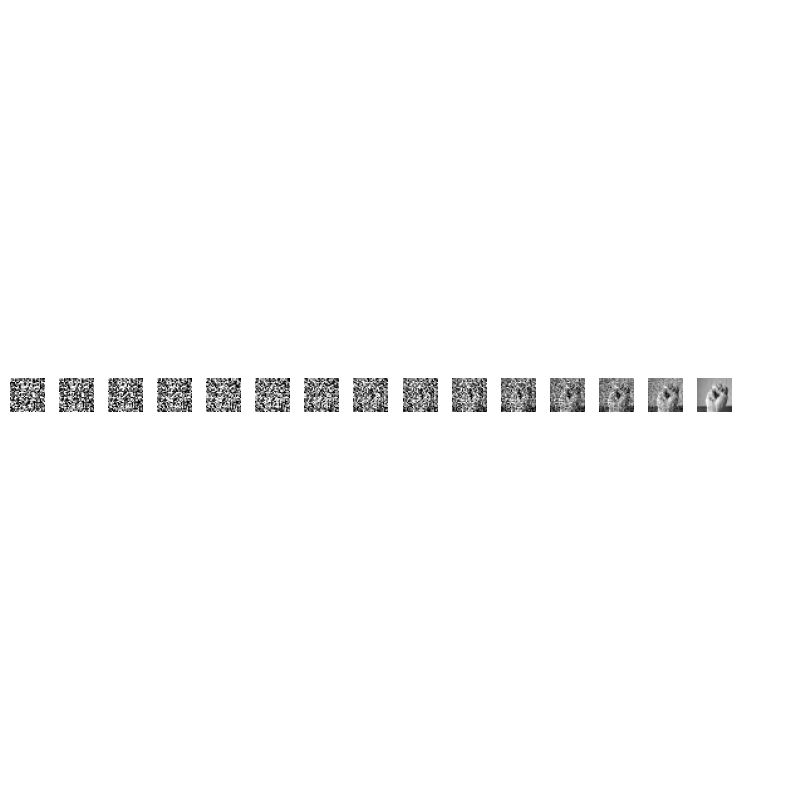

Epoch 37 | Step 100 | Loss: 0.042528 | LR: 0.00010290


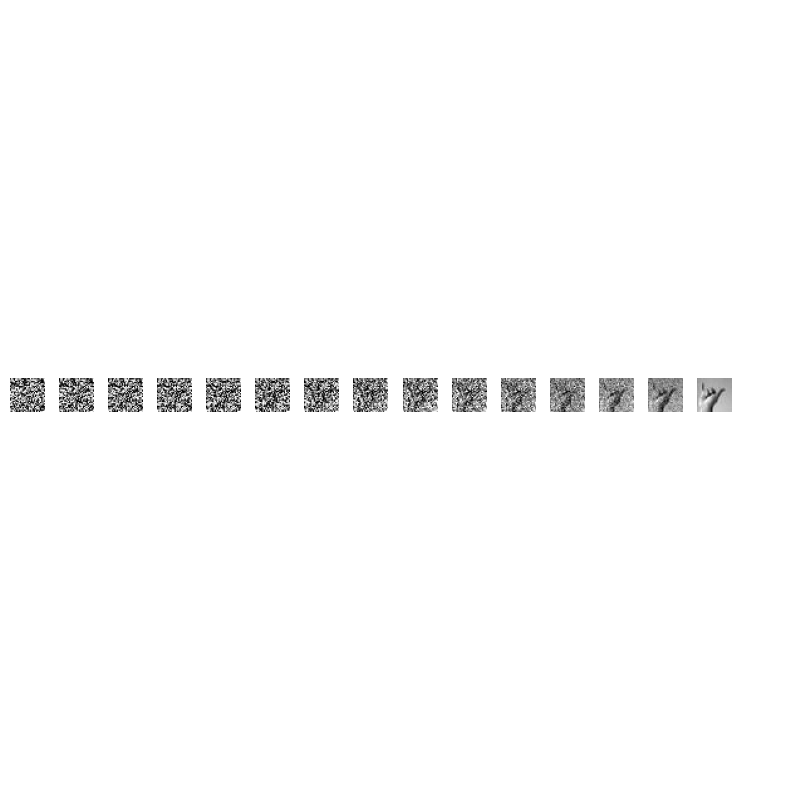

Epoch 38 | Step 000 | Loss: 0.022141 | LR: 0.00010290


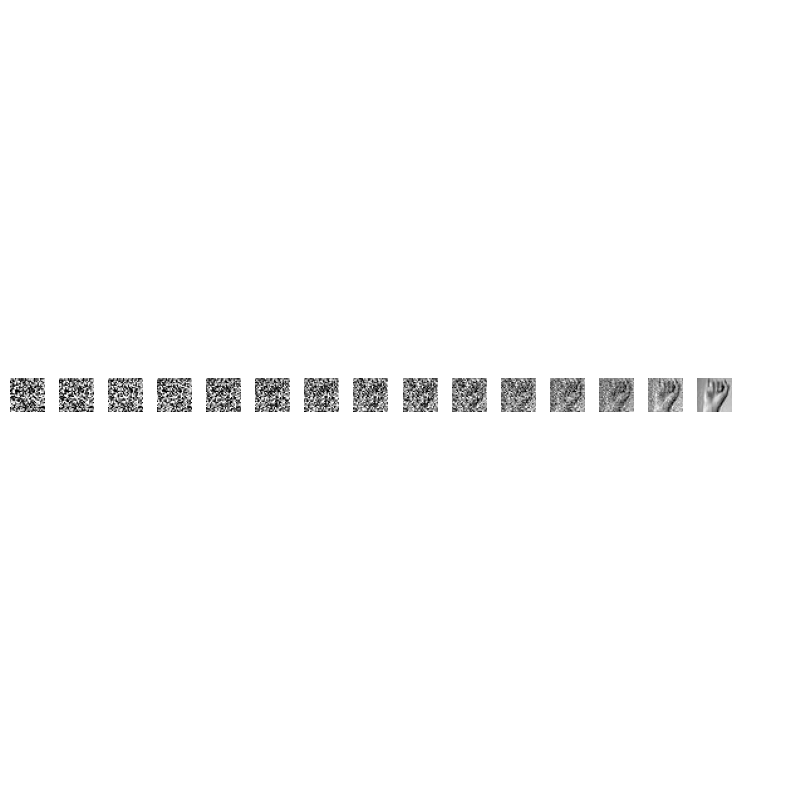

Epoch 38 | Step 100 | Loss: 0.026232 | LR: 0.00010290


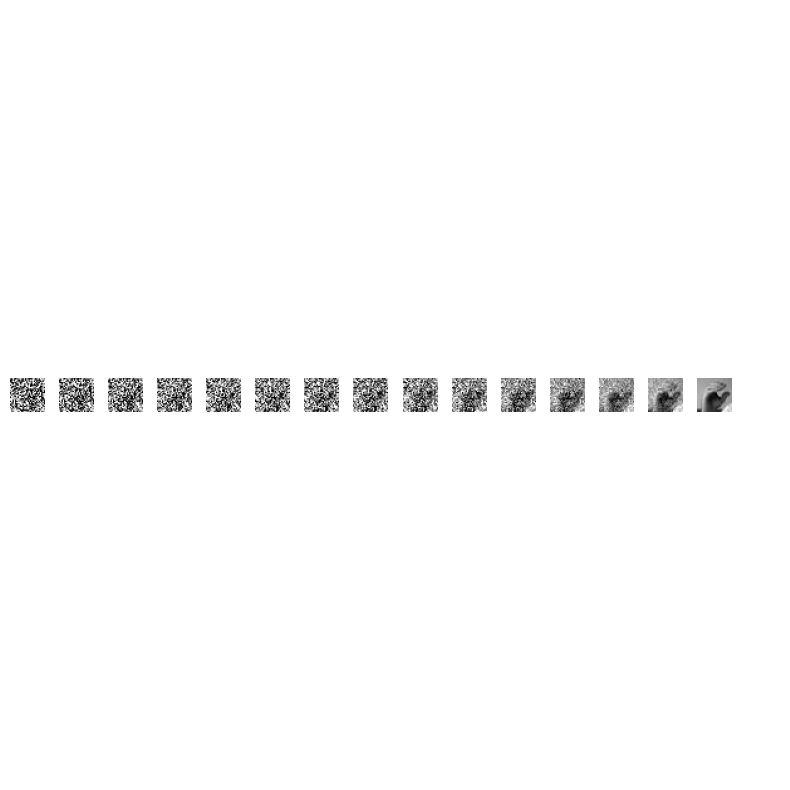

Epoch 39 | Step 000 | Loss: 0.028708 | LR: 0.00010290


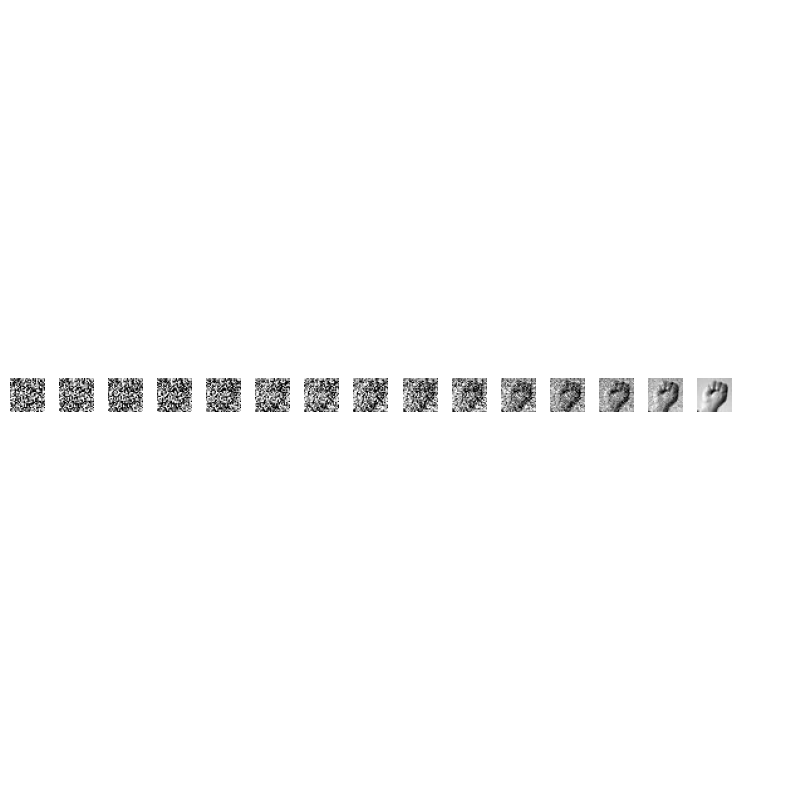

Epoch 39 | Step 100 | Loss: 0.034813 | LR: 0.00010290


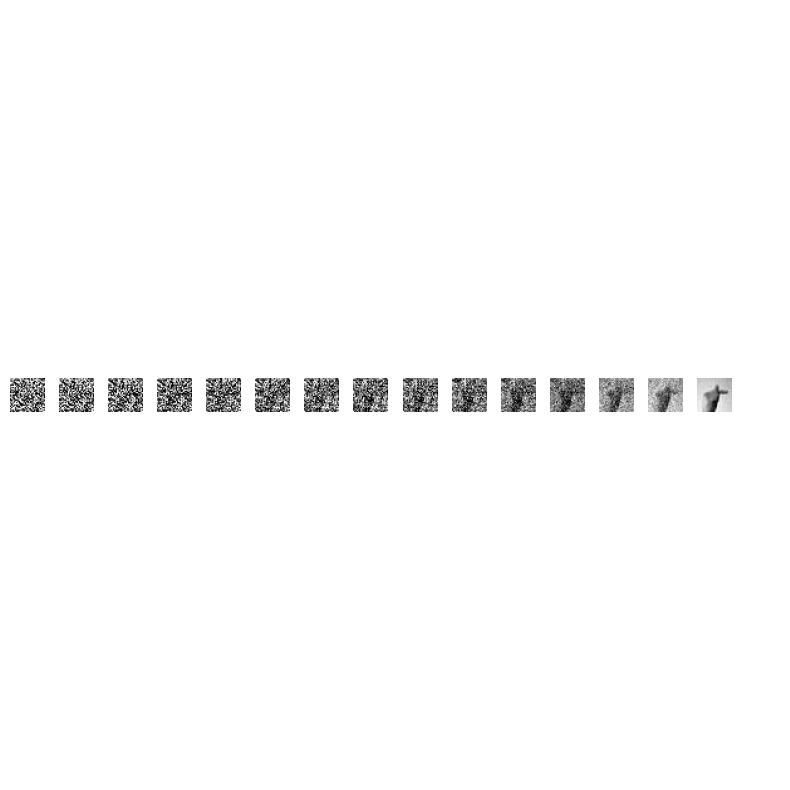

Epoch 40 | Step 000 | Loss: 0.034796 | LR: 0.00010290


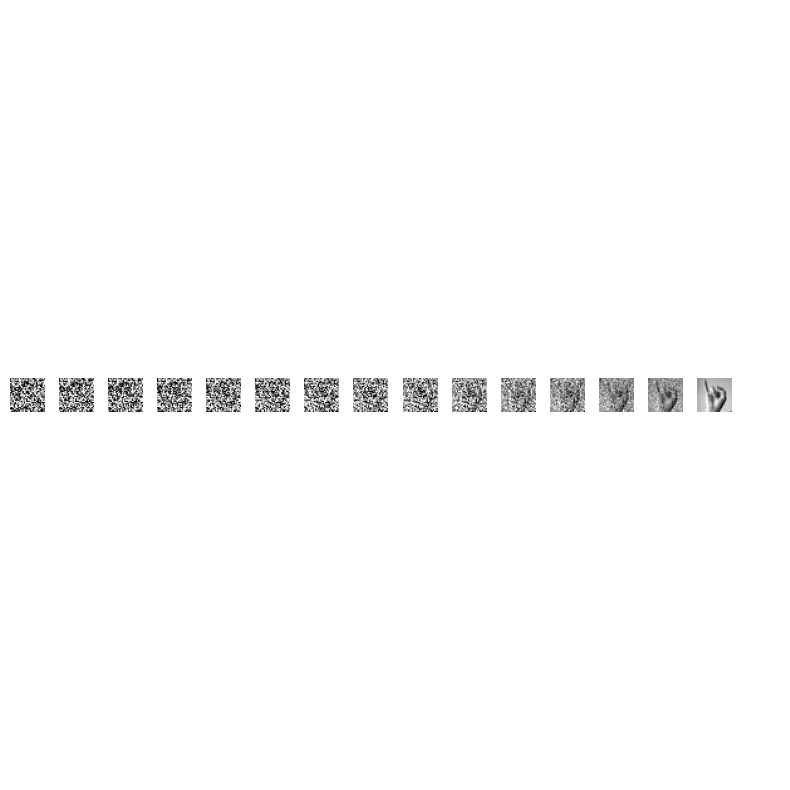

Epoch 40 | Step 100 | Loss: 0.028199 | LR: 0.00010290


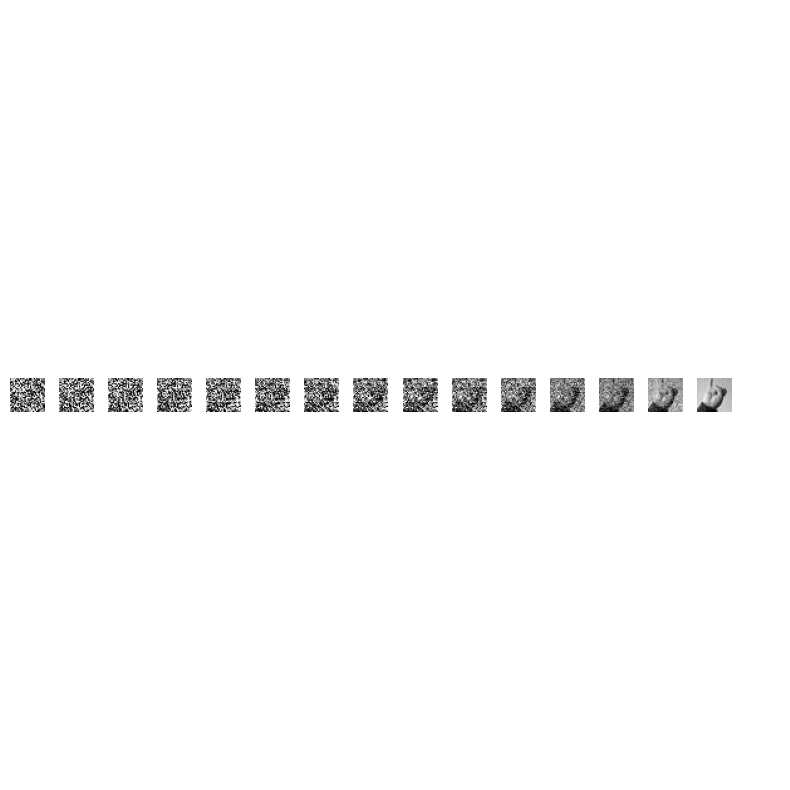

Epoch 41 | Step 000 | Loss: 0.022858 | LR: 0.00010290


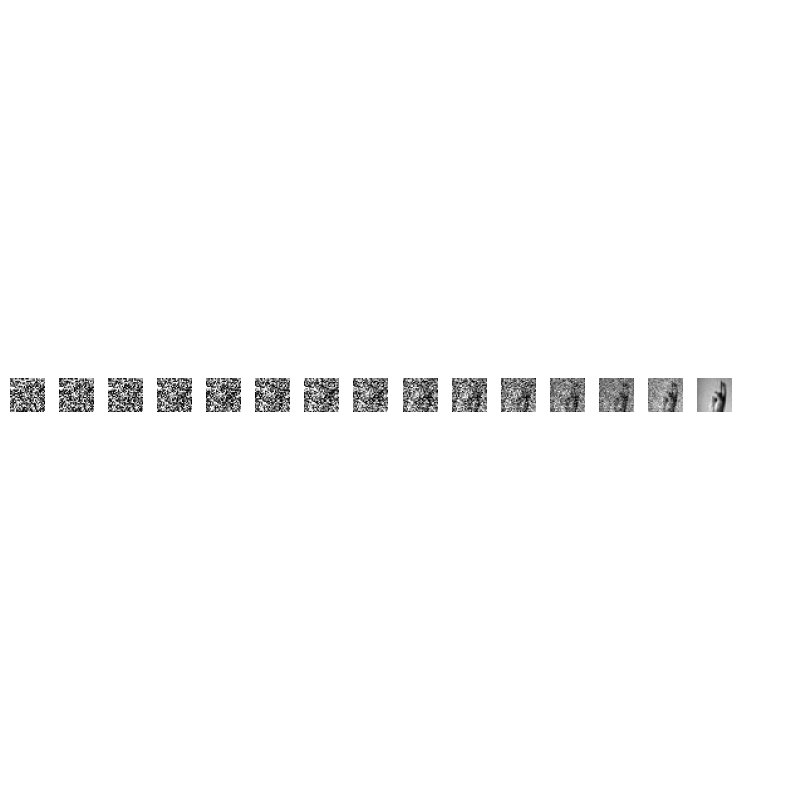

Epoch 41 | Step 100 | Loss: 0.017461 | LR: 0.00010290


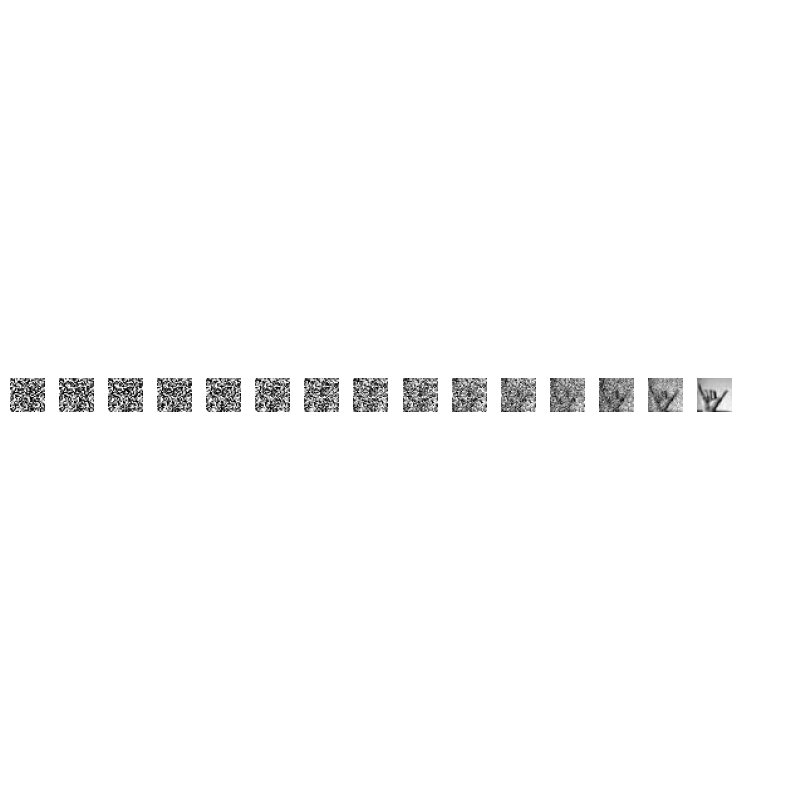

Epoch 42 | Step 000 | Loss: 0.030848 | LR: 0.00010290


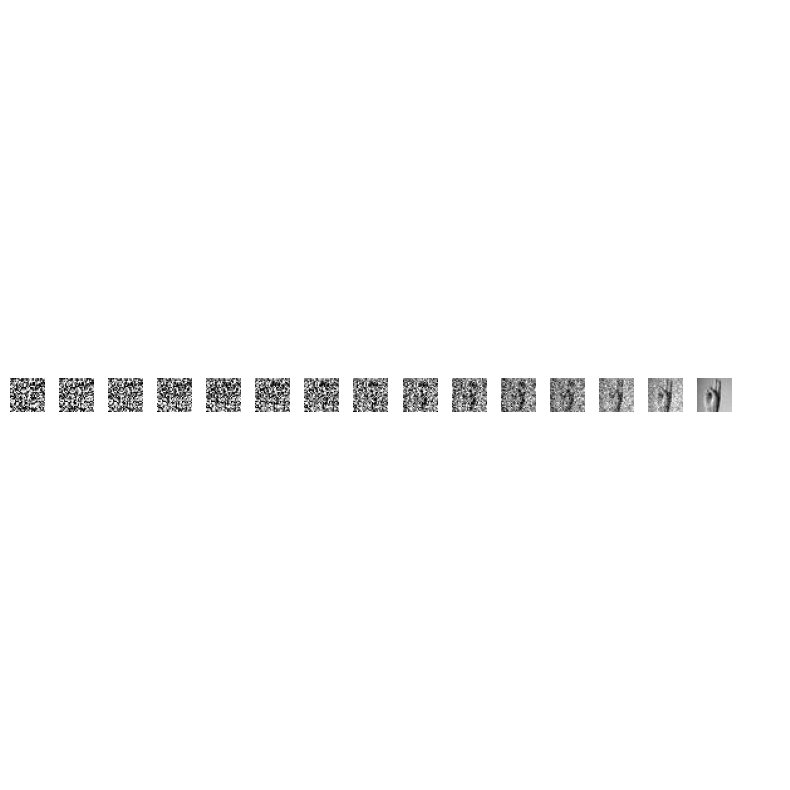

Epoch 42 | Step 100 | Loss: 0.039769 | LR: 0.00010290


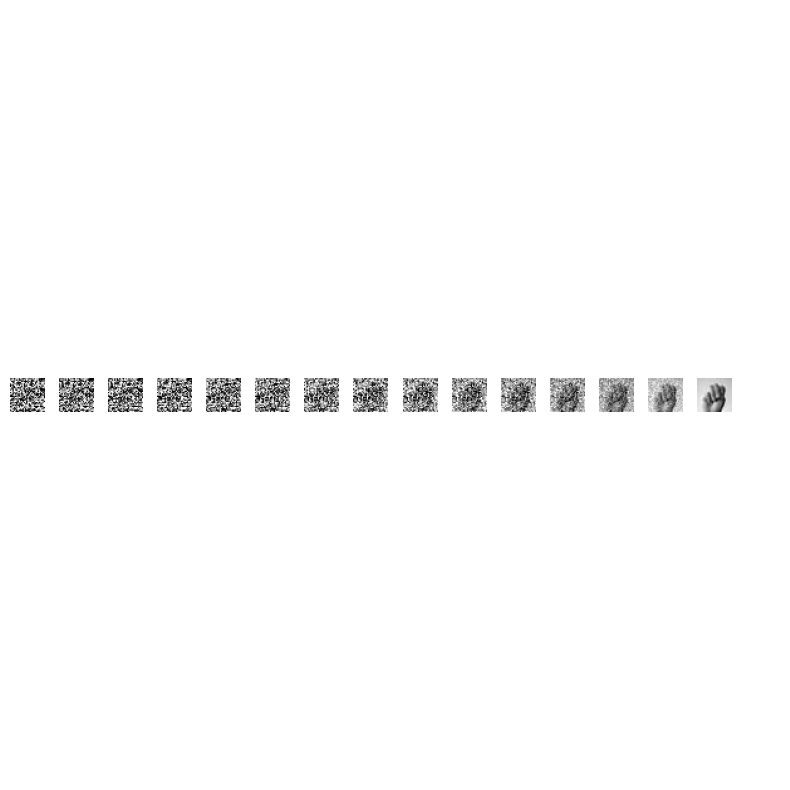

Epoch 43 | Step 000 | Loss: 0.026743 | LR: 0.00010290


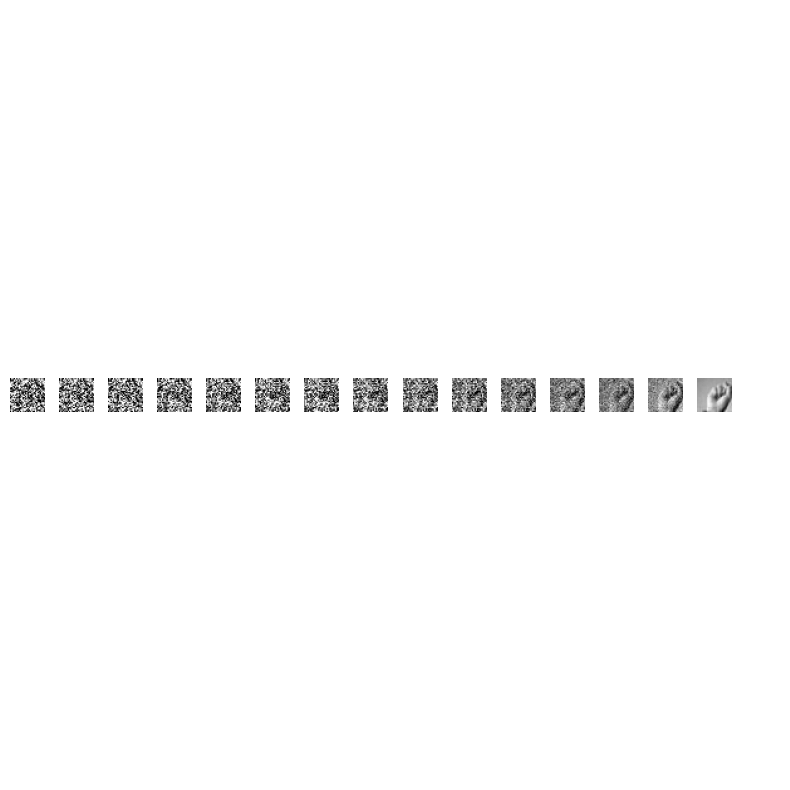

Epoch 43 | Step 100 | Loss: 0.028560 | LR: 0.00010290


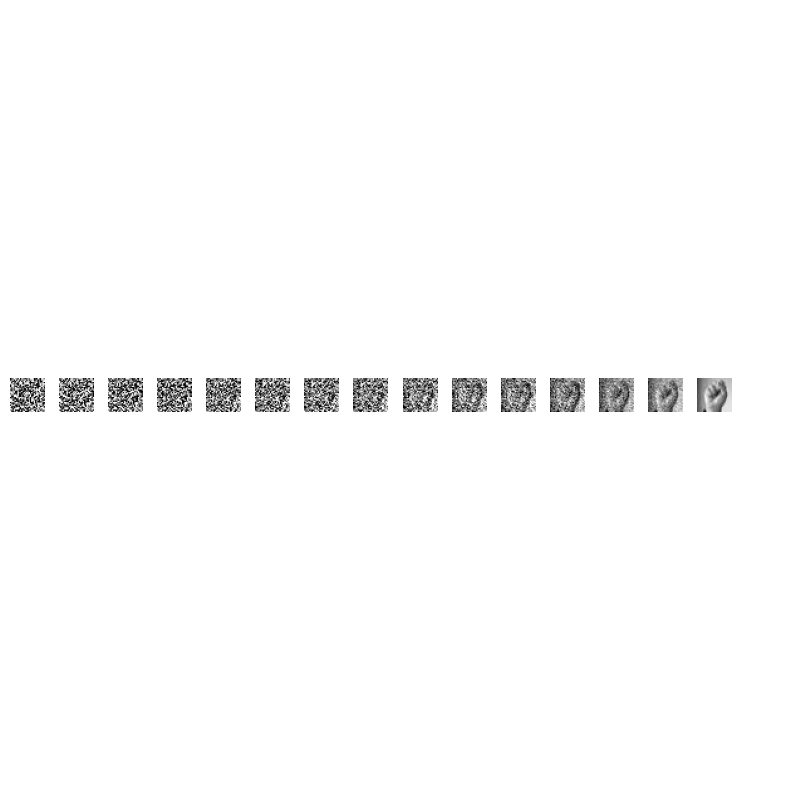

Epoch 44 | Step 000 | Loss: 0.019899 | LR: 0.00010290


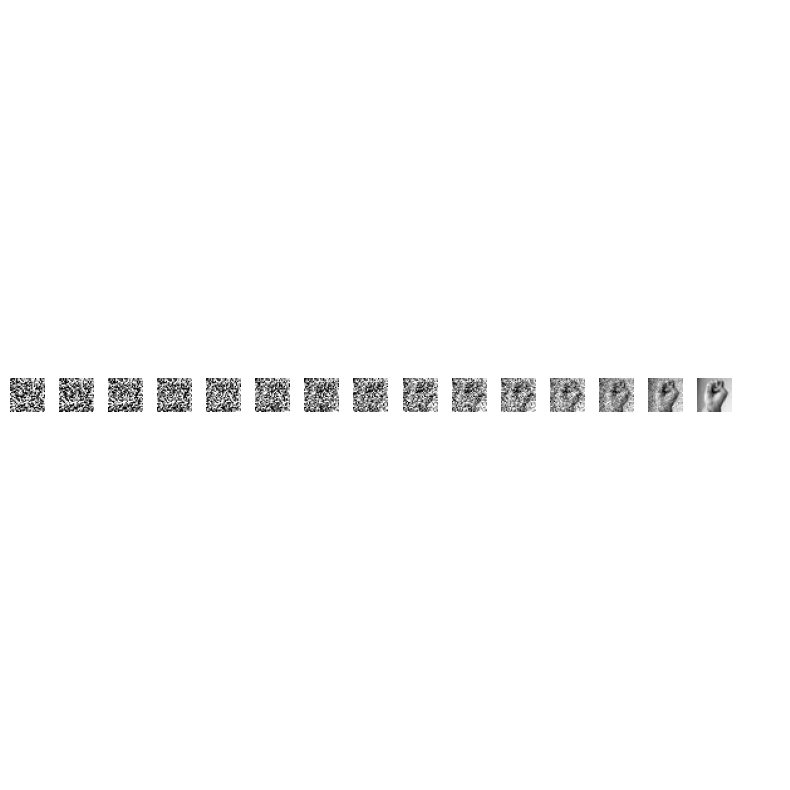

Epoch 44 | Step 100 | Loss: 0.034174 | LR: 0.00010290


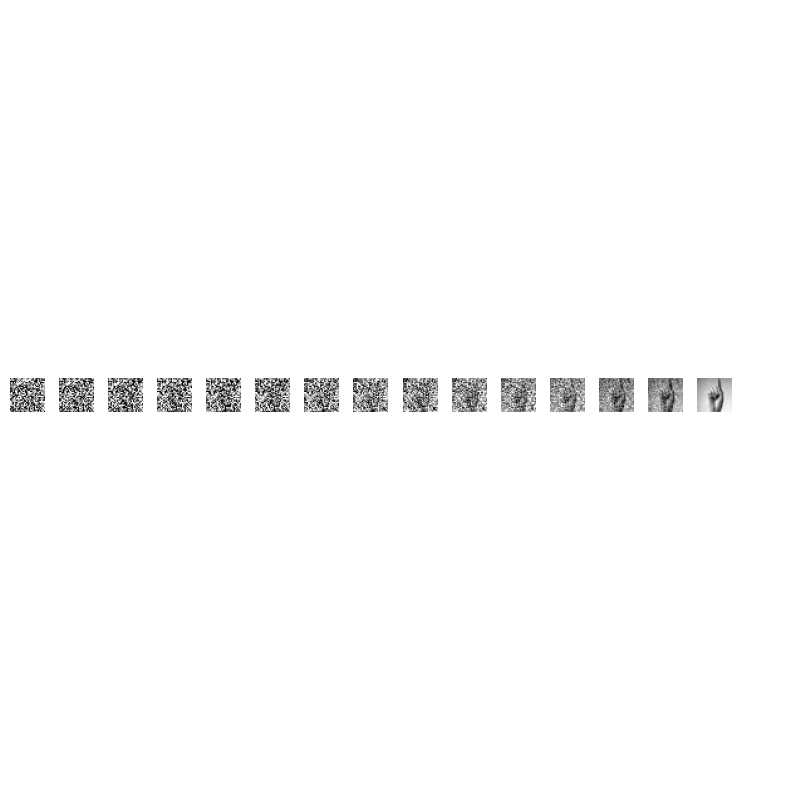

Epoch 45 | Step 000 | Loss: 0.045622 | LR: 0.00010290


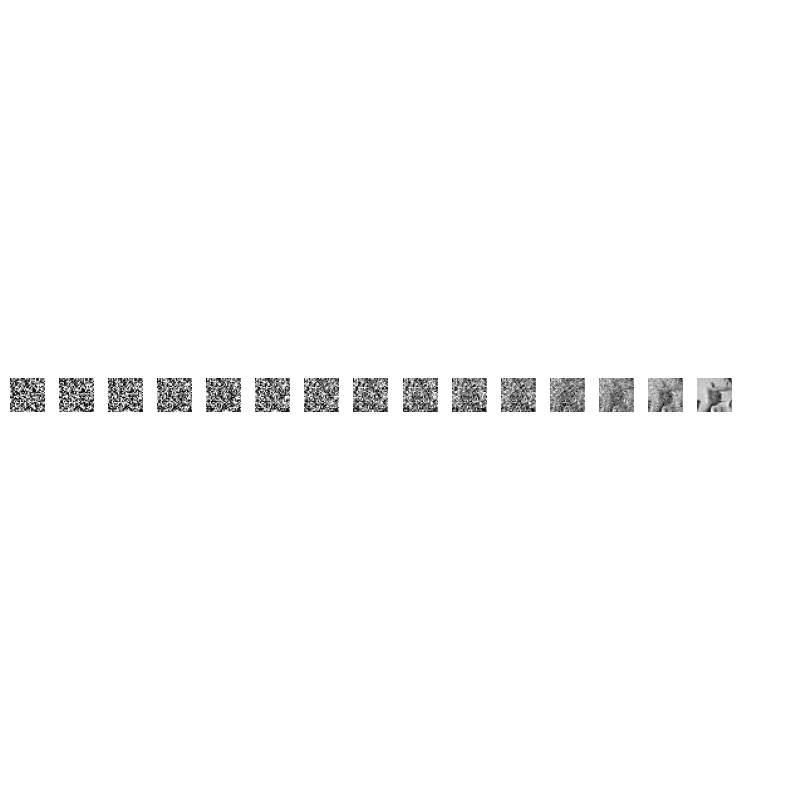

Epoch 45 | Step 100 | Loss: 0.020775 | LR: 0.00010290


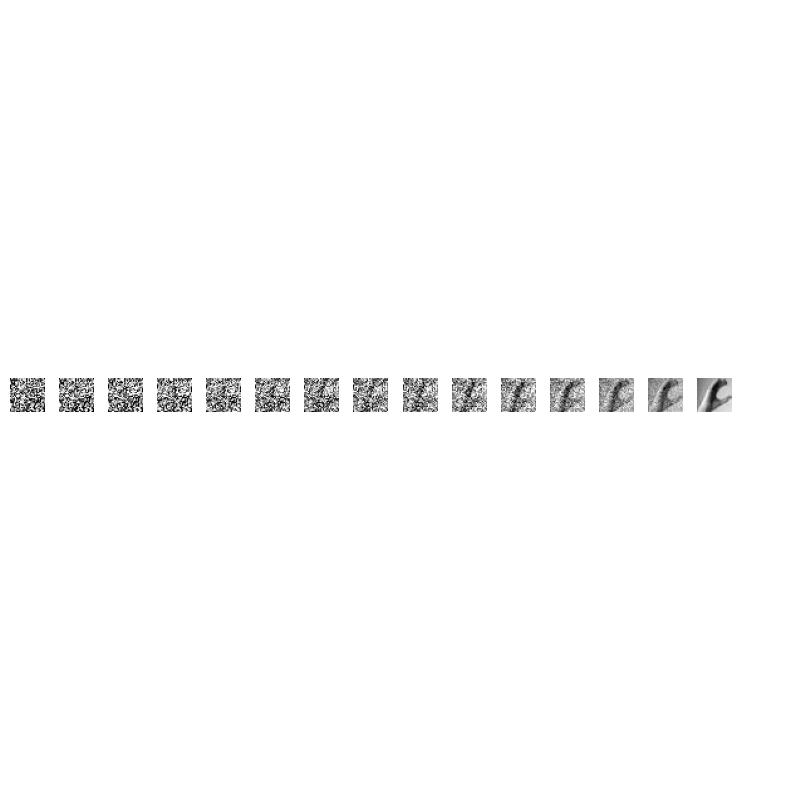

Epoch 46 | Step 000 | Loss: 0.025393 | LR: 0.00010290


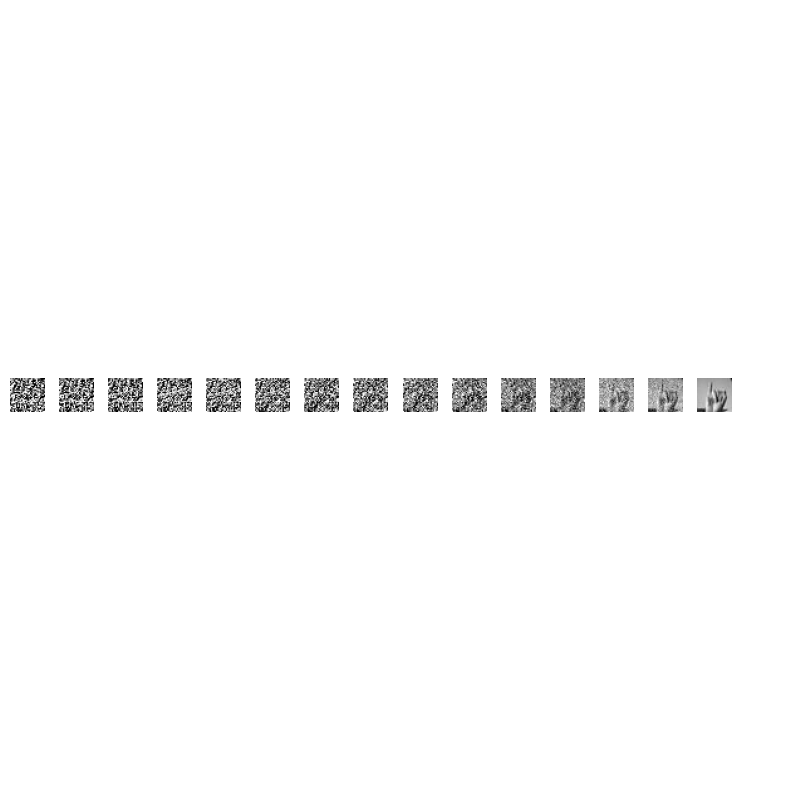

Epoch 46 | Step 100 | Loss: 0.035493 | LR: 0.00010290


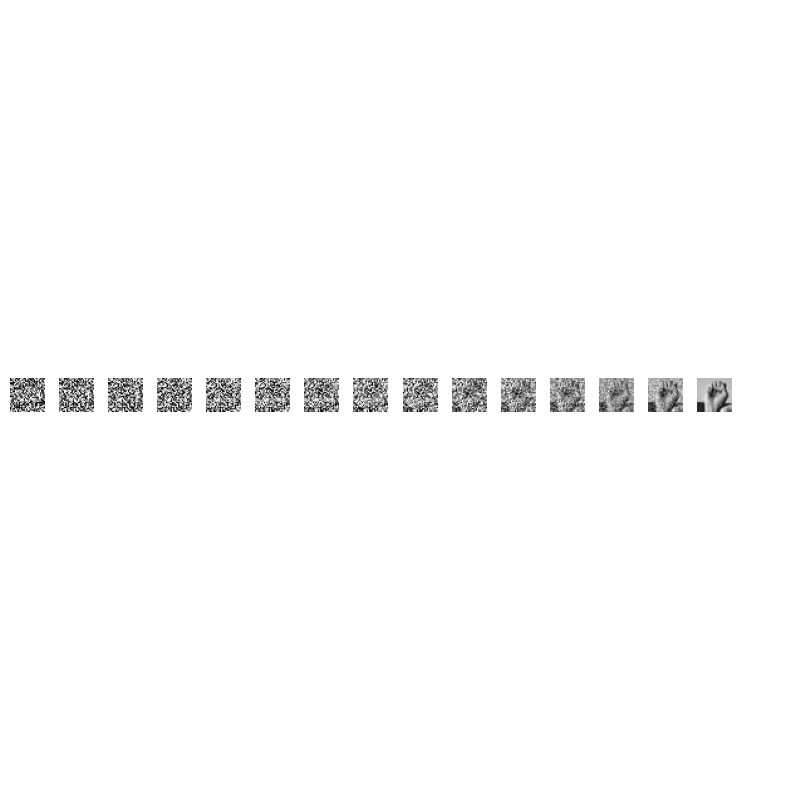

Epoch 47 | Step 000 | Loss: 0.023088 | LR: 0.00010290


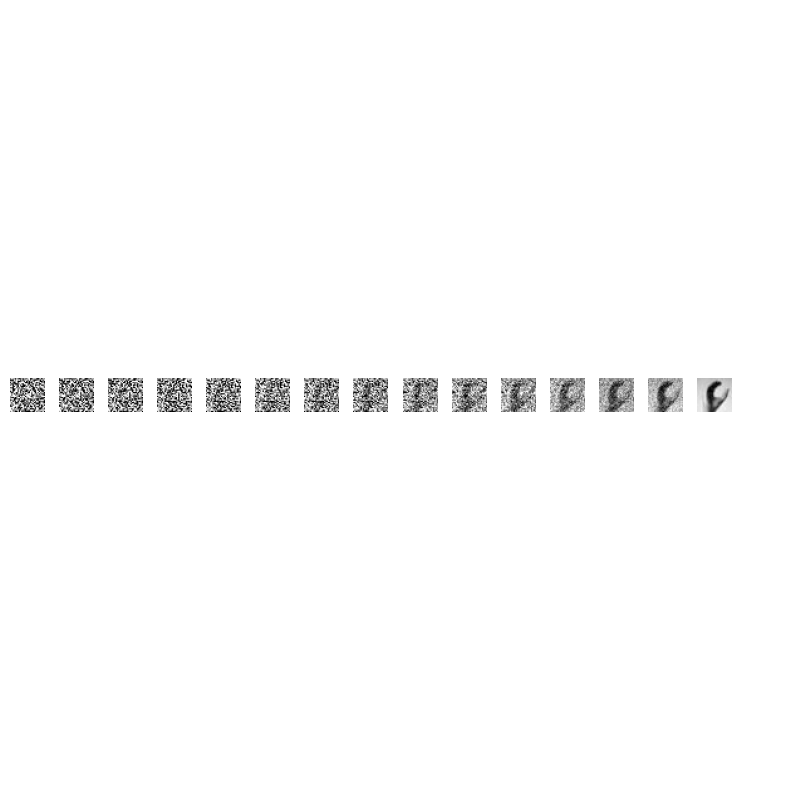

Epoch 47 | Step 100 | Loss: 0.027218 | LR: 0.00010290


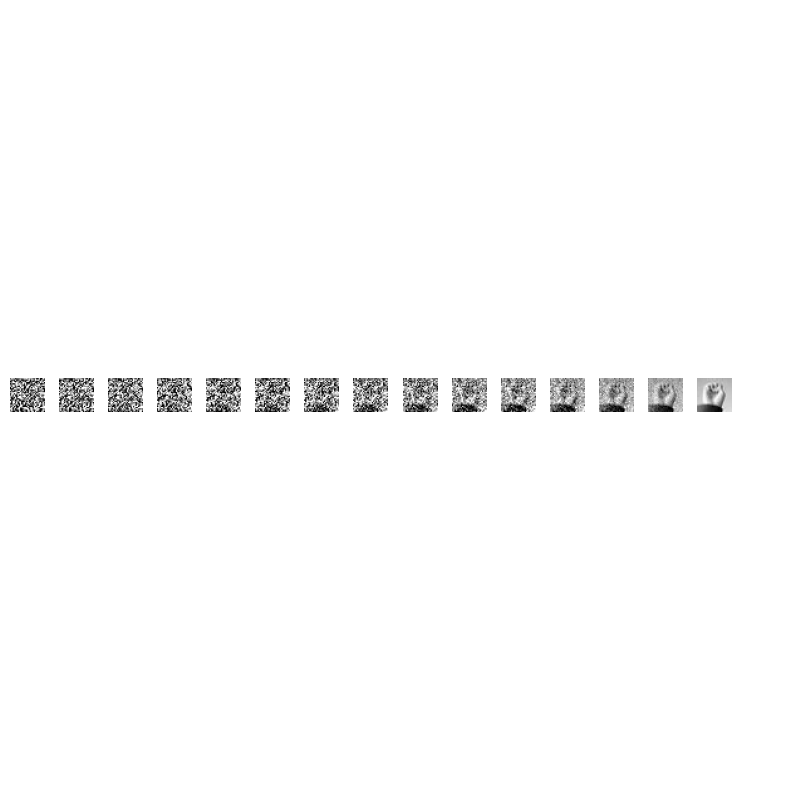

Epoch 48 | Step 000 | Loss: 0.039023 | LR: 0.00007203


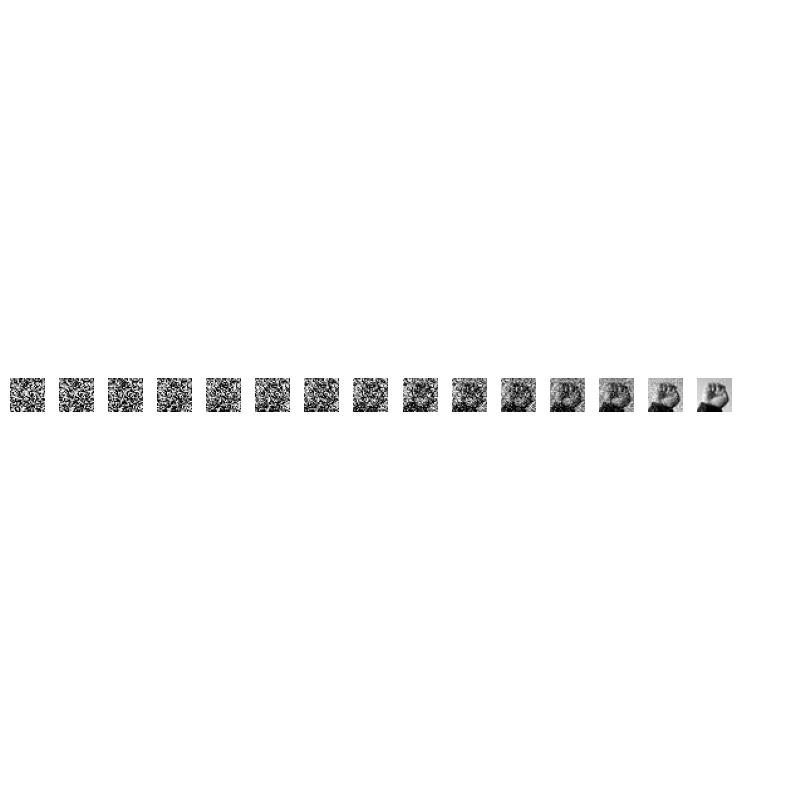

Epoch 48 | Step 100 | Loss: 0.042642 | LR: 0.00007203


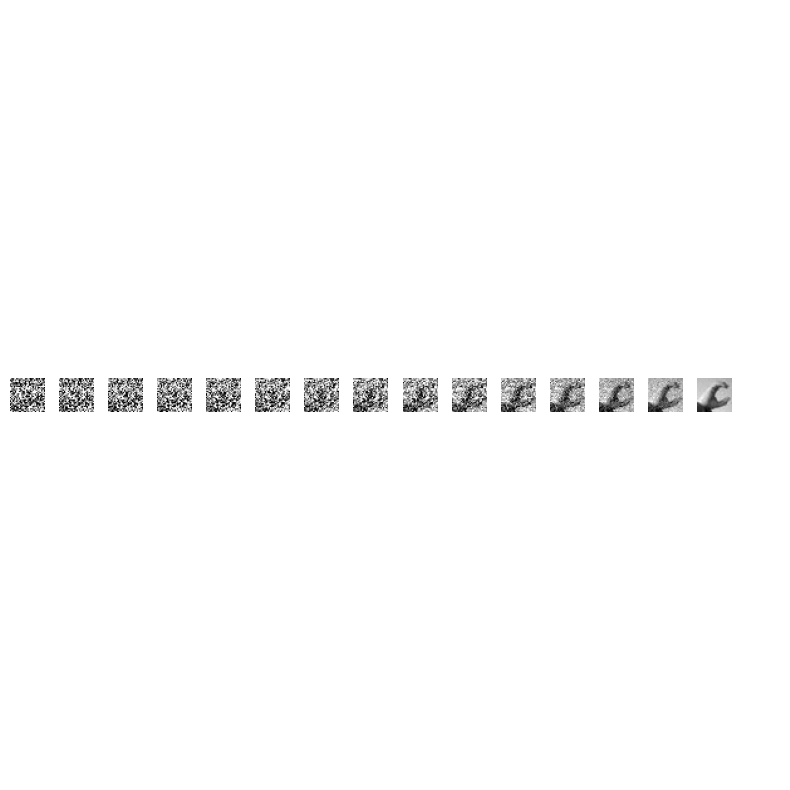

Epoch 49 | Step 000 | Loss: 0.020889 | LR: 0.00007203


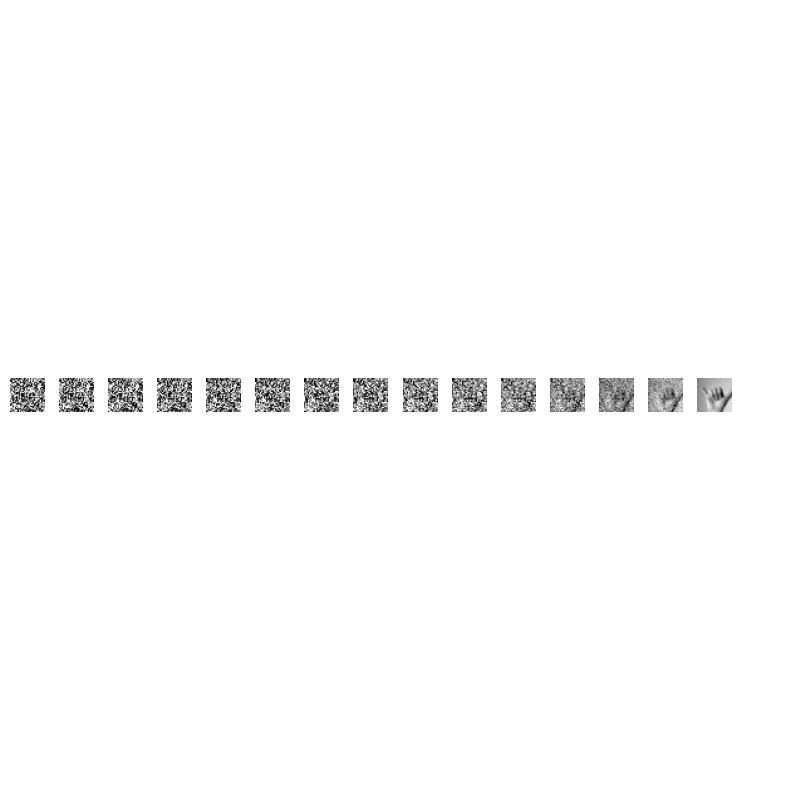

Epoch 49 | Step 100 | Loss: 0.029370 | LR: 0.00007203


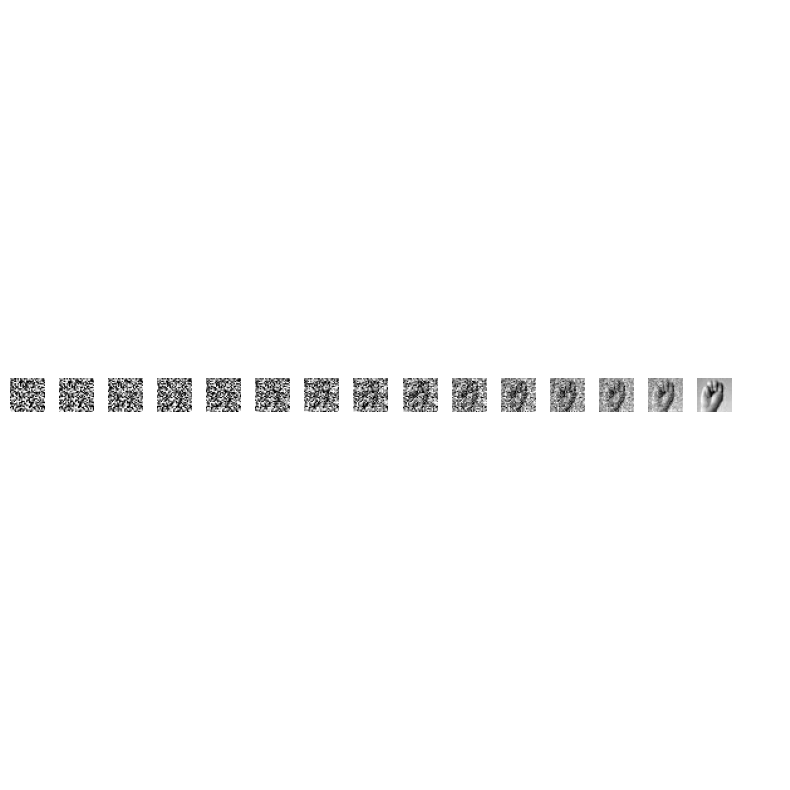

Hyperparameter-tuned model training complete!
Final sample:


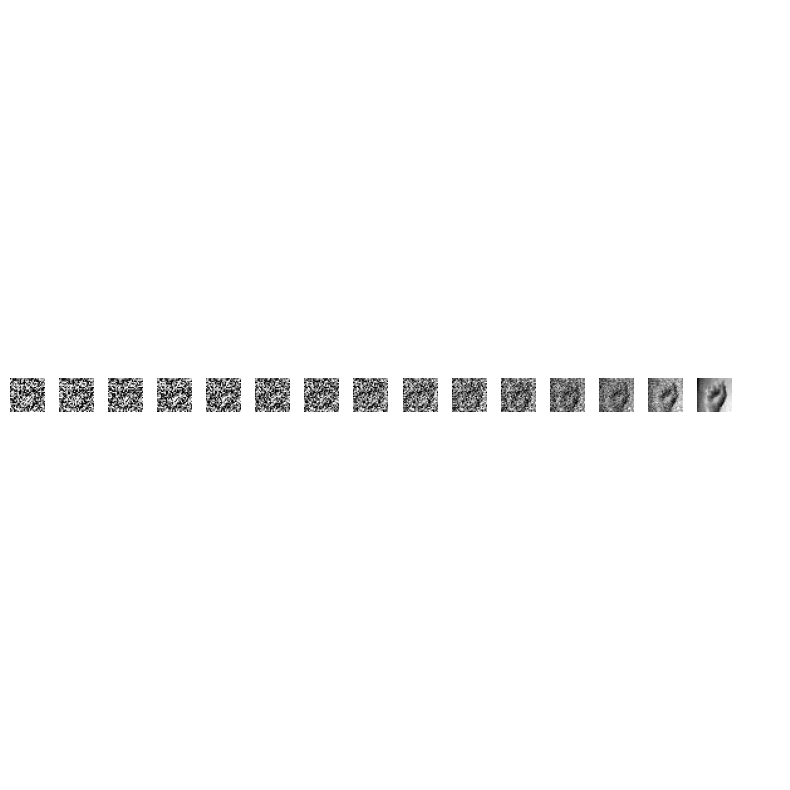

tensor([[[[-5.3450e-01, -5.2095e-01, -3.7426e-01, -3.9566e-01, -3.2954e-01,
           -3.0542e-01, -2.5244e-01, -2.2631e-01, -1.9147e-01, -2.3661e-01,
           -1.7529e-01, -1.7452e-01, -1.5175e-01, -9.2608e-02, -7.8824e-02,
           -8.3723e-02, -1.4153e-02, -2.4090e-02, -4.4302e-02, -1.7076e-02,
            1.8666e-02,  1.8894e-02,  3.0816e-02, -2.3507e-03,  2.0939e-02,
            2.5911e-02,  5.4449e-02,  4.9675e-02],
          [-5.9268e-01, -5.3681e-01, -3.6266e-01, -3.7781e-01, -3.4538e-01,
           -2.9170e-01, -2.3269e-01, -2.3527e-01, -2.3134e-01, -1.8248e-01,
           -1.8767e-01, -1.3537e-01, -9.6302e-02, -4.9206e-02, -8.4771e-02,
           -8.2410e-02, -8.3757e-02,  3.6799e-03,  1.1208e-02,  1.5724e-02,
            7.5543e-02, -1.6454e-02,  1.4880e-02,  3.2823e-02,  3.6692e-02,
            6.4275e-02,  4.7351e-02,  7.7474e-02],
          [-5.8317e-01, -4.9057e-01, -3.9307e-01, -3.4031e-01, -3.3097e-01,
           -2.9504e-01, -2.4486e-01, -2.0879e-01, -2.1130e-01,

In [33]:
# Training loop with tuned hyperparameters
ncols = 15

model_tuned.train()
print("=" * 70)
print("Starting Hyperparameter-Tuned Model Training")
print(f"Epochs: {TUNED_EPOCHS} | LR: {TUNED_LR} | Batch Size: {TUNED_BATCH_SIZE}")
print("=" * 70)
print()

for epoch in range(TUNED_EPOCHS):
    for step, batch in enumerate(dataloader_tuned):
        optimizer_tuned.zero_grad()

        t = torch.randint(0, T, (TUNED_BATCH_SIZE,), device=device)  # Random timesteps
        x = batch[0].to(device)
        labels = batch[1].to(device)  # Class labels for conditional generation
        
        loss = get_loss(model_tuned, x, t, labels)
        loss.backward()
        
        # Apply gradient clipping for stability
        torch.nn.utils.clip_grad_norm_(model_tuned.parameters(), MAX_GRAD_NORM)
        
        optimizer_tuned.step()

        # Sample images during training
        if epoch % 1 == 0 and step % 100 == 0:
            current_lr = optimizer_tuned.param_groups[0]['lr']
            print(f"Epoch {epoch} | Step {step:03d} | Loss: {loss.item():.6f} | LR: {current_lr:.8f}")
            model_tuned.eval()
            random_class = torch.randint(0, NUM_CLASSES, (1,)).item()
            sample_images(model_tuned, ncols, class_label=random_class)
            model_tuned.train()
    
    # Update learning rate scheduler
    scheduler_tuned.step()
            
print("Hyperparameter-tuned model training complete!")
print("Final sample:")
model_tuned.eval()
sample_images(model_tuned, ncols)

## 5. Final Evaluation

I evaluated the final tuned model by generating images from random noise with class conditions. This demonstrates conditional generation (specific ASL letters), random noise input, and overall image quality.

Model Evaluation: Generating Images from Random Noise

Generating image for class: A
Generating image for class: C
Generating image for class: D
Generating image for class: E
Generating image for class: I
Generating image for class: M
Generating image for class: S
Generating image for class: T
Generating image for class: U
Generating image for class: Y


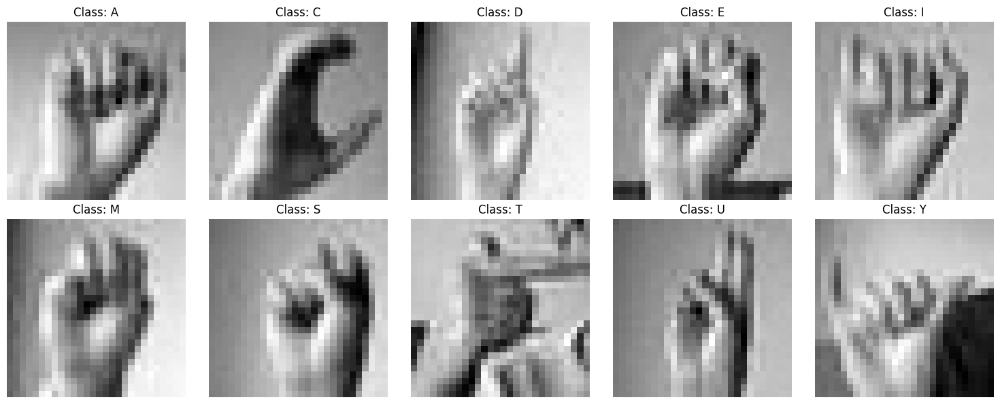


Additional Random Samples
Sample 1/10: Generating class 'E' from random noise...
Sample 2/10: Generating class 'D' from random noise...
Sample 3/10: Generating class 'A' from random noise...
Sample 4/10: Generating class 'T' from random noise...
Sample 5/10: Generating class 'U' from random noise...
Sample 6/10: Generating class 'M' from random noise...
Sample 7/10: Generating class 'U' from random noise...
Sample 8/10: Generating class 'C' from random noise...
Sample 9/10: Generating class 'T' from random noise...
Sample 10/10: Generating class 'D' from random noise...


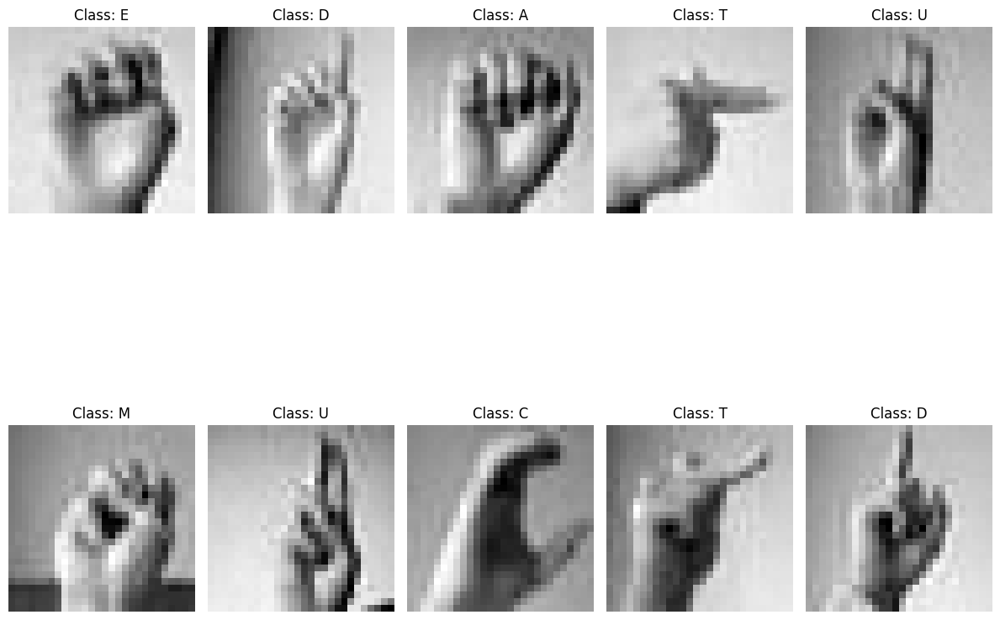


Evaluation complete!


In [34]:
# Generate images from random noise with class conditions
model_tuned.eval()

print("=" * 70)
print("Model Evaluation: Generating Images from Random Noise")
print("=" * 70)
print()

# Generate one image for each class
fig, axes = plt.subplots(2, 5, figsize=(15, 6))
for class_idx, class_name in enumerate(data.classes):
    print(f"Generating image for class: {class_name}")
    
    # Start from random noise
    random_noise = torch.randn((1, IMG_CH, IMG_SIZE, IMG_SIZE), device=device)
    
    # Set class condition (which ASL letter to generate)
    class_label = class_idx
    class_tensor = torch.tensor([class_label], device=device)
    
    # Generate image using reverse diffusion
    x_t = random_noise
    for i in range(T-1, -1, -1):
        t = torch.full((1,), i, device=device).float()
        e_t = model_tuned(x_t, t, class_tensor)  # Predict noise with class condition
        x_t = reverse_q(x_t, t, e_t)
    
    # Display generated image
    row, col = class_idx // 5, class_idx % 5
    img_display = (x_t[0] + 1) / 2  # Convert to [0,1] for display
    img_display = torch.clamp(img_display, 0, 1)
    axes[row, col].imshow(img_display.squeeze().detach().cpu().numpy(), cmap='gray')
    axes[row, col].set_title(f'Class: {class_name}')
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()

print("\n" + "=" * 70)
print("Additional Random Samples")
print("=" * 70)

# Generate 10 more random samples with random class conditions
plt.figure(figsize=(12, 12))
for i in range(10):
    # Random noise
    random_noise = torch.randn((1, IMG_CH, IMG_SIZE, IMG_SIZE), device=device)
    
    # Random class
    random_class = torch.randint(0, NUM_CLASSES, (1,)).item()
    class_tensor = torch.tensor([random_class], device=device)
    
    print(f"Sample {i+1}/10: Generating class '{data.classes[random_class]}' from random noise...")
    
    # Generate image
    x_t = random_noise
    for j in range(T-1, -1, -1):
        t = torch.full((1,), j, device=device).float()
        e_t = model_tuned(x_t, t, class_tensor)
        x_t = reverse_q(x_t, t, e_t)
    
    # Display
    plt.subplot(2, 5, i+1)
    img_display = (x_t[0] + 1) / 2
    img_display = torch.clamp(img_display, 0, 1)
    plt.imshow(img_display.squeeze().detach().cpu().numpy(), cmap='gray')
    plt.title(f"Class: {data.classes[random_class]}")
    plt.axis('off')

plt.tight_layout()
plt.show()
print("\nEvaluation complete!")

In [35]:
# Save the final trained model
torch.save(model_tuned.state_dict(), 'model_final.pth')